# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **1**, **3** and **5**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $2$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[117495.50135958  95611.25879778 123396.80896711 163945.61903468
  92681.20263534  92681.69654331 166962.85594269 128287.52178985
  85865.50347172 119257.05562057  86034.4775969   85969.93480342
 108170.57813688  53738.68354952  57126.84793488  83317.25550298
  71981.73815777 110738.61693473  74472.65917597  63227.95366503
 160920.31283036  92933.55858926 102216.11620354  62973.06639424
  83802.88617593 103666.06970946  68824.92112422 112969.63603961
  82286.50855935  90966.24299436  82257.98971196 182437.27830573
  99562.84804397  70940.73323924 130603.02513683  67282.02216372


Omni_P_RQi ================== 0.08510964151211482
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 117495.50135957937, 'S': 10000, 'W': 10000, 'P': 0.08510964151211482, 'dP': 0}, 'j': {'R': 63165.039063452816, 'S': 10000, 'W': 10000, 'P': 0.15831542492919923}, 'k': {'R': 63165.039063452816, 'S': 10000, 'W': 10000, 'P': 0.15831542492919923}}}
config_param a value =============  1
Omni_P_RQi ================== 0.08510964151211482
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 117495.50135957937, 'S': 10000, 'W': 10000, 'P': 0.08510964151211482, 'dP': 0}, 'j': {'R': 63165.039063452816, 'S': 10000, 'W': 10000, 'P': 0.15831542492919923}, 'k': {'R': 63165.039063452816, 'S': 10000, 'W': 10000, 'P': 0.15831542492919923}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10459019288879445
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.11646120497381722
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 85865.50347172002, 'S': 10000, 'W': 10000, 'P': 0.11646120497381722, 'dP': 0}, 'j': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}, 'k': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11646120497381722
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 85865.50347172002, 'S': 10000, 'W': 10000, 'P': 0.11646120497381722, 'dP': 0}, 'j': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}, 'k': {'R': 108719.28576106037, 'S': 10000, 'W': 10000, 'P': 0.09198000088022716}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11646120497381722
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.12002315654338676
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 83317.255502984, 'S': 10000, 'W': 10000, 'P': 0.12002315654338676, 'dP': 0}, 'j': {'R': 110283.05588753146, 'S': 10000, 'W': 10000, 'P': 0.09067576083671612}, 'k': {'R': 110283.05588753146, 'S': 10000, 'W': 10000, 'P': 0.09067576083671612}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.12002315654338676
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 83317.255502984, 'S': 10000, 'W': 10000, 'P': 0.12002315654338676, 'dP': 0}, 'j': {'R': 110283.05588753146, 'S': 10000, 'W': 10000, 'P': 0.09067576083671612}, 'k': {'R': 110283.05588753146, 'S': 10000, 'W': 10000, 'P': 0.09067576083671612}}}
config_param a value =============  1
Omni_P_RQi ================== 0.12002315654338676
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09783193073084206
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102216.11620353562, 'S': 10000, 'W': 10000, 'P': 0.09783193073084206, 'dP': 0}, 'j': {'R': 157670.4639355583, 'S': 10000, 'W': 10000, 'P': 0.06342341964622564}, 'k': {'R': 157670.4639355583, 'S': 10000, 'W': 10000, 'P': 0.06342341964622564}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.15879804768273367
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 62973.066394236994, 'S': 10000, 'W': 10000, 'P': 0.15879804768273367, 'dP': 0}, 'j': {'R': 63442.84106905442, 'S': 10000, 'W': 10000, 'P': 0.15762219710677033}, 'k': {'R': 63442.84106905442, 'S': 10000, 'W': 10000, 'P': 0.15762219710677033}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.15879804768273367
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10993088942476857
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90966.24299436348, 'S': 10000, 'W': 10000, 'P': 0.10993088942476857, 'dP': 0}, 'j': {'R': 84923.0532434808, 'S': 10000, 'W': 10000, 'P': 0.1177536560223435}, 'k': {'R': 84923.0532434808, 'S': 10000, 'W': 10000, 'P': 0.1177536560223435}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10993088942476857
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90966.24299436348, 'S': 10000, 'W': 10000, 'P': 0.10993088942476857, 'dP': 0}, 'j': {'R': 84923.0532434808, 'S': 10000, 'W': 10000, 'P': 0.1177536560223435}, 'k': {'R': 84923.0532434808, 'S': 10000, 'W': 10000, 'P': 0.1177536560223435}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10993088942476857
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool'

Omni_P_RQi ================== 0.09344514290954402
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107014.65789056705, 'S': 10000, 'W': 10000, 'P': 0.09344514290954402, 'dP': 0}, 'j': {'R': 77550.68873137273, 'S': 10000, 'W': 10000, 'P': 0.12894791991646815}, 'k': {'R': 77550.68873137273, 'S': 10000, 'W': 10000, 'P': 0.12894791991646815}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09344514290954402
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107014.65789056705, 'S': 10000, 'W': 10000, 'P': 0.09344514290954402, 'dP': 0}, 'j': {'R': 77550.68873137273, 'S': 10000, 'W': 10000, 'P': 0.12894791991646815}, 'k': {'R': 77550.68873137273, 'S': 10000, 'W': 10000, 'P': 0.12894791991646815}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09344514290954402
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10382520781463928
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96315.72342097454, 'S': 10000, 'W': 10000, 'P': 0.10382520781463928, 'dP': 0}, 'j': {'R': 59346.4691936931, 'S': 10000, 'W': 10000, 'P': 0.16850202102777712}, 'k': {'R': 59346.4691936931, 'S': 10000, 'W': 10000, 'P': 0.16850202102777712}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10382520781463928
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96315.72342097454, 'S': 10000, 'W': 10000, 'P': 0.10382520781463928, 'dP': 0}, 'j': {'R': 59346.4691936931, 'S': 10000, 'W': 10000, 'P': 0.16850202102777712}, 'k': {'R': 59346.4691936931, 'S': 10000, 'W': 10000, 'P': 0.16850202102777712}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11026717576809712
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.17722859696737064
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 56424.30268655283, 'S': 10000, 'W': 10000, 'P': 0.17722859696737064, 'dP': 0}, 'j': {'R': 110119.84649384586, 'S': 10000, 'W': 10000, 'P': 0.09081015201523059}, 'k': {'R': 110119.84649384586, 'S': 10000, 'W': 10000, 'P': 0.09081015201523059}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.17722859696737064
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 56424.30268655283, 'S': 10000, 'W': 10000, 'P': 0.17722859696737064, 'dP': 0}, 'j': {'R': 110119.84649384586, 'S': 10000, 'W': 10000, 'P': 0.09081015201523059}, 'k': {'R': 110119.84649384586, 'S': 10000, 'W': 10000, 'P': 0.09081015201523059}}}
config_param a value =============  1
Omni_P_RQi ================== 0.17722859696737064
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.0739126005637709
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 135294.9283846686, 'S': 10000, 'W': 10000, 'P': 0.0739126005637709, 'dP': 0}, 'j': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}, 'k': {'R': 79304.65485186709, 'S': 10000, 'W': 10000, 'P': 0.12609600304898833}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.13131173991783324
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 76154.65308933824, 'S': 10000, 'W': 10000, 'P': 0.13131173991783324, 'dP': 0}, 'j': {'R': 183238.2547368626, 'S': 10000, 'W': 10000, 'P': 0.05457375707032572}, 'k': {'R': 183238.2547368626, 'S': 10000, 'W': 10000, 'P': 0.05457375707032572}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.13131173991783324
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.14744427362661566
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 67822.23381101771, 'S': 10000, 'W': 10000, 'P': 0.14744427362661566, 'dP': 0}, 'j': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}, 'k': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}}}
config_param a value =============  1
Omni_P_RQi ================== 0.14744427362661566
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 67822.23381101771, 'S': 10000, 'W': 10000, 'P': 0.14744427362661566, 'dP': 0}, 'j': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}, 'k': {'R': 76614.21060932228, 'S': 10000, 'W': 10000, 'P': 0.13052408842261462}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.07681731856416339
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.12329396251171942
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 81106.97228219485, 'S': 10000, 'W': 10000, 'P': 0.12329396251171942, 'dP': 0}, 'j': {'R': 78297.27648276718, 'S': 10000, 'W': 10000, 'P': 0.12771836325879032}, 'k': {'R': 78297.27648276718, 'S': 10000, 'W': 10000, 'P': 0.12771836325879032}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.08893126410107997
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 112446.39442698039, 'S': 10000, 'W': 10000, 'P': 0.08893126410107997, 'dP': 0}, 'j': {'R': 74921.44508323348, 'S': 10000, 'W': 10000, 'P': 0.13347313294465377}, 'k': {'R': 74921.44508323348, 'S': 10000, 'W': 10000, 'P': 0.13347313294465377}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.08893126410107997
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.09721405797440938
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102865.78102348531, 'S': 10000, 'W': 10000, 'P': 0.09721405797440938, 'dP': 0}, 'j': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}, 'k': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09721405797440938
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102865.78102348531, 'S': 10000, 'W': 10000, 'P': 0.09721405797440938, 'dP': 0}, 'j': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}, 'k': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09721405797440938
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.11832049371712039
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 84516.21258366208, 'S': 10000, 'W': 10000, 'P': 0.11832049371712039, 'dP': 0}, 'j': {'R': 116953.60063318844, 'S': 10000, 'W': 10000, 'P': 0.08550399428371473}, 'k': {'R': 116953.60063318844, 'S': 10000, 'W': 10000, 'P': 0.08550399428371473}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.1300087070477865
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 76917.92516884551, 'S': 10000, 'W': 10000, 'P': 0.1300087070477865, 'dP': 0}, 'j': {'R': 93003.37329919385, 'S': 10000, 'W': 10000, 'P': 0.10752298164314734}, 'k': {'R': 93003.37329919385, 'S': 10000, 'W': 10000, 'P': 0.10752298164314734}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.1300087070477865
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>

Omni_P_RQi ================== 0.09689806096011547
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103201.23953890195, 'S': 10000, 'W': 10000, 'P': 0.09689806096011547, 'dP': 0}, 'j': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}, 'k': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09689806096011547
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103201.23953890195, 'S': 10000, 'W': 10000, 'P': 0.09689806096011547, 'dP': 0}, 'j': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}, 'k': {'R': 86507.80377551435, 'S': 10000, 'W': 10000, 'P': 0.11559650763935422}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09689806096011547
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09187541846415995
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108843.04166626399, 'S': 10000, 'W': 10000, 'P': 0.09187541846415995, 'dP': 0}, 'j': {'R': 105116.39453921908, 'S': 10000, 'W': 10000, 'P': 0.09513263886033481}, 'k': {'R': 105116.39453921908, 'S': 10000, 'W': 10000, 'P': 0.09513263886033481}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09187541846415995
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108843.04166626399, 'S': 10000, 'W': 10000, 'P': 0.09187541846415995, 'dP': 0}, 'j': {'R': 105116.39453921908, 'S': 10000, 'W': 10000, 'P': 0.09513263886033481}, 'k': {'R': 105116.39453921908, 'S': 10000, 'W': 10000, 'P': 0.09513263886033481}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09187541846415995
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

  A value =  0.5 Asset  i  Class Price =  0.08418205159928809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08418205159928809
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08418205159928809
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.10868749626233772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10868749626233772POOL Class  i  Class Price =  0.057115648933302364
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057115648933302364
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057115648933302364
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
1 Asset  i  Class Price =  0.08278201570086159
POOL Class   A value =  1 Asset  k  Class Price =  0.09829159999425438POOL Class addliq - Sq delta Sq 4211.561844429834
addliq - Sq delta S 
  Class Price =  jPOOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
 4211.561844429834 POOL Cl

POOL Class   R over W=     Asset  i  Class Price =  0.057752020968434195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057752020968434195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057752020968434195
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
 A value = 1.0 A value =  A value = POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  269999  152994    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97786  112376  140000  170000  150000    0   122376  127786  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  1

POOL Class   Class Price =      0.12017024868467666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12017024868467666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12017024868467666
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class  A value =  0.5 Class Price = 1POOL Class  1.5 Asset  k  Class Price =  0.056713449461893786
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
POOL Class 0.0876380742692539
POOL Class   A value =  1 Asset  j  Class Price =  A value =     A value =  1.5 Asset  i  Class Price =  0.056204638155908135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056204638155908135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056204638155908135
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.086313531161656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.086313531161656
POOL Class   A value =  0.0876380742692539
POO

 POOL Class  0.5   A value = POOL Class   A value =  1 Asset  1 Asset  k  Class Price = Asset  i   0.08659433537717005
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
 11.401410895731255 Q over Wq =  1.0
 A value =  0.5 Asset Asset Asset  i  Class Price =  0.0994634340515318
POOL Class   A value =  1 Asset  j  Class Price =  0.0994634340515318
POOL Class   A value =  1 Asset  k  Class Price =  0.0994634340515318
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
  Class Price = POOL Class    A value =  kPOOL Class   ki 1.5POOL Class    A value =  Class Price =   0.09640070995719575  A value =  1 Asset  i  Class Price =  0.09812233234127962
POOL Class   A value =  1 Asset  j  Class Price =  0.09812233234127962
POOL Class   A value =  1 Asset  k  Class Price =  0.09812233234127962
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class  A value =    Class Price = Asset  Class Price = 
  A value =  1 Asset  i  Class 


POOL Class   A value =  1.5 Asset  k  Class Price =  0.05654962772339114
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
POOL Class  R over W=   A value =    A value =  0.5 Asset  i  Class Price =  0.09591809921697902
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09591809921697902
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09591809921697902
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
  A value = POOL Class POOL Class 0.10015323899779568  A value =  8.947215912972629  
1 1POOL Class  1  A value =  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.056044232051045764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056044232051045764
POOL Class   A value =   0.5 Asset  i  Class Price =  0.09473623947010736
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09473623947010736
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09473623947010736
POOL Class   A value =  0.5  R over W=

 A value =  1.5 Asset  i  Class Price =  1  POOL Class  A value =  A value = POOL Class    1.5 Asset  i  Class Price =  0.05738739531219121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05738739531219121
POOL Class   A value =  1.5 Asset  k 0.0950612494131171 A value =  1 Asset  i  Class Price =  0.0989045481931567 Class Price =  0.05738739531219121
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
1  
POOL Class 
 Asset  A value = POOL Class  POOL Class Asset  i  Class Price =  0.100093251675041
  A value =  1 Asset    A value =  1.5 Asset  i  Class Price = POOL Class i  Class Price =  0.090380611023
POOL Class   A value =  1   A value =  0.05687206907013236
POOL Class   A value =  Asset  POOL Class 0.5 Asset  i  Class Price =  0.09596960365524299
POOL Class   A value =  0.5 Asset  j  Class Price =   0.5  R over W=  10.871928576106036 Q over Wq =  1.0
  j  Class Price =  0.0989045481931567
POOL Class   A value =  1 0.095969603655242991.5 Asset  j  Cl

POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq = POOL Class POOL Class   A value =  0.5 Asset  kAsset   Class Price =  0.09915530136928132
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =   i  Class Price =  0.09759260471548008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09759260471548008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09759260471548008
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
i 1.0 
 POOL Class  Class Price = 1.0 A value =  
POOL Class  A value =  1 Asset    A value =  0.5 Asset  i  Class Price =  0.09948030367873907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09948030367873907
POOL Class   A value =  0.5 POOL Class Asset  1  POOL Class  0.12294016352243697ik   A value =  1.5 Asset  i  Class Price =  0.096154894199412
POOL Class   A value =  1.5 Asset  j  Class Price =  0.096154894199412
POOL Class   A value =  1.5 Asset  k  Class Price =  0.096154894199412
POOL Cla

POOL Class   A value = POOL Class  1 Asset   A value =  0.5 Asset  i  Class Price =  0.10111184375341152
POOL Class  A value =  i  Class Price =  0.10684373405233412
POOL Class  1.5 Asset  i  Class Price =  0.10146533357853042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10146533357853042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10146533357853042
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10021132576562786POOL Class   A value =  0.5 Asset  j  Class Price =  0.09908109417772362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09908109417772362
POOL Class   A value =  0.5  R over W=  6.3165039063452815 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.10684373405233412
POOL Class   A value =  1 Asset  k  Class Price =  0.10684373405233412
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Pr

 POOL Class 1Asset 18.445631044795157  Class Price =  0.10088884866706739
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
 Asset  i  Class Price =  0.0815865884996668
POOL Class   A value =  1 Asset  j  Class Price =  0.0815865884996668
POOL Class   A value =  1 Asset  k k Class Price = jAsset  POOL Class   A value =       A value =  1.5 Asset  i  Class Price =  0.10244324458466114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10244324458466114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10244324458466114
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
 Class Price =  0.10255240477685507
POOL Class   A value =  1 Asset  k  Class Price =  0.10255240477685507
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class  Class Price =     A value =  1.5 Asset  i  Class Price =  0.10117991985475862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10117991985475862
POOL Class   A value =  1

iPOOL Class    Class Price =  Class Price =  0.0826849386061698
POOL Class   A value =  1 Asset  j  Class Price =  0.0826849386061698
POOL Class   A value =  1 Asset  k  Class Price =  0.0826849386061698
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
0.5POOL Class  A value =     Asset  1.5POOL Class  A value =  1.5 Asset  i  Class Price =  0.05925415296756793
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05925415296756793
POOL Class   A value =  1.5 Asset  0.10357613236447762
POOL Class      A value =  1 Asset  i  Class Price =  0.08174341578224457
POOL Class   A value =  1 Asset  j  Class Price =  0.08174341578224457
POOL Class   A value =  1 Asset  k  Class Price =  0.08174341578224457
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
k0.5 A value =  Asset  A value =    Class Price =  0.05925415296756793
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
Asset  POOL Class  1iPOOL Class    A value =  1 

POOL Class  POOL Class 1    A value =    POOL Class  A value = Asset Asset  i  Class Price =  0.5 1.5 Asset  i  Class Price =  0.060445696196646755
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060445696196646755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060445696196646755
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
  Asset 1 Asset  i  Class Price = 0.08196016352175083 POOL Class 
 k A value = 0.10552756037411772    A value =  1.5 Asset  i  Class Price =  0.061021655641788804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061021655641788804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061021655641788804
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
i   A value = 0.10295199406534676POOL Class POOL Class  
0.5 
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.06046048894905174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06046048894905174
POOL Class   Asset  i  Class

POOL Class  A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
 i  Class Price =  0.1136646307182832
POOL Class   A value =  1 Asset  j  A value =  0.5 Asset POOL Class     A value =  1 Asset  i  Class Price =  0.10186354588463331
POOL Class   A value =  1 Asset  j  Class Price =  0.10186354588463331
POOL Class   A value =  1 Asset  k  Class Price =  0.10186354588463331
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
iPOOL Class   Class Price =  0.10175407161228689
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =   A value =  1 Asset  i  Class Price =  0.1005045390578958
POOL Class   A value =  1 Asset  j  Class Price =  0.1005045390578958
POOL Class   A value =  1 Asset  k  Class Price =  0.1005045390578958
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
0.10175407161228689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10175407161228689POOL Class 
POOL Class   A value =  0.5  R over W=    6.31650

   iPOOL Class 0.5  A value = i 0.10922323478721285 A value =   A value =  1 Asset  i  Class Price =  0.11641118097463081
POOL Class   A value =  1 Asset  j  Class Price =  0.11641118097463081
POOL Class   A value =  1 Asset  k  Class Price =  0.11641118097463081
POOL Class   Class Price =  0.08428149780579894
POOL Class   A value =  1 Asset  j  Class Price =  0.08428149780579894
POOL Class   A value =  1 Asset  k  Class Price =  0.08428149780579894
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
 A value = 
 A value =    0.5 Asset  j  Class Price =  0.10296665155672839
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10296665155672839
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  0.9999999999999999
 POOL Class  Class Price =  0.06167584680320034
POOL Class   A value = POOL Class   A value =  0.5 Asset  1.5 Asset  j  Class Price =  1POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
  j  Class Price =  0.1

0.11014637521228549
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
0.10401578021776857
Asset  A value = 0.10719922813128425 POOL Class  1.5 Asset  i  Class Price =  0.061108154302321194
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061108154302321194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061108154302321194
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
POOL Class 
POOL Class   A value = POOL Class  POOL Class  A value =  0.5 Asset  j  Class Price =  0.1029061780209795
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.11218125278790952
POOL Class  i 0.5 Asset  j  Class Price =  0.10719922813128425
POOL Class   A value =  0.5 Asset  R over W=   0.1029061780209795
POOL Class   A value =  0.5  R over W=   A value =  1.5 Asset   A value =  1 Asset   9.489945833203912 Q over Wq =  1.0
POOL Class ij POOL Class   Class Price =  A value =     A value =  0.5 Asset  i  Clas

 POOL Class  Class Price =  Class Price = Asset 0.5 1.5   A value =  1 Asset  i  Class Price =  0.09991866487805284
POOL Class   A value =  1 Asset  j  Class Price =  0.09991866487805284
POOL Class   A value =  1 Asset  k 0.11091814344048317
POOL Class  Class Price =  0.09991866487805284
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
    POOL Class  A value =  0.5 Asset  k  Class Price =  0.11091814344048317
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  0.9999999999999999
POOL Class   A value =  0.5 Asset  i0.10546503747216718 R over W=   Class Price =  0.11277312067970977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11277312067970977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11277312067970977
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  0.9999999999999999
0.08685090502324327 Asset  
 POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.10546503747216718
POOL Class   A valu

 1.5 Asset  i  Class Price =  0.11726307247093934
 Asset  kAsset  i  Class Price =  0.10573924743344863
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.1007557795997573
POOL Class   A value =  1 Asset  j  Class Price =  0.1007557795997573
POOL Class   A value =  1 Asset  k  Class Price =  0.1007557795997573
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
POOL Class  Class Price =  A value =    POOL Class  A value = 0.062865804804262830.5  A value =  1 Asset  i  Class Price =  0.10236076041000325
POOL Class   A value =  1 Asset  j  Class Price =  0.10236076041000325
POOL Class   A value =  1 Asset  k  Class Price =  0.10236076041000325
POOL Class   A value =  1  R over W=  11.401410895731255 Q over Wq =  1.0
 1.5
POOL Class   A value =  1.5  R over W=  18.445631044795157 POOL Class  Q over Wq =  Asset  j  Class Price =  0.11726307247093934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11726307247093934
POOL Class   A value =  1.5  R o

POOL Class   A value =  0.5 Asset  j  Asset 0.5  A value =   0.5 Asset  i  Class Price =  0.10802230076912674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10802230076912674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10802230076912674 iAsset  POOL Class  Class Price = i
Asset   R over W=   A value =  1.5 Asset  i  Class Price =  0.06280670194143237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06280670194143237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06280670194143237
POOL Class   A value =  1.5  R over W=  18.445631044795157 Q over Wq =  1.0
  Class Price =   POOL Class   Class Price =  0.08932819638238657
POOL Class   A value =  1 Asset  j  Class Price =  0.08932819638238657
POOL Class   A value =  1 Asset  k  Class Price =  0.08932819638238657
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
POOL Class POOL Class  j   0.12494287110517202j  A value =  1.5 Asset  i  Class Price =  0.06338437397280423
POOL Class   A v

 Class Price =  Class Price =  Class Price = POOL Class   POOL Class   Class Price = 0.102688831004555130.09851088256696698POOL Class   A value =  1 Asset  i  Class Price =  0.08933795624733769
POOL Class   A value =  1 Asset  j  Class Price =  0.08933795624733769
POOL Class   A value =  1 Asset  k  Class Price =  0.08933795624733769
POOL Class   A value =   POOL Class  A value = 
 
1  R over W=  9.761250149635863 Q over Wq =  1.0
POOL Class  POOL Class   POOL Class  A value =  0.116350882827973650.1035416532771301 0.5 A value =   A value =  1 Asset  i  Class Price =  0.0883116374983666
POOL Class   A value =  1 Asset  j  Class Price =  0.0883116374983666
POOL Class   A value =  1 Asset  k  Class Price =  0.0883116374983666
POOL Class   A value =  1  R over W=  9.761250149635863 Q over Wq =  1.0
 A value = 
  A value =   1.50.5
POOL Class Asset  POOL Class      POOL Class 1  A value =  1 Asset  i  Class Price =  0.08983569830168459
POOL Class   A value =  1 Asset  j  Class Price =  0.0

POOL Class   A value =  0.5 Asset  1.0
 1 Asset  k  Class Price =  0.10980508562839948
POOL Class   A value =  1  POOL Class   R over W=  8.72372766009738 Q over Wq =  1.0

 k  Class Price =  0.10848573238435653
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
0.5Asset   POOL Class  A value =   POOL Class Q over Wq = POOL Class i   Class Price =  0.09432219626066862
 Asset POOL Class   A value =  1 Asset  j  Class Price =  1.5 0.094322196260668621.0
   A value =  j  Class Price =  A value = POOL Class 
   A value =     A value =  1 Asset  i  Class Price =  0.10042485046841614
POOL Class   A value =  1 Asset  j  Class Price =  0.10042485046841614
POOL Class   A value =  1 Asset  k  Class Price =  0.10042485046841614
POOL Class   A value =  1  R over W=   0.511.401410895731255 Q over Wq =  1.0Asset POOL Class 
 i  Class Price =  0.06502653801467151
POOL Class   A value =  1.5 Asset  j  Cl

Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.12018519093847439
POOL Class   A value =  1.5 Asset  j  Class Price =   j  Class Price =  0.11302684129891637
POOL Class   A value =  1 0.12018519093847439
POOL Class   A value = Asset  k  Class Price =  0.11302684129891637
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11152431821434111
POOL Class   A value =  1 Asset  j  Class Price =  0.111524318214341111.5 Asset  k  Class Price =  0.12018519093847439
POOL Class   A value =  1.5 
POOL Class   A value =  R over W=  8.947215912972629 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset 1 i  Class Price =  0.11869757377934112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11869757377934112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11869757377934112 Asset  k  Class Price =  0.11152431821434111
POOL Class   A value =  1  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class   A 

POOL Class  Asset Asset 11POOL Class    Asset POOL Class Asset   Class Price =   A value =   j  Class Price =  0.11745439504399142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11745439504399142
POOL Class   A value =  0.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class   A value =   i i0.115672683435908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.115672683435908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.115672683435908
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
   A value = 1.5  POOL Class  Class Price = 1i Class Price =   A value =    A value =  0.5 Asset  i  Class Price =  0.11329013369005538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11329013369005538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11329013369005538
POOL Class   A value =  0.5  R over W=  9.489945833203912 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.13169727012358323
POOL Class   A value =  0.5 Asset  j  Class Price =

POOL Class   A value =   1 Asset  k  Class Price =  0.0822726973760484
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10968188579662476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10968188579662476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10968188579662476
POOL Class   A value =  1.5  R over W=  8.947215912972629 Q over Wq =  1.0
 A value =  1 Asset   Asset POOL Class POOL Class POOL Class    POOL Class i  A value =  1 Asset  i  Class Price =  0.0809071244468063
POOL Class   A value =  1 Asset  j  Class Price =  0.0809071244468063
POOL Class   A value =  1 Asset  k  A value =  1.5 Asset  i  Class Price =  0.10799945201843508
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.1033622282059155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1033622282059155
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1033622282059155
POOL Class   A

      POOL Class iAsset i A value = 0.07730805486130922  A value =  0.5 Asset  i  Class Price =  0.06184950734738534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06184950734738534
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06184950734738534
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
 
 A value =   POOL Class iPOOL Class  Class Price =   Class Price =    A value =  0.5 Asset  i  Class Price =  0.06344249126490767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06344249126490767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06344249126490767
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
1 Asset  i  Class Price =  0.08905846590165331
POOL Class   A value =  1 Asset  j  Class Price =  0.08905846590165331
POOL Class   A value =  1 Asset  k  Class Price =  0.08905846590165331
   POOL Class  A value = 0.11236157799614961  Class Price = 1.5
 POOL Class  Asset  j  Class Price =  0.10488388517688

 Q over Wq =   0.11249003146424044 POOL Class  delta W  A value = 
 Class Price =   A value =  1 Asset  i  Class Price =  0.12427878476748107
POOL Class   A value =  1 Asset  j  Class Price =  0.12427878476748107
POOL Class   A value =  1 Asset  k  Class Price =  0.12427878476748107
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
1.0POOL Class    R over W=  Class Price =  
addliq - Sq delta Sq0.1074296055744939 3406.808472511869  1POOL Class  A value = 0.09295188657142993  
10.583030288521064
  A value =  1 Asset  i  Class Price =  0.1260340307403098
POOL Class   A value =  1 Asset  j 1.5 Asset  k  Class Price =  0.11249003146424044
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
3890.1855260217044
addliq - Sq delta S 3890.1855260217044
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3891.548468973715
POOL ADD LIQUIDITY Timestep ===  10 delta W  3891.548468973715
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0778309693794743


POOL Class   A value =  1.5  R over W=  1 Asset  Class Price = 1.5    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155394    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   103614  106112  140000  170000  150000    0   116112  133614  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   i Asset 
 Asset   iPOOL Class i   A value =  0.5 Asset  i  Class Price =  0.07022356015544594
POOL Class   A valu

 j0.07856131423427713i  Class Price =  0.09502305279056324
POOL Class   A value =  1 Asset  j  Class Price =  0.09502305279056324
POOL Class   A value =  1 1.0 
  Asset Asset  k  Class Price =  0.09502305279056324
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.13104141903059932
POOL Class   A value =  1 Asset  j  Class Price =  0.13104141903059932
POOL Class   A value =  1 Asset  k  Class Price =  0.13104141903059932
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
 Class Price =   A value =  0.5 Asset  k  Class Price =  0.07856131423427713
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
 POOL Class 
0.07511237457472184POOL Class  POOL Class 0.10651009939408518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10651009939408518
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class   A value = i  Class Price =  0.11332369

POOL Class   A value =  1 Asset  k POOL Class i POOL Class   Class Price =  A value =  1.5 Asset  i    Class Price =  0.11719337514264669
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11719337514264669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11719337514264669
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
0.10656043058908622 A value = POOL Class 
POOL Class   A value =  1 Asset  j   Class Price =  0.10656043058908622
POOL Class   A value =  1 Asset  k  Class Price =  0.10656043058908622
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.10154241752652339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10154241752652339
POOL Class    A value =  1 Asset  i  Class Price =  0.10519768034373295
POOL Class   A value =  A value =  1.5  A value =  1.5 Asset  k  Class Price =  0.10154241752652339
POOL Class   A value =   1 Asset  1.5  R over W=  8.72372766009738 Q over W

k Class Price = j11.4014108957312551.5POOL Class POOL Class      Q over Wq =  Class Price =     A value =  1.5 Asset  i  Class Price =  0.09034587351247521
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09034587351247521
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09034587351247521
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
 Class Price = 0.11365929904710396  Asset Asset POOL Class  
 A value = 0.07350174080263897 1.0   A value =  1.5 Asset  i  Class Price =  0.09180453814947646
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09180453814947646
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09180453814947646
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0


0.08461312523786654POOL Class  
1 Asset  i  Class Price =  0.1010076266767554
POOL Class   A value =  1 Asset  j  Class Price =  0.1010076266767554
POOL Class   A value =  1 Asset  k  Class Price =  0.1010076266767554
POOL Class   A value =  

 Asset  i POOL Class 1.5k   Class Price =  j   Class Price =  0.10321929162116536
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class  Class Price =  A value =  0.5i   0.0876463470707598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0876463470707598
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0876463470707598
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
POOL Class    Class Price =   0.13077702520536974 R over W=   A value =  0.5 Asset  i  Class Price =  0.08891982336078792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08891982336078792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08891982336078792
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
 Class Price =   A value = 1Asset  0.11500443444439834 
 1 Asset  i  Class Price =  0.1055585209386189
POOL Class   A value =  1 Asset  j  Class Price =  0.1055585209386189
POOL Class   A value =  1 Asset  k  Class P

 k Class Price = POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11823086461637106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11823086461637106
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11823086461637106
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
 
0.10832820658927862  Asset 1.5 A value = POOL Class 
    Class Price = POOL Class Asset  i  Class Price =  0.11829780211173845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11829780211173845
POOL Class   A value =  1.5 Asset  0.09113955523039927
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
  A value =  POOL Class  i A value =   A value =  1 Asset  k  Class Price =  0.10832820658927862
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
1 Asset  i  Class Price =  0.11749384146567009
POOL Class   A value =  1 Asset  j  Class Price =  0.11749384146567009
POOL Class   A value =  1 Asset  k  Class Price =  0.117

 Class Price = 1.5 0.11395761479747006
POOL Class   A value =  1 Asset  k  Class Price =  0.11395761479747006
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.1164659201382267
POOL Class   A value =  1 Asset  k  Class Price =  0.1164659201382267
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
Asset  j  Class Price =  0.13700398275866257
POOL Class   A value =  1 Asset  k  Class Price =  0.13700398275866257
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class  A value = POOL Class   POOL Class    A value =  1 Asset  i  Class Price =  0.11630960631304602
POOL Class   A value =  1 Asset  j  Class Price = 1.5  R over W=  8.72372766009738 Q over Wq =  1.0
0.5  A value =  1  A value = POOL Class       A value =  1.5 Asset  i  Class Price =  0.12661902837154554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12661902837154554
POOL Class   A value =  1.5 Asset  k  C

1 0.5 Asset  i  Class Price =  0.09135041224888102
POOL Class   A value =  0.5 Asset  j POOL Class   A value =  0.5 Asset  i  Class Price =  0.08251678450549652
POOL Class   A value =  A value = 1 A value =  Asset  i  Class Price =  0.12281441200120614
POOL Class   A value =  1 Class Price =  0.09135041224888102  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class   
  1 Asset   1.51.5POOL Class 0.5POOL Class   Asset  A value =     Asset  A value = j Asset  Asset  A value =     j 1 j0.5j1.5 Class Price =  i Asset       Class Price =   Class Price =   Class Price = Asset  Class Price = Asset  k  Class Price =  0.11684366553012702
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class  0.1155522511440314   i 0.12281441200120614 k
0.096754452477401280.117751384821276940.08251678450549652  Class Price =  0.1270037288457081
POOL Class   A value =  1 Asset  j  Class Price =  0.1270037288457081
POOL Class   A value =  1 Asset  k  Class Price =  0.1270037288

POOL Class   A value =   Asset  A value =  1.50.11263077184761226  A value =  A value = 0.1272024270593485  0.08948700409994095
POOL Class   A value =  0.5 j  Class Price =  
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
0.5  0.12286754802087518
 1 Asset  i  Class Price =  0.12018992801974622
POOL Class Asset POOL Class  1.5POOL Class Asset 
Asset  k  Class Price =  0.08282734025907094
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
   k  Class Price =  0.11784618390158158
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
 k  Class Price =  0.08948700409994095
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
POOL Class POOL Class   A value = POOL Class    R over W=  9.761250149635863 Q over Wq =  1.0
POOL Class 1.5  A value =    A value =  1.5 Asset  i  Class Price =  0.09619523587863822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09619523587863822
POOL Class   A valu

POOL Class 1.5  R over W=  8.72372766009738 Q over Wq =  1.0
 Asset  i  Class Price =  0.12570668394468149
POOL Class   A value =  1 Asset  j  Class Price =  0.12570668394468149
POOL Class   A value =  1 Asset  k  Class Price =  0.12570668394468149
POOL Class POOL Class    0.11642969155423771    A value = POOL Class  A value = 
0.09842404919846562 A value =   A value =    A value =  1.5 Asset  i  Class Price =  0.11368509478839396
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11368509478839396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11368509478839396
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class POOL Class  1  R over W=  0.5 Asset  k  Class Price =  0.09266091858925293
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
 0.5
  Asset POOL Class 10.871928576106036  A value =   POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09396572276928167
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  0.5 Asset  k  Asset POOL Class     Asset POOL Class  A value =  Class Price =  A value = Asset  1.5  j A value =   Asset  i  Class Price =  0.12135416646279702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12135416646279702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12135416646279702
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.12632089817242403
POOL Class   A value =  1 Asset  j  Class Price =  0.12632089817242403
POOL Class   A value =  1 Asset  k  Class Price =  0.12632089817242403
POOL Class   A value =  1  R over W=  10.871928576106036 Q over Wq =  1.0
 k POOL Class  k A value = 1  Class Price =  0.10785608255954063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10785608255954063
POOL Class   A value =  1.5  R over W=  8.72372766009738 Q over Wq =  1.0
0.0920150480431697  0.5 Asset  i  Class Price =    Class Price = Asset  i  Class Price =  0.1289071536787266
POOL Clas

 A value = POOL Class POOL Class    Asset 1.0
   A value =   Q over Wq = j1.5 10.871928576106036 A value = 1.5POOL Class 1.0
  A value =  0.5 Asset  i  Class Price =  0.09228619304392512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09228619304392512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09228619304392512
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
  1  POOL Class   A value =  1.5 Asset  i  Class Price =  0.12631932088272452
POOL Class   A value =  1.5 Asset  j  Class Price =    Class Price =  0.1348021932719294
POOL Class   A value =  1 Asset  k   Class Price =  0.1348021932719294
POOL Class   A value =  1Q over Wq = 0.5Asset  POOL Class Asset  i  Class Price =  0.0977969015767206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0977969015767206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0977969015767206
 1.0
 POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
POOL Class Asset 0.1263193

 POOL Class POOL Class k POOL Class     j 0.12097636944715359 A value =  delta W  Class Price =  A value =  A value =   A value =   
 0.09753545992175067
POOL Class   A value =  Class Price = 0.5 Asset  i  Class Price =  0.08847123939122471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08847123939122471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08847123939122471
POOL Class   A value =  0.5  R over W=  7.7073285111009175 Q over Wq =  1.0
    5951.166546856313POOL Class  0.10015537837537915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10015537837537915
POOL Class   A value =  0.5  R over W=  10.583030288521064 Q over Wq =  1.0
 delta S  5823
POOL REMOVE LIQUIDITY share fraction of pool = 0.2235737305171935
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33715316897933734
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33715316897933734
POOL Class   A value =  1 Asset  i  Class Price =  0.12006858872035853
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class  Asset  Q over Wq =   A value =  A value =  1 Asset i  Class Price =  0.12962191542632656
POOL Class   i  Class Price =  0.11751831652232572
1.5 Asset  i  Class Price =  0.11787168737962501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11787168737962501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11787168737962501
POOL Class   A value =  1.5  R over W=  11.401410895731255 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.12962191542632656
POOL Class   A value =  1 Asset  k  Class Price =  0.12962191542632656
POOL Class   A value =  1  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class POOL Class  POOL Class POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
154255   A value = POOL Class 
 A value =  A value =       A value =  1.5 Asset  i  Class Price =  0.11381617663099507
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11381617663099507
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11381617663099507


POOL Class  POOL Class POOL Class POOL REMOVE LIQUIDITY Timestep ===   A value =  POOL Class   POOL Class   A value =  A value = POOL Class  90 A value =  1    A value =  1 Asset  i  Class Price =  0.13095538445170818
POOL Class   A value =  1 Asset  j  Class Price =  0.13095538445170818
POOL Class   A value =  1 Asset  k  Class Price =  0.13095538445170818
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
  A value = 1.51.5POOL Class    A value =    delta W   A value =  1 Asset  i  Class Price =  0.1288598582928639
POOL Class   A value =  1 Asset  j  Class Price =  0.1288598582928639
POOL Class   A value =  1 Asset  k  Class Price =  0.1288598582928639
POOL Class   A value =  1  R over W=  6.3165039063452815 Q over Wq =  1.0
Asset Asset 1.5Asset  1.5 j  Class Price =  0.09359921910531738
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09359921910531738
POOL Class   A value =  1.5  R over W=  9.761250149635863 Q over Wq =  1.0
   Asset  i POOL Class Asset

POOL Class   A value =  1  Q over Wq = Asset  j  Class Price =    A value =  1 Asset  i  Class Price =  0.06194627484546241
POOL Class   A value =  1 Asset  j  Class Price =  0.06194627484546241
POOL Class   A value =  1 Asset  k  Class Price =  0.06194627484546241
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0
 1.0 0.14391221217417216 

POOL Class POOL Class 0.098270962337870551.5POOL Class   A value =  
1POOL Class POOL Class  Asset  k  Class Price =  0.11042804579004041
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class    POOL Class 1   A value =  A value = Asset   0.5 Asset  i  Class Price =  0.06048277451387718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06048277451387718
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.10794945531816894
POOL Class   A value =  A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =   Asset  k  Class Price =   k  Class Price =  0.06048277451

Asset  A value =  Asset  j  Class Price =  0.06160607498850435
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06160607498850435
POOL Class   A value =   j  Class Price =  0.10112396357839515
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10112396357839515
POOL Class   A value =  0.5  R over W=   POOL Class POOL Class 0.5  R over W=  18.445631044795157 Q over Wq =  1.0
 10.5830302885210641.5  R over W=  10.871928576106036 Q over Wq =  1.0
  i  A value =  1.5 Asset  i  Class Price =  0.08996284653929444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08996284653929444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08996284653929444
POOL Class   A value =  1.5  R over W= addliq - Sq delta SqPOOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.12811104727992673
POOL Class   A value =  1 Asset  j  Class Price =  0.12811104727992673
POOL Class   A value =  1 Asset  k  Class Price =  0.12811104727992673
POOL Class   A value =  1  R over W

addliq - Sq delta Sq  Asset  4090.3163508676935
addliq - Sq delta S 4090.3163508676935
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4088.6452702179804
POOL ADD LIQUIDITY Timestep ===  10 delta W  4088.6452702179804
POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.10572334685018543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10572334685018543
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =    A value =  0.5 POOL Class 1Asset  A value =   i  Class Price =  0.08177290540435961
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08177290540435961
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08177290540435961
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    5000

POOL Class   A value =  0.5  R over W=  8.947215912972629POOL Class  
POOL Class   Q over Wq =  A value =  1 Asset  i  Class Price =  0.07015546683130715
POOL Class   A value =  1Asset  Asset  j  Class Price =  0.07015546683130715
POOL Class   A value =  1 Asset  k  Class Price =  0.07015546683130715
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  POOL Class  A value = 1.0
 1 Asset  i  Class Price =  0.07887521298358188
POOL Class   A value =  1 Asset  j  Class Price =  0.07887521298358188
POOL Class   A value =  1 Asset  k  Class Price =  0.07887521298358188
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
   A value =  1.5 Asset  i  Class Price =  0.10554332177331413
 1.0POOL Class  
i  Class Price =  0.10347807009246571
POOL Class   A value =   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.07155181810268532
POOL Class   A value =  1 1.5  Asset  j  Class Price =  0.07155181810268532
POOL Class   A value =  1 Asset  k  Cl

  j  Class Price =  POOL Class 1 Asset  POOL Class 0.08001135647209336 k  Class Price =  0.06878159915700431
POOL Class   A value =  1  R over W=  7.7073285111009175 Class Price =  0.10411852799501665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10411852799501665
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0

  POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.08001135647209336
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
   A value =  A value =  A value =   1.5 Asset  i  Class Price =  0.09977361572865864
POOL Class   A value =  1.5Q over Wq =  1.5 Asset  j Asset  j  Class Price = POOL Class  1.0
  A value =  0.5 Asset  i  Class Price =  0.07910458025211745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07910458025211745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07910458025211745
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class 1.5  A value = 

POOL Class   A value =  1.5 Asset  kPOOL Class   Class Price = 1.0 A value =   0.10327520744779746
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.059419744325730654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059419744325730654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059419744325730654
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  
1.0  Class Price = 
1.5 Asset  i  Class Price =  0.09388623605791788
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09388623605791788
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09388623605791788
POOL Class   A value =  1.5  R over W=   0.0778417566262037
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class 6.3165039063452815 Q over Wq =  1.0
  A value =  0.5 Asset  i POOL Class  Class Price =   0.07941611119947202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07941611119947202
POOL Class   A value =  0.5 Asset  k  Class Price 

POOL Class   A value =  1 Asset  i  Class Price = POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.05846685587485389
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05846685587485389
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05846685587485389 A value =  0.0872426152335836
POOL Class   A value =  1 Asset  j  Class Price =  0.0872426152335836
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
 0.5
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05794007364621872
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.0872426152335836
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
0.5 POOL Class   A value =  1 Asset  i  Class Price =  0.08622608107895673
POOL Class   A value =  1 Asset  j  Class Price = Asset  0.08622608107895673
POOL Class   A value =  1 i  Class Price =  0.10934023787290946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10934023787290946
POOL Cla

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10211009545721689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10211009545721689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10211009545721689
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10398993423562551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10398993423562551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10398993423562551
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10586699562759748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10586699562759748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10586699562759748
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1043998444700398
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1050117970710341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1050117970710341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1050117970710341
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10355061812857888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10355061812857888
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10355061812857888
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1053165857873823
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1053165857873823
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1053165857873823
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10385122066190405
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10625203435242045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10625203435242045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10625203435242045
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10859686902878828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10859686902878828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10859686902878828
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10723076480056072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10723076480056072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10723076480056072
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.13899974824550795
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13899974824550795
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13899974824550795
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14253297378502378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14253297378502378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14253297378502378
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1403330378948253
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1403330378948253
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1403330378948253
POOL Class Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10726277270725991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10726277270725991
POOL Class   A value =

POOL Class 1.0 A value =   1.5  R over W=  9.489945833203912 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.10643862607142343
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10549894216826204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10549894216826204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10549894216826204
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11021024317328752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11021024317328752
 POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.1079805196923219
POOL Class   A value =  0.5 Asset POOL Class  1  A value =  1.5 Asset  i  Class Price =  0.1074136985591603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1074136985591603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10741369855916

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.14175114130490146
POOL Class   A value =  0.5 Asset  j POOL Class  Class Price =   A value =  0.5 Asset  0.14175114130490146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14175114130490146
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
i  Class Price =  0.06131670655924439
POOL Class    A value =  0.5 Asset  j  Class Price =  0.06131670655924439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06131670655924439
POOL Class   A value =  0.5  R over W= POOL Class    A value =  0.5 Asset  i  Class Price =  0.13957904472827104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13957904472827104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13957904472827104
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
 A value = 18.445631044795157 1 POOL Class Asset  Q over Wq =  1.0
 i  Class Price =  0.08558832952930534
POOL Class   A value =  1 Asset  j  Class Pric

Asset  iPOOL Class   A value =   POOL Class 0.5 Asset  i  Class Price =  0.06372954718295525
POOL Class   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.14224156403707264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14224156403707264
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14224156403707264
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
  Class Price = POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.1458726774064215
POOL Class   A value = 0.08721527651125316
POOL Class   A value =  1 Asset  j  Class Price =  0.08721527651125316
POOL Class   A value =  1 Asset  k  Class Price =  0.08721527651125316
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
  j0.5 Asset  j  Class Price =  0.1458726774064215
POOL Class   A value =  0.5 Asset  kPOOL Class    A value =  1 Asset  i  Class Price =  0.08851809766745444
POOL Class   A value =  1 Asset  j  Class Price =  0.08851809766745444
POOL Class   

POOL Class   A value =  1  R over W=   0.5 Asset  i  Class Price = k1.5   Asset   Class Price =  0.10742463457256023
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
7.7073285111009175 Q over Wq = POOL Class   0.102811607541145891.0
POOL Class  
i  A value =  1 Asset  i  Class Price =  0.09288230710726267
POOL Class   A value =  1 Asset  j  Class Price =  0.09288230710726267
POOL Class   A value =  1 Asset  k  Class Price =  0.09288230710726267
POOL Class   A value =  1  R over W=  7.7073285111009175 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  j  Class Price =  0.10281160754114589
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10281160754114589
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
 A value = POOL Class  Class Price =  1.5 Asset  i  Class Price =  0.10923558828700555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10923558828700555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1092355882870

 POOL Class   POOL Class  Class Price =  Asset  A value =  0.5 Asset  k  Class Price =  0.09843727267693805
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
    Class Price = 0.06372954718295525
POOL Class   A value =  0.5 Asset  k  Class Price =  A value = POOL Class i  0.06372954718295525
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.1129652261194696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1129652261194696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1129652261194696
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class  POOL Class  0.1083790711080712  A value =  1.5 Asset  i  Class Price =  0.11547743775095436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11547743775095436
POOL Class   Class Price =  0.09138735668520659
POOL Class   A value =  1 Asset  j  Class Price =  0.09138735668520659
POOL Class   A value =  1 Asset  k  Class

POOL Class    A value =  1 Asset  k  Class Price =  0.09142253460570846
POOL Class   A value =  1  R over W=  10.583030288521064 Q over Wq =  1.0
Asset POOL Class POOL Class   A value =  0.5 Asset  i   A value =  1.5 Asset  i  Class Price =  0.12735023759594588
POOL Class   A value =  1.5 Asset  j Class Price =  0.06601957645300313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06601957645300313
POOL Class   A value =  0.5 Asset  k  Class Price =   Class Price =  0.12735023759594588
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12735023759594588
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.12985602216324502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12985602216324502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12985602216324502
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
0.06601957645300313 k  Class Price =  0.1622723

 Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.10677732495547294
POOL Class   A value =  1.5 Asset POOL Class 0.10515065357979919 A value =    j A value = 
  Class Price =  0.10677732495547294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10677732495547294
POOL Class   A value =  1.5  POOL Class 10.5 Asset  i  Class Price =  0.09928465642788867
POOL Class   A value =  0.5 Asset  j R over W=    Class Price =  0.09928465642788867
POOL Class   A value =  0.5 Asset  k  Class Price =    0.09928465642788867
POOL Class   A value =  0.5  R over W=  8.947215912972629 Q over Wq =  1.0
 A value = Asset  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
10.871928576106036 POOL Class  Q over Wq =  1.0
POOL Class i   A value =  1.5 Asset  i  Class Price =  0.10860088403118766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10860088403118766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10860088403118766
 A value =  0.5 Asset  i  Class Price =  0.098

4217.635326642173kAsset  j  Class Price =  0.13484887382810062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13484887382810062
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
 A value =  153049  POOL Class delta S 
 4051
POOL REMOVE LIQUIDITY share fraction of pool = 0.16815885441263992
POOL REMOVE LIQUIDITY share fraction of reserve = 0.25220870897835584
POOL REMOVE LIQUIDITY weight fraction of pool = 0.25220870897835584
POOL Class 1.5POOL REMOVE LIQUIDITY Timestep ===   A value =  0.5 Asset  i   90 delta W  3324.200813755298 delta S  3049
POOL REMOVE LIQUIDITY share fraction of pool = 0.13154762333945527
POOL REMOVE LIQUIDITY share fraction of reserve = 0.18400147257940702
POOL REMOVE LIQUIDITY weight fraction of pool = 0.18400147257940702
POOL Class  Class Price =  Class Price =    A value =  1 Asset  i  Class Price =  0.09327411695884046
POOL Class   A value =  1 Asset  j  Class Price =  0.09327411695884046
POOL Class   A value =  1 Asset  k  Cl

 Class Price = 8.947215912972629 0.09637211819694441
POOL Class   A value =  1.5 Asset  j  Class Price =   90 A value = POOL Class  delta W  4871.177114060905 delta S  4255
POOL REMOVE LIQUIDITY share fraction of pool = 0.17273585196956326
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22559328729803788
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22559328729803785
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10141126080672322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10141126080672322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10141126080672322
POOL Class   A value =  1.5  R over W=  10.871928576106036 Q over Wq =  1.0
 A value =     A value =  1.5 Asset  i  Class Price =  0.13896743174459214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13896743174459214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13896743174459214
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
Q over Wq =  1.0
POOL Class 15

153897  A value = Asset   0.5 Asset  i  Class Price =  0.17602086575605244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17602086575605244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17602086575605244
POOL Class   A value =  0.5  R over W=  5.364298879821878 Q over Wq =  1.0
 i 1.5 Asset  j  Class Price =  0.147273713564245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.147273713564245
POOL Class   A value =  1.5  R over W=  6.3165039063452815 Q over Wq =  1.0
POOL Class  
Q over Wq = 0.5   A value =  1.5 Asset  i  Class Price =   Class Price =  0.06466707421610246
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class  POOL REMOVE LIQUIDITY Timestep ===  R over W= 0.064667074216102460.149971533416759621.0  A value =  0.5 Asset  i  Class Price =  0.1733193124168985
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1733193124168985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1733193124168985
POOL Class   A value =  0.5  R over W=  5.3

 Asset  i  Class Price =  0.0632310201008656
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0632310201008656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0632310201008656
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0
POOL Class  A value =     Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06249506376998401
POOL Class   A value =  0.51 A value =  1.5 Asset  i  Class Price =   Asset  0.09612330621402565 Asset  j  Class Price =  0.06249506376998401
POOL Class   A value =  0.5 Asset  k0.09712549728553384
POOL Class   A value =   Class Price =  0.06249506376998401
POOL Class   A value =  0.5  R over W=  18.445631044795157 Q over Wq =  1.0

  0.166994995839750641.5 
  A value = jPOOL Class  0.5 Asset  i  Class Price =  0.08141379431904062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08141379431904062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08141379431904062
POOL Class   A value =  0.5  R over W=  9

0.51  R over W=  18.445631044795157 Q over Wq =  1.0
Asset  A value = POOL Class    A value =  POOL Class    A value =  1 Asset  i  Class Price =  0.05983158347568691
POOL Class   A value =  0.5Asset  k  Class Price =  0.10062972070028048
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
 POOL Class  A value = POOL Class i 1.5 Asset  j  Class Price =  0.10034089830943936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10034089830943936
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
1 Asset  j  Class Price =  0.05983158347568691
POOL Class   A value =  1 Asset  k  Class Price =  0.05983158347568691
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
1   R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.10304224927491311
POOL Class   A value =  0.5POOL Class   A value =  Asset  Asset  j  Class Price =  POOL Class 0.10304224927491311   Class Pric

  POOL Class  POOL Class  
i  A value =  1 Asset  i  Class Price =  0.05896581250048897
POOL Class    A value =  i  A value = POOL Class Asset 0.5 Class Price =   A value =    A value =  1 Asset  i  Class Price =  0.11793690572352906
POOL Class   A value =  1 Asset  j  Class Price =  0.11793690572352906
POOL Class   A value =  1 Asset  k  Class Price =  0.11793690572352906
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
 0.07441484082721318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07441484082721318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07441484082721318
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
POOL Class       A value =  1.5 Asset  i  Class Price =  0.07589515451590606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07589515451590606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07589515451590606
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
0.5j1  Cl

  Asset  i  Class Price =  0.10183175528202526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10183175528202526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10183175528202526
POOL Class   A value =  1.5  R over W=  9.489945833203912 Q over Wq =  1.0
i10.5 Asset  i  Class Price =  Asset  i  Class Price =  0.08027109969828805
POOL Class   A value =   A value =  POOL Class POOL Class   A value =  1.5 18.445631044795157 Q over Wq =  1.0
 Asset  Class Price =  POOL Class  A value = 1 Asset  k  Class Price =  0.1195822837719349
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
    A value =  0.5 Asset  1  POOL Class i  Class Price =  0.10619141333128937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10619141333128937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10619141333128937
POOL Class   A value =  1 Asset  i  Class Price =  0.12395624808467622
POOL Class   A value =  1 Asset  j  Class Price =  0.12395624808467622
POOL Class   A 

POOL Class Asset   A value = 1  A value =   delta W  1.5 Asset  i  Class Price =  0.0741365053872886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0741365053872886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0741365053872886
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
POOL Class  j  Class Price =  0.11096775374195628
POOL Class   A value =  0.5 6682.303346912531
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0898515790598118
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08033023845630831
POOL Class   A value =  1 Asset  j  Class Price =  0.08033023845630831
POOL Class   A value =  1 Asset  k  Class Price =  0.08033023845630831
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
Asset  Asset POOL Class  1.5 Asset  i  Class Price =  0.07540960953260628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07540960953260628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07540960953260628
PO

POOL Class   1.5Asset   Q over Wq =  A value =    A value = Asset  i  Class Price =    A value =  A value =   0.07087933843477441
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07087933843477441
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07087933843477441
POOL Class   A value =  1.51 1 Asset  k  Class Price =  0.08333287190019602
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class iAsset   1.0   A value =  1 Asset  i  Class Price =  0.08489247673785406
POOL Class   A value =  1 Asset  j  Class Price =  0.08489247673785406
POOL Class   A value =  1 Asset  k  Class Price =  0.08489247673785406
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class 0.5  R over W= 
   A value =  1 Asset  i  Class Price =  0.08390767178439497
POOL Class   A value =  1 Asset  j  Class Price =  0.08390767178439497
POOL Class   A value =  1 Asset  k  Class Price =  0.08390767178439497
POOL Class   A value =  1  R over W=  8.947215

POOL Class 0.5 POOL Class i    Class Price =  A value =  A value = Asset  k   A value =  0.5 Asset  j  Class Price =  0.11813885196999013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11813885196999013
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
 0.0736481236681166 Class Price =   POOL Class  0.08165084002887171
POOL Class   A value =  1 Asset  j  Class Price =  0.08165084002887171
POOL Class   A value =  1 Asset  k  Class Price =  0.08165084002887171
POOL Class   A value =  1  R over W=   1
  A value =  0.5 Asset  i  Class Price =  0.12012784449141739
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12012784449141739
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12012784449141739
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.07505963638897435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07505963638897435
POOL Class   Class Price = 8.947215912972629j POOL Class    

POOL Class  
11.401410895731255 R over W= POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.09950028458285483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09950028458285483
 7.7073285111009175 Q over Wq =  j Q over Wq =  1.0
POOL Class   Class Price =  1.0
1.0
0.07594262317683201Asset   A value =  0.5 Asset  k  Class Price =  0.09950028458285483
POOL Class   A value =  0.5  R over W=  9.761250149635863 Q over Wq =  1.0
 POOL Class k
POOL Class   A value =  1.5 Asset  iPOOL Class   A value =  1 Asset  i  Class Price =  0.08344703046214513
POOL Class   A value =  1 Asset  j  Class Price =  0.08344703046214513
POOL Class   A value =  1 Asset  k  Class Price =  0.08344703046214513
POOL Class   A value =  1  R over W=  POOL Class POOL Class 8.947215912972629      A value =  0.5 Asset  i  Class Price =  0.09827404718600621
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09827404718600621
POOL Class   A value =  

 iPOOL Class  POOL Class  Class Price =  POOL Class   A value =   A value =   Class Price =    A value =  A value =  0.5  Class Price =  0.06032969737381677
POOL Class   A value =  1 Asset  j  Class Price =  0.06032969737381677
POOL Class   A value =  1 Asset  k  Class Price =  0.06032969737381677
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
0.5 0.076361438720840921  POOL Class 0.15780107902927304
POOL Class   A value =  1 Asset  k  Class Price =  0.15780107902927304
POOL Class   A value =  1  R over W=  5.364298879821878
POOL Class  0.5 Asset  i1.5 A value =  1.5 Asset  k  Class Price =  0.07636143872084092
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
      POOL Class Asset Asset Asset Asset Q over Wq =  A value =   A value =  1.5 Asset  i  Class Price =  0.0776388937209871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0776388937209871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0776388937209871
POOL Class

   POOL Class    0.5 A value =   A value = 11 Asset  i  Class Price =  0.05766085018644995
POOL Class   A value =  1 Asset  j  Class Price =  0.05766085018644995
POOL Class   A value =  1 Asset  k  Class Price =  0.05766085018644995
POOL Class   A value =   Asset  k  Class Price =   1 Asset  k  Class Price =  0.148285609489993
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class 0.08618687416137717POOL Class  0.5 Asset  i  Class Price =  0.11638822667246737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11638822667246737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11638822667246737
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0

  A value =   A value =  0.5 Asset  i  Class Price =  0.0951281580933236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0951281580933236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0951281580933236
POOL Class   A value =  10.5kPOOL Class   A value =  1  R over W=  

POOL Class ii1POOL Class POOL Class       A value =  0.5 Asset  Class Price =  
 A value =   k  Class Price =  0.08882525565400476POOL Class   A value =  
POOL Class   A value =  1  R over W=   0.07754753107381251
POOL Class   A value =   Class Price =  A value =  0.5 Asset  i  Class Price =  0.10862427794196464
POOL Class   A value =  0.5 Asset  A value =  0.14044472519327772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14044472519327772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14044472519327772
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
 1.5  1.5POOL Class  Asset  j  Class Price =  0.07754753107381251
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07754753107381251
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1 Asset  i  Class Price =  0.05779610048284022
POOL Class   A value =  1 Asset  j1Asset   A value =  0.5 Asset  i  Class Price =  0.14244037110951138
POOL Class   A value =  0.5 Asset  j  C

 POOL Class   1  A value = 1 POOL Class  A value =  1 Asset  i  Class Price =  0.1731631979520853
POOL Class   A value =  1 Asset  j  Class Price =  0.1731631979520853
POOL Class   A value =  1 Asset  k  Class Price =  0.1731631979520853
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
    POOL Class   A value =  0.5 Asset  i  Class Price = Asset  k  Class Price =  0.09304885929502563 A value = 1.50.5
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
   R over W=   0.5Asset  i  Class Price =  0.08600063989741913
POOL Class Asset  POOL Class POOL Class    18.445631044795157 Q over Wq =  1.0
POOL Class i1.5Asset   0.0969100300459035  A value =  1 Asset  i  Class Price =  0.05806822215263384
POOL Class   A value =  1 Asset  j  Class Price =  0.05806822215263384
POOL Class   A value =  1 Asset  k  Class Price =  0.05806822215263384
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
 A value = 
  A value =  i  Class Price

POOL Class   A value =  1 Asset  j  Class Price =  0.08938143611777206 ji Class Price = Asset 0.09547491477804577
POOL Class   0.14618833349318625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14618833349318625
POOL Class   A value =   Class Price =  0.09444411840163924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09444411840163924
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
POOL Class 0.5  j  Class Price =  0.1728417390679342
POOL Class   A value =  1 A value =  0.5 Asset  i  Class Price =  Asset  k  Class Price =  0.1728417390679342
POOL Class   A value =  
POOL Class   A value =  1 Asset  k  Class Price =  0.09547491477804577
POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i    POOL Class 1 Asset   R over W= 0.09798935901662606 A value =   A value =  1.5 Asset  i  Class Price =  0.09344622441494421
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09344622441494421
POOL 

 Class Price = 8.9472159129726290.5 R over W= 0.15209845748429598POOL Class    POOL Class Q over Wq =  R over W= 5.364298879821878  A value =  1.5 Asset  i  Class Price =  0.09605562288520995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09605562288520995
POOL Class   A value =  Q over Wq =  1.0
POOL Class 
    POOL Class  A value =   1.50.10168414830702203POOL Class 9.761250149635863  A value =  1 Asset  i  Class Price =  0.19431793741890846
POOL Class   A value =  1 Asset  j  Class Price =  0.19431793741890846
POOL Class   A value =  1 Asset  k  Class Price =  0.19431793741890846
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
 Asset  k  Class Price =  0.09605562288520995
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
 A value = 
POOL Class    1.0POOL Class POOL Class  1  Q over Wq =  1.0
 A value =  0.5 Asset  A value =  1.5 Asset  i  j  Class Price =  0.15209845748429598
POOL Class   A value =   A value =  0.5  R over W

POOL Class   A value =  1.5  POOL Class   A value =  1 Asset  k  Class Price =  0.05661674905000682
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
  A value =   A value =  Class Price =  A value = POOL Class  0.5 Asset  k  Class Price =  0.09943727672736735
POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.05611871524595646
POOL Class   A value =  1 Asset  j  Class Price =  0.05611871524595646
POOL Class   A value =  1 Asset  k  Class Price =  0.05611871524595646
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
Asset    i  Class Price = 
 1.5 Asset  i  Class Price =  0.10465330778753215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10465330778753215
POOL Class  POOL Class  1 A value = 0.1514629197117996 1 Asset  i  Class Price =  0.19339927353317574
POOL Class   A value =  1 Asset  j  Class Price =  0.19339927353317574
POOL Class   A value =  1 Asset  k  Class

0.5POOL Class   A value =  0.5  A value =  Asset  i  Class Price =  0.15332671481836838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15332671481836838
POOL Class   A value =    A value =  A value =  Asset  j  Class Price =  0.10023092434346409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10023092434346409
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.10215328989804372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10215328989804372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10215328989804372
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0
153049   1 1.5
POOL REMOVE LIQUIDITY Timestep ===   10.50.51 90 delta W  3409.445615346675 delta S  3049
POOL REMOVE LIQUIDITY share fraction of pool = 0.13030628771678116
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1756793202920895
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1756793202920895
POOL Class  R over W=    Asset  k  Class Price =  0.1533267

  0.5POOL Class 1 90 delta W  4096.716763350574 delta S  3897
POOL REMOVE LIQUIDITY share fraction of pool = 0.1639567632734035
POOL REMOVE LIQUIDITY share fraction of reserve = 0.24392873720588218
POOL REMOVE LIQUIDITY weight fraction of pool = 0.24392873720588215
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.1998887224446338
POOL Class   A value =  1 Asset  j  Class Price =  0.1998887224446338
POOL Class   A value = 0.5i  Class Price =  0.10239470055987279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10239470055987279
POOL Class   A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.09946781943682798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09946781943682798
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09946781943682798
POOL Class   A value =  1.5  R over W=  10.583030288521064 Q over Wq =  1.0
153897  A value =   A value = Asset  
k Asset  k  Class Price =  0.09843057028217092
POOL Class   A value =  1  R over W=  8.94

  Class Price =     A value =  1 Asset  k  Class Price =  0.20234110811073286
POOL Class   A value =  1  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class  POOL Class 0.51.0 Class Price =  0.1570214856833916 R over W=   A value =  1 Asset  i  Class Price =  0.053811132191448334
POOL Class   A value =  1 Asset  j  Class Price =  0.053811132191448334
POOL Class   A value =  1 Asset  k  Class Price =  0.053811132191448334
POOL Class   A value =  1  R over W=  18.445631044795157 Q over Wq =  1.0
POOL Class 
 A value = POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.19924176095692195
POOL Class   A value =  1 Asset  j  Class Price =  0.19924176095692195
POOL Class   A value =  1 Asset  k  Class Price =  0.19924176095692195
POOL Class   A value =  1POOL Class    
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1570214856833916
POOL Class   A value =  0.5  R over W=  8.72372766009738 Q over Wq =  1.0
POOL Class 0.09885616300

 POOL Class  A value = POOL Class  POOL Class    A value =     A value =  1.5 Asset  i  Class Price =  0.11098158670624128
POOL Class   A value =  1.5  1 Asset  k  Class Price =  0.10405414946188983   A value =  1.5 Asset  i  Class Price =  0.10078829444329099
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10078829444329099
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10078829444329099
POOL Class   A value =  1.5  R over W=  7.7073285111009175 Q over Wq =  1.0

0.163462760194141271.5Q over Wq = Asset Asset POOL Class   A value =  1  R over W=  8.947215912972629 Q over Wq =  1.0
POOL Class   A value =   1.0
j R over W=  10.583030288521064 Q over Wq =  1.0

  i  Class Price =  0.054260159666145856
POOL Class   A value =  1 Asset  j  A value =  1 Asset  i  Class Price =  0.10238062638591798
POOL Class   A value =  1 Asset    Class Price =  0.11098158670624128
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11098158670624128
POOL Class   A value =  1.5  R over W=  

POOL Class  POOL Class  
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.14822792975546825
POOL Class  POOL Class   A value =  0.5  R over W=  11.401410895731255 Q over Wq =  1.0
155394
 Asset  k  Class Price =  0.09442126252870187
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
 A value =  A value =  POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10017272748693239
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10017272748693239
POOL Class   A value =  A value = 1.5 Asset  i  Class Price =  0.16303102349095594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16303102349095594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16303102349095594
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
  A value =     A value =  0.5 Asset  i  Class Price =  0.09267313646657266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09267313646657266
POOL Class   A value =  0.5 Asset  k  Class Pric

addliq - Sq delta Sq A value = POOL Class  1 Asset  i  Class Price =  0.1924492055818122
POOL Class   A value =  1 Asset  j  Class Price =  0.1924492055818122
POOL Class   A value =  1 Asset  k  Class Price =  0.1924492055818122
POOL Class   POOL Class  7611.8090117858565
addliq - Sq delta S 7611.8090117858565
Wq ADD LIQUIDITY Timestep ===  10  delta W =  7622.343943852459  A value =  1 Asset  i  Class Price =  0.08977248162560261
POOL Class   A value =  1 Asset  j  Class Price =  0.08977248162560261
POOL Class   A value =  1 Asset  k  Class Price =  0.08977248162560261
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0

 A value =  A value = POOL Class   POOL ADD LIQUIDITY Timestep ===   A value =  1 Asset  i  Class Price =  0.08816977636765412
POOL Class   A value =  1 Asset  j  Class Price =  0.08816977636765412
POOL Class   A value =  1 Asset  k  Class Price =  0.08816977636765412
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
 10 del

POOL Class   A value =  1.5 1.5 Asset  i  Class Price =  0.13830219603223318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13830219603223318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13830219603223318
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class   0.12118844408269873
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
Asset  j  Class Price =  0.15276476510108788
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15276476510108788
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
  A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06137498913817779
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06137498913817779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06137498913817779
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq = POOL Class      A value =  1.5 Asset  i  Class Price =  0.15561562162772039
POOL Class 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1478047537717127
POOL Class   A value =  1.5 Asset  j  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13499189742707085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13499189742707085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13499189742707085
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.137818169438368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.137818169438368
POOL Class   A value =  0.5 Asset  k  Class Price =  0.137818169438368
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
addliq - Sq delta Sq 6895.311098102554
addliq - Sq delta S 6895.311098102555
Wq ADD LIQUIDITY Timestep ===  10  delta W =  6890.9084719184
POOL ADD LIQUIDITY Timestep ===  10 delta W  6890.9084719184
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1378181

Q over Wq =  POOL Class 1.0
 addliq - Sq delta Sq  4641.955489173643
addliq - Sq delta S 4641.955489173643
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4639.4209220275825
POOL ADD LIQUIDITY Timestep ===  10 delta W  4639.4209220275825
POOL Class   A value =  1 Asset  i  Class Price =  0.09278841844055166
POOL Class   A value =  1 Asset  j  Class Price =  0.09278841844055166
POOL Class   A value =  1 Asset  k  Class Price =  A value = 22.245413679694067 Q over Wq =  1.0
 0.09278841844055166
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154515    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  17000

 1 Asset  i  Class Price =  0.09691309008639995
POOL Class   A value =  1 Asset  j  Class Price =  0.09691309008639995
POOL Class   A value =  1 Asset  k  Class Price =  0.09691309008639995
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.1531366752507147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1531366752507147
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
iPOOL Class    A value = POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.11561196396790782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11561196396790782
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11561196396790782
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
POOL Class  A value = 1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.11709657705664782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11709657705664782
POOL Class 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06850464431707257
POOL Class   A value =  0.5 Asset POOL Class  Class Price =  j  Class Price =  0.06850464431707257
POOL Class   A value =  0.5 Asset  k   A value =  1.5 Asset  i  Class Price =  0.153815617194415
POOL Class   A value =  1.5 Asset   Class Price =  0.06850464431707257
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
 0.1478047537717127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1478047537717127
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
j  Class Price =  0.153815617194415
POOL Class   A value =  1.5 Asset  k  Class Price =  0.153815617194415
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.15671901828338433
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15671901828338433
POOL Class   A value =  1.5 Asset  k  A value =  0.5 Asset  i  Class Price = 

POOL Class   A value =  0.5 Asset    A value =  1.5 kAsset   Class Price =  0.0669896296971946
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
 i  Class Price =  0.18224215043110417POOL Class 
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.18224215043110417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.18224215043110417
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
 A value = POOL Class  0.5 Asset  i  Class Price =  0.06634436635044383
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06634436635044383
  A value =  1.5 Asset  i  Class Price =  0.17927760083993355
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17927760083993355
POOL Class   A value =  1.5 Asset  k  Class Price =  0.17927760083993355
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1829240535591186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.18

POOL Class   A value =  1 Asset  i  Class Price =  0.14602776112865162
POOL Class   A value =  1 Asset  j POOL Class   A value =  0.5 Asset  i  Class Price =  0.09203694773147579
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09203694773147579
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09203694773147579
POOL Class   A value =  0.5  Class Price =   R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09361065590648471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09361065590648471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09361065590648471
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
 Class Price = 0.14602776112865162 0.10893447814975098
POOL Class   A value =  1 Asset  k  Class Price =  0.10893447814975098POOL Class 

POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.11115603182

  A value =  0.5 POOL Class POOL Class Asset    Asset   j  Class Price =  0.10258318825623752
POOL Class   A value =  1 Asset  k  Class Price =  0.10258318825623752
POOL Class   A value =  1  R over W=  6.843098066126654 Q over Wq =  1.0
 A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
 A value =  A value = i 1.5 Asset  i  Class Price =  0.14881146683206314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14881146683206314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14881146683206314
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
 POOL Class 1.5POOL Class      A value =  1.5 Asset  i  Class Price =  0.10105097406827536
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10105097406827536
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10105097406827536
POOL Class   A value =  1.5  Class Price =  A value = Asset POOL Class  R over W=  14.491136733928483 Q over Wq =  1.0
   A value =  1.5 Asset  i  Class Price =  0.146

POOL Class   A value =  1.5  Asset  i  Class Price =  0.14573894888941358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14573894888941358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14573894888941358
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14340827580943405
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14340827580943405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14340827580943405
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14575893060745299
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14575893060745299
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14575893060745299
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14810530572844247
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  0.5  R over W=  10.197426537911767  Class Price =  0.1445052394504539
POOL Class    A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
Q over Wq = 0.13893695547160093POOL Class  
POOL Class j  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.095870758423393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.095870758423393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.095870758423393
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
1.0  A value =  POOL Class  A value =  
 A value =  1.5 Asset  j  Class Price =  0.13893695547160093
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13893695547160093
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   POOL Class  Class Price =   11   A value =  A value =    A value = 0.06952293127670114  Asset Asset  
1.51.5  j  Class Price =  0.1020477289874872
POOL Class   A value =  1 Asset  k  Class Price =  0.10204772898

 0.20111256598275476POOL Class 
  
POOL Class   A value =  1.5  R over W=  5.364298879821878 Q over Wq =  1.0
1.5   Class Price =  A value =  0.5 Asset   0.09255605748045748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09255605748045748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09255605748045748
POOL Class   A value =  1.5  R over W=  14.491136733928483 Q over Wq =  1.0
 1POOL Class   A value =  0.5 Asset  i  Class Price =  0.06936040264338238
POOL Class   A value = Asset 1 Asset  i  POOL Class i  Class Price =  0.1310740484179991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1310740484179991
POOL Class   A value =  1.5 POOL Class     A value =  1.5 Asset  i  Class Price =  0.20557805510938582
0.5 Asset  j  Class Price =  0.06936040264338238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06936040264338238
POOL Class    Class Price = POOL Class Asset  A value =   A value = Asset  1.5    0.5  A value = k  Class Price =  0.10367914257129418
POOL Cla

POOL Class   A value =  0.5  1 POOL Class  j  Class Price =   Class Price = Asset  0.1376377361819657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1376377361819657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1376377361819657
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
 A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.13553604150443244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13553604150443244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13553604150443244
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
   1jAsset POOL Class    0.13384787472011944  A value =  0.5 Asset  i  Class Price =  0.13348212062780013
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13348212062780013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13348212062780013
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
 Class Price = Asset  i  Class Price =  0.0984

POOL Class Asset POOL Class     POOL Class  A value =  1.5 Asset  i   A value =  1 Asset  Class Price =  0.08986952627793045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08986952627793045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08986952627793045
POOL Class     A value =  0.5 Asset  i  Class Price = j  A value =  1.5  0.07505356167952147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07505356167952147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07505356167952147
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
 i A value =  R over W= POOL Class  Class Price =    0.10835756632865949 A value =   A value =  0.5 Asset  i  Class Price =  0.07431011880445418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07431011880445418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07431011880445418
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
1 Asset  i Class Price = POOL Class 
POOL Class

POOL Class   POOL Class Asset  A value = POOL Class      A value =  1.5 Asset  i  Class Price =  0.08355983928836229
POOL Class   A value =  1.5 Asset  jPOOL Class i  Class Price =  0.23889114673102463
POOL Class  A value =     A value =  1.5 Asset  i  Class Price =  0.1325690208600336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1325690208600336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1325690208600336
POOL Class   A value =  1.5  R over W=  9.394703753224777 Q over Wq =  1.0
  A value =  1  R over W=  22.245413679694067 1 Asset  i  Class Price =  0.09750260876460337
POOL Class   A value =  1 Asset  j  Class Price =  0.09750260876460337
POOL Class   A value =  1 Asset  k  Class Price =  0.09750260876460337
POOL Class   A value =  1587521 Q over Wq = 0.5 Class Price = 
POOL REMOVE LIQUIDITY Timestep ===  A value =      90 delta W  8744.64500401769 delta S  8752
POOL REMOVE LIQUIDITY share fraction of pool = 0.31696583140439244
POOL REMOVE LIQUIDITY share fractio

POOL Class   Asset  Class Price =  0.1367869070090005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1367869070090005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1367869070090005
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
 i  Class Price =  0.2555947411806183
POOL Class   A value =  1.5 Asset  j A value =  0.5 Asset  i  Class Price =  0.10355061248930605
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.1347564457326507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1347564457326507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1347564457326507
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1327708615503556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1327708615503556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1327708615503556
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q ov

Asset  A value = i  delta W POOL Class     Class Price =  POOL Class 9172.885860969098 0.10739869450222257j delta S  9304
POOL REMOVE LIQUIDITY share fraction of pool = 0.3273610709316415
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5411046393561695
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5411046393561695
POOL Class     
 A value = 1.5  A value =  1 Asset  i  Class Price =  0.1395594087728433
POOL Class   A value =  1 Asset  j  Class Price =  0.1395594087728433
POOL Class   A value =  1 Asset  k  Class Price =  0.1395594087728433
POOL Class   A value =  1  R over W=  22.245413679694067 Q over Wq =  1.0
159304
 Class Price =  0.12734388134459518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12734388134459518
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.1346402857006653
POOL Class   A value =  1 Asset  j  Class Price =  0.1346402857006653
POOL Class   A value =  1 A

 A value = POOL Class   POOL Class  POOL Class  A value = 0.5 Class Price =  156713 0.5 Asset  j  Class Price =  0.13685988834747567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13685988834747567
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  0.9999999999999998
   A value =   
 A value =   0.1154757253626632 A value = POOL REMOVE LIQUIDITY Timestep ===  0.5 Asset  i  Class Price =  0.07514392932252784
POOL Class   A value =  0.5 Asset  j  Class Price =  1
0.5 90 delta W  6587.758813838206 delta S  6713
POOL REMOVE LIQUIDITY share fraction of pool = 0.2582940288414266
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5172418583266984
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5172418583266984
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07967030107923515
POOL Class   A value =  1.5 Asset  j  Asset  i  Class Price =  0.10463308159036591
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.07967030107923515
POOL Class 

 R over W= 
 POOL Class 0.1259869993024122POOL Class i
  Class Price = 0.5  A value =  0.5 Asset  i  Class Price =  0.10479444491943156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10479444491943156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10479444491943156
POOL Class   A value =  0.5  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class   
POOL Class   A value =  1 9.914307131612096  A value =  1.5 Asset  j  Q over Wq =  1.0
  Class Price =  0.0779262121866442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0779262121866442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0779262121866442
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
 A value =  Class Price =  Asset  k  Class Price =  0.11985116842676034
POOL Class   A value =  0.5  R over W=   0.5 Asset  k  Class Price =  0.13026712295469065
POOL Class   A value =  0.5  R over W=  9.887960449673777 Q over Wq =  0.9999999999999998
Asset 11.028305588753145 Q over W

POOL Class Q over Wq =  j  Q over Wq =  POOL Class   A value = 1.0  A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.1198036464055951
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1198036464055951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1198036464055951
POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =  1.0
   Class Price = 
1.0
  POOL Class 0.51 Asset  i  Class Price =  0.07697316760343642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07697316760343642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07697316760343642
POOL Class   A value =  0.5  R over W=  12.927391133498423 Q over Wq =  1.0
  0.13146431923205293
POOL Class   A value =  1 Asset  j  Class Price =  0.13146431923205293
POOL Class   A value =  1 Asset  k  Class Price =  0.13146431923205293
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.09457262021605535
POOL Class   A value =  1 

POOL Class   A value =  1.5 Asset   Class Price = Asset 0.5Wq ADD LIQUIDITY Timestep ===   A value =  10  delta W = j  Class Price =  0.08868641421078508
POOL Class   A value =     A value =  1.5 Asset  k  Class Price =  0.08868641421078508
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
1   Asset 4559.0582770439705
POOL ADD LIQUIDITY Timestep ===  10 delta W  4559.0582770439705
POOL Class  POOL Class  iPOOL Class 0.5   A value =  1.5 Asset  i  Class Price =  0.08711310390022603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08711310390022603
POOL Class   A value =  1 Asset  i  Class Price =  0.13543338104014038
POOL Class   A value =  1 Asset  j  Class Price =  0.13543338104014038
POOL Class   A value =  1 Asset  k  Class Price =  0.13543338104014038
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
 R over W= 0.17126644424585238  i A value =  
 A value = Asset POOL Class   A value =  1 Asset  i  Class Price =  0.13825979561498

POOL Class iAsset 1POOL Class  POOL Class    A value = 1.0   Class Price =    A value =  1 Asset  i  Class Price =  0.09310701725499636
POOL Class   A value =  1 Asset  j  Class Price =  0.09310701725499636
POOL Class   A value =  1 Asset  k  Class Price =  0.09310701725499636
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0

Asset  0.13820308919984803 1.5 0.5
j POOL Class Asset   A value = i  Class Price =  0.06103396791185557
POOL Class   A value =  1POOL Class   A value =  1 Asset  j  Class Price =  0.13820308919984803
POOL Class   A value =  1 Asset  k  Class Price =  0.13820308919984803
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =      A value =  1 Asset  i  Class Price =  0.09193354113010348
POOL Class   A value =  1 Asset  j  Class Price =  0.09193354113010348
POOL Class   A value =  1 Asset  k  Class Price =  0.09193354113010348
POOL Class   Class Price = 1.0 
j1.5  A value =   0.11985666428759155
 Class Price =  0.172943235724580

iAsset Asset 1.5Asset   i POOL Class     Class Price =  0.1182871931361854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1182871931361854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1182871931361854
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
 Asset iik POOL Class   A value = i  Class Price =     A value =  0.5 Asset  i  Class Price =  0.11657015713306298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11657015713306298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11657015713306298
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
i  Class Price =  0.09183749476890914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09183749476890914
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.1319875100295977  POOL Class 
 Class Price =  Class Price = 0.09183749476890914  Class Price = 1  A value =  0.5 Asset  i  Class Price =  0.11489023802581373
POOL Class   A value =  0.5 As

POOL Class   A value =  0.5  R over W=  0.59.914307131612096Asset   POOL Class  Asset Asset i     A value =  A value = Asset Q over Wq = j  i  Class Price =  0.098588551694032
POOL Class   A value =  1 Asset  j  Class Price =   1 Asset  j  Class Price =  0.06406859423995519
POOL Class   A value =  1 Asset  k  Class Price =  0.06406859423995519
POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
  i  Class Price =  POOL Class 0.5 i Class Price =     A value =  1 Asset  i  Class Price =  0.06491813739360909
POOL Class   A value =  1 Asset  j  Class Price =  0.06491813739360909
POOL Class   A value =  1 Asset  k  Class Price =  0.06491813739360909
POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
POOL Class   A value =  1 Asset  0.098588551694032    Class Price = i  Class Price =  0.06429536863956363
POOL Class   A value =  1 Asset  j  Class Price =  0.06429536863956363
POOL Class   A value =  1 Asset  k  Class Price =  0.06429536863956363
POO

   POOL Class i A value = 1.5 A value =  Class Price =    A value = k    1 Asset  j  Class Price =  0.10316464286753026
POOL Class   A value =  1 Asset  k  Class Price =  0.10316464286753026
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
0.5   A value =  Class Price = Asset POOL Class  Class Price =  0.12725476556364257
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
0.06299457405275989
   A value = 1.5 Asset  i  Class Price =  0.15784579448153613
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
  POOL Class 0.11247620162174479  POOL Class ji   
1 A value =  Asset  1  A value =  Class Price =  Class Price = POOL Class   Asset  k  Class Price =  0.15340103576364317
POOL Class  1  Asset  i  0.15784579448153613
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15784579448153613
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class Asset i

POOL Class    1.0POOL Class   R over W= 0.11670478678487103
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11670478678487103
POOL Class   A value =  0.5 Asset  k  Class Price =  12.927391133498423 Q over Wq =  1.0
j
 Class Price =  Class Price =     A value = 0.11670478678487103   0.09590053571225764
 Class Price =  0.15326006738559703
POOL Class   A value =  1.5 Asset  k POOL Class   A value =  0.5  R over W=   A value =  0.5 Asset  Class Price =  0.15326006738559703
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class  POOL Class 1 
  A value =  1.5 Asset  i  Class Price =  0.15455693636176845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15455693636176845
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15455693636176845
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =   A value =  1 Asset  i  Class Price =  0.06597964833226334
POOL Class   A value =  1 POOL Class   A value =  1.5 Asset  j  Class Price = 

 Class Price =  A value = 0.5 0.15305677472465093  POOL Class  A value =  Asset Asset 
 POOL Class 0.09766235186944636   i  Class Price =  0.11997822493803949
POOL Class  i  Class Price =  0.0972316283516911
POOL Class   A value =  1 Asset  j  Class Price =  0.0972316283516911
POOL Class   A value =  1 Asset  k  Class Price =  0.0972316283516911
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0

POOL Class 0.5 A value =  1    POOL Class  Asset  i  Class Price =  0.070431096895702
POOL Class   A value =  1 Asset  j  Class Price = 0.5 Asset  j  Class Price =  0.11997822493803949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11997822493803949
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class  A value =   A value =  A value = Asset  POOL Class   A value =  0.5 Asset  i  Class Price =  0.12196096663729476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12196096663729476
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  0.5  R over W=  11.028305588753145 Q over Wq =    A value =   1.0  k0.5 Asset  j  Class Price =  0.12457780911962706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12457780911962706
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class   A value =  0.5 A value =   Asset  i  Class Price =  0.12279494931735382
POOL Class   A value =  0.5 Asset  j 1
  A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
Q over Wq =   Class Price = POOL Class  0.09751823574534688 Asset  1.0
POOL Class 1.5  R over W=  22.245413679694067 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.12640729552564994
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12640729552564994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12640729552564994
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1 Asset  iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.12436113910146

POOL Class   A value =  1.5 POOL Class   Class Price = 
 Class Price = Asset  i  Class Price =  0.13651248616170508
POOL Class  0.1027324479672155
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class  POOL Class  POOL Class    A value =  1 Asset  i  Class Price =  0.10141556811785368
POOL Class   A value =  1 Asset  j  Class Price =  0.10141556811785368
POOL Class   A value =  1   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class Asset  A value =   A value = 0.06743052843496052Asset  k  Class Price =  1.5 Asset  j  Class Price =  0.13651248616170508
POOL Class   A value =  1.5 Asset  k  0.10141556811785368
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
 A value = 
 Class Price =   POOL Class  POOL Class  k A value =  0.5 Asset  i  Class Price =  0.1261277498142571
POOL Class   A value =  0.5 Asset  j  1.5 Asset  i  Class Price =  0.10939562203917984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

POOL Class  POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
0.50.14371200230914236i  Class Price =    A value =  1
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14371200230914236
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
 1.50.14826905639812812
POOL Class   A value =  1 POOL Class   POOL Class Asset  j  Class Price =  0.14826905639812812
POOL Class   A value =  1 Asset  k  Class Price =   R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class  POOL Class  A value =  Asset  i  Class Price =  0.11833464712160488
POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.10247402856199535
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i j  Class Price =  0.10247402856199535
POOL Class   A value =  1 Asset  k  Class Price =  0.10247402856199535
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
j 0.14826905639812812
POOL Class   A value =  1  R over W=   A value = POOL Class   Class 

POOL Class  R over W=  A value = 0.13668978710448276Q over Wq =    i  Class Price =  0.10922808854646289
POOL Class   A value =  1.5 0.5 Asset  i  Class Price =  0.11815246915810884
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.07066410763609857
POOL Class   A value =  1 9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  Asset  
  A value =  1 Asset  i  Class Price =  0.1438284861361772
POOL Class   A value =  1 Asset  j  Class Price =  0.1438284861361772
POOL Class   A value =  1 Asset  k  Class Price =  0.1438284861361772
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class j 1.0 Asset POOL Class   A value =  1 Asset  j  Class Price =  0.10922808854646289
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10922808854646289
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class  1
  j  Class Price =  0.07066410763609857
POOL Class   A value =  1 Asset  k  Class Price =  0.07066410763609857
POOL Cl

POOL Class  j POOL Class   A value =  1 Asset  i  Class Price =  0.07012641558075158
POOL Class   A value =  1 Asset  j  Class Price =  0.07012641558075158
POOL Class   A value =  1 Asset  k  Class Price =  0.07012641558075158
POOL Class   A value =  1  R over W=  12.927391133498423 Q over Wq =  1.0
   Class Price =  Class Price =  Class Price =  0.11609187358196647
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11609187358196647
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
 
 A value = POOL Class POOL Class   A value =  0.5 Asset    j0.132637254048161620.13374916710773427POOL Class 

 1   A value =  1.5 Asset  i  Class Price =  0.11842122864073051 Class Price =  0.1206244530497058
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1206244530497058
POOL Class   A value =  0.5  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class 
POOL Class   A value = POOL Class   A value =  0.5 Asset  1 Asset  i  Class Price =    A value =  0.5 Asset  k  

POOL Class   A value =  1 Asset  i  Class Price =  0.13952160951712658
POOL Class   A value =  1 Asset  j  Class Price =  0.13952160951712658
POOL Class   A value =  1 Asset  k  Class Price =  0.13952160951712658
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.14207225885983665
POOL Class   A value =  1 Asset  j  Class Price =  0.14207225885983665
POOL Class   A value =  1 Asset  k  Class Price =  0.14207225885983665
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1446174943163184
POOL Class   A value =  1 Asset  j  Class Price =  0.1446174943163184
POOL Class   A value =  1 Asset  k  Class Price =  0.1446174943163184
POOL Class   A value =  1  R over W=  9.887960449673777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.14242574368045774
POOL Class   A value =  1 Asset  j  Class Price =  0.14242574368045774
POO

POOL Class    A value =  0.5 Asset  i  Class Price =  Asset  i  Class Price =  0.1028941729238824
POOL Class   A value =  1 Asset  j  Class Price =  0.1028941729238824
POOL Class   A value =  1 Asset  k  Class Price =  0.1028941729238824
POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class 0.14470624154230707POOL Class   A value =  1 Asset  i  Class Price =  0.10448628774617957
POOL Class   A value =  1 Asset  j  Class Price =  0.10448628774617957
POOL Class   A value =  1 Asset  k  Class Price =  0.10448628774617957
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.12636610852755217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12636610852755217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12636610852755217
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.12772087404451285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12772087

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12878903560101712
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12878903560101712
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12878903560101712
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
 Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.12674325648832444
POOL Class   A value =  0.5 Asset   j  Class Price =  0.12674325648832444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12674325648832444
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12474583825048423
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12474583825048423
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12474583825048423
POOL Class   A value =  0.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12279526851224896
POOL Class   A value =  0.

POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.11364479331552459
POOL Class   A value =  1 Asset  j  Class Price =  0.11364479331552459
POOL Class   A value =  1 Asset  k  Class Price =  0.11364479331552459
POOL Class   A value =   A value = 1  R over W=  9.914307131612096 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.11685127800066838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11685127800066838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11685127800066838
POOL Class   A value =  1.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11600355019604885
POOL Class   A value =  1 Asset  j  Class Price =  0.11600355019604885
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.11535940960512374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11535940960512374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11535940960512374
POOL Class   A value =  1.5

  A value = POOL Class 0.10057919065954335  1.5POOL Class 
 A value =    A value =  1 Asset  iAsset  i  Class Price =  0.1283897660060292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1283897660060292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1283897660060292
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class 1 Class Price =    A value =  1  A value =  1.5 Asset  i  Class Price =  0.12636888925353648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12636888925353648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12636888925353648
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
Asset POOL Class   i  Class Price =  0.10219845921581487
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.12439535334028265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12439535334028265
POO

POOL Class   A value =  1.5 Asset    1 Asset  i  Class Price =  0.11786766850589375
POOL Class   A value =  1 Asset  j  Class Price =  0.11786766850589375
POOL Class   A value =  1 Asset  k  Class Price =  0.11786766850589375
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
90 delta W  4733.85548617697  A value =  1.5 Asset  i  Class Price =  0.12527948917287057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12527948917287057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12527948917287057
POOL Class   A value =  1.5  R over W=  22.245413679694067 Q over Wq =  1.0
delta S POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.11963373556167957
POOL Class   A value =  1 Asset  j  Class Price =  0.11963373556167957
POOL Class   A value =  1 Asset  k  Class Price =  0.11963373556167957
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
4622 
POOL REMOVE LIQUIDITY share fraction of pool = 0.18818592086124833
POOL REM

POOL Class  A value =  1 Asset  i  Class Price =  0.11020743804986957
POOL Class   A value =  1 Asset  j  Class Price =  0.11020743804986957
POOL Class   A value =  1 Asset  k  Class Price =  0.11020743804986957
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.11256712794480243
POOL Class   A value =  1 Asset  j  Class Price =  0.11256712794480243
POOL Class   A value =  1 Asset  k  Class Price =  0.11256712794480243
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
addliq - Sq delta Sq0.5  5630.624928895037
addliq - Sq delta S 5630.624928895037
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5628.356397240122
POOL ADD LIQUIDITY Timestep ===  10 delta W  5628.356397240122
POOL Class Asset    A value =  1 Asset  i  Class Price =  0.11256712794480243
POOL Class   A value =  1 Asset  j  Class Price =  0.11256712794480243
POOL Class   A value =  1 Asset  k  Class Price =  0.112567

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06395013639910546
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06395013639910546
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06395013639910546
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06479874999312717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06479874999312717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06479874999312717
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06564659929202656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06564659929202656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06564659929202656
POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06649366825003647
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1.50.5    A value = Asset  A value =   1 Asset  j  Class Price =  0.12473924716269205
POOL Class   A value =  1 Asset  k  Class Price =  0.12473924716269205
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
 Asset POOL Class   1.5  A value =  1 Asset  i  Class Price =  0.1265045930616718
POOL Class   A value =  1 Asset  j  Class Price =  0.1265045930616718
POOL Class   A value =  1 Asset  k  Class Price =  0.1265045930616718
 Asset  i  Class Price =  0.09621720778674221
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09621720778674221
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09621720778674221
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class iPOOL Class j  Class Price =  0.1508498514676595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1508498514676595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1508498514676595
POOL Class   A value =  0.5  R over W=  9.394703753

POOL Class   A value =  0.5 Asset  k  Class Price =  0.15601475425819009
0.1329338340716403POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
jPOOL Class 
 A value =    A value =  0.5 Asset  i  Class Price =  0.15321229465078806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15321229465078806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15321229465078806
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.1504846728678096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1504846728678096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1504846728678096
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
 0.09773646070899238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09773646070899238
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 1POOL Class  A value =  Asset  k  Cla

POOL Class POOL Class   A value =  0.5 Asset  i   Class Price =  0.10555253615745167
 Class Price = POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10751049259770787
POOL Class   A value =  1 Asset  j  Class Price =  0.10751049259770787
POOL Class   A value =  1 Asset  k  Class Price =  0.10751049259770787
  A value =  1 Asset  i  Class Price =  0.14510581304329448
POOL Class   A value =  1 Asset  j  Class Price =  0.14510581304329448
POOL Class   A value =  1 Asset  k  Class Price =  0.14510581304329448
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class 0.12212872850954665
  A value =  1  R over W=  9.914307131612096 Q over Wq =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.12212872850954665
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12212872850954665
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
1.0
POOL Class   A value =

POOL Class POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09753076329380843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09753076329380843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09753076329380843
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.14566892497108883
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
 POOL Class Asset POOL Class      A value =  0.5 Asset  i  Class Price =  0.14855350977664833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14855350977664833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14855350977664833
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
 A value =  A value = POOL Class j    A value =  0.5 Asset  i  Class Price =  0.14596448909502502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14596448909502502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14596448909502502

POOL Class   A value =   POOL Class 0.5 Q over Wq =  1.0
  R over W=  14.491136733928483 Q over Wq = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.1467928803751717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1467928803751717
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.10930943054801318
POOL Class   A value =  1 Asset    A value =  1.5 Asset  i k  Class Price =  0.1467928803751717
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
 1.0 Class Price = j A value = POOL Class  POOL Class    A value =  1 Asset  i  Class Price =  0.1378360121965143
POOL Class   A value =  1 Asset  j  Class Price =  0.1378360121965143
POOL Class   A value =  1 Asset  k  Class Price =  0.1378360121965143
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
 Class Price =  
POOL Class  1POOL Class 0.101529573093527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.101529573093527
POOL Class   A value

 A value = i POOL Class   A value =  1 Asset  i  1.5 Class Price =    Class Price =  0.14072325622061438
POOL Class   A value =  1 Asset  j  Class Price =  0.14072325622061438
POOL Class   A value =  1 Asset  k  Class Price =  0.14072325622061438
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
0.11308602356065107Asset  POOL Class i  A value =  1 Asset  i  Class Price =  0.1426747773629467
POOL Class   A value =  1 Asset  j  Class Price =  0.1426747773629467
POOL Class   A value =  1 Asset  k  Class Price =  0.1426747773629467
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class  
  A value =  1 Asset  i  Class Price =  0.14462376458223328
POOL Class   A value =  1 Asset  j  Class Price =  0.14462376458223328
POOL Class   A value =  1 Asset  k  Class Price =  0.14462376458223328
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.11308602356065107
POOL Cla

POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class  POOL Class    A value =   0.10318144649919925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10318144649919925
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 A value =   1POOL Class   Class Price =  1.5 A value =   0.11222007367017771
POOL Class   A value =  1  R over W=  1.5 Asset  j  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.1440421601712569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1440421601712569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1440421601712569
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
 Asset  i   A value = 0.0729560639944502 Class Price = POOL Class 
  9.9143071316120961 Asset  POOL Class 0.136832786806180271.5  i  Class Price =  0.128833411131299
POOL Class   A value =  1 Asset  j  Class Price =  0.128833411131299
POOL Class   A value =  1 Asset  k  Class Price =  0.128833411131299
P

 A value =   POOL Class   A value =  A value = POOL Class   1  POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
 A value =  1 A value = 0.5  R over W=  11.028305588753145 Q over Wq =  1.0
 Asset  k  Class Price =  0.10816169405080882
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  iPOOL Class 0.5  1   A value =  1 Asset  i  Class Price =  0.11015934517293531
POOL Class   A value =  1 Asset  j  Class Price =  0.11015934517293531
POOL Class   A value =  1 Asset  k  Class Price =  0.11015934517293531
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
 A value =  POOL Class   A value =  1 Asset  Asset Asset  i  Class Price =  0.11215358819760186
POOL Class   A value =  1 Asset  j  Class Price =  0.11215358819760186
POOL Class   A value =  1 Asset  k  i  Class Price =  0.13072757454473394
POOL Class   A value =  1 Asset  j   Class Price =  0.11215358819760186
POOL Class   A

POOL Class   R over W=  12.927391133498423 Q over Wq =   POOL Class 1.0 A value =   0.14919231343138803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14919231343138803
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14919231343138803
POOL Class   A value =  0.5  R over W=   Class Price =  0.121927394339491
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
  9.394703753224777 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.12651900656952267
POOL Class   A value =  1 Asset  k  Class Price =  0.12651900656952267
POOL Class   A value =  1  R over W=  12.764363366130134 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.1321925818558373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1321925818558373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1321925818558373
POOL Class   A value =  1.5  R over W=  9.887960449673777 Q over Wq =  1.0
1.5POOL Class   A value = 
  Asset 1POOL Class   A value =  1.5 Asset  i  Class Pr

 1.5POOL Class   POOL Class    Q over Wq =  Class Price =   A value =  1 Asset  i  Class Price =  0.1222060225987398
POOL Class   A value =  1 Asset  j  Class Price =  0.1222060225987398
POOL Class   A value =  1 Asset  k  Class Price =  0.1222060225987398
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
 R over W=   0.10499944145583773
POOL Class   A value =  1 Asset  k  Class Price =  0.10499944145583773
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
 A value =  Class Price = 1.0Asset  0.13242563718939765
POOL Class   A value = POOL Class   0.5
  A value =  i  1 Asset  i  Class Price =  0.10702714408019612
POOL Class   A value =  1 Asset  j  Class Price =  0.10702714408019612
POOL Class   A value =  1 Asset  k  Class Price =  0.10702714408019612
POOL Class   A value =  1  Class Price =  0.13279500533028457
POOL Class POOL Class POOL Class Asset 1  POOL Class    A value =  0.5 Asset  i  Class Price =  0.13017707265313472
POOL Class   

POOL Class  i Class Price =  0.1041323159802102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1041323159802102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1041323159802102
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class  POOL Class 0.14245180119974893 Class Price =  A value =   
POOL Class   A value =   1 Asset  i  A value =  0.5 Asset  i  Class Price =  0.15948101087923208
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15948101087923208
POOL Class   A value =  0.5 POOL Class   Class Price =  0.1246334514623072
POOL Class   A value =  1 Asset  j  Class Price =  0.1246334514623072
POOL Class   A value =  1 Asset  k  Class Price =  0.1246334514623072
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.10282362361573218
POOL Class   Class Price = 1.5 0.12164836690894495
POOL Class    A value =  1.5 Asset  j  Class Price =  0.14245180119974893
POOL 

POOL Class   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.01.5  R over W= POOL Class  R over W= Asset     0.11781414164569323  
 A value =  A value =  0.5 Asset  i  Class Price =  0.12254991972331955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12254991972331955
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12254991972331955
POOL Class   A value =  0.5  R over W=  14.491136733928483 Q over Wq =  1.0
12.764363366130134jAsset     Class Price =  0.10509331901829876
POOL Class  10.1974265379117671.5 Asset  j  Class Price =  0.14558795037302466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14558795037302466
POOL Class   A value =  1.5  R over W=  9.887960449673777 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.10509331901829876
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
 POOL Class POOL Class POOL Class  Q over Wq =   
POOL Class POOL Class i Q over Wq =  A value =   A value =   A value =  0.5 Asset  i  Cla

 A value =  0.5  A value =  1 Asset  i  Class Price = POOL Class  POOL Class  A value =  0.1303890776100213 Q over Wq = POOL Class    A value =  1.5 Asset  i  Class Price =  0.10721647507797633
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10721647507797633
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10721647507797633
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
 A value =  A value =   Asset   A value =  1.5  R over W=  12.927391133498423 Q over Wq =  1.0
POOL Class 
1.0000000000000002   POOL Class 
10.5j  Class Price =  0.1531205382385424
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1531205382385424
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
  A value =  POOL Class  1.5   A value =  1.5 Asset  i  Class Price =  0.07308136996144651
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07308136996144651
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07308136996144651
POOL Class   A valu

POOL Class   A value =  1 Asset  j 1 Asset  j  Class Price =  0.1030208175613877
POOL Class   A value =  1 Asset  kPOOL Class  POOL Class   Class Price =      POOL Class  A value =  0.10235717412364857 Class Price =  A value = 0.07337779987795208 A value =   A value =  1.5 Asset  i  Class Price =  0.13037755572691526
POOL Class   A value =  1 Asset   0.1030208175613877
POOL Class   A value =  1 0.14477338968142547
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14477338968142547
POOL Class   A value =  1i  Class Price =  0.11967189102364482
POOL Class   A value =  1 Asset  j  Class Price =  0.11967189102364482
POOL Class   A value =  1
 0.5 Asset  i  Class Price =  0.11773589142480219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11773589142480219
POOL Class   A value =  0.5 POOL Class   A value =  1.5  R over W=  Asset  k  Class Price =  0.11967189102364482
POOL Class   A value =  1  R over W=  11.028305588753145 Q over Wq =  1.0000000000000002
 Asset  Asset  k  Class 

POOL Class  POOL Class iPOOL Class 
POOL Class  POOL Class  A value =       A value =  1 Asset  i  Class Price =  0.10806232814569063
POOL Class   A value =  1 Asset  j  Class Price =  0.10806232814569063
POOL Class   A value =  1 Asset  k  Class Price =  0.10806232814569063
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0
  A value = Asset 0.1138139539904873 Class Price =  POOL Class   A value =  A value = 0.5    A value =  1 Asset  i  Class Price =  0.11058191963367234
POOL Class   A value =  1 Asset  j  Class Price =  0.11058191963367234
POOL Class   A value =  1 Asset  k  Class Price =  0.11058191963367234
POOL Class   A value =  1  R over W=  9.914307131612096 Q over Wq =  1.0

0.09747217304993004   1.5jPOOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09747217304993004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09747217304993004
POOL Class   A value =  1.5  R over W=  10.197426537911767 Q over Wq =  1.0
POOL Class  0.51.5Asset 

POOL Class 0.13021143056585324Asset Asset Asset k 
    A value =  0.5 Asset  i  Class Price =  0.16498209567991376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16498209567991376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16498209567991376
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value = POOL Class  i A value =    A value =  0.5 Asset  i  Class Price =  0.15972215011669336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15972215011669336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15972215011669336
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class  Class Price = i i    A value =  0.5 Asset  i  Class Price =  0.16380082342286492
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16380082342286492
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16380082342286492
POOL Class   A value =  0.5  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class  1.5 0.5

POOL Class   A value = POOL Class 1   Q over Wq =    A value =  Q over Wq =  1.0
 A value = Asset  1.5 Asset  k  Class Price =  0.11055873351262657
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class  A value = 0.15571996551618333   POOL Class i
1.0 1.5   Asset  i  Class Price =  0.10585062628543077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.5 Asset  i  Class Price =  0.1030940343292356
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1030940343292356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1030940343292356
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class 0.10585062628543077 POOL Class  0.5
 A value =   A value =  0.5 Asset  i  Class Price =  0.10094475443499892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10094475443499892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10094475443499892
 1.5 Asset  i  Class Price =  0.11232922966356966
POOL Class   A value =  1.5 

POOL Class   A value =  1 Q over Wq = iPOOL Class  i Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.10799607680779898
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10799607680779898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10799607680779898
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
 
   A value = 1.0j A value = 
 Class Price =  POOL Class   Class Price =    0.5 Class Price =  0.18096363482085598  A value = 1.5Asset  i  Class Price =  0.10053022316178198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10053022316178198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10053022316178198
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class 
 0.14387063985864143  POOL Class 0.13257905183436502 R over W=  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09845715867884047
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.106458400921

POOL Class   A value =   R over W=  14.491136733928483 Q over Wq =  1.0
1.5POOL Class  Q over Wq = i 1.0 1 Asset POOL Class  1.0 
 A value = i  Class Price =  0.08816977636765412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08816977636765412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08816977636765412
  Class Price =  0.14179916950267676
POOL Class   A value =  0.5 Asset  POOL Class 
 Asset Asset   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
  kPOOL Class   A value =  Class Price = 1POOL Class   A value =  0.5 Asset  i  Class Price =  0.10180696192881825
POOL Class   A value =    POOL Class    0.106705293735835291 A value =  j j Asset 0.5 A value = 
  Asset POOL Class 0.5  Class Price =  Asset  j  Class Price =  0.10180696192881825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10180696192881825
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
  Class Price =   A value =  i  1.5POOL Class  1.5  R over W=  11.0283

 i  Class Price =  0.10551619514195926
POOL Class   A value =   Class Price =  0.09348873831484807
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
   1.5 Asset  j  Class Price =  0.10551619514195926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10551619514195926
POOL Class  POOL Class   A value =  0.5 Asset  ikPOOL Class  A value =  A value =  1 Asset  i  1.5 Asset  i POOL Class  Class Price =  0.09178549529173392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09178549529173392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09178549529173392
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
   Class Price =  0.11274633279500935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11274633279500935
POOL Class   A value =  1.5 Asset  Class Price =  A value =  1 Asset  i  Class Price =  0.12270690141539219
POOL Class   A value =  1 Asset  j  Class Price =  0.12270690141539219
POOL Class    A value =  1.5 Asset 

POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  POOL Class POOL Class   A value =  0.5 Asset  i POOL Class  Class Price =  1.0POOL Class   Class Price =  A value = POOL Class     A value = 
    A value =  1.5 Asset  i  Class Price =  0.11490261290611659
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11490261290611659
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11490261290611659
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10472935602651275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10472935602651275
POOL Class   A value =  1.5 POOL Class  0.1582096715941462
0.13803568501335736  A value = Asset POOL Class 
 A value =   1 Asset  i  Class Price =  0.11595229818293237
POOL Class   A value =  1 Asset  j  Class Price =  0.11595229818293237
POOL Class   A value =  1 Asset  k  Class Price =  0.11595229818293237
POOL Class   A value =  1  R over W=  14.491136733928483 Q

7  160000     
 Class Price = 0.11804550060974935  0.5 A value = POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11804550060974935
POOL Class   A value =  Asset  i  Class Price =  0.10817116896315285
POOL Class    POOL Class   A value =  1.5 Asset  i  Class Price =  0.16766490979743193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16766490979743193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16766490979743193
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
0.099275919815970781.5 A value =  Asset 1POOL Class  1  R over W=  9.394703753224777 Q over Wq =  1.0 i 
  A value =  1.5 Asset  i  Class Price =  0.16467867162200736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16467867162200736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16467867162200736
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0

 Class Price =  A value =   A value =  1.5  R over W=  11.028305588753145 Q over W

 0.5 POOL Class   A value =   A value = Asset Asset POOL Class   1 POOL Class i   i   A value =  1.5 Asset  i  Class Price =  0.10071092429387919
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10071092429387919
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10071092429387919
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
 A value = 0.50.5  R over W=   Class Price =  A value =     Class Price = POOL Class   A value =  1.5 Asset  i 1.5   Class Price =  0.1025235107813723
POOL Class   A value =  1.5 14.491136733928483 Q over Wq =  1.0
 0.10613258125484552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10613258125484552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10613258125484552
 Asset 1.5Asset Asset  0.15060290981093494POOL Class POOL Class      Asset ii
 Asset  POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.11741865441912397
POOL Class   A value =  1 Asset  j  Class Price =  0.11741865441912397
POOL Class 

POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq = POOL Class   A value =  Asset  jPOOL Class  A value = POOL Class 1.0    Class Price =  0.11445042556331633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11445042556331633
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.11118518589106681
POOL Class   A value =  0.5 Asset  j  A value = 1.5 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.11666203093855623
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11666203093855623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11666203093855623
POOL Class 
  Asset  i  Class Price =  0.16577222062088198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16577222062088198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16577222062088198
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
 11 Asset   POOL Class POOL Class i  Class Price =  0.11631332

   i Class Price =  A value = Asset  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
  Class Price =  0.11428710799312973
POOL Class   A value =  1 Asset  j  Class Price =  0.11428710799312973
POOL Class   A value =  1 Asset  k  Class Price =  0.11428710799312973
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
  0.12326757684431024  A value = POOL Class  0.11665216424030465POOL Class 0.5 
  A value =  1.5 Asset  i  Class Price =  0.09995027235114978
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09995027235114978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09995027235114978
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
 
k0.17368710273443513
POOL Class   A value =  1.5 Asset  j   Class Price =  0.12612024919169176
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0
POOL Class POOL Class  A value =  Class Price = Asset  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.115

 POOL Class   i1.5 iPOOL Class   A value =  0.5 Asset  j   i  Class Price =  0.1253740986238308
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1253740986238308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1253740986238308
POOL Class    Class Price =   Class Price =  0.1259836775549995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1259836775549995
POOL Class   A value =  0.11903756942551107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11903756942551107
POOL Class   A value =  0.5  R over W=  7.443970910160709 A value =  A value =  A value =  Q over Wq =  1.0
0.5POOL Class    Class Price =  0.12994036293350583
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12994036293350583
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12994036293350583
POOL Class   A value =  1.5 1 Asset  i  Class Price =  0.12270649033482295
POOL Class   A value =  1 Asset  j  Class Price =  0.12270649033482295
POOL Class   A value =  1 Asset  k  Class Price =  0.12

POOL Class POOL Class Asset POOL Class    0.12045860685600734 A value = 1.5 Asset  i  Class Price =  0.10447443380658289
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10447443380658289
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10447443380658289
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class  A value = 
i  A value =    A value =  1.5 Asset  i  Class Price =  0.1062939859110971
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1062939859110971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1062939859110971
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.11987054227804853
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11987054227804853
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11987054227804853
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
1 Asset  i  Class Price =  0.1281530497234398
POOL Class 

 A value =  jPOOL Class    A value =  Class Price =  1 0.12784748566748166
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12784748566748166
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
  POOL Class Asset  j  Class Price =  0.1614401522329964
POOL Class   A value =  1 Asset  k  Class Price =  0.1614401522329964
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  POOL Class    A value =  1.5 Asset  i  Class Price =  0.09978181529912604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09978181529912604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09978181529912604
POOL Class   A value =  1.5  R over W=  11.028305588753145 Q over Wq =  1.0
POOL Class 10.50.5 A value =   A value =  1.5 Asset  i  Class Price =  0.09845169051436581
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09845169051436581
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09845169051436581
POOL Class   A value

POOL Class   A value =  1 Asset  i  Asset  i  Class Price =   Class Price =  0.16238033223172726
POOL Class   A value =  1 Asset  j  Class Price =  0.16238033223172726
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.16332203611188384  A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16332203611188384
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  0.5 Asset  k  Class Price =  1 Asset  0.16332203611188384
POOL Class   A value =  0.12788471210650768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12788471210650768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12788471210650768
POOL Class   A value =  0.5  R over W=  7.443970910160709 Q over Wq =  1.0
1.5k   R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.13028214029758647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13028214029758647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13028214

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12100585733008831
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12100585733008831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12100585733008831
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12227401428508682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12227401428508682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12227401428508682
POOL Class   A value =  0.5 0.1597840708206812
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1597840708206812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1597840708206812
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.15709834445536694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15709834445536694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15709834445536694


POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1061419193248997
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13934905611245052
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13934905611245052
POOL Class   A value =  1.5 Asset  k  Class Price =  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.17145206586644895
POOL Class   A value =  1 Asset  j  Class Price =  0.17145206586644895
POOL Class   A value =  1 Asset  k  Class Price =  0.17145206586644895
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.17446339083499823
POOL Class   A value =  1 Asset  j  Class Price =  0.17446339083499823
POOL Class   A value =  1 Asset  k  Class Price =  0.17446339083499823
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.17139963238197542
POOL Class   A value =  1 Asset  j  Clas

POOL Class  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11845911704041956
POOL Class   A value =  1 Asset  j  Class Price =  0.11845911704041956
POOL Class   A value =  1 Asset  k  Class Price =  0.11845911704041956
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.13463591832106672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13463591832106672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13463591832106672
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1370379931454041
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1370379931454041
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1370379931454041
POOL Class   A value =  0.5  R over W=  6.843098066126654 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11670799696880604
POOL Class   A value =  1 Asset  j  Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12125456641217833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12125456641217833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12125456641217833
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11929262305000504
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11929262305000504
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11929262305000504
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11737791499046656
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11737791499046656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11737791499046656
POOL Class   A value =  0.5  R over W=  22.245413679694067 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11550893800351068
POOL Class   A value =  0.5 Asset  j  Clas

 Asset  i  Class Price =  0.13817689042419887
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13817689042419887
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13817689042419887
POOL Class   A value =  1.5  R over W=  9.914307131612096 Q over Wq =  1.0000000000000002
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.11736432811735178
POOL Class   A value =  1 Asset  j  Class Price =  0.11736432811735178
POOL Class   A value =  1 Asset  k  Class Price =  0.11736432811735178
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.13520705519511014
POOL Class   A value = POOL Class    A value =  1 Asset  i  Class Price =  0.1147573869735018
POOL Class   A value =  1 Asset  j  Class Price =  0.1147573869735018
POOL Class   A value =  1 Asset  k  Class Price =  0.1147573869735018
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0

POOL Class   A value =  1 Asset  i  Class Price =  0.18092710403111398
POOL Class   A value =  1 Asset  j  Class Price =  0.18092710403111398
POOL Class   A value =  1 Asset  k  Class Price =  0.18092710403111398
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.18493519719654528
POOL Class   A value =  1 Asset  j  Class Price =  0.18493519719654528
POOL Class   A value =  1 Asset  k  Class Price =  0.18493519719654528
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.17927131101126206
POOL Class   A value =  1 Asset  j  Class Price =  0.17927131101126206
POOL Class   A value =  1 Asset  k  Class Price =  0.17927131101126206
POOL Class   A value =  1  R over W=  9.394703753224777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.17386369655704775
POOL Class   A value =  1 Asset  j  Class Price =  0.17386369655704775


POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10730027916196475
POOL Class   A value =  1 Asset  j  Class Price =  0.10730027916196475
POOL Class   A value =  1 Asset  k  Class Price =  0.10730027916196475
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10466224393664053
POOL Class   A value =  1 Asset  j  Class Price =  0.10466224393664053
POOL Class   A value =  1 Asset  k  Class Price =  0.10466224393664053
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10212031359401261
POOL Class   A value =  1 Asset  j  Class Price =  0.10212031359401261
POOL Class   A value =  1 Asset  k  Class Price =  0.10212031359401261
POOL Class   A value =  1  R over W=  14.491136733928483 Q over Wq =  1.0
0.5 POOL Class Asset  i   A value =  1 Asset  i  Class Price =  0.10417241610441802
POOL Class   A value =  1 Asset

 POOL Class   A value =  1 Asset  i  Class Price =  0.12207955828938268
POOL Class   A value =  1 Asset  j  Class Price =  0.12207955828938268
POOL Class   A value =  1 Asset  k  Class Price =  0.12207955828938268
POOL Class   A value =  1  R over W=  7.443970910160709  Class Price =  0.0971812787486781
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  POOL Class 0.12450247099155218
POOL Class   A value =  1 Asset  j  Class Price =  0.12450247099155218
POOL Class   A value =  1 Asset  k  A value =  1.5 Asset  i  Class Price =  0.09842630027237807
POOL Class   A value =   1.5 Asset  j  Class Price =  0.09842630027237807
POOL Class   A value =  1.5 Asset  k Class Price =  0.12450247099155218
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.12270718177538023
POOL Class   A value =  1 Asset  j  Class Price =  0.1227071817

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11849446221252706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11849446221252706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11849446221252706
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11570906219284417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11570906219284417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11570906219284417
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11769033454618892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11769033454618892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11769033454618892
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11967165743571213
POOL Class   A value =  0.5 Asset  j  Clas

  A value =  POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.09015719082883579
POOL Class   A value =  1 Asset  j  Class Price =  0.09015719082883579
POOL Class   A value =  1 Asset  k  Class Price =  0.09015719082883579
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.0890194316106706
POOL Class   A value =  1 Asset  j  Class Price =  0.0890194316106706
POOL Class   A value =  1 Asset  k  Class Price =  0.0890194316106706
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.0879030746647344
POOL Class   A value =  1 Asset  i  Class Price =  0.1449680470699072
POOL Class   A value =  0.5  j  Class Price =  0.0879030746647344
POOL Class   A value =  1 Asset  k  Class Price =  0.0879030746647344
POOL Class   A value =  1  R over W=  20.360389426883838 Asset  j  Class Price =  0.1449680470699072
POOL Class   A value =  0.5 A

    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  156076    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   102418  106834  140000  170000  150000    0   116834  132418  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class 
POOL Class  Class Price =   A value =  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.12458833727749141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12

POOL Class   A value =  1 Asset  i  Class Price =  0.11362200709092521
POOL Class   A value =  1 Asset  j  Class Price =  0.11362200709092521
POOL Class Asset  j  Class Price =  0.1528867782880077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1528867782880077
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.15569243575959876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15569243575959876
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15569243575959876
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.15148958343748697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15148958343748697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15148958343748697
POOL Class   A value =  1.5  R over W=  12.764363366130134 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1474546460

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.12255806654802019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12255806654802019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12255806654802019
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.12416280179049216
POOL Class   A value =  0.5 Asset  1.5 Asset  i  Class Price =  0.09327218819682397
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09327218819682397
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09327218819682397
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
 j  Class Price =  0.12416280179049216
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12416280179049216
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09208498616613946
POOL Class   A value =  1.5 Asse

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1352533356436821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1352533356436821
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  0.1352533356436821
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
   A value =  A value =  1 Asset  i  Class Price =  0.08311175665685441
POOL Class   A value =  1 Asset  j  Class Price =  0.08311175665685441
POOL Class   A value =  1 Asset  k  Class Price =  0.08311175665685441
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class   POOL Class 0.5 A value =  1.5 Asset  i  Class Price =  0.13849664998447675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13849664998447675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13849664998447675
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.0839140179461326
POOL Class   A value =  1 Ass

POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  POOL Class 1.0POOL Class    A value =  1.5 Asset  i  Class Price =  0.1345777382281981
POOL Class   A value =  1.5 Asset  j 
 A value =  1.5 Asset  i  Class Price =  0.09082729778714929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09082729778714929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09082729778714929
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
 Class Price = POOL Class  POOL Class  0.1345777382281981  A value =  1.5 Asset  i  Class Price =  0.08968736011741307
POOL Class   A value =  1.5 Asset  j 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1345777382281981
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
 Class Price =  A value = POOL Class   1 Asset  i  Class Price =  0.12058181917517946
POOL Class   A value =  1 Asset  j  Class Price =  0.12058181917517946
POOL Class   A value =  1 Asset  k  Class Price =  0.1205818191

POOL Class  POOL Class  A value =   Class Price =  0.12898145982546866
POOL Class   A value =  1 Asset  k  Class Price =  0.12898145982546866
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
  0.5  R over W=  12.098418084660779  Class Price =  0.0946436528683685
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  1.0
POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.09344273247469674Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08450142655377389
POOL Class   A value =  1 Asset  j  Class Price =  0.08450142655377389
POOL Class   A value =  1 Asset  k  Class Price =  0.08450142655377389
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class   A value =  1 Asset  iPOOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11450001740461363
POOL Class  A value =  1 Asset  i  Class Price =  0.08530319700728006
POOL Class   A value =  1 Asset   j  Class Price =  0.08530319700728006
POOL Class  

  A value =  1.5 Asset  i  Class Price =  0.1401417109963791
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1401417109963791
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1401417109963791
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
 A value = k POOL Class   A value =  1.5 Asset  i  Class Price =  0.13792773390758184
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13792773390758184
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13792773390758184
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
0.5 POOL Class   A value =  1.5 Asset  iPOOL Class   Class Price =  0.13576581069148205
POOL Class   A value =  1.5 Asset   Asset   A value =  1j  Class Price =  0.13576581069148205
POOL Class   A value =  1.5 Asset  k  Class Price =   Asset  i  Class Price =  0.10286124338512977
POOL Class   Class Price =  0.14380702857605263
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Clas

 A value = POOL Class  1 Asset  i  Class Price =  0.13593857856793695
POOL Class   A value =  1 Asset  j  Class Price =  0.13593857856793695
POOL Class   A value =  1 Asset  k  Class Price =  0.13593857856793695
POOL Class   A value =  1  R over W=  7.443970910160709   A value =  1.5 Asset  i  Class Price =  0.09389804826155645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09389804826155645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09389804826155645
POOL Class   A value =  1.5  R over W=  15.76704639355583 Q over Wq =  0.9999999999999999
POOL Class Q over Wq =  1.0
POOL Class   A value =   1 Asset  i  Class Price =  0.13404314678885418
POOL Class   A value =  1 Asset  j  Class Price =  0.13404314678885418
POOL Class   A value =  1 Asset  k  Class Price =  0.13404314678885418
POOL Class   A value =  1  R over W=  7.443970910160709 Q over Wq =  1.0
 A value = POOL Class  1.5 Asset  i  Class Price =  0.0927186225334993
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class 1  R over W=  20.360389426883838 Q over Wq =  1.0
1.5 10.328749423240872 Q over Wq =  1.0
POOL Class   POOL Class   A value =  0.5 Asset  i POOL Class  Class Price =  A value =  Asset   A value =  1 Asset  i  Class Price =  0.08281875475497517
POOL Class   A value =  1 Asset  j  Class Price =  0.08281875475497517
POOL Class   A value =  1 Asset  k  Class Price =  0.08281875475497517
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 A value =    POOL Class 0.11077141600667907 1  A value =  1 Asset  i  Class Price =  0.08182950468122914
POOL Class   A value =  1 Asset  j  Class Price =  0.08182950468122914
POOL Class   A value =  1 Asset  k  Class Price =  0.08182950468122914
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 Asset  i  Class Price =  0.11984330484980125
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12362141025794633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12362141025794633
POOL Class   A 

 Class Price =   0.15663330562501884
POOL Class   A value =  1.5  R over W=  POOL Class POOL Class 1.5  A value =  0.5 Asset   A value =  1.5  A value =  Asset  j Asset  i  Class Price =  0.1639526432213682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1639526432213682
POOL Class   A value =  1.5 Asset  k  Class Price =  Q over Wq =  1.0
  0.1639526432213682 POOL Class 1 Asset  j  Class Price =  0.11543935150637075
POOL Class   A value =  1 Asset  k  Class Price =  0.11543935150637075
POOL Class    A value =  1 Asset  i  Class Price =  0.08565530334838908
POOL Class   A value =  1 Asset  j  Class Price =  0.08565530334838908
POOL Class   A value =  1 Asset  k  Class Price =  0.08565530334838908
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 A value = i Class Price = 1POOL Class  1  R over W=  8.492305324348079 Q over Wq =  1.0
 0.09227109154053195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09227109154053195
POOL Class   A value =  1.5  R

Asset  Class Price = Asset    iPOOL Class i0.15342411941608555  A value = 1.0  A value =  1.5 Asset  i  Class Price =  0.15753408323936063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15753408323936063
POOL Class 
 1.5  R over W=  15.76704639355583 Q over Wq =  0.9999999999999999
 j
   A value = POOL Class  POOL Class  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.08418820645734887
POOL Class   A value =  1 Asset  j  Class Price =  0.08418820645734887
POOL Class   A value =  1 Asset  k  Class Price =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09605228444910409
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09605228444910409
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09605228444910409
POOL Class   A value =  1.5  R over W=    A value =  1 Asset  k  Class Price =  15.76704639355583 Q over Wq =  0.9999999999999999
 1.5 Asset 0.08418820645734887POOL Class   0.15342411941608555 Class Price = 
  k
 POOL Class 0.1055813499873

POOL Class iPOOL Class POOL Class    A value =   A value =  1 Asset  i  Class Price =  0.08330404967546164
POOL Class   A value =  1 Asset  j  Class Price =  0.08330404967546164
POOL Class   A value =  1 Asset  k  Class Price =  0.08330404967546164
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.12685926153098373
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12685926153098373
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12685926153098373
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class  A value =  0.12568424323530258POOL Class   A value =  1.5 Asset  i  Class Price =  0.17014072818550405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17014072818550405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.17014072818550405
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
1 Asset  j  Class Price =  0.15319925474091595
POOL Class

POOL Class  A value =  Class Price =  Asset  0.1105322297606536
POOL Class   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.18685265832321127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.18685265832321127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.18685265832321127
POOL Class   A value =  1.5  R over W=  6.045116988136708 Q over Wq =  1.0
 Class Price =  0.12360572454683594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12360572454683594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12360572454683594
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
i   1 Asset  j  Class Price =  0.13283347731530348
POOL Class   A value =  1 Asset  k  Class Price =  0.13283347731530348
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
POOL Class   A value =   Class Price =  0.10401097610372904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10401097610372904
POOL Class   A value =  0.5 Asset   k  C

  A value =  A value =   A value = POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.1267343400661369
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1267343400661369
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1267343400661369
POOL Class   A value =  0.5  R over W=  10.328749423240872 Q over Wq =  1.0
0.5  POOL Class  Asset  j  Class Price =  0.10272440333317133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10272440333317133
POOL Class   A value =  0.5  R over W=  12.098418084660779 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.124954850549974821.51.5 1   POOL Class 
 A value =  1 Asset  j  Class Price =  0.07640314350715559
POOL Class   A value =  1 Asset  k  Class Price =  0.07640314350715559
POOL Class   A value =  1  R over W=  20.360389426883838 Q over Wq =  1.0
 R over W= Asset Asset  POOL Class  A value =   POOL Class    A value =  1 Asset  i  Class Price =  0.07741644315189307
POOL Class   A value =  1 Asset  j  Class 

1.5 POOL Class   A value =  0.5 Asset  i  Class Price =  0.15949354621137604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15949354621137604
POOL Class   
 POOL Class  A value =  A value =  0.5 Asset  k  Class Price =  0.15949354621137604
POOL Class   A value =  0.5  R over W=  6.344284106905442 Class Price = i  A value =  1.5 Asset  i  Class Price =  0.16077216775308872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16077216775308872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16077216775308872
POOL Class   A value =  1.5  R over W=  7.250454004227792 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10729066845539172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10729066845539172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10729066845539172
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
Asset  i  Class Price =  0.09462031439132476
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  0.1319003465444744

POOL Class   A value =  1 Asset  i  A value =  0.5 POOL Class 0.14971529239971965   R over W= Asset    A value =  1.5 Asset  i  Class Price =  0.09747019268511731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09747019268511731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09747019268511731
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0

6.045116988136708   Class Price =  POOL Class  1.0 1.0iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.0984201121214054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0984201121214054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0984201121214054
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =    A value =  0.5 Asset  k  Class Price =  0.14971529239971965

0.12158272550067153Q over Wq = 
POOL Class   A value =  1 Asset  j  Class Price =  0.12158272550067153
POOL Class   A value =  1 Asset  k  Class Price =  0.12158272550067153
POOL Class   A value =  1  R over 

       Class Price =  A value =  1.5 Asset  j  Class Price =  0.11688604630566035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11688604630566035
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class  A value = 0.15757675832785054jAsset   j  
 POOL Class 0.20721344351817517 0.5POOL Class  A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.11524382828535618
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11524382828535618
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11524382828535618
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
   i Class Price = Asset   A value = 1
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11363597792968941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11363597792968941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11363597792968941
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
 i  Class Price =  0.1130218

   A value =  1 Asset  i  Class Price =  0.1341594243083445
POOL Class   A value =  1 Asset  j  Class Price =  0.1341594243083445
POOL Class   A value =  1 Asset  k  Class Price =  0.1341594243083445
POOL Class   A value =  1  R over W=  8.492305324348079 Q over Wq =  1.0
   Class Price =  A value =  1 Asset  i POOL Class   A value =  0.5 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.09317316916637444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09317316916637444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09317316916637444
POOL Class   A value =  1.5  Class Price =    R over W=  20.360389426883838 Q over Wq =  1.0
 0.11269609743912487
POOL Class   A value =  1 Asset  j  Class Price =  0.11269609743912487
POOL Class   A value =  1 Asset  k  Class Price =  0.11269609743912487
POOL Class   A value = i A value =   Class Price =  0.08962158359787699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08962158359787699
POOL Class   A value =  0.5 Asset

 Class Price = 1.5  0.12718797969056025POOL Class POOL Class POOL Class  0.08911176420648755
    A value =  1.5 Asset  i  Class Price =  0.11287179334266792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11287179334266792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11287179334266792
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
 A value = POOL Class  A value = Asset 
POOL Class  POOL Class      A value =  1.5 Asset  i  Class Price =  0.1113174993858348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1113174993858348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1113174993858348
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0 A value =  1 Asset  j  Class Price =  0.12718797969056025
POOL Class   A value =  1 Asset  k 
i  Class Price =  0.11035185886713744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11035185886713744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1103518588671374

1.5 A value =   1.5 Asset  i  Class Price =  0.11154583657928553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11154583657928553
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11154583657928553
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class   Class Price =  Asset 0.5POOL Class   A value =  1.5 Asset   1  R over W=  10.328749423240872 i  Class Price =  0.11002734806230283
 Q over Wq =  1.0
 POOL Class POOL Class 0.5POOL Class   0.12336702476940165 Asset  k  A value =  1 Asset  i  Class Price =  0.12451818331323491
POOL Class   A value =  1 Asset  j  Class Price =  0.12451818331323491
POOL Class   A value =  1 Asset  k  Class Price =  0.12451818331323491
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.11419959254424153
POOL Class   A value =  1 Asset  j  Class Price =  0.11419959254424153
POOL Class   A value =  1 Asset  k  Class Price =  0.11419959254424153
POOL Cla

  Class Price =  0.11341343273476606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11341343273476606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11341343273476606
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class   Class Price = Asset POOL Class    Q over Wq =  A value =  0.12791385563431615
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
 A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
 A value =  POOL Class   A value =  1.5 Asset  i   Class Price =  0.126025841705547
POOL Class   A value =  1.5 k POOL Class Asset  j  Class Price =  0.126025841705547
POOL Class   A value =  1.5 Asset  k  Class Price =  0.126025841705547
POOL Class   A value =  1.5  R over W=  8.492305324348079POOL Class 0.5  A value = 0.9999999999999999     A value =  1.5 Asset  i  Class Price =  0.11589696567163611
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11589696567163611
POOL Class   A value =  1.5 Asset  k

POOL Class   A value =     1.0i  Class Price =  0.09866408667457782
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09866408667457782
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09866408667457782
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
 Class Price =  
0.51.5Asset POOL Class  0.5i     POOL Class 0.12050769010006888
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
Asset    A value =  1.5 Asset Asset  Class Price =  Class Price =  A value =  0.5 Asset  i  Class Price =  j  Class Price =  0.1639056768595313
POOL Class   A value =  0.5  0.12483480560768626
POOL Class   A value =  1 Asset  Asset  k  Class Price =  0.1639056768595313
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  0.9999999999999999
  0.09742301990816554  Asset POOL Class   A value = i0.09041626418394205
POOL Class   A value =  0.5 Asset  i  Class Price =  0.16795428574440657
POOL Class   A value =  0.5 Asset  j  Class Price 

POOL Class   A value =  1.5 Asset  0.058387069330461165POOL Class 
 k  A value =  A value =   A value =  1 Asset  i  Class Price =  0.11683240785522268
POOL Class   A value =  1 Asset  j  Class Price =  0.11683240785522268
POOL Class   A value =  1 Asset  k  Class Price =  0.11683240785522268
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class 
Asset  A value =      Class Price = POOL Class   A value =  0.5 Asset 1.50.5 Asset  j  Class Price =  0.16634667792433785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16634667792433785
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  0.9999999999999999
 j  Class Price =  0.058387069330461165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058387069330461165
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class POOL Class 1.5 Asset  i  Class Price =  0.12196541980879859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12196541980879859
P

 1.0POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09682131244907727
POOL Class   A value =  1.5 i POOL Class Asset 

  A value =   Class Price =  0.12491422118771477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12491422118771477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12491422118771477
POOL Class   A value =  1.5  R over W=  7.443970910160709 Q over Wq =  1.0
POOL Class  1POOL Class   R over W=   Asset  k  Class Price =  0.11507641306973128
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class  A value =  iPOOL Class  1     A value =   A value =  0.5 Asset  i  Class Price =  0.09803818953556746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09803818953556746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09803818953556746
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
 20.360389426883838 A value = 0.5  C

POOL Class  POOL Class   A value =  0.5 Asset POOL Class  POOL Class   A value =  1.5 Asset  i  A value =    6.344284106905442 Q over Wq =  0.9999999999999999
  A value =  1 Asset  i  Class Price =  0.11334023753338014
POOL Class   A value =  1 Asset  j  Class Price =  0.11334023753338014
POOL Class   A value =  1 Asset  k  Class Price =  0.11334023753338014
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class  A value =  1.5j  Class Price =  0.13239910330984545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13239910330984545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13239910330984545
POOL Class   A value =  1.5  R over W=  8.492305324348079 Q over Wq =  1.0
 1.5 j  Class Price =  0.10268934678212308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10268934678212308
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
1 Asset  i  Class Price =  0.12338437267598582
POOL Class   A value =  1 Asset  j  Class 

 0.5 A value = 1POOL Class    A value =  0.5 Asset  j  Class Price =  0.1800646561053726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1800646561053726
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  0.9999999999999999
POOL Class  Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.1769785635722465
POOL Class   A value =  0.5 0.5 Asset  i Asset  j  Class Price =  Asset  j  Class Price =  0.1769785635722465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1769785635722465
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  0.9999999999999999
Asset  0.1275286833811552   POOL Class  A value =  Class Price =    0.06291230134370357
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06291230134370357
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06291230134370357
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class i0.109965694615640291.51 A value = 
  POOL Class    
 POOL Class 

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =   A value =   A value =  0.5 Asset  i  Class Price =  0.1888933222664128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1888933222664128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1888933222664128
POOL Class   A value =  POOL Class  1  POOL Class 0.5 0.13342455213672724 0.5  A value =  Asset  j  Class Price =  0.10957712215046943
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10957712215046943
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0

  A value = Asset   POOL Class  R over W=   1.5 A value = i  Class Price =  0.11793891447770405
POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.11694143421613658
POOL Class   A value =  1 Asset  j  Class Price =  0.11694143421613658
POOL Class   A value =  1 Asset  kPOOL Class      1.5   A value =  0.5 Asset  i  Class Price =  0.10817495607826827
POOL Class   A value =  Asset  i  Class Price =  0.11520494262253331


POOL Class   Class Price =  iQ over Wq =  1.0
   Class Price =  0.10561268563413329
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10561268563413329
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10561268563413329
POOL Class   A value =  1.5  R over W=  0.19211291703270786  A value = POOL Class  
 A value = 7.4439709101607091.5   A value =  1 POOL Class   A value =  0.5 Asset  j  Class Price =  0.19211291703270786
 A value = 0.060953868638610235
POOL Class   A value =  POOL Class   A value =  0.5 Asset  k  Class Price =  0.19211291703270786
POOL Class  0.5 0.5 Asset  j  Class Price =  0.060953868638610235 1 Asset  k A value =  0.5  R over W=  6.344284106905442 Q over Wq =   Asset  i  Class Price =  0.09031288610928606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09031288610928606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09031288610928606
POOL Class   A value =  1.5
0.9999999999999999Asset  Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset 
Asse

 Asset i    i Class Price =  0.1218152850239294
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
0.06086404408533584 A value = POOL Class  A value =     Asset   Class Price = POOL Class 1 
 Class Price = 0.5 A value =    A value =  1 Asset  i  Class Price =  0.12006836118274682
POOL Class   A value =  1 Asset  j  Class Price =  0.12006836118274682
POOL Class   A value =  1 Asset  k  Class Price =  0.12006836118274682
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class  0.08497107180823837   iPOOL Class   A value =  1 Asset  i  Class Price =  0.12173992155474339
POOL Class   A value =  1 Asset  j  Class Price =  0.12173992155474339
POOL Class   A value =  1 Asset  k  Class Price =  0.12173992155474339
POOL Class   A value =  1  R over W=  12.098418084660779 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.08844575072717598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08844575072717598
POOL Class   A value =  0.5 Asset  k

POOL Class  Asset  i0.5   A value =  0.5 Asset  i  Class Price =  0.11337106383289061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11337106383289061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11337106383289061
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
  Class Price =  0.18927616966796693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.18927616966796693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.18927616966796693
POOL Class   A value =  0.5  R over W=  6.344284106905442 Q over Wq =  0.9999999999999999
  i Class Price = POOL Class   Class Price =  0.12614760368782935
POOL Class   POOL Class  A value =  1 Asset  j  Class Price =  0.12614760368782935
POOL Class   A value =  1 Asset  k  Class Price =  0.12614760368782935
POOL Class   A value =  1  R over W= 0.12310117323243264   A value =  0.5Asset  A value =  0.5 Asset  i  Class Price =  0.1940246197223729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.194024

POOL Class    Class Price = POOL Class   A value =   0.06265869728933829
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06265869728933829
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i0.5 0.12854059044806795  Class Price =  0.06363560037783282
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06363560037783282
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06363560037783282
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
 A value =    A value =  0.5 Asset  k  Class Price =  0.11739233308155984
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =  1.0
 A value = 
 POOL Class POOL Class  1POOL Class   A value =  0.5 Asset  i  Class Price =  0.11925155033810957
POOL Class   A value =  0.5   Asset  j  Class Price =  0.11925155033810957
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11925155033810957
POOL Class   A value =  0.5  R over W=  8.32088734569

POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.06487385511944456
POOL Class   A value =  0.5  R over W=  10.225045421452185 Q over Wq =  1.0
 1.5 A value =  0.5 Asset  j  Class Price =  0.09093503981051838
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09093503981051838
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154891    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96807  114732  140000  170000  150000    0   124732  126807  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  18000

POOL Class   A value =  0.5155966
POOL Class POOL REMOVE LIQUIDITY Timestep ===    A value =  1.5 Asset  i  Class Price =  0.0825390525792519
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0825390525792519
POOL Class   A value =  Asset  i  Class Price =  0.0934282357811954
POOL Class   A value =   90 delta W  6058.371851331581 delta S 0.5 Asset  j  Class Price =  0.0934282357811954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0934282357811954
POOL Class   A value = 1.5 Asset  k  Class Price =  0.0825390525792519
POOL Class   A value =   5966
POOL REMOVE LIQUIDITY share fraction of pool = 0.23041055481472594
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3573362830164349
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3573362830164349
POOL Class    A value =  1 Asset  i  Class Price =  0.11783375753019208
POOL Class   A value =  1 Asset  j  Class Price =  0.11783375753019208
POOL Class   A value =  1 Asset  k  Class Price =  0.11783375753019208
POOL Class   A va

POOL Class   A value =  1 Asset  i  Class Price =  0.13526578780814347
POOL Class   A value =  1 Asset  j  Class Price =  0.13526578780814347
POOL Class   A value =  1 Asset  k  Class Price =  0.13526578780814347
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13731575253835948
POOL Class   A value =  1 Asset  j  Class Price =  0.13731575253835948
POOL Class   A value =  1 Asset  k  Class Price =  0.13731575253835948
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13531372544415046
POOL Class   A value =  1 Asset  j  Class Price =  0.13531372544415046
POOL Class   A value =  1 Asset  k  Class Price =  0.13531372544415046
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13737220591734461
POOL Class   A value =  1 Asset  j  Class Price =  0.137372205917344

POOL Class   A value =  1 Asset  i  Class Price =  0.053523149799278115
POOL Class   A value =  1 Asset  j  Class Price =  0.053523149799278115
POOL Class   A value =  1 Asset  k  Class Price =  0.053523149799278115
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05460076547296775
POOL Class   A value =  1 Asset  j  Class Price =  0.05460076547296775
POOL Class   A value =  1 Asset  k  Class Price =  0.05460076547296775
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05400643750081898
POOL Class   A value =  1 Asset  j  Class Price =  0.05400643750081898
POOL Class   A value =  1 Asset  k  Class Price =  0.05400643750081898
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05342176086912947
POOL Class   A value =  1 Asset  j  Class Price =  0.053421760869

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08166960831953284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08166960831953284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08166960831953284
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08024983151900465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08024983151900465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08024983151900465
POOL Class   A value =  1.5  R over W=  20.360389426883838 Q over Wq =  1.0
 i  Class Price =  0.09078686662924915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09078686662924915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09078686662924915
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08964050559375825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08964050559

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08023913370091698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08023913370091698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08023913370091698
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.11316907534160217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11316907534160217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11316907534160217
POOL Class   A value =  0.5  R over W=  8.320887345698303 Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.07928755898948106
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07928755898948106
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07928755898948106
POOL Class   A value = 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11130291836161933
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11130291836161933
POOL Class   A value =  0.5 Asset  

POOL Class   A value =  0.51  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.13498954141248962
POOL Class   A value =  1 Asset  j  Class Price =  0.13498954141248962
POOL Class   A value =  1 Asset  k  Class Price =  0.13498954141248962
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =   R over W=  6.045116988136708 Q over Wq =  1.0
0.13208652422269765
POOL Class   A value =  1 Asset  j  Class Price =  0.13208652422269765
POOL Class   A value =  1 Asset  k  Class Price =  0.13208652422269765
POOL Class   A value =  1  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12676069235878468
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12676069235878468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12676069235878468
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Cl

POOL Class   A value =  1 Asset  k  Class Price =  0.05152397563248013
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05248583029647638
POOL Class   A value =  1 Asset  j  Class Price =  0.05248583029647638
POOL Class   A value =  1 Asset  k  Class Price =  0.05248583029647638
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05204427971364981
POOL Class   A value =  1 Asset  j  Class Price =  0.05204427971364981
POOL Class   A value =  1 Asset  k  Class Price =  0.05204427971364981
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.051608277778332025
POOL Class   A value =  1 Asset  j  Class Price =  0.051608277778332025
POOL Class   A value =  1 Asset  k  Class Price =  0.051608277778332025
POOL Class   A value =  1  R over W=  10.225045421452185 Q over W

 A value =   0.5 Asset  iaddliq - Sq delta Sq 4463.100672064091
addliq - Sq delta S 4463.100672064091
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4460.947979051159
POOL ADD LIQUIDITY Timestep ===  10 delta W  4460.947979051159
POOL Class   A value =  1 Asset  i  Class Price =  0.08921895958102316
POOL Class   A value =  1 Asset  j  Class Price =  0.08921895958102316
POOL Class   A value =  1 Asset  k  Class Price =  0.08921895958102316
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
 A value =     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154425    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   

POOL Class   A value =  0.5 Asset  iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.10404003820998002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10404003820998002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10404003820998002
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
 POOL Class  Class Price =  0.13170843795595452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13170843795595452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13170843795595452
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10593980379764474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10593980379764474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10593980379764474
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10441533447240958
POOL Class   A value =  1.5 Asset  j  Class

POOL Class   A value =  1 Asset  i  Class Price =  0.1694045108840493
POOL Class   A value =  1 Asset  j  Class Price =  0.1694045108840493
POOL Class   A value =  1 Asset  k  Class Price =  0.1694045108840493
POOL Class j  Class Price =  0.058192468752549006
POOL Class   A value =  1 Asset  k  Class Price =  0.058192468752549006
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.059150236195791635
POOL Class   A value =  1 Asset  j  Class Price =  0.059150236195791635
POOL Class   A value =  1 Asset  k  Class Price =  0.059150236195791635
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05862963960507918
POOL Class   A value =  1 Asset  j  Class Price =  0.05862963960507918
POOL Class   A value =  1 Asset  k  Class Price =  0.05862963960507918
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class  Asset

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1523826759315093
POOL Class   A value =  0.5 POOL Class  A value = Asset  j  Class Price =  0.1523826759315093
POOL Class   A value =  0.5 Asset  k   A value =  1.5 Asset  i  Class Price =  0.10784074719091774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10784074719091774
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10784074719091774
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10631318654234137
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10631318654234137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10631318654234137
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.0865411063138007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0865411063138007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0865411063138007
POOL Class   A value =   

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10942048807742905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10942048807742905
POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.14157026764787764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14157026764787764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14157026764787764
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
Asset  k  Class Price =  0.10942048807742905
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  POOL Class 1.0  A value =  0.5 Asset  i  Class Price =  0.1448101115008975
POOL Class   A value =  0.5 Asset  
jPOOL Class    A value =  1.5 Asset  i  Class Price =  0.10783406435441921
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10783406435441921
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10783406435441921
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
POOL Cl

  A value =  1 Asset POOL Class  i  Class Price =  0.06137693892214605
POOL Class   A value =  1 Asset  j  Class Price =  0.06137693892214605
POOL Class   A value =  1 Asset  k  Class Price =   0.06137693892214605
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.17690578836555043
POOL Class   A value =  1 Asset  j  Class Price =  0.17690578836555043
POOL Class   A value =  1 Asset  k  Class Price =  0.17690578836555043
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.06233229151126456
POOL Class   A value =  1 Asset  j  Class Price =  0.06233229151126456
POOL Class   A value =  1 Asset  k  Class Price =  0.06233229151126456
POOL Class   A value =  1  R over W=  10.225045421452185 Q over Wq =   i  Class Price =  0.1739502712207724
POOL Class   A value =  1 Asset  j  Class Price =  0.1739502712207724
POOL Class   A 

POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  Class Price =  1.0 0.09955257045263587
POOL Class   A value =  1.5  R over W=  
POOL Class 12.098418084660779POOL Class    A value =  0.5 Asset  i  Class Price =  0.16160449154302964
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16160449154302964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16160449154302964
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09277060985114914
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09277060985114914
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09277060985114914
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09382181988949986
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09382181988949986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09382181988949986
POOL Class   A value =  

POOL Class  j  Class Price =  0.1618335355602241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1618335355602241
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
POOL Class  i  A value =  0.5 Asset  i  Class Price =  0.16533637298499493
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16533637298499493
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16533637298499493
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1047036119362361
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class    A value =  R over W=  7.250454004227792 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10399571657880215
POOL Class   A value =  1  A value =   Class Price =  0.09506759814584208
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09506759814584208
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09506759814584208
POOL Class   A value =  0.5  R over W=  15.76704639355583 Q over Wq =  1.0
POOL Class  1.5 POOL 

POOL Class POOL Class   A value =  1.5  R over W= POOL Class    A value =  0.5 Asset  i  Class Price =  0.16203283031556392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16203283031556392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16203283031556392
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
10.328749423240872POOL Class  Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.11880968948826551
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11880968948826551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11880968948826551
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
 A value = POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.12072773258457987
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12072773258457987
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12072773258457987
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq 

POOL Class  A value =  k0.5  POOL Class 1  A value =    Asset  i  Class Price =  0.16577017731025895
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16577017731025895
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16577017731025895
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
  A value =  R over W= POOL Class   A value =  0.5 Asset  i  Class Price =  0.16311680326109765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16311680326109765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16311680326109765
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
 Class Price = 0.5   POOL Class  0.19211856740734642
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.10458780414951913
 A value =  0.5 Asset  i  Class Price =  0.16052662962451847
POOL Class   A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.10458780414951913
POOL Class   A v

    A value =  1.5 Asset  i  Class Price =  0.10663906332090006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10663906332090006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10663906332090006
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0
POOL Class i  Class Price =  0.11609438288476863
POOL Class   A value =  1 Asset  j  Class Price =  0.11609438288476863
POOL Class   A value =  1 Asset  k  Class Price =  0.11609438288476863
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
Q over Wq =  1.0
 POOL Class  A value =  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =   0.17855617948296618
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17855617948296618
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17855617948296618
POOL Class   A value =  0.5  R over W=  7.250454004227792 Q over Wq =  1.0
  A value = 1  A value =   1 POOL Class 1.5Asset POOL Class  Asset     A value =  1 Asset  i  Class Pri

 POOL Class 0.18189328486441692  A value =  1.5 Asset  i  Class Price =  0.12872540554801623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12872540554801623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12872540554801623
POOL Class   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
 Class Price =  0.11634147974130712
POOL Class   A value =  1 Asset  k  Class Price =  0.11634147974130712
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.18189328486441692
POOL Class   A value =  0.5  A value = POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.11823364140557996
POOL Class   A value =  1 Asset  j  Class Price =  0.11823364140557996
POOL Class   A value =  1 Asset  k  Class Price =  0.11823364140557996
POOL Class   A value =  1  R over W=  8.320887345698303 Q over Wq =  1.0
POOL Class 0.5 Asset  i  Class Price =  0.15097578791765892
POOL Class   A value =  0.5 Asset 

POOL Class POOL Class  R over W=   POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.13051009039416886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13051009039416886
POOL Class   A value =  1.5 Asset  k  Class Price =   A value = 15.76704639355583 Q over Wq =  1.0
0.13051009039416886 
 POOL Class 10.5POOL Class   A value =  1 Asset  i  Class Price =  0.08769162286059494
POOL Class   A value =   A value =  1.5  R over W=  10.328749423240872 Q over Wq =  1.0
 Asset  i  Class Price =  0.19808366581281456
POOL Class   A value =  1 Asset  j  Class Price =  0.19808366581281456
POOL Class   A value =  1 Asset  k  Class Price =  0.19808366581281456
POOL Class   A value =  1  R over W=  6.344284106905442 Q over Wq =  1.0
 Asset  i  Class Price =  0.16785440210511032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16785440210511032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16785440210511032
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q

POOL Class Asset      A value =  1 Asset  j  Class Price =  0.08858928327347647
POOL Class   A value =   0.1767977525429031
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1767977525429031
POOL Class   A value =  0.5 Asset  k A value =  1.5 Asset  j1 Asset    Class Price =  0.1767977525429031j  Class Price =  0.11857834765208958
POOL Class   A value =  1 Asset  k  Class Price =  0.11857834765208958
POOL Class   A value =  1  Class Price =  0.11209087763488962
POOL Class   A value =  1.5 Asset  k
POOL Class   A value =  0.5 k  R over W=  A value =    Class Price =    R over W=  Class Price =  0.08858928327347647
POOL Class   A value =  1  R over W=  7.2504540042277921  15.76704639355583  Asset  i Q over Wq =  1.0
Q over Wq =  1.0
8.320887345698303 POOL Class POOL Class  0.11209087763488962 Class Price =   Q over Wq = 
  A value =  0.5 Asset  i  Class Price =  0.17400809370286538 A value =  POOL Class 0.07193312823630174
POOL Class   A value =  0.5 Asset  j  Class Price = 1.0

POO

POOL Class  POOL Class POOL Class Q over Wq =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.17830658725022233 A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
 0.11686917532799886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11686917532799886
POOL Class   A value =  1.5  R over W=  12.098418084660779 Q over Wq =  1.0000000000000002
 
  A value =  1.0POOL Class POOL Class  POOL Class   A value =   A value =  POOL Class  110.5 
  A value =  1.5 Asset  i  Class Price =  0.1843072433027699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1843072433027699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1843072433027699
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
  A value =  A value = POOL Class  Asset POOL Class Asset  i  Class Price =  0.12824846552921762
POOL Class   A value =  1 Asset  j  Class Price =       i1.50.5 A value =  A value = 0.12824846552921762     
POOL Class   A value =  1 Asset  k10.5 Asset  i

POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset  POOL Class POOL Class  j  Class Price =  0.05529320267718643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05529320267718643
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
Q over Wq =  A value =   A value =  0.5  Asset  k  Class Price =  0.18427281157994088
POOL Class   A value =  0.5  R over W=  6.045116988136708 Q over Wq =  1.0
  A value = POOL Class POOL Class 0.12416032580398964 
POOL Class POOL Class 1.0 
POOL Class  A value = 1.5        A value =  0.5 Asset  i A value =  A value = Asset  i  Class Price =   1.5 Asset  i  Class Price =  0.0563705747178269
POOL Class   A value =  POOL Class   A value =  1.5 Asset    Class Price =  0.09462031439132476
0.15391065348051708
POOL Class  A value = 0.51POOL Class   A value =  0.5 Asset  j  Class Price =  0.09462031439132476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09462031439132476
POOL Class   A value =  0.5  R ov

POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =    Asset  j  Class Price =  0.133595504207593
POOL Class   A value =  1 Asset  k  Class Price =  0.133595504207593
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05718898691419607
POOL Class   A value =  1.5 Asset  k  Class Price =  k A value =  0.5 Asset  Asset    1.0j Class Price = POOL Class   0.05718898691419607
 Class Price = 1.5   A value =  1 Asset  i  Class Price =  0.1299182878878291
POOL Class   A value =  1 Asset  j  Class Price =  0.1299182878878291
POOL Class   A value =  1 Asset  k  Class Price =  0.1299182878878291
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
j
 Class Price =   Class Price =   0.19739550317717610.086965976056183060.1267873470705121 POOL Class  POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1973955031771761
POOL Class   A value =  1 Asset  i  Class Price =  0.09

7  160000    POOL Class    A value =  1.5 Asset  i  Class Price =  0.05715113899833836
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05715113899833836
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05715113899833836
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
 k 0.1736933187058399
 Class Price =  0.09976534285425347
POOL Class   A value =   1.0  Class Price = Asset  i  Class Price = 1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.1736933187058399
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1736933187058399
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  157939    0   120000  130000  180000   
3  3   100000  110000  14

POOL Class   Asset  k  Class Price =   POOL Class  i A value = 
 0.09451164192443147  A value =  0.5 Asset  1  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Class POOL Class 
 A value =   Class Price =  0.08515407553950094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08515407553950094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08515407553950094
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
POOL Class Asset     POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0
POOL Class  i  Class Price =  0.09014873525820534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09014873525820534
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09014873525820534
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
1 A value =   A value =   A value = POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.08901933937171518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08901933

7  160000   1 Asset  k  Class Price =  0.09293879482697427
POOL Class   A value =  1  R over W=  15.76704639355583 Q over Wq =  1.0

 POOL Class i0.11398529692750431POOL Class 
   A value =  1  R over W= Asset  j  Class Price =  0.08448413161483316
POOL Class   A value =  0.5 Asset  7.250454004227792 Q over Wq =  1.0
   POOL Class   A value = POOL Class  A value =   kPOOL Class 0.05941657768225335  
 A value =   A value =  1.5 Class Price =  Class Price =  1   A value = POOL Class  0.5 Asset 0.18063935248997298  1 Asset  i  Class Price =  0.09177600569871393
POOL Class   A value =  1 Asset  j  Class Price =  0.09177600569871393
POOL Class   A value =  1 Asset  k  Class Price =  0.09177600569871393
POOL Class   A value =  1  R over W=   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
15.767046393555830.084484131614833161
   
 POOL Class Asset  POOL Class iPOOL Class     Asset Q over Wq = Asset  A value =  Class Price =      A value = j1.0i A value =     i  Class Price = 1

 A value =  POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.11709694002732805
POOL Class   A value =  A value =    i  0.5  1.5 Asset  i   A value =  1 Asset   R over W=  8.492305324348079 Q over Wq =  1.0
1i  Class Price = 1.5POOL Class  0.5   Class Price = 1   A value =  0.5 Asset  i  Class Price =  0.1154147501995827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1154147501995827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1154147501995827
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
 0.08100347592033634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08100347592033634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08100347592033634
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  Asset   R over W=  Class Price = POOL Class  1.0  0.061647647569642965 Asset   A value =  0.5 Asset  i  Class Price =  0.11376855083010613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1137685508

 Asset   0.15283848833380503 A value = POOL Class  Class Price =  0.11735035424264714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11735035424264714
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
POOL Class  1.5   A value =  1.5 Asset  0.5 Asset  i  Class Price =  0.08404529857486845  A value =  0.5i  Class Price =  0.06377014380960425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06377014380960425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06377014380960425
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0

POOL Class   POOL Class Asset  
1 A value = POOL Class  i  Class Price =  0.11950369148481602
POOL Class   A value =  POOL Class   A value =     A value =  1.5 Asset  i  Class Price =  0.17891533787651132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17891533787651132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.17891533787651132
POOL Class   A value =  1.5  R over W=  6.34428410

POOL Class   A value = POOL Class  Asset  Class Price =  1.5 Asset  i  Class Price =  0.08341417896666467
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08341417896666467
POOL Class   A value =  1.5 Asset    A value = POOL Class  A value =  1.5  R over W=  10.225045421452185 Q over Wq =     A value =  k  A value =  0.5 Asset  i  Class Price =  0.11989681500226988
0.08303333443092724
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
POOL Class   iPOOL Class  Class Price =  0.08341417896666467
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =   A value =  0.5 Asset  j  Class Price =  0.11989681500226988
POOL Class   Class Price =  0.11392878246376767
POOL Class     A value =  0.5 Asset  k  Class Price =  0.11989681500226988
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
11.0
 1.0 POOL Class   A value = POOL Class  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.08522592667467063
POOL Class 

j POOL Class  1.5Asset POOL Class   A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.08676159303957877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08676159303957877
POOL Class Asset  i  Class Price =  0.06639588824577639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06639588824577639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06639588824577639
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
   A value =  1.5 A value =  0.5 Asset  POOL Class   A value =  ij  Class Price =  0.07903480158820529
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07903480158820529
POOL Class   1  Class Price =  0.11366188422046213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11366188422046213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11366188422046213
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
POOL Class  1.5 A value =  Asset  i  Class Price =  0.1930466805720084
POOL Class

0.5j  A value =  POOL Class 1.5 A value =   1.5 Asset  j  Class Price =  0.19896329881324296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.19896329881324296
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
 Asset   A value = POOL Class    POOL Class Asset  i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.20317406164736215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.20317406164736215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.20317406164736215
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class  j 1 Class Price =  R over W=   A value =    A value =  1.50.08523050479117242   20.360389426883838 Q over Wq =  1.0
  Class Price = Asset  10.11693281786167767  Asset  i  Class Price =  0.15506285289878707
POOL Class   A value =  1 Asset 
i  Class Price =  0.09359163208033326
POOL Class   A value =  1 Asset  j j  Class Price =  0.15506285289878707
POOL Class   A value =  1 Asset  k  Class Pric

POOL Class  Asset  k  Class Price =    POOL Class  POOL Class  i 0.11799969539348  A value = i0.07016304547526617
1.5  A value =  1 Asset  i 
POOL Class   A value =  0.5  R over W=  A value =  1 Asset   Class Price =  0.0956120769272409
POOL Class   A value =  1 Asset  j  Class Price =  0.0956120769272409
POOL Class   A value =  1 Asset  k  Class Price =  0.0956120769272409
POOL Class  POOL Class   A value =  1.5 Asset  k  Class Price =  0.07016304547526617
 Class Price = i    A value =  1  R over W=   0.08589015036671074
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
 15.76704639355583POOL Class  8.492305324348079  Class Price =  0.11973213093719846
 Q over Wq =   Class Price =  0.1657642974808366
POOL Class Asset  i  Class Price =  0.22066650705768667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.22066650705768667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.22066650705768667
POOL Clas

0.1006867187964756 POOL Class  A value =  POOL Class POOL Class  Class Price =   R over W=  j
   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
   A value =  A value = 0.16446433241173572 POOL Class  Class Price =   0.5POOL Class 6.045116988136708  A value =  1.5 Asset  i  Class Price =  0.22980348457617233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.22980348457617233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.22980348457617233
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
    0.51.50.07206784589008366
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.07273960092267277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07273960092267277
POOL Class   A value =  0.5  A value =  1 Asset  jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.23408597805466158
POOL Class   A value =  1.5 Asset  j  Class Price =  0.23408597805466158
POOL Class   A value =  1.5 Asset  k  Class Price =  0.23408597805466158
POOL

POOL Class   A value =  0.5 Asset   jj  Class Price =   Class Price =  0.07280208319266332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07280208319266332
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0j  Class Price =  0.1279916808850905
POOL Class   0.23827816976945454

  A value =  1 Asset  k  Class Price =  0.1279916808850905
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  1.0
POOL Class 1.00.10495340234308077 POOL Class  A value =  Class Price = POOL Class 
 
POOL Class    A value =  1.5 Asset POOL Class  1.5 Asset  i  Class Price =  0.09140041538014887
POOL Class   A value =  1.5   A value =  1 Asset  i  Class Price =  0.1730978684043401
POOL Class   A value =  1 Asset  j  Class Price =  0.1730978684043401
POOL Class   A value =  1 Asset  k  Class Price =  0.1730978684043401
POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
 0.1325483673611294  A value = POOL Class POOL Class  A value = 
Asset   k  C

 i  Class Price =  0.07200237876211879
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07200237876211879
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07200237876211879
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
POOL Class   A value =  0.5  R over W=  8.492305324348079 Q over Wq =  1.0
delta W  1   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09582544976475495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09582544976475495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09582544976475495
POOL Class   A value =  1.5  R over W=  8.320887345698303 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  A value =  Asset 1 Asset    A value =  1.5 Asset  i  Class Price =  0.09464885271079305
POOL Class   A value =  1.5 Asset  i  Class Price =  0.24858295541575884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.24858295541575884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.24858295541575884
POOL Class  

POOL Class 0.5 Asset  i  Class Price =  0.08252649664598218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08252649664598218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08252649664598218
POOL Class   A value =  0.5  R over W=  20.360389426883838 Q over Wq =  1.0
 POOL Class 1.5  1.51.50.1724425021874964Asset   
  A value =  A value =  R over W=  POOL Class POOL Class   A value =  1  R over W=  7.250454004227792 Q over Wq =  1.0
i  Asset Asset  0.510.225045421452185 Q over Wq =  1.0
 Class Price = POOL Class       POOL Class 0.5Asset ji0.12588645850223049  A value =   A value =  1.5 Asset  i  Class Price =  0.07451458923432105
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07451458923432105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07451458923432105
POOL Class   A value =  1.5  R over W=  10.225045421452185 Q over Wq =  1.0
  
 A value =   POOL Class 0.5 Asset  i  Class Price =  0.0815506833807947
POOL Class   A value =  0.5 Asset  POOL Class  Cla

 A value =  A value =  iPOOL Class POOL Class  delta W  1.5 Asset  i  Class Price =  0.10361440853978929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10361440853978929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10361440853978929
POOL Class   A value =  1.5 A value =   A value =  1.5 Asset  i  Class Price =  0.24721175076976043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.24721175076976043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.24721175076976043
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
     1POOL Class   2870.43296211759 R over W= 900.5  A value =  1.5 Asset  i  Class Price =  0.2527678561276792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.2527678561276792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.2527678561276792
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
 Class Price =  A value =    Asset Asset  i  Class Price =  0.11118095729381519
POOL Class   A va

   delta S  7939
POOL REMOVE LIQUIDITY share fraction of pool = 0.2767623279900815
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33631736853380445
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33631736853380445
POOL Class  Class Price =  A value = POOL REMOVE LIQUIDITY share fraction of pool = 0.2720803805162456 A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.24968704227527402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.24968704227527402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.24968704227527402
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
157939
 0.5 Asset  k  Class Price =  0.17185869304598056
  POOL Class   0.10410457126634134
 A value =   A value =  1.5 Asset  i  Class Price =  0.24327643915571348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.24327643915571348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.24327643915571348
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q o

POOL Class 1 Asset  k 
 Class Price =  0.17460864857969507
POOL Class  POOL Class    A value =  1 Asset  i  Class Price =  0.1273085181310594
POOL Class   A value =  1 Asset  j  Class Price =  0.1273085181310594
POOL Class   A value =  1 Asset  k  Class Price =  0.1273085181310594
POOL Class   A value =  1  A value = POOL Class  1.5 Asset  i R over W=   A value =  1.5  Class Price =  0.11044982708368668 
POOL Class   A value =  1.5 6.045116988136708 Q over Wq =  1.0
 A value =  Asset  i  Class Price =  0.24332433320721097
POOL Class   A value =  1.5 Asset  j Asset  j Class Price =    POOL Class  Class Price = 0.243324333207210971  R over W=  7.250454004227792 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.24332433320721097
POOL Class   A value =  1.5  R over W=  6.344284106905442 Q over Wq =  1.0
POOL Class    0.11044982708368668
POOL Class   A value =  A value =  1POOL Class  1.5 Asset  k  Class Price =  0.11044982708368668
POOL Class   A value =  1.5  R over

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11286704263019984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11286704263019984
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11286704263019984
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11527862078146507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11527862078146507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11527862078146507
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11369934907941343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11369934907941343
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11369934907941343
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11215230969282765
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.14603062573241632
POOL Class   A value =  1 Asset  j  Class Price =  0.14603062573241632
POOL Class   A value =  1 Asset  k  Class Price =  0.14603062573241632
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.15021561951022816
POOL Class   A value =  1 Asset  j  Class Price =  0.15021561951022816
POOL Class   A value =  1 Asset  k  Class Price =  0.15021561951022816
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.14692718891115245
POOL Class   A value =  1 Asset  j  Class Price =  0.14692718891115245
POOL Class   A value =  1 Asset  k  Class Price =  0.14692718891115245
POOL Class   A value =  1  R over W=  6.045116988136708 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.1437455717017247
POOL Class   A value =  1 A

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1138605746062446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1138605746062446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1138605746062446
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11235881487448272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11235881487448272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11235881487448272
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11088657159422646
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11088657159422646
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11088657159422646
POOL Class   A value =  0.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10944307628903067
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  1 Asset  i  Class Price =  0.09731101386258505
POOL Class   A value =  1 Asset  j  Class Price =  0.09731101386258505
POOL Class   A value =  1 Asset  k  Class Price =  0.09731101386258505
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09540520792890661
POOL Class   A value =  1 Asset  j  Class Price =  0.09540520792890661
POOL Class   A value =  1 Asset  k  Class Price =  0.09540520792890661
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09355484599299516
POOL Class   A value =  1 Asset  j  Class Price =  0.09355484599299516
POOL Class   A value =  1 Asset  k  Class Price =  0.09355484599299516
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09175779806317898
POOL Class   A value =  1 Asset  j  Class Price =  0.09175779806317898


POOL Class   A value =  1 Asset  i  Class Price =  0.11783365244420894
POOL Class   A value =  1 Asset  j  Class Price =  0.11783365244420894
POOL Class   A value =  1 Asset  k  Class Price =  0.11783365244420894
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1161788809790389
POOL Class   A value =  1 Asset  j  Class Price =  0.1161788809790389
POOL Class   A value =  1 Asset  k  Class Price =  0.1161788809790389
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11455872410148771
POOL Class   A value =  1 Asset  j  Class Price =  0.11455872410148771
POOL Class   A value =  1 Asset  k  Class Price =  0.11455872410148771
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1169199122014737
POOL Class   A value =  1 Asset  j  Class Price =  0.1169199122014737
POOL 

POOL Class   A value =  1 Asset  i  Class Price =  0.1355784922096088
POOL Class   A value =  1 Asset  j  Class Price =  0.1355784922096088
POOL Class   A value =  1 Asset  k  Class Price =  0.1355784922096088
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1381478233927784
POOL Class   A value =  1 Asset  j  Class Price =  0.1381478233927784
POOL Class   A value =  1 Asset  k  Class Price =  0.1381478233927784
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.14071099124616313
POOL Class   A value =  1 Asset  j  Class Price =  0.14071099124616313
POOL Class   A value =  1 Asset  k  Class Price =  0.14071099124616313
POOL Class   A value =  1  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.14326812209223116
POOL Class   A value =  1 Asset  j  Class Price =  0.14326812209223116
POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09468676924760702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09468676924760702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09468676924760702
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0934577451133851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0934577451133851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0934577451133851
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09584184561481086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09584184561481086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09584184561481086
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09822134579533759
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12428217481539093
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12428217481539093
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12428217481539093
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12257263516591262
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12257263516591262
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12257263516591262
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1250244451362346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1250244451362346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1250244451362346
POOL Class   A value =  1.5  R over W=  7.083505464420419 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12330571389871706
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1383130989089429
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1383130989089429
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1383130989089429
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14023882894756073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14023882894756073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14023882894756073
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1421619230791527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1421619230791527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1421619230791527
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1398260133109035
POOL Class   A value =  0.5 Asset  j  Class Price

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1441164995577393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1441164995577393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1441164995577393
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1418742172645992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1418742172645992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1418742172645992
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.143977009502399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.143977009502399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.143977009502399
POOL Class   A value =  0.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14607626971418888
POOL Class   A value =  0.5 Asset  j  Class Price =  0

  A value = 0.0910934285446888   10.766257745147508  Asset 0.13861072909358202
POOL Class   A value =  1.5  R over W=  i  Class Price =  0.17950066624532116
POOL Class   A value =  1 Asset  j i  Class Price = Q over Wq = 
POOL Class   A value =  Class Price =  0.17950066624532116
POOL Class   A value =  1 Asset  k  Class Price =  0.17950066624532116
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
  0.5   A value = POOL Class  0.0742669920191260113.022087599479452POOL Class 11.0  A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =    R over W=  15.285035527864467 Q over Wq =  1.0
 Asset  i  Class Price =  0.09656637916548379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09656637916548379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09656637916548379
POOL Class  POOL Class  A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
 
0.07426699201912601  POOL Class  A value = 1.5 A value = Q over Wq =  1 Asset  i  1 Asset  i  Cla

POOL Class   A value =  1.5 Asset  i POOL Class  Class Price =     6564.751467406213Asset  Class Price =  0.08899523983723309
POOL Class   A value =  1 Asset  j  Class Price =  0.08899523983723309
POOL Class   A value =  1 Asset  k  Class Price =  0.08899523983723309
POOL Class   A value =  1  R over W=  15.285035527864467 POOL Class     0.13533039939122055
Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.07842351265870948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07842351265870948
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07842351265870948
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09690223233280058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09690223233280058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09690223233280058
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0959808027746707
POO

POOL Class  POOL Class   POOL Class    A value =  1.5 A value =  1  R over W=  11.661698134039092Asset  Asset  k  Class Price =  0.07811689538308757
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
 A value =   A value =  Q over Wq =  1.0
   A value = 0.10044515391186634 1 POOL Class 
1i   A value =  1.5 Asset  i  Class Price =  0.07691740705803339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07691740705803339
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   A value = 1.50.07691740705803339POOL Class    A value =  1 Asset  i  Class Price =  0.1251147440182726
POOL Class   A value =  1 Asset  j  Class Price =  Asset  i  Class Price =   Asset  i  Class Price =  0.1728609851785982
POOL Class   A value =  1 Asset Asset  i  Class Price =  0.09081264532758816
POOL Class   A value =  1 Asset  j   0.1251147440182726
POOL Class   A value =  1 0.13452751861197168
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13452751861197168
POOL Cla

1.5POOL Class   A value =  1.5 Asset  j  Class Price =  0.07899600794093586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07899600794093586
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
addliq - Sq delta S 1 A value =  1 Asset  i  Class Price =  0.09058027940593909
POOL Class   A value =  1 Asset  j  Class Price =  0.09058027940593909
POOL Class   A value =  1 Asset  k  Class Price =  0.09058027940593909
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09792166126037342
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09792166126037342
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09792166126037342
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
Asset  j  Class Price =  0.1332976650615673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1332976650615673
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in

 POOL Class  POOL Class  A value = POOL Class POOL Class POOL Class  Asset     1.5 Asset   A value =  A value =  A value =  1 Asset  i  Class Price =  0.16981902116813574
POOL Class   A value =  1 Asset  j  Class Price =  0.16981902116813574
POOL Class   A value =  1 Asset  k  Class Price =  0.16981902116813574
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
    A value = POOL Class 1 Asset  POOL Class i i   A value =   A value =  1.5 Asset  i  Class Price =  0.09595016637022635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09595016637022635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09595016637022635
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.16671427669687014
POOL Class   A value =  1 Asset  j  Class Price =  0.16671427669687014
POOL Class   A value =  1 Asset  k  Class Price =  0.16671427669687014
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  

Asset  A value = POOL Class  1 Asset  i  Class Price =  0.12105656363129519
POOL Class   A value =  1 Asset  j  Class Price =  0.12105656363129519
POOL Class   A value =  1 Asset  k  Class Price =  0.12105656363129519
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
 POOL Class  1.5 Asset  i  i  A value =  1.5 Asset  j  Class Price =   A value =  0.5 Asset  i  R over W=   Class Price =  0.0818046141164186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0818046141164186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0818046141164186
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
POOL Class  A value =  i Class Price =    A value =  1 Asset  i  Class Price =  0.1230070646929348
POOL Class   A value =  1 Asset  j  Class Price =  0.1230070646929348
POOL Class   A value =  1 Asset  k  Class Price =  0.1230070646929348
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
   POOL Class POOL Class 0.50.1059

  R over W=  9.007397902636697 Q over Wq =  1.0
0.09124714584531672 POOL Class 

1.5  POOL Class  A value = POOL Class  Asset POOL Class POOL Class Asset  i  Class Price =  0.11219411738090591
POOL Class      A value =  A value =    A value =  1 Asset  i  Class Price =  0.12871514526176672
POOL Class   A value =  1 Asset  j  Class Price = 0.5 A value =  1 Asset  i  Class Price =  0.16775806367742369
POOL Class   A value = i   R over W=  7.755068873137273 Q over Wq =  1.0
 POOL Class POOL Class   0.12871514526176672 0.5 Asset  i  Class Price =  0.08388006938705482
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08388006938705482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08388006938705482
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
1 
  A value =  1.5 Asset  i  Class Price =  0.1251692609291463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1251692609291463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1251692609291463


 POOL Class POOL Class  A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08119013461409343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08119013461409343
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08119013461409343
 A value =    A value =  1 Asset  i  Class Price =  0.08893540894547868
POOL Class   A value =  1 Asset  1 Asset  i  Class Price =  0.17127221885617688
POOL Class   A value =  1 Asset  j  Class Price =  0.17127221885617688
POOL Class   A value =  1 Asset  k  Class Price =  0.17127221885617688
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.16816790187027084
POOL Class   A value =  1 Asset  j  Class Price =  0.16816790187027084
POOL Class   A value =  1 Asset  k  Class Price =  0.16816790187027084
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
POOL Class j1.5   A value =  1 Asset  i  Class Price =  0.17149258317952037
POOL 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08490154603488417POOL Class   A value =  1 Asset  j  Class Price =  0.1305100722509232
POOL Class   A value =  1 Asset  k  Class Price =  0.1305100722509232
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1324592932805167
POOL Class   A value =  1 Asset  j  Class Price =  0.1324592932805167
POOL Class   A value =  1 Asset  k  Class Price =  0.1324592932805167
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1303675258317198
POOL Class   A value =  1 Asset  j  Class Price =  0.1303675258317198
POOL Class   A value =  1 Asset  k  Class Price =  0.1303675258317198
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1323204296245135
POOL Class   A value =  1 Asset  j  Class Price =  0.1323204296245135
POOL C

POOL Class   A value =  POOL Class    A value =  0.5 Asset  i  Class Price =  0.11097627076708873
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11097627076708873
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12508118912668748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12508118912668748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12508118912668748
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
 A value = POOL Class Asset 1 A value =  1.5 Asset  i  Class Price =  0.08574957570307433
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08574957570307433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08574957570307433
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
    POOL Class  A value =  0.5 A value =  i1  A value =  1.5 Asset  i  Class Price =  0.12696606550643919
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12696606550643919
POOL Class   A value =  1.5 Asset  k  Class 

POOL Class  Asset Asset  A value =  R over W= 0.106060366493954 1 Asset  k  Class Price =  0.09401239039534476
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
  
    Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.09282790649989446
POOL Class   A value =  1 Asset  j  Class Price =  0.09282790649989446
POOL Class   A value =  1 i j9.007397902636697 Q over Wq =  1.0
POOL Class POOL Class 1.50.12388502347387949   A value =   A value =  1 Asset  i  Class Price =  0.17198966401668286
POOL Class   A value =  1 Asset  j  Class Price =  0.17198966401668286
POOL Class   A value =  1 Asset  k  Class Price =  0.17198966401668286
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
 
 Class Price =  Class Price =  1.5 Asset  i POOL Class   A value =  1 Asset  j  Class Price =  0.12388502347387949
POOL Class   A value =   0.11739450739148612
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11739450739148612
POOL Class   A value 

1 A value = POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class  1.5 Asset  POOL Class     A value =   A value =  1.5 Asset  i  Class Price =  0.11540558162089677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11540558162089677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11540558162089677
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
i1 0.08061269675283096POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08061269675283096
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
 Asset  1.5  A value =  1.5 Asset  i  Class Price =  0.11380203299386987
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11380203299386987
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11380203299386987
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
 i  Class Price =  0.12844400856019092
POOL Class   A value =  1.5 Asset   Asset Asset  Class Price = POOL Class   j i  Class Pr

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08048214300196257
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08048214300196257
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08048214300196257
POOL Class   Class Price =  A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class  0.08603200132140444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08603200132140444
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.07959620970567043
POOL Class   A value =  0.5 POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.087855534444656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.087855534444656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.087855534444656
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
 POOL Class j  A value =  1.5  Class Price =  0.07959620970567043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0795

   A value = POOL Class  A value =  POOL Class   jPOOL Class     A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.08216783602598308
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08216783602598308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08216783602598308
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
0.124411362990026721.5 A value =   Class Price = Asset  i  Class Price =  0.12054420505408063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12054420505408063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12054420505408063
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.10230396785537825
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10230396785537825
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10230396785537825
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
0.10352971239069104 POOL Class 
POOL Class   A va

 Class Price =  0.12631664257229705
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12631664257229705
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class 1 1.0
Asset    POOL Class  0.5 Asset  i  Class Price =  0.08161498936882249
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08161498936882249
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  k  Class Price =  0.12055235926226884
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
i POOL Class Asset  A value = POOL Class   A value =  1.5 Asset  1.5 Asset  i  Class Price =  0.10467995584610423
POOL Class   A value =  1.5 Asset  j  Class Price =    k  Class Price =  0.08161498936882249
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
 0.10467995584610423 A value =  1.5 Asset  i  Class Price =  i POOL Class i  Class Price = 
   A value =   A value =  0.5 Asset  i  Class Price =  0.08072043760159012
POOL Class   A value =  0.5 Asset  

POOL Class   A value =    A value =  1 1POOL Class   A value = Asset   A value =  0.5 Asset  i  Class Price =  0.10616783269542826
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10616783269542826
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10616783269542826
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   Asset  i  Class Price =  0.09221842090384454
POOL Class   A value =  1 Asset  j  Class Price =  0.09221842090384454
POOL Class   A value =  1 Asset    A value =  0.5 Asset  i  Class Price =  0.10483539550862195
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09221842090384454
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
i  Class Price =  0.12244228958178872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12244228958178872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12244228958178872
POOL Class   A value =  1.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class i  Ass

POOL Class  A value =  1 Asset  i  Class Price =  0.13599584476321555
POOL Class   A value =  1 Asset  j  Class Price =  0.13599584476321555
POOL Class   A value =  1 Asset  Class Price =  A value =   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10646710433817362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10646710433817362
POOL Class   A value =  POOL Class POOL Class     0.09089533228227932  A value =  1 Asset  i  Class Price =  0.16775555038117576
POOL Class   A value =  1 Asset  j  Class Price =  0.16775555038117576
POOL Class   A value =  1 Asset  k  Class Price =  0.16775555038117576
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0

POOL Class  A value = 0.5POOL Class  0.5k Asset  A value =   A value =  1 Asset  i  Class Price =  0.16489671212942972
 k  Class Price =  Asset  i  Class Price =  0.08280079378485773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08280079378485773
POOL Class   A 

  R over W=  0.5  Asset  k  Class Price =  0.08136043522707842
 A value =  A value = 1POOL Class  1.0 1 Asset  k  Class Price =  0.15861490449898447
POOL Class   A value =  1  R over W=  9.007397902636697 Q over Wq =  1.0
11.661698134039092 Q over Wq =  1.0

   A value = POOL Class POOL Class  Asset   POOL Class 0.51.5 i  Class Price =  0.08977224809118259
POOL Class   A value =  1 Asset  j  Class Price =  0.08977224809118259
POOL Class   A value =  1 Asset  k  Class Price =  0.08977224809118259
POOL Class   A value =  1  R over W=  15.285035527864467 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.13378553083383865
POOL Class   A value =  1 Asset  j  Class Price =  0.13378553083383865
POOL Class   A value =  1 Asset  k  Class Price =  0.13378553083383865
POOL Class   A value =  1  R over W=  11.661698134039092 Q over Wq =  1.0
 POOL Class POOL Class  POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.10129083265426118
POOL Class   A value =  1.5 Asset  j  Cl

POOL Class POOL Class     A value =  1.5 Asset  j  Class Price =  0.12166066791528705
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12166066791528705
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
 A value =  j 0.1170376591232965
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1170376591232965
POOL Class   A value =  1.5POOL Class  11.5  A value =  1.5 Asset  i  Class Price =  0.12001413386806566
POOL Class   A value =  1.5 Asset  Class Price =   Class Price =  0.1117604698358009
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1117604698358009
POOL Class   A value =  0.5  R over W=   0.12406756901453243
POOL Class   A value =  1 Asset  k  Class Price =  0.12406756901453243
POOL Class   A value =  1  R over W=  11.661698134039092  Asset  k  Class Price =  0.11036603348794712
POOL Class   A value =  1.5  R over W=  7.419758905611216 Q over Wq =  1.0
  POOL Class 7.755068873137273Q over Wq = j    Asset POOL Class 1.0  A value =   A value 

POOL Class POOL Class  A value = POOL Class POOL Class       A value =  1.5 Asset  i  Class Price =  0.11831455462585645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11831455462585645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11831455462585645
POOL Class   A value =  1.5  R over W=  5.934646919369309 Q over Wq =  1.0
 A value = 1 A value =  A value =   POOL Class   0.5Asset   A value =  1.5 Asset  i  Class Price =  0.1215060059151303
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1215060059151303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1215060059151303
POOL Class   A value =  1.50.5 Asset  i  Class Price =  0.07956832713440794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07956832713440794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07956832713440794
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
  i  Class Price =  0.165958122560758
POOL Class   A value =  1 Asset  j  Class Price =  0.165958

  Class Price = 0.126963513633822740.1215060059151303 k  Class Price =  0.1096143089077496
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.12405836948215519
 
POOL Class 
0.5 POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.08142235046030372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08142235046030372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08142235046030372
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
 Asset POOL Class   POOL Class 0.09446751225669153  11   R over W=  11.661698134039092 Q over Wq =  1.0
i  A value =  Asset 
POOL Class  Class Price =  0.11061356776620629
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11061356776620629
POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.0802388671674818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0802388671674818
POOL Class   A val

POOL Class  A value = POOL Class      0.5 Asset  i  Class Price =  0.08201324258470329
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08201324258470329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08201324258470329
POOL Class   A value =  0.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class kAsset 1.5 POOL Class   A value =  0.5 Asset  i  Class Price =   Class Price =  0.09208604432226553
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10841405311940697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10841405311940697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10841405311940697
POOL Class   A value =  0.5  R over W=  7.755068873137273 Q over Wq =  1.0
   A value = 13.022087599479452 A value =   1 Asset  i  Class Price =  0.12812760864264464
POOL Class   A value =  1 Asset  j  Class Price =  0.12812760864264464
POOL Class   A value =  1 Asset  k  Class Price =  0.12812760864264464
POOL Class   A value =  1  R over W=  11.661698134039

0.13947222718319216POOL Class POOL Class POOL Class  Class Price = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13947222718319216
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
  Class Price =  0.12696769187776386
POOL Class   A value =   1 Asset  i  Class Price =  0.17243396153455248
 POOL Class 1.5  A value = POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.1135633036565266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1135633036565266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1135633036565266
POOL Class   A value =  1.5  R over W=   Asset   A value =  10.09281672283420495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09281672283420495
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
 7.419758905611216 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11561805521133212
POOL Class   A value =  1 Asset POOL Class   kPOOL Class    A value =  1.5 Asset

 0.5 Asset  j  Class Price =  0.1460778084777683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1460778084777683
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
 POOL Class POOL Class POOL Class 6.706353371721627 
  A value =  1.5 Asset  i  Class Price =  0.09481914737763633
POOL Class   A value =  1.5 Asset  j Q over Wq =  1.0
   Class Price =  A value =  A value =  0.5 Asset  i  Class Price = Q over Wq =  1.0
 0.10994909598241671
 1POOL Class POOL Class POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.171627307317801
POOL Class   A value =  1 Asset  k  Class Price =  0.171627307317801
POOL Class   A value =  1    A value =  Asset  i  Class Price =  0.09239098858031876
POOL Class   A value =  1 Asset  j  Class Price =  0.09239098858031876
POOL Class   A value =  1 Asset  k  Class Price =  0.09239098858031876
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class  0.5 Asset  j  Class Price =  0.1099490959824

Wq ADD LIQUIDITY Timestep ===  10 POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.09379040336370807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09379040336370807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09379040336370807
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
  delta W 0.09634872039372137POOL Class POOL Class   delta W = 
 Asset Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09204510349065256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09204510349065256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09204510349065256
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
addliq - Sq delta Sq A value = 7178.1475644108305POOL Class     Class Price =  4604.817039806293
addliq - Sq delta S 4604.817039806293
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4602.255174532628
POOL ADD LIQUIDITY Timestep ===  10 delta W  4602.255174532628
POOL Class  0.1282384042281811
POOL Class 

7  160000   Class Price = POOL Class  
   Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.09314340301424652
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09314340301424652
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09314340301424652
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
 A value =  A value =  1.5 Asset  i  Class Price =  0.1388852697288818
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1388852697288818
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1388852697288818
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
 0.17892604595183684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17892604595183684
POOL Class   A value =  1.5 Asset  POOL Class k0.11022658934551682Asset  
1 Asset  i  Class Price =  0.10041072531142456
POOL Class   A value =  1 Asset    POOL Class   A value =  1.5 Asset  i  Class Price =  0.1408254085139367
POOL Class   A value =  1.5 Asset  j 

1  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class    1.5 Asset  i  Class Price =  0.09784920202400373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09784920202400373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09784920202400373
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class  A value = 
POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.16910900492179706
POOL Class 0.5  Class Price =  A value = POOL Class  POOL Class   R over W=  10.6176310143136 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.16910900492179706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16910900492179706
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
  A value =  1 0.5 Asset  i  Class Price =  0.12321873092111484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12321873092111484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12321873092111484
POOL Class   A value =  0.

 Class Price =  Class Price = 1POOL Class  0.09774063983758281
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09774063983758281
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09774063983758281
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
jPOOL Class   0.5  Asset  j  Class Price =  0.09921492421968456
POOL Class   A value =  1 Asset  k  Class Price =  0.09921492421968456
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
 A value =  1.5  POOL Class  Asset    A value =  0.5  A value = Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.13972435387996288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13972435387996288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13972435387996288
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
  0.11412686629436114Asset i  Class Price =  0.16963097316907133
POOL Class   Class Price =  
  A value = iPOOL Class i    POOL Class POOL Clas

 Class Price = Asset  k POOL Class 0.1697309335768174POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.14877689885446305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14877689885446305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14877689885446305
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
 A value =   Class Price =  POOL Class POOL Class 1 Asset  i  Class Price =  0.10127757871806686
POOL Class   A value =  1 Asset  j   A value =  1.5 Asset  i  Class Price =  0.15072540743050847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15072540743050847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15072540743050847
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class    Class Price =  A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
 0.11915953638679583  A value =  1.5 Asset  i  Class Price =  0.15267112750628906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.152671

  POOL Class POOL Class    Asset  Class Price =  A value =  A value =  1.5 Asset  i  Class Price =  0.09630672857501396
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09630672857501396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630672857501396
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class  0.5Q over Wq = POOL Class   0.10081020830491827    A value =  1.5 Asset  i  Class Price =  0.14898735531820054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11596569638555387
POOL Class 1.0 POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10081020830491827
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class  Asset 
k  A value = 1  A value =  0.5 Asset  i  Class Price =  0.10318071811311973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10318071811311973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10318071811311973
POOL Class   A value =  0.5  R over W=  6.7063

POOL Class   A value =   0.5 Asset  i  Class Price =  0.1102592706307577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1102592706307577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1102592706307577
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.1161648943136467
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1161648943136467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1161648943136467
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
 POOL Class kPOOL Class POOL Class  POOL Class   Class Price =  0.16809431205936826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16809431205936826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16809431205936826
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =   1  A value = POOL Class  A value =  0.5 Asset  i  Class Price =  0.12108457270629516
POOL Class   A value =  0.5 Asset  j  Class

POOL Class Asset  A value =    1.5 A value =  1 Asset  i  Class Price =  0.10373563428659652
POOL Class   A value =  1 Asset  j  Class Price =  0.10373563428659652
POOL Class   A value =  1 Asset  k  Class Price =  1.5 0.10373563428659652
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   POOL Class Asset  0.5Asset 1.5POOL Class    A value =  1 Asset  i  Class Price =  0.09029431741758398
POOL Class   A value =  1 Asset  j  Class Price =  0.09029431741758398
POOL Class   A value =  1 Asset  k  Class Price =  0.09029431741758398
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
 A value =  ii  Asset    A value = Asset  POOL Class  Class Price = i  0.5    A value =  1 Asset  i  Class Price =  0.0892420406261678
POOL Class   A value =  1 Asset  j  Class Price =  0.0892420406261678
POOL Class   A value =  1 Asset  1i  Class Price = i  k  Class Price =  0.0892420406261678
POOL Class   A value =  1  R over W=  10.766257745147508 Q ov

  Class Price = POOL Class  0.1728378735316772
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
0.1154738431823902POOL Class   A value = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.15803321327223657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15803321327223657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15803321327223657
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
  POOL Class POOL Class 0.101677155162209021.5   A value =   A value =  
POOL Class   A value =  1.5 Asset  k  Class Price =  1.5 Asset  i  Class Price =  0.15541366940926596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15541366940926596
POOL Class   A value =  1.5 0.10167715516220902  Class Price =  0.11251931396919122
POOL Class   A value =  Asset  i  Class Price = Asset  k  Class Price =  0.15541366940926596
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq = 1 Asset  i  Class Price =  0.110309401328865

i   POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.1428198411078989
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1428198411078989
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1428198411078989
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
POOL Class  A value =  POOL Class   Class Price =  0.08971584842880544
POOL Class   A value =  1 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.11937682025211106
POOL Class   A value =  0.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.16125408687165435
POOL Class   A value =  1.5 Asset  j   Class Price =  0.11937682025211106
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11937682025211106
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
0.08971584842880544  Class Price =  0.16125408687165435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.16125408687165435
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q o

POOL Class   POOL Class  A value =   A value = 1.0Asset      A value =  1.5 Asset  k  Class Price =  0.1665374725153801
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
POOL Class  A value = 
1.5j j  A value =  1.5 Asset  i  Class Price =  0.1700139020498298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1700139020498298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1700139020498298
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
    Class Price =  0.14001593275742094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14001593275742094
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
0.5 Class Price = 0.5POOL Class  Asset  i  Class Price =  0.12508667218441638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12508667218441638
POOL Class   A value =  0.5 Asset   k 0.08667490294668094Asset POOL Class  POOL Class     A value =  0.5 Asset  i  Class Price =  0.11225777809130294
POOL Cl

k POOL Class 1.5 0.12267502193651604Asset POOL Class   Asset  j  Class Price =  0.14190465875085362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14190465875085362
POOL Class   A value =  1.5  R over W=  11.661698134039092 Q over Wq =  1.0
 Class Price =  0.10959367794526784
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.08461291520060688
POOL Class   A value =  1 Asset  jPOOL Class   A value = 
  Class Price =  0.08461291520060688
POOL Class   A value =  1 Asset  k  Class Price =  0.08461291520060688 A value =   A value =  0.5 Asset  i  Class Price =  0.1120488004352921
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1120488004352921
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1120488004352921
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0

POOL Class   A value =   1.5 Asset  i  Class Price =  0.09538317681570173
POOL Class   A value =  1

POOL Class   A value =  1.5 Asset  j  Class Price =  0.13960808484279071POOL Class 0.11851214190712513
 R over W= POOL Class 
POOL Class      A value =  
POOL Class 15.285035527864467 A value = 1 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1186493561062548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1186493561062548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1186493561062548
POOL Class   A value =  0.5  R over W=  6.706353371721627 1.5 Asset  0.5 Asset  i  Class Price =  0.11231541851005337
POOL Class   A value =  0.5 Asset  jPOOL Class  i  Class Price =  0.1710935675969606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1710935675969606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1710935675969606
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0
 Asset     Q over Wq =  1.0
POOL Class  Q over Wq = Asset   j  Class Price =  0.13319254194157976
POOL Class   A value =  1 Asset  k  Class Price =  0.1331


POOL Class 
POOL Class POOL Class    Class Price =  0.12204079449779727
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12204079449779727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12204079449779727
POOL Class   A value =  0.5  R over W=   A value =  1 Asset  i  Class Price =  0.08389321276188057
POOL Class   A value =  1 Asset  j  Class Price =    A value =  1  A value =  1.5  A value =  1.5 Asset  0.08389321276188057
POOL Class   A value =  1 Asset  k  Class Price =  0.08389321276188057
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class   6.7063533717216270.5POOL Class k  A value =  1 Asset  i  Class Price =  0.08520950307510233
POOL Class   A value =  1 Asset  j  Class Price =  0.08520950307510233
POOL Class   A value =  1 Asset  k  Class Price =  0.08520950307510233
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
  Q over Wq =  Asset Asset POOL Class    iAsset  i  Class Price =  0.11118759103257511
POOL

POOL Class   A value =  0.5  R over W=  16.53836300138332  0.11545049519045483 Class Price =  0.08625695737414274
POOL Class   A value =  1 Asset  A value =  1 Asset  i  Class Price =  0.1402018971727771
POOL Class   A value =  1 Asset  j  Class Price =  0.1402018971727771
POOL Class   A value =  1 Asset  k  Class Price =  0.1402018971727771
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0

 Q over Wq =  1.0
POOL Class POOL Class 
    POOL Class   A value =  1.5 Asset  k  Class Price =  0.09761702675566676
POOL Class   A value =  1.5  R over W=  15.285035527864467  Class Price =  0.12027852018885885
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12027852018885885
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12027852018885885
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class  A value =  POOL Class  k  A value =  A value = 1 Asset  i  Class Price =  0.14232151494298384
POOL Class   A value =  1 Asset  j  Class 

POOL Class POOL Class  1.5  A value =   0.1408594905633812 A value = POOL Class  Class Price =  0.09936362032973894
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  1.0
 
Asset     A value =  A value =  1 Asset  i  Class Price =  0.08667362947784597
POOL Class   A value =  1 Asset  j  Class Price =  0.08667362947784597
POOL Class   A value =  1 Asset  k  Class Price =  0.08667362947784597
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
0.5 Asset  k  Class Price =  0.12474391841914616
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  A value =  0.5 Asset  i  Class Price =  0.11451345445388443
POOL Class POOL Class   1.0
 1.5i0.5  POOL Class    Asset  A value = 154690 Class Price = Asset    POOL Class  A value =  A value =   0.5i  A value =  1 Asset  i  Class Price =  0.08572000099899833
POOL Class   A value =  1 Asset  j  Class Price =  0.08572000099899833
POOL Class   A value =  1 Asset  k  Class Price =  0.085720000

 0.11624441151220102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11624441151220102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11624441151220102
POOL Class   A value =  0.5  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1334690192052794
 
 0.11637947646342103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11637947646342103
POOL Class   A value =  0.5  R over W=  10.6176310143136 Q over Wq =  1.0
  1.5 A value =  Asset  i  Class Price =  0.10044575853008986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10044575853008986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10044575853008986
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  0.9999999999999998
Q over Wq =  POOL Class POOL Class  0.5 POOL Class POOL Class i   A value =    A value =  1.5 Asset  i  Class Price =  0.17543384530154874
POOL Class   A value =  1.5 Asset POOL REMOVE LIQUIDITY Timestep ==

 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.15976016152783376
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15976016152783376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15976016152783376
POOL Class   A value =  1.5  R over W=  9.007397902636697 Q over Wq =  1.0000000000000002
 A value =   A value =  1 Asset  i  Class Price =  0.14123330163202266
POOL Class   A value =  1 Asset  j  Class Price =  0.14123330163202266
POOL Class   A value =  1 Asset  k  Class Price =  0.14123330163202266
POOL Class   A value =  1  R over W=  7.755068873137273 Q over Wq =  1.0000000000000002
 1.0
POOL Class POOL Class POOL Class    A value =   A value =  POOL Class  0.5 Asset  i  Class Price =  0.12724030497170735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12724030497170735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12724030497170735
POOL Class   A value =  0.5  R over W=  6.706353371721627 Q over Wq =  0.9999999999999998
POOL Class  POOL Class  A v

 155513   Class Price =  POOL Class 1 Asset  j A value =    A value =  0.5 Asset  i  Class Price =  0.0780236586751502
POOL Class   A value =  0.5 Asset  j  Class Price = 0.08591974811349454
POOL Class   A value =  1  R over W=  10.766257745147508 Q over Wq =  1.0
  Class Price =  0.10106120878866676
POOL Class   A value =  1 Asset  k  Class Price =  0.10106120878866676
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class 0.51     0.07802365867515020.5addliq - Sq delta SqAsset  i  Class Price =  0.1517901004849063
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1517901004849063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1517901004849063
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.10235984039972192
POOL Class   A value =  1.5  R over W=  15.285035527864467 Q over Wq =  0.9999999999999998
 
Asset Asset  i  Class Price =  0.14537682508961353
POOL Class   A value =  

  POOL Class  i  Class Price =  0.10522079222181827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10522079222181827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10522079222181827
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
 R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1496840445938172
POOL Class   A value =  1 Asset  j  Class Price =  0.1496840445938172
POOL Class   A value =  1 Asset  k  Class Price =  0.1496840445938172
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  153828    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4 

POOL Class Asset  k  Class Price =  0.11227594542992536
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
  Asset   k1 Asset  i  Class Price =  0.15501236139808527
POOL Class   A value =  1 Asset  j  Class Price =  0.15501236139808527
POOL Class   A value =  1 Asset  k  Class Price =  0.15501236139808527
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class   0.10600131798021578 A value =  Class Price =  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10987799887270089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10987799887270089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10987799887270089
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
 Class Price =   i
0.08591748569576786  POOL Class 1 POOL Class   A value =  Class Price =  0.1555651447173347
POOL Class 
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.11340458821322183
POOL Class   A value =  

  A value =  1.5 Asset  i  Class Price =  0.08675117282662788
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08675117282662788
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08675117282662788
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
1.5 
  iaddliq - Sq delta Sq  Class Price =  0.10733449912121987
POOL Class   A value =  1 Asset  j  Class Price =  0.10733449912121987
POOL Class   A value =  1 Asset  k  Class Price =  0.10733449912121987
POOL Class   A value =  1  R over W=   POOL Class POOL Class  A value = 1 Asset  k  Class Price =   0.5 Asset  i  Class Price =     A value =  1 Asset  Asset 4336.506582240025
addliq - Sq delta S 4336.506582240025
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4337.558641331394
 i  Class Price =  0.07951164182413067
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07951164182413067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07951164182413067
POOL Class   A value =  1.5  R over W=  10.7662

  A value =  POOL Class iQ over Wq =  A value =   1 1.0
  1.5  Class Price =  R over W= Asset   k  Class Price =  0.1517145461389702
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.08502985094592427
POOL Class   A value =  0.5 POOL Class   A value =  1 Asset  i POOL Class   Class Price =  Asset  j  Class Price =  0.0803789402254114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0803789402254114
POOL Class   A value =  1.5  0.10182056438897905
POOL Class   A value =  1 Asset  j  Class Price =  0.10182056438897905
POOL Class   A value =  1 Asset  k  Class Price =  0.10182056438897905
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
Asset  10.6176310143136 Q over Wq =  1.0
POOL Class  POOL Class  A value = Asset  POOL Class 0.08502985094592427   A value =  0.5 Asset  i   A value =  1 Asset  i  Class Price =  1 Asset  i  Class Price =  0.15315018514891088 Class Price =  0.14958515265335384
POOL Class   

  POOL Class   A value =  1.5 Asset  j 0.5 A value =    R over W=  POOL Class  Class Price = 1 Asset  k  Class Price =  0.10291360624960685
POOL Class   A value =  1  Class Price =   A value =  1 Asset  i  0.1228917807025356
POOL Class   A value =   0.08455113182781576
POOL Class   A value =  1.5 Asset  k  R over W=  Class Price = Asset  i  Class Price =  0.1422166477866495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1422166477866495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1422166477866495
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
  0.5 Class Price =   POOL Class  A value =  0.5 Asset  i  Class Price =  0.08406163166526093
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08406163166526093
POOL Class   A value =  0.5 Asset  k  Class Price =  1  A value =  0.5 Asset  i  Class Price =  0.14412996438734674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14412996438734674
POOL Class   A value =  0.5 Asset  k  Class Pri

POOL Class    A value =  1.5 Asset  i  Class Price =  0.07927120415649652
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07927120415649652
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07927120415649652
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class  A value = POOL Class     A value =  1.5 Asset 0.5 Asset  i  Class Price =  A value =  1.5 Asset  i  Class Price =  0.07838481316689759
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07838481316689759
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07838481316689759
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07965446117444319
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07965446117444319
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07965446117444319
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
i0.1271393049156912  Class Price =  0.

 7.419758905611216 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10942944690638427
POOL Class   A value =  1 Asset  j  Class Price =  0.10942944690638427
POOL Class   A value =  1 Asset  k  Class Price =  0.10942944690638427
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1111525565179702
POOL Class   A value =  1 Asset  j  Class Price =  0.1111525565179702
POOL Class   A value =  1 Asset  k  Class Price =  0.1111525565179702
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08718156652607478
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08718156652607478
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08718156652607478
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0861860385478487
POOL Class   A value

POOL Class   A value =  1 Asset    A value =  0.5 Asset  i  Class Price =  0.08206316847718086
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08206316847718086
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08206316847718086
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08115828251828164
POOL Class   A value =  0.5 Asset  j i  Class Price =  0.12279958580077702
POOL Class   A value =  1 Asset  j  Class Price =  0.12279958580077702
POOL Class   A value =  1 Asset  k  Class Price =  0.12279958580077702
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
 Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.12112809603287417
POOL Class   A value =  1  Asset  j  Class Price =  0.12112809603287417
POOL Class   A value =  1 Asset  k  Class Price =  0.12112809603287417
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
0.08115828251828164

POOL Class   A value =  0.5 Asset  i  Class Price =  0.13524756723546846
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13524756723546846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13524756723546846
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1372206430942466
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1372206430942466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1372206430942466
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13919095561559974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13919095561559974
POOL Class   A value =  0.5 Asset  k  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12645461443900888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12645461443900888
POOL Class   A value =  0.5 Asse

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08960867520591326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08960867520591326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08960867520591326
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0885021689148797
POOL Class   A value =   1.5 Asset  j  Class Price =  0.0885021689148797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0885021689148797
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  A value =  1 Asset  i  Class Price =  0.15076099411937824
POOL Class   A value =  1 Asset  j  Class Price =  0.15076099411937824
POOL Class   A value =  1 Asset  k  Class Price =  0.15076099411937824
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.15222376003373225
POOL Class   A value =  1 Asset  j  Class Price =  0.152223760

POOL Class  1 Asset  i  Class Price =  0.11265982149130803
POOL Class   A value =  1 Asset  POOL Class   A value =  1 j  Class Price =  0.11265982149130803
POOL Class  Asset  i  A value =  1 Asset  k  Class Price =  0.11265982149130803
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
  A value =  Class Price =  0.12557700893392873
POOL Class   A value =  1 Asset  j  Class Price =  0.12557700893392873
POOL Class   A value =  1 Asset  k  Class Price =  0.12557700893392873
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
 POOL Class 0.5POOL Class     A value =  1 Asset  i  Class Price =  0.12388586988951553
POOL Class   A value =  1 Asset  j  Class Price =  0.12388586988951553
POOL Class   A value =  1 Asset  k  Class Price =  0.12388586988951553
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
Asset  i  Class Price =  0.08635457666547466
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08635457666547466
POOL Cla

  A value =  1 Asset  i  Class Price =  0.13426690236489955
POOL Class   A value =  1 Asset  j  Class Price =  0.13426690236489955
POOL Class   A value =  1 Asset  k  Class Price =  0.13426690236489955
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1427215622051387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1427215622051387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1427215622051387
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1404381129284822
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1404381129284822
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1404381129284822
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13244858986842148
POOL Class   A value =  1 Asset  j  Class Price = POOL Class   A value

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09179456737569441
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09179456737569441
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09179456737569441
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
0.10772362232419674POOL Class POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.09307864226251507
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09307864226251507
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09307864226251507
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09436083237247021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09436083237247021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09436083237247021
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.0956

  Asset POOL Class  i  Class Price =  0.08956158207559628
POOL Class   A value =  0.5 Asset  j   R over W=  Class Price =  0.08956158207559628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08956158207559628
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
 10.6176310143136 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08856314790461998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08856314790461998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08856314790461998
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
 A value = POOL Class   A value =  0.5 Asset   i POOL Class  Class Price = 1   Asset 0.09042136321038548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09042136321038548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09042136321038548
POOL Class   A value =  0.5  R over W=  7.419758905611216 Q over Wq =  1.0
 A value =   i A value = 1 Asset  i  Class Price =  0.

POOL Class   A value =  0.5 Asset Asset  POOL Class     A value =  1 Asset  i  Class Price =  0.11612157428695896
POOL Class   A value =  1 Asset  j  Class Price =  0.11612157428695896
POOL Class   A value =  1 Asset  k  Class Price =  0.11612157428695896
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
ii A value =   POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.11451038015455864
POOL Class   A value =  1 Asset  j  Class Price =  0.11451038015455864
POOL Class   A value =  1 Asset  k  Class Price =  0.11451038015455864
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
0.5  Class Price =  0.10188704883712138
POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.11293248811741435
POOL Class   A value =  1 Asset  j  Class Price =  0.11293248811741435
POOL Class   A value =  1 Asset  k  Class Price =  0.11293248811741435
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
0.14383

POOL Class   A value =  0.5 Asset  k  Class Price =  0.14641139578594348
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14964016144180242
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14964016144180242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14964016144180242
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14751850280585146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14751850280585146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14751850280585146
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14544164913778573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14544164913778573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14544164913778573
POOL Class   A value =  0.5  R over W=  5.934

POOL Class   A value =  1.5 Asset  j  Class Price =  0.11348259484638328
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11348259484638328
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
  1.5 A value = POOL Class     A value =  1.5 Asset  i  Class Price =  0.11199859288174277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11199859288174277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11199859288174277
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
1Asset  POOL Class  jAsset  i  Class Price =  0.141129548016702
POOL Class   A value =  1 Asset  j  Class Price =  0.141129548016702
POOL Class   A value =  1 Asset  k  Class Price =  0.141129548016702
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11408642813187383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11408642813187383
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11

POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class 
0.5  POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
 A value =  A value =   0.5 Asset  i  Class Price =  0.13366589341301222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13366589341301222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13366589341301222
POOL Class   A value =  0.5  R over W=  13.022087599479452 Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.16349615108475934
POOL Class   A value =  1 Asset  j  Class Price =  0.16349615108475934
POOL Class   A value =  1 Asset  k  Class Price =  0.16349615108475934
POOL Class   A value =  1  R over W=  6.706353371721627 Q over Wq =  1.0
154690
157694Asset POOL REMOVE LIQUIDITY Timestep ===   i  Class Price =  0.10279731017618633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10279731017618633
POOL Class   A value =  0.5 Asset  
  A value = k  Class Price =  0.10279731017618633
POOL Class   

 iPOOL Class j A value =  1.5 Asset  i  Class Price =  0.11785856566705054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11785856566705054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11785856566705054
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
  POOL Class   A value =  Class Price =   A value =  1.5 Asset  0.5 Asset  i  Class Price =  0.17302344038575676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17302344038575676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17302344038575676
POOL Class   A value =  0.5  R over W=  5.934646919369309 Q over Wq =  1.0
  Class Price = POOL Class  POOL Class 0.1348079440597262 
0.08579139934227038 i  A value = POOL Class 
 A value =   Class Price =   POOL Class  1 0.5 A value =   A value =  Asset  i  Class Price =  0.14923285188901667
POOL Class   A value =  1 Asset  j  Class Price =  0.14923285188901667
POOL Class   A value =  1 Asset  k  Class Price =  0.14923285188901667
POOL Clas

 j POOL Class  A value =  1.5 Asset  i  Class Price =  0.12200250096437014
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12200250096437014
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12200250096437014
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
  Class Price =  0.12280293550150896
POOL Class   A value =  1 Asset  k  Class Price =  0.12280293550150896
POOL Class   A value =  1  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class   A value =  1.5  Asset  i  Class Price =  0.12437464154208273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12437464154208273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12437464154208273
POOL Class   A value =  1.5  R over W=  7.755068873137273 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11978811872893894
POOL Class   A value =  1 Asset  j  Class Price =  0.11978811872893894
POOL Class   A value =  1 Asset  k  Class Price =  0.11978811872893894
POOL Class   A 

POOL Class  A value = 
  1 Asset  i  Class Price =  0.07100532833727558
POOL Class   A value =  1 Asset  j  Class Price =  0.07100532833727558
POOL Class   0.11717381839870455
POOL Class   A value =  1 Asset  k  Class Price =  0.11717381839870455
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
POOL Class  POOL Class POOL Class  A value =  A value =   A value =  1 Asset  i  Class Price =  0.1148150300477079
POOL Class   A value =  1 Asset  j  Class Price =  0.1148150300477079
POOL Class   A value =  1 Asset  k  Class Price =  0.1148150300477079
POOL Class   A value =  1  R over W=  10.6176310143136 Q over Wq =  1.0
  A value =   A value =  1.5 Asset  k  Class Price =  0.08832150957170563
POOL Class   A value =  1.5  R over W=  10.766257745147508 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08978341911486176
POOL Class   A value =  1.5   Asset  j  Class Price =  0.08978341911486176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08978341911486176
POOL C

7  160000  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0996227564045359
POOL Class   A value =  1 Asset  j  Class Price =  0.0996227564045359  A value =  1 Asset  i  Class Price =  0.14731842209993942
POOL Class   A value =  1 Asset  j  Class Price =  0.14731842209993942
POOL Class   A value =  1 Asset  k  Class Price =  0.14731842209993942
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0


 Class Price = POOL Class POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.07789584261835696
POOL Class   A value =  1 Asset  j  Class Price =  0.07789584261835696
POOL Class   A value =  1 Asset  k  Class Price =  0.07789584261835696
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
 A value = 0.09088629002988266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09088629002988266
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
 POOL Class  POOL Class  A value =   A value =  1 Asset  

POOL Class   A value =  1POOL Class POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.15227627578043873
POOL Class   A value =  1 Asset  j  Class Price =  0.15227627578043873
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.09549086658374983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09549086658374983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09549086658374983
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
POOL Class   k  Class Price =  0.15227627578043873
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
   A value =  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price = Asset  POOL Class    A value =   0.11289343076349177
 0.5 1.5POOL Class k A value = Asset      Asset  k  Class Price =  0.1454410894076774
POOL Class   A value =  1.5  R over W=   Class Price =  0.1767757114029663
POOL Class   A value =  0.5 A value = 1 Asset  i  Clas

j  Class Price = 9.007397902636697   Q over Wq =  1.0
 A value =  10.11422871682405532
POOL Class   A value =  1 Asset  j  Class Price =  0.11422871682405532
POOL Class   A value =  1POOL Class   A value =   Asset  i  Class Price =  0.07897044867131389 0.09529393522495214
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09529393522495214
POOL Class   A value =  0.5 Q over Wq =  1.0
1.5 Class Price =   R over W=  15.285035527864467 Q over Wq =  1.0
    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  159445    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99625  110589  140000  170000  150000    0   120589  129625

0.5POOL Class  R over W= Asset    Asset  j 1.5POOL Class    Class Price =  0.09470593180181212
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09470593180181212
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
  A value =  1 Asset i  Class Price =  7.419758905611216 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09575498681750831
0.15498649264099681   Asset 0.5POOL Class   A value =  0.5 Asset  j  Class Price =  0.09575498681750831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09575498681750831
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
   A value =  1.5j  Class Price =  0.11792122843872972
POOL Class   A value =  POOL Class 
POOL Class POOL Class Asset Asset  j  Class Price =  0.14445561995899542
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14445561995899542
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
 i 1k  Class Price =    A value =  1 Asset  

 Class Price =  A value =  POOL Class   1  1.5 0.5Asset   Class Price =  0.153489289154057071.5  A value =  1 Asset  k  Class Price =  0.07665136464486838
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
Asset  Asset  i  Class Price =  0.09216936597858598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09216936597858598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09216936597858598
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
Asset     
POOL Class POOL Class Asset POOL Class  0.13442975531977303  A value =  1 Asset  i  Class Price =  0.07581623146143286
POOL Class   A value =  1 Asset  j  Class Price =  0.07581623146143286
POOL Class  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13442975531977303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13442975531977303
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09455452607351207
PO

POOL Class   POOL Class   POOL Class  A value =   1.5 1.5 A value =   A value =  1.5  A value =    A value =  1 Asset  k  Class Price =  0.1494389814466314
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
Asset  0.5  Asset  A value =     1Asset POOL Class j  Class Price =  0.10391332527012903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10391332527012903
POOL Class   A value = Asset 1i  0.5 1.5  R over W=  6.706353371721627 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.14693645621527718
POOL Class   A value =  1 Asset  j  Class Price =  0.14693645621527718
POOL Class   A value =  1 Asset  k  Class Price =  0.14693645621527718
POOL Class   A value =  i  Class Price =  0.0967936256844751
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0967936256844751
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0967936256844751
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
 1  Asset Asset  POOL Class  Class Pr

1.5 Asset  iAsset POOL Class  POOL Class   1 j  Class Price =  0.1021163555829171
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1021163555829171
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
POOL Class   Class Price =  0.11147947938578331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11147947938578331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11147947938578331
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
  A value =   Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.10072399123228999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10072399123228999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10072399123228999
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
POOL Class  A value =  POOL Class    A value =  1.5 Asset  i  Class Price =  0.09935991154217955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09935991154217955
POOL Class 

POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq = 1.50.5 1.0
  0.5POOL Class Asset 0.08377464143001502  
 A value =  POOL Class Asset  A value =  Asset Asset  i  Class Price =  0.09913910121025213
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.15151391743320627
POOL Class   A value =  1 Asset  j  Class Price =  0.15151391743320627
POOL Class   A value =  1 Asset  k  Class Price =  0.15151391743320627
POOL Class   A value =  1  R over W=  5.934646919369309 Q over Wq =  1.0
POOL Class i POOL Class  1.5 Asset   i  Class Price =     A value =  1 Asset  j  Class Price =  0.08377464143001502
POOL Class   A value =  1 Asset  k   Class Price =  0.12030491662411905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12030491662411905
POOL Class   A value =  1.5 Asset  k 1 Asset  i  Class Price =  0.08377464143001502
POOL Class   A value =  1  R over W=  7.419758905611216 Q over Wq =  1.0
 Class Price = 1.5 i 0.18991345831703568 Class Price = POOL Class 
  

  Class Price = 1.5 Asset  i  Class Price =  0.12155945183076136
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12155945183076136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12155945183076136
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class  1 0.1337778467080807
POOL Class  1.51.515.285035527864467   A value =   POOL Class 1 Asset      A value =  0.5 Asset  i  Class Price =  0.19970548901804128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.19970548901804128
POOL Class   A value =  0.5 Asset  k  Class Price =  0.19970548901804128
POOL Class   A value =  0.5  R over W=  9.007397902636697 Q over Wq =  1.0
POOL Class i  A value = Asset Q over Wq = Asset Asset  i  Class Price =  0.12404404193080627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12404404193080627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12404404193080627
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
   1    R o

 A value =    POOL Class Asset  i  Class Price =  0.09896248544074691
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09896248544074691
POOL Class   A value =  1.5 Asset  k  0.5 i  Class Price =  0.11811014053761312
POOL Class   A value =  1.5 Asset  j   A value =  1 Asset   POOL Class Asset  i R over W= k0.13523181271826828 Class Price =  Class Price =    A value =    
 0.118110140537613120.09896248544074691j  Class Price = 9.007397902636697 Q over Wq =  1.0
POOL Class   A value =   Class Price = 1 POOL Class  Class Price = 
1
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
   POOL Class    R over W=  0.15421729668544276 A value =  0.09009304044396917
  A value =  13.022087599479452Asset 0.1190793610923185 
 Q over Wq =  1.0
 0.5POOL Class 1.5POOL Class   POOL Class i POOL Class  A value =  A value =   A value =  1 Asset  i  Class Price =  0.13310916062217365
POOL Class   A value =  1 Asset  j  Class Price =  0.13310916062217365
POOL Class   A value = 

POOL Class   POOL Class Asset POOL Class i  A value =  1.5 Asset  i  Class Price =  0.10560663310398187
POOL Class   A value =  1.5 Asset  j   A value =  0.5 Asset  i  Class Price =  0.09004939915054971
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09004939915054971
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09004939915054971
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
Asset  i  Class Price =  0.12319294290343703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12319294290343703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12319294290343703
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12132929107453125
POOL Class   A value =  1.5 Asset  j  Class Price = 1.0    Class Price = POOL Class    k Class Price = 
 A value =   A value =  0.5 Asset  i  Class Price =  0.09112263274632852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0911

1     A value =  1.5 Asset  i  Class Price =  0.13324925825607656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13324925825607656
POOL Class   A value =  POOL Class  POOL Class 1.0 0.12210955263313429 A value =  
 A value = 
 13.022087599479452Asset 1.5  A value =  0.5 Asset  i  Class Price =  0.09313826428112167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09313826428112167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09313826428112167
POOL Class   A value =  0.5  i  Class Price =  0.15766894956226057
POOL Class   A value =  1 Asset  j  Class Price =  0.15766894956226057
POOL Class   A value =  1 Asset POOL Class     Q over Wq = Asset POOL Class  R over W= 0.5 k 15.285035527864467 Q over Wq =  1.0
POOL Class 1.5 A value =       A value = 1.0   Asset  Class Price =  A value =  1
k R over W=  1.5 Asset  0.5   POOL Class 9.007397902636697 Q over Wq =  1.0
   Asset   Class Price = iAsset  i0.15766894956226057POOL Class  0.13324925825607656
POOL Class   A value

POOL Class   A value =  POOL Class POOL Class    R over W=  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13451066286584418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13451066286584418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13451066286584418
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
 A value = 1 POOL Class  5.934646919369309   A value =  A value =  POOL Class  A value =  A value =  0.5 Asset    A value =  1.5 Asset  i  Class Price =  0.1369846340625749
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1369846340625749
POOL Class   Asset  i  Class Price =  0.09282683583153975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09282683583153975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09282683583153975
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
Q over Wq = 0.5 1  1.5 A value =   j 1.0
   R over W= Asset 1.5 POOL Class   A value =  1 Asset  Class Price =  Asset PO

Asset Asset  POOL Class POOL REMOVE LIQUIDITY Timestep === 10.5  POOL Class i A value =        A value =  1 Asset  i  Class Price =  0.09563254025797649
POOL Class   A value =  1 Asset  j  Class Price =  0.09563254025797649
POOL Class   A value =  1 Asset  k  Class Price =  0.09563254025797649
POOL Class   A value =  1  A value =  1.5  1.5 Asset  j  Class Price =  0.10037253952757648
POOL Class   A value =  1.5 Asset Asset Asset  i  Class Price =  0.11963484044578075 k Asset  j  Class Price =    Class Price =  0.17485563128689285
POOL Class   A value =  1 0.2106918175178820790 delta W  5264.125880177663i R over W=  Class Price = 
POOL Class   A value =  0.5 Asset  k delta S  4690
POOL REMOVE LIQUIDITY share fraction of pool = 0.19061196792896684
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2558369249917718
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2558369249917718
POOL Class   A value =  Asset  j  Class Price =  0.17485563128689285
POOL Class   A value =  1 Asset  k  Cla

  POOL Class  A value = 0.13044096996399681.50.097056616247625490.18262340190664236 Asset  i   A value =  0.5 Asset  i  Class Price =  0.21646849155163322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.21646849155163322
POOL Class   A value =  0.5 Asset   R over W=  10.6176310143136 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.1304409699639968
POOL Class   A value =  1 Asset  k  Class Price =  0.1304409699639968
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
 1POOL Class 
 
   A value =   A value =  1.5 Asset  i  Class Price =  0.10128691554535968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10128691554535968
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10128691554535968
POOL Class   A value =  1.5  R over W=  10.6176310143136 Q over Wq =  1.0
 Class Price = POOL Class  0.146125217422958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.146125217422958
POOL Class   A value =  1.5 Asset  k  Class Price

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1895328684100191
POOL Class   A value =  1 155513POOL Class  POOL Class 0.0982969959658119POOL Class  Asset 
 Class Price =  
 A value =  1.5 Asset  i  Class Price =  0.11747351029384002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11747351029384002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11747351029384002
POOL Class   A value =  1.5  R over W=  16.53836300138332 Q over Wq =  1.0
 POOL Class  A value = j    A value =  1.5 Asset  i  Class Price =  0.15928021494016095
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15928021494016095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15928021494016095
POOL Class   A value =  1.5  R over W=  6.706353371721627 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09904337177226485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09904337177226485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09904337177226485
POOL Class   A value 

  Asset  i  Class Price = POOL Class   0.1504447633011369
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1504447633011369
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1504447633011369
POOL Class   A value =  0.5  R over W=   A value = POOL Class  A value =  1.5 Asset  i  Class Price =  0.11237492423173483
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09541229378110394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09541229378110394
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09541229378110394
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0
  A value =   Class Price = POOL Class Q over Wq = 1.5    A value =  0.5 Asset  i  Class Price =  0.09424621932831358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09424621932831358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09424621932831358
POOL Class   A value =  0.5  R over W=  15.285035527864467 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.21464018361206955
POOL Class   A value =  0.5 Asset  j  Class Price =  0.21464018361206955
POOL Class   A value =  0.5 0.096321723863383821.5 Asset  i  Class Price =  0.1134615095414596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1134615095414596

POOL Class   A value =  0.5 POOL Class 0.11804399797104852 R over W= POOL Class   A value =  1.5 Asset  k  Class Price =  0.1134615095414596
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.11804399797104852
POOL Class   A value =  1 Asset  k  Class Price =  0.11804399797104852
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
POOL Class  POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.11088612007043268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11088612007043268
POOL Class   A value =  1.5 Asset  k  Class P

POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class 0.08638066355893836
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08638066355893836
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
  A value = POOL Class    A value =  0.51.5 Asset   Asset  i  Class Price =  0.08487426569296187
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08487426569296187
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08487426569296187
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq = POOL Class   A value =  1 Asset  j  Class Price =  0.1213932209117898
POOL Class   A value =  1 Asset  k  Class Price =  0.1213932209117898
POOL Class   A value =  1  R over W=  13.022087599479452 Q over Wq =  1.0
157694
POOL Class   A value =  1 Asset  i  Class Price =  0.12414113080976573
POOL Class   A value =  1 Asset  j  Class Price =  0.12414113080976573
POOL Class   A value =  1 Asset  k  Class Price =  0.12414113080976573
POOL Class   A valu

POOL Class   A value =  0.5 Asset  k  Class Price =  0.15343051033690572
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.156416921801199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.156416921801199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.156416921801199
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
addliq - Sq delta Sq 7825.447879808064
addliq - Sq delta S 7825.447879808064
Wq ADD LIQUIDITY Timestep ===  10  delta W =  7820.84609005995
POOL ADD LIQUIDITY Timestep ===  10 delta W  7820.84609005995
POOL Class   A value =  0.5 Asset  i  Class Price =  0.15641692180119898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15641692180119898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15641692180119898
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12150777803461489
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12150777803461489
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12150777803461489
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11855404453923202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11855404453923202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11855404453923202
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11570672117631559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11570672117631559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11570672117631559
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11296075727327369
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07761840342668135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07761840342668135
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07761840342668135
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07890409430402394
POOL Class   A value =  i  Class Price =  0.11334693448182016
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11334693448182016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11334693448182016
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1168461100132252
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1168461100132252
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1168461100132252
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
addliq - Sq delta Sq 5846.93741214767
addliq - Sq delta 

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154500    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   102028  107948  140000  170000  150000    0   117948  132028  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class 
  A value =  1 Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.09056258893513265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09056258893513265
P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.171855488960683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.171855488960683
POOL Class   A value =  0.5 Asset  k  Class Price =  0.171855488960683
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
  A value = POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.10287413953185194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10287413953185194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10287413953185194
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class 1.5 A value =  Asset  i  Class Price =  0.08891367847721733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08891367847721733
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  k  Class Price =  0.08891367847721733
POOL Class   A value =  1.5  R over W=  10.847051372880351i  Class Price =  0.10538172756075759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08428648851938746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08428648851938746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08428648851938746
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08556640586809254
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08556640586809254
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08556640586809254
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08684494650887604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08684494650887604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08684494650887604
POOL Class   A value =  0.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08579197162758918
POOL Class   A value =  0.5 Asset  j  Clas

0.16361360656264481
POOL Class   A value =  1 Asset  k  Class Price =  0.16361360656264481
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.16070579308698288
POOL Class   A value =  1 Asset  j  Class Price =  0.16070579308698288
POOL Class   A value =  1 Asset  k  Class Price =  0.16070579308698288
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.1632425617888924
POOL Class   A value =  1 Asset  j  Class Price =  0.1632425617888924
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.11644957408973007
POOL Class   A value =  1 Asset  j  Class Price =  0.11644957408973007
POOL Class   A value =  1 Asset  k  Class Price =  0.11644957408973007
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.11809123302846183
POOL Class   A val

POOL Class    A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  1.5 Asset  i  Class Price =  0.09305496583260921
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09305496583260921
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09305496583260921
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09190931692838777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09190931692838777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09190931692838777
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class i  A value =  1.5 Asset  i  Class Price =  0.09078469561770056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09078469561770056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09078469561770056
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
  Class Price 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11330366873239736
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11330366873239736
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11330366873239736
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11581244121200399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11581244121200399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11581244121200399
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11831648053539477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11831648053539477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11831648053539477
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12081571800658827
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12142867992288386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12142867992288386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12142867992288386
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11970176480811559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11970176480811559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11970176480811559
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11801142893558313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11801142893558313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11801142893558313
POOL Class   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12099389391447313
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset   POOL Class j  Class Price =  0.11686932741475366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11686932741475366
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class  Class Price =     POOL Class  A value =  0.5 Asset  i  Class Price =  0.18486493655436578
POOL Class   A value =  0.5 Asset  j  Class Price =  0.18486493655436578
POOL Class   A value =  0.5 Asset  k  Class Price =  0.18486493655436578
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
 A value =   A value = POOL Class 0.14541344783694554  A value =   A value =  0.5 Asset  i  Class Price =  0.18161581545429273
POOL Class   A value =  0.5 Asset  j  Class Price =  0.18161581545429273
POOL Class   A value =  0.5 Asset  k  Class Price =  0.18161581545429273
POOL Class 1.5 
  A value =  0.5  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class   1  A value =  1 Asset  j  Class Price =  0.14541344783694554
POOL Class   A 

POOL Class   A value =  1 Asset  k  Class Price =  0.0990292747745917
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09783730415288022
POOL Class   A value =  1 Asset  j  Class Price =  0.09783730415288022
POOL Class   A value =  1 Asset  k  Class Price =  0.09783730415288022
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09917778529588124
POOL Class   A value =  1 Asset  j  Class Price =  0.09917778529588124
POOL Class   A value =  1 Asset  k  Class Price =  0.09917778529588124
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10051627352813314
POOL Class   A value =  1 Asset  j  Class Price =  0.10051627352813314
POOL Class   A value =  1 Asset  k  Class Price =  0.10051627352813314
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq = 

  A value =  1 Asset  i  Class Price =  0.1390556383129982
POOL Class   A value =  1 Asset  j  Class Price =  0.1390556383129982
POOL Class   A value =  1 Asset  k  Class Price =  0.1390556383129982
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.14172498182852447
POOL Class   A value =  1 Asset  j  Class Price =  0.14172498182852447
POOL Class   A value =  1 Asset  k  Class Price =  0.14172498182852447
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
 A value = POOL Class  1 Asset  i  Class Price =  0.12121939163517706
POOL Class   A value =  1 Asset  j  Class Price =  0.12121939163517706
POOL Class   A value =  1  A value =  1 Asset  i  Class Price =  0.14438951928519822
POOL Class   A value =  1 Asset  j  Class Price =  0.14438951928519822
POOL Class   A value =  1 Asset  k  Class Price =  0.14438951928519822
POOL Class   A value =  1  R over W=  11.011984649384587 Q o

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.11298056651499429
POOL Class   A value =  1 Asset  j  Class Price =  0.11298056651499429
POOL Class   A value =  1 Asset  k  Class Price =  0.11298056651499429
POOL Class   A value =  1  R over W=  12.888806274237927 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.15567228322738452
POOL Class   A value =  1 Asset  j  Class Price =  0.15567228322738452
POOL Class   A value =  1 Asset  k 10.880162628613553 A value =  1.5 Asset  i  Class Price =  0.09203551278208905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09203551278208905
POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price =  0.09203551278208905
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
 Q over Wq =  1.0000000000000002
POOL Class  POOL Class  0.15567228322738452
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0  A value = 
  A value =  1.5 Asset  i  Class Price =  0.093482974921

Q over Wq = POOL Class  POOL Class  1.0 
 A value =  POOL Class 0.5 Asset  i  Class Price =  0.17844817667382065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17844817667382065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17844817667382065
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.08967931618715907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08967931618715907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08967931618715907
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
 1.0000000000000002
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.09114182630949318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09114182630949318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09114182630949318
POOL Class   A value =  1.5  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class  0.5 A value =  0.5 Asset  i  Class Price =  0.1

POOL Class k  Class Price =  0.13287497102563517
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.13087672675543735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13087672675543735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13087672675543735
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
 A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12892322206183468
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12892322206183468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12892322206183468
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1270131312464312
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1270131312464312
POOL Class   A value =  0.5 Asset  k  Class Price =  0.127

  A value =  0.5 Asset  i   Class Price =  0.10509035731001676
POOL Class   A value =   A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
155806
POOL Class   A value =  1 Asset  i  Class Price =  0.1584133800810755
POOL Class   A value =  1 Asset  j  Class Price =  0.1584133800810755
POOL Class   A value =  1 Asset  k  Class Price =  0.1584133800810755
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  6275.358681515784 delta S  5806
POOL REMOVE LIQUIDITY share fraction of pool = 0.2246300947543312
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3107461403760388
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3107461403760388
POOL Class   A value =  1.5 Asset  i  Class Price =  0.14635226843768523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14635226843768523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14635226843768523
POOL Class   A value =  1.5  R over W=  6.693117378187789

POOL Class  0.09528847735556921 0.5 Asset  i  Class Price =  0.18834706459775527
POOL Class  1  A value =  0.5 Asset  j  Class Price =  0.18834706459775527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.18834706459775527
POOL Class   A value =  0.5  R over W=  10.880162628613553 Q over Wq = 
 Asset  j  Class Price =  0.16311626427163745
POOL Class   A value =  1 Asset  k  Class Price =  0.16311626427163745
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
 POOL Class 1.0000000000000002POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.16038435808034768
POOL Class   A value =  1 Asset  j  Class Price =  0.16038435808034768
POOL Class   A value =  1 Asset  k  Class Price =  0.16038435808034768
POOL Class   A value =  1  R over W=  11.011984649384587
  Q over Wq =  1.0
158861
POOL REMOVE LIQUIDITY Timestep === POOL Class   A value =  0.5 Asset  i  Class Price =  0.19151463043243613
POOL Class     A value =  0.5 Asset  j  Class Price =  0.191514

POOL Class  A value =    POOL Class   A value =  0.5 Asset  1.5 i  Class Price = 1 Asset  k  Class Price =  0.16321441183737845
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
 Asset  i  Class Price =  0.12201570315026115
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12201570315026115
POOL Class   A value =   Class Price =  A value =  1.5 Asset  i  Class Price =  0.097856495998371
POOL Class   1.5POOL Class  0.10557185726893119
POOL Class   A value =  1 Asset  j  Class Price =  0.10557185726893119
POOL Class   A value =  1 Asset  k  Class Price =  0.10557185726893119
POOL Class   A value =  1   A value =  1 Asset  i  Class Price =  0.15799452214647952
POOL Class   A value =  1 Asset  j  Class Price =  0.15799452214647952
POOL Class   A value =  1 Asset  k  Class Price =  0.15799452214647952
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
 R over W=  0.1351070211657577Asset  k  Class Price =  0.12201570315026115
POOL Class   A

POOL Class   A value =  1 A value = k   A value =  1 Asset  i  Class Price =  0.10862130939607201
POOL Class   A value =  1 Asset  j  Class Price =  0.10862130939607201
POOL Class   A value =  1 Asset  k  Class Price =  0.10862130939607201
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.10731500530502042
POOL Class   A value =  1 Asset  j  Class Price =  0.10731500530502042
POOL Class   A value =  1 Asset  k  Class Price =  0.10731500530502042
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
154099 POOL Class 1.5 Class Price = 
 Asset  k  Class Price =  0.1674707203410831
POOL Class  0.13018758994648927
POOL Class   A value =  0.5  R over W=  8.019322430095519 Q over Wq =  1.0
  A value =  1.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL REMOVE LIQUIDITY Timestep ===  POOL Class  A value =  0.5 Asset  i  Class Price =  0.10762712362697785
POOL Class   A value =  0.5 As

7  160000    
0.50.14069049208882575POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.14069049208882575
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
Asset POOL Class    A value =  1 Asset  i  Class Price =  0.1365597761291065
POOL Class   A value =  1 Asset   j  Class Price =  0.1365597761291065
POOL Class   A value =  1 Asset  k  Class Price =  0.1365597761291065
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
iPOOL Class   A value =   A value =  1 Asset  i  Class Price =  0.14008376261150612
POOL Class   A value =  1 Asset  j  Class Price =  0.14008376261150612
POOL Class   A value =  1 Asset  k  Class Price =  0.14008376261150612
POOL Class   A value =  1  R over W=  11.011984649384587 Q over Wq =  1.0
  Class Price =  10.07117864991682998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07117864991682998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07117864991682998
POOL Class   A value =  0.5  R

POOL Class   A value =  0.5  R over W=  8.019322430095519  Class Price =  A value = i Q over Wq =  POOL Class  0.1098179748169067 1.5 Asset  i  Class Price =  0.11955815961443575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11955815961443575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11955815961443575
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
Asset  1.0POOL Class  Class Price = 

    A value =  1.5 Asset  i  Class Price =  0.12114546114006348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12114546114006348
i  Class Price =  0.1128096225983697
POOL Class   A value =  POOL Class   A value =  1 Asset  k  Class Price =  0.1098179748169067
POOL Class   A value =  1  R over W=  10.783023309029222 Q over Wq =  1.0
 POOL Class 0.5 Asset  j0.15861489482396213
POOL Class   A value =  1   A value =  1.5 Asset   A value =  Asset k  POOL Class j 1.5 Asset  i  Class Price =   Class Price =  0.1128096225983697
POOL Class   A value =  0.5

1.0 kPOOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
Asset  i  Class Price =  0.07720256667926516
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07720256667926516
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07720256667926516
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class  1.5  R over W=  12.888806274237927 Q over Wq =  1.0

POOL Class    POOL Class POOL Class   A value =  A value =  Class Price =  A value =  0.5 Asset  i  Class Price =  0.07909810747933593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07909810747933593
POOL Class   A value =  0.5  A value =  1 Asset   POOL Class   0.1250134563961475  i  A value =  1.5 Asset  i  Class Price =  0.08065861559854083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08065861559854083
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08065861559854083
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
Asset    A v

7  160000  0.5  A value =   
POOL Class  Asset   0.1542577760329289 A value =  A value =   A value =  1 Asset  i  Class Price =  0.12617113128111723
POOL Class   A value =  1 Asset  j  Class Price =  0.12617113128111723
POOL Class   A value =  1 Asset  k  Class Price =  0.12617113128111723
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
1.5Asset Asset     i 1.5 Asset  j  Class Price =  0.08252463223338186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08252463223338186
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class 0.5k  Class Price = 
   Asset POOL Class  POOL Class j0.08476866390282664   A value = Asset    A value =  1.5 Asset  i  Class Price =  0.08405273128682436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08405273128682436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08405273128682436
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0

   Class Price =  j A value 

 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.08331034059846748
POOL Class   A value =  1 Asset  j  Class Price =  0.08331034059846748
POOL Class   A value =  1 Asset  k  Class Price =   6.514134294745224 Q over Wq =  1.0
 A value = POOL Class 0.08331034059846748POOL Class  A value =  0.5  
  A value = 11.51.5 POOL Class     Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.08226757619336263
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08226757619336263
POOL Class   A value =  0.5 Asset  k Asset  i  Class Price =  0.15353630776144728
POOL Class   1Asset Asset  A value =  Class Price =  0.08226757619336263
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
 j A value =    1.5 Asset  i  Class Price =  0.11987605962168033
POOL Class   A value =  Asset  j  Class Price =    Class Price =  0.11465876091561411
POOL Class   A value =  0.5 Asset 1.5   1  R over W=  11.846157947979252 Q over Wq =   A value = 1.0
POOL Class  0.12296

POOL Class   A value = POOL Class POOL Class 0.5 Asset  i  Class Price =  0.11626717264066148
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.08400216347186028
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08400216347186028
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08400216347186028
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class  A value =   Asset  Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.08530648030674436
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08530648030674436
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08530648030674436
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
 A value = 0.08389529757049019   1.0  
j1.51 Asset  i  Class Price =  0.14327507667894435
POOL Class   A value =  1 Asset  j  Class Price =  0.14327507667894435
POOL Class   A value =  1 Asset  k  Class Price =  0.14327507667894435
POOL Class   A value =  1  R over W

 A value =  R over W=  10.880162628613553 Q over Wq =  1.0
 POOL Class 11.190214637153112 A value =   Class Price =  POOL Class       A value =  1.5 Asset  i  Class Price =  0.15219657403077744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15219657403077744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15219657403077744
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class 0.11261838327195867 A value =  Class Price = 1.51
    POOL Class 0.091057569528483961Asset  POOL Class Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.14954457384880315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14954457384880315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14954457384880315
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0

   A value =   A value = i 1.0 
Asset POOL Class   Class Price =  0.08609814589045296
POOL Class   A value =  1.5  k  Class Price =  0.09188210865214122
POOL Class   A value

 Asset i    1 i  Class Price =  0.08538513990416723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08538513990416723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08538513990416723
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
0.11575326633121306POOL Class   A value =  0.5 Asset  i  Class Price =  0.11965251596378514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11965251596378514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11965251596378514
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class j  Class Price =  0.13865338436108382
POOL Class   A value =  1 Asset  k  Class Price =  0.13865338436108382
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class POOL Class  Asset  i  Class Price =  0.13188925913222585
POOL Class   A value =  1 Asset  j  Class Price =  0.13188925913222585
POOL Class   A value =  Q over Wq =   A value =  1 Asset  i  Class Price =  0.1

  1.5Asset POOL Class POOL Class   A value =  1 Asset  j  A value =  1.5 Asset POOL Class   A value =  1 Asset   j  Class Price =  0.1210970081540658
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1210970081540658
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
  Class Price =    POOL Class iAsset 0.08684191452389994i    POOL Class  Class Price =  
 A value =  A value =  j  A value =  0.5 Asset  i  Class Price =  0.1227814988064923
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1227814988064923
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1227814988064923
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
 POOL Class    Class Price =  POOL Class i Class Price =  1.5 0.50.08960200771511961  A value =  0.5 Asset  i  Class Price =  0.12446355524285332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12446355524285332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12446355524285332
POOL Class   A v

 POOL Class   POOL Class    0.127391854317934260.08983459374138525
POOL Class   A value =  1 Asset  k  Class Price =  0.08983459374138525
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class Q over Wq =   A value = 0.13948606205080635
POOL Class   
POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.12468008042329665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12468008042329665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12468008042329665
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
POOL Class POOL Class   A value = 1.00.5  A value =   
  A value =  1.5  A value = Asset  1.5  A value =  1POOL Class  Asset    0.5Asset  Asset 1k 1.5    Asset   A value =  i Class Price = Asset   i  Class Price =  0.08982269598205139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08982269598205139
Asset  0.09358029792158637
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
i 

   Class Price =   Class Price = POOL Class  A value =     POOL Class 1.5 A value = 0.13334091577239277 Class Price = POOL Class 
  0.09390167500673938 0.09529868378488288   A value =  0.5 Asset  i  Class Price =  0.1357929140972917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1357929140972917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1357929140972917
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.09390167500673938
POOL Class   A value =  1 Asset  k A value = 
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
1.5POOL Class Asset  1.5 Asset  i  Class Price =  0.12405211235257428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12405211235257428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12405211235257428
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
0.1406241956728767
POOL Class   A value =  1 Asset  k  Class P

 Class Price =  1POOL Class POOL Class  Class Price =  12.888806274237927 R over W=   Asset  i  Class Price =   6.514134294745224 Q over Wq =  1.0
   Asset 0.148109023228459230.13536701107260907POOL Class Q over Wq =  A value =  1 Asset  k  Class Price =  0.09697461045899543
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
 1.0


  POOL Class 0.14243160365870347  POOL Class  A value =  A value = POOL Class    0.5 Asset  i  Class Price =  0.09598086238720055
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09598086238720055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09598086238720055
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class 0.5
i  A value =  A value =   Class Price =  0.08861851488914509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08861851488914509
POOL Class   A value =  1.5 Asset  1 Asset  POOL Class j  A value =    POOL Class   A value =  1.5 Asset  i  Class Price =  0.11537809754997996

1.5 POOL Class  Asset     1.5  R over W= Asset 10.5   R over W=    Asset  A value =  k Asset   12.888806274237927 6.514134294745224iAsset 1.5  Class Price =    i  Class Price = Q over Wq =  Class Price =  i  Q over Wq =    Class Price =  0.08361372168576266
POOL Class   A value =  1.5 Asset  j  Class Price =  i  Class Price =  Asset  k  Class Price =  0.14264806937800803
POOL Class   A value =  1.5  R over W=  11.011984649384587 0.14573322952513250.095883152481837851.0
  Q over Wq =  1.0
1.00.08361372168576266 

POOL Class 
0.13208464441278983POOL Class 

POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.13208464441278983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13208464441278983
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class  POOL Class    A value =  1.5 Asset  k  Class Price =  0.08361372168576266
POOL Class   A value =  1.5 A value =  0.5  A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   0

POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.11223375474576977
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11223375474576977
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11223375474576977
POOL Class   A value =  1.5  R over W=  12.888806274237927 Q over Wq =  1.0
156316  POOL Class   
 A value = 
POOL REMOVE LIQUIDITY Timestep ===  1 Asset  i1.5Asset   POOL Class 901  A value =    Class Price =   A value =  0.5 Asset  i  Class Price =  0.13353727459281436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13353727459281436
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13353727459281436
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
Asset  k  Class Price =  0.0843545002566666
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
i  Class Price =  0.09873080504301417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09873080504301417
POOL Class   A value =  0.5 Asset  k  Class P

  1.5 A value =  POOL Class 1 Asset  i  Class Price =  0.12764477858724851
POOL Class   A value =  1 Asset  j  Class Price =  0.12764477858724851
POOL Class   A value =  1 Asset  k  Class Price =  0.12764477858724851
POOL Class   A value =  1  R over W=   1 Asset  i  Class Price =  0.09529368125990469
POOL Class  A value = k 8.019322430095519 Q over Wq =  1.0
iPOOL Class   Asset  Class Price =     A value =  POOL Class   A value = j  Class Price =  0.08542569417154477
POOL Class   A value =  1.5 Asset  k Class Price =      A value = 0.5   0.09948317724027152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09948317724027152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09948317724027152
POOL Class   A value = 0.14045715990497518
POOL Class  Asset  i  Class Price =  0.13274756640800076
POOL Class  A value =   A value =  Class Price =  11  1.5  A value =   0.5  Asset Asset  1.5 10.08542569417154477
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0

 jPOOL Class     i  Class Price =  0.1444905059070142
POOL Class   A value =  1 Asset  j  Class Price =  0.1444905059070142
POOL Class  0.137993854907252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.137993854907252
 POOL REMOVE LIQUIDITY Timestep ===  Class Price = 0.13154209026791766POOL Class   A value =  1 Asset  i
POOL Class   A value = 1.5 A value =    Class Price =  0.09960209035389804
POOL Class   A value =  1 Asset  j  Class Price =  0.09960209035389804
POOL Class   A value =  1 Asset  k  Class Price =  0.09960209035389804
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
  0.08679985940671113  POOL Class 1 Asset  k  Class Price =  0.1444905059070142
POOL Class   A value =  1  R over W=  10.880162628613553 Q over Wq =  1.0

90 POOL Class Asset 158079
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8218.644469148812 delta S   i  Class Price =  0.14407917563430073
POOL Class   A value =  1.5 Asset  j A value = POOL Class  A value = 1.5 8079   Cla

  0.08483784888094498 A value =   A value =  1 Asset  j  Class Price =  0.10143286934390099
POOL Class   A value =  1 Asset  k  Class Price =  0.10143286934390099
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class POOL Class i  0.14713201726743608
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class 1 0.5 Asset  i  Class Price =  0.11111708140241515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11111708140241515
POOL Class   A value =   Asset  i  Class Price =  0.12600916619094302
POOL Class   A value =  1 Asset  j  Class Price =  0.12600916619094302
POOL Class   A value =  1 Asset  k  Class Price =  0.12600916619094302
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class  A value =   A value =   0.5 Asset  k  Class Price =  0.11111708140241515
POOL Class   A value =  0.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1132824

 A value = Asset k  A value =     Class Price = POOL Class   A value =  1 Asset  0.14265473643155532
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
 A value =   i  Class Price =  0.0994809824404369
POOL Class   A value =  1 Asset  j  Class Price =  0.0994809824404369
POOL Class 1 0.5 Asset  i  Class Price =  0.1369958982409163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1369958982409163
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1369958982409163
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
  Class Price =  1.5k  Class Price =  0.11788092697044922
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class  R over W=    A value =  1 Asset  k  Class Price =  0.0994809824404369
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class  POOL Class Asset  POOL Class   0.13545346637506392  A value =  1 Asset  i  Class Price =  0.09780697804509043
POOL Class

POOL Class         0.146809211453429
POOL Class   A value =  1.5  R over W=  11.011984649384587 Q over Wq =  1.0
 A value =  1 Asset Asset  i  Class Price =  0.09909033476691981
POOL Class   A value =  1 Asset  j  Class Price =  0.09909033476691981
POOL Class   A value =  1 Asset  k  Class Price =  0.09909033476691981
POOL Class   A value =  1  R over W=  11.846157947979252 Q over Wq =  1.0
 A value = k6.6931173781877895i 6.514134294745224 0.5 Asset  i  Class Price =  0.12936109672958873
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12936109672958873
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12936109672958873
POOL Class   A value =  0.5  R over W=  11.190214637153112 Q over Wq =  1.0
155665   i POOL Class Q over Wq =  Class Price =  Class Price = 
 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.15051918885667565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15051918885667565
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15051918885667565

POOL Class  1.0  POOL Class 0.5 Asset  i   A value =  1 Asset  k  Class Price =  0.1284015477388928
POOL Class   A value = 
  A value =  1.5 Asset  i  Class Price =  1  R over W=  8.019322430095519 Q over Wq =  1.0
0.10832017743621976
POOL Class   A value =  1 Asset   POOL Class   A value = POOL Class   A value =  1 Class Price =   A value =  1.5 Asset  i  Class Price =    0.1225408496552701
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.12568404711876252
POOL Class  0.5 Asset  j  Class Price =   Asset  i1.5 Asset  k  Class Price =  0.16014602097944777
POOL Class   A value =  1.5  R over W=  11.011984649384587   Class Price =  0.07784814207003066
POOL Class   A value = Q over Wq =  1.0
POOL Class 0.155285755483346440.1225408496552701    A value =  1.5 Asset  i  Class Price =  0.1548064522558146
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1548064522558146
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1548064522558146
POOL Class   A value =  1.5  R ov

POOL Class   A value =  1 Asset  j R over W=   A value =  1 Asset  i  Class Price =  0.12443503924398046
POOL Class   A value =  1 Asset  k  Class Price =  0.12443503924398046
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0

POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
 POOL Class 6.6931173781877895 Q over Wq =  1.0
 Class Price =  0.14879964918067645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14879964918067645
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14879964918067645
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.12185122098164103
POOL Class   A value =  1 Asset  j  Class Price =  0.12185122098164103
POOL Class   A value =  1 Asset  k  Class Price =  0.12185122098164103
POOL Class   A value =  1  R over W=  8.019322430095519 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08924341078028301
POOL Clas

0.12758177381553223 Asset  i  Class Price =  0.08544784407950831
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08544784407950831
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08544784407950831
POOL Class   A value =  1.5  R over W=  10.783023309029222 Q over Wq =  1.0
154099
POOL Class POOL Class kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.1479169351593595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1479169351593595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1479169351593595
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
   A value =  0.5 POOL Class 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4162.154474918475 delta S  4099
POOL REMOVE LIQUIDITY share fraction of pool = 0.17031434883092011
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2728582375593109
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2728582375593109
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08544784407950831
POOL 

POOL Class   A value =  0.5 Asset  kPOOL Class  Class Price =   11.846157947979252  kj   Class Price = 0.13742203310963358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13742203310963358
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
  Class Price =  0.11296075727327369
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11296075727327369
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0Q over Wq =  1.0
 A value =  
POOL Class     A value =  0.5 Asset  0.087044659269037581.5 Class Price = 0.1543964123857155POOL Class  
 0.0971893156644925
 A value =  1.5 Asset  i  Class Price =  0.0867086451471272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0867086451471272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0867086451471272
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
iPOOL Class POOL Class POOL Class      A value =  1.5 Asset  i  Class Price =  0.11031139830117243
POOL Class

POOL Class  Wq ADD LIQUIDITY Timestep === 10  delta W =  4280.455003675748
POOL ADD LIQUIDITY Timestep ===  10 delta W  4280.455003675748
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08560910007351497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08560910007351497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08560910007351497
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154500    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96141  113608  140000  170000  150000    0   123608  126141  180000   
6  6   100000 

POOL Class 
  POOL Class   A value =  0.5 Asset  i  Class Price =  0.07184898349988997
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07184898349988997
POOL Class   A value =  0.5 Asset  kPOOL Class POOL Class  A value =  0.09985009650927655  A value =  1 Asset  i  Class Price =  0.08325415372427877
POOL Class   A value =  1 Asset  j  Class Price =  0.08325415372427877
POOL Class   A value =  1 Asset  k  Class Price =  0.08325415372427877
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class  
  A value =   A value =  1 Asset  i  Class Price =  0.08516447584874794
POOL Class   A value =  1 Asset  j  Class Price =  0.08516447584874794
POOL Class   A value =  1 Asset  k  Class Price =  0.08516447584874794
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
0.5 Asset  i  Class Price =  POOL Class  A value =  1.5 Asset  j  Class Price =    A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
0.1571621206917258
POOL Class   

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.08981745416179869
POOL Class   A value =  1 Asset  j  Class Price =  0.08981745416179869
POOL Class   A value =  1 Asset  k  Class Price =  0.08981745416179869
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 A value = POOL Class  0.5 Asset  i  Class Price =  0.1486415500618136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1486415500618136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1486415500618136
POOL Class   A value =  0.5   R over W=  6.6931173781877895 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09172308159694034
POOL Class   A value =  1 Asset  j  Class Price =  0.09172308159694034
POOL Class   A value =  1 Asset  k  Class Price =  0.09172308159694034
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0906885361442579
POOL Class   A value =  1 Asset  j  Class Price =  0.0906885361442

POOL Class  i0.08593044995718607  Class Price = 
 0.07499854477443381
POOL Class POOL Class    A value =  0.5 Asset  j  Class Price =  0.07499854477443381
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07499854477443381
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
 A value =  POOL Class  A value =  1  A value =  0.5 Asset  i  Class Price =  0.073907711213144
POOL Class   A value =  0.5   R over W=  11.190214637153112 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.146085199179469
POOL Class   A value =  0.5 Asset  j  Class Price =  0.146085199179469
POOL Class  Asset 1.5 POOL Class   A value =  0.5 Asset  k j  Class Price =  0.073907711213144
POOL Class   A value =  0.5 Asset  kAsset      Class Price =  0.146085199179469
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class  A value = j 1 Asset  i  Class Price =  0.08593044995718607
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.073907711213

Q over Wq =  POOL Class POOL Class POOL Class   A value = 1.0  A value =  1.5 Asset  i  Class Price =  0.14651519404870525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14651519404870525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14651519404870525
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0

 POOL Class  A value =   1 Asset  i  Class Price =  0.10138293333152062
POOL Class   A value =  1 Asset  j  Class Price =  0.10138293333152062
POOL Class   A value =  1 Asset  k  Class Price =  0.10138293333152062
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.1154199217817991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1154199217817991
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1154199217817991
POOL Class   A value =  1.5  R over W=  8.019322430095519  A value =  0.5 Asset  i  Class Price =  0.07455831468145463
POOL Class   A value =  0.5 Asset  POOL Class j  Class 

POOL Class   A value =  0.5  R over W=  10.847051372880351 POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.08672057357645038
POOL Class   A value =  1 Asset  j  Class Price =  0.08672057357645038
POOL Class   A value =  1 Asset  k  Class Price =  0.08672057357645038
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class  1.0
  A value =  1 Asset  i  Class Price =  0.0857692756992333
POOL Class   A value =  1 Asset  j  Class Price =  0.0857692756992333
POOL Class   A value =  1 Asset  k  Class Price =  0.0857692756992333
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0848335456005007
POOL Class   A value =  1 Asset  j  Class Price =  0.0848335456005007
POOL Class   A value =  1 Asset  k  Class Price =  0.0848335456005007
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12770

POOL Class   A value =  1 Asset  i  Class Price =  0.08701950366566327
POOL Class   A value =  1 Asset  j  Class Price =  0.08701950366566327
POOL Class   A value =  1 Asset  k  Class Price =  0.08701950366566327
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.0860722610278832
POOL Class   A value =  1 Asset  j  Class Price =  0.0860722610278832
POOL Class   A value =  1 Asset  k  Class Price =  0.0860722610278832
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08832938372492473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08832938372492473
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08832938372492473
POOL Class   A value =  0.5  R over W= POOL Class   A value =  1 Asset  i  Class Price =  0.08514040134644948
POOL Class   A value =  1 Asset  j  Class Price =  0.08514040134644948
POOL Class   A value =  1 Asset

POOL Class  0.07910920242174334POOL Class jPOOL Class  10.847051372880351    0.5 
POOL Class   A value =  1.5  R over W=  11.846157947979252Q over Wq =  1.0
 A value =  A value =  A value =  Class Price =     POOL Class 1.5 Asset  i  Class Price =  0.13872116056854109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13872116056854109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13872116056854109
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class   0.5Q over Wq = 1.5   A value =  1.5 Asset  i  Class Price =  0.13650342072784943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13650342072784943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13650342072784943
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
   0.10115982970230258Asset POOL Class 1.0
POOL Class  A value = Asset Asset   
  A value =  1.5 Asset  i  Class Price =  0.08042470182779975
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class   A value =  0.5  R over W=  0.137596140430106761.510.998009712263602   Asset  i 1.5 Asset  i  Class Price =  0.08288127963701054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08288127963701054
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08288127963701054
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
10.847051372880351Asset  Class Price = POOL Class  j  Class Price =  0.10283906336397983
POOL Class   A value =  1 Asset  k  Class Price =  0.10283906336397983POOL Class   A value = 
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =   Q over Wq =  1.0
   1.0 Class Price = 
 
0.130844606029190821.5Q over Wq = POOL Class  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.13084460602919082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13084460602919082
POOL Class   A value =  1.5  R over W=  8.019322430095519 Q over Wq =  1.0
 A value =  POOL Class POOL Class    A value =  POOL Class 0.089196737

POOL Class 0.08726612564725275 Asset  10.5  A value =   
 A value =  1.5 Asset  i  Class Price =  0.14505666692458577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14505666692458577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14505666692458577
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
 Asset POOL Class Asset   i0.5 A value =  1 Asset  k  Class Price =  0.08726612564725275
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
 iPOOL Class Asset  j   A value =   Class Price =  0.09137641459557294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09137641459557294
POOL Class   A value =  0.5 Asset   1.5 Asset  i  Class Price =  0.14753445721587574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14753445721587574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14753445721587574
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Pri

POOL Class   A value =  1 Asset  POOL Class    A value =  A value =  0.5 Asset  i  Class Price =  0.18028884916613153
POOL Class   A value =  0.5 Asset  j  Class Price =  0.18028884916613153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.18028884916613153
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09170262442689578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09170262442689578
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09170262442689578
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10066670921205421
POOL Class   A value =  1 Asset  j  Class Price =  0.10066670921205421
POOL Class   A value =  1 Asset  k  Class Price =  0.10066670921205421
POOL Class   A value =  1  R over W= POOL Class  A value =   POOL Class 0.5 Asset  i  Class Price =  0.07919523331430033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0791952333

POOL Class POOL Class 1.0 0.5   k  Class Price =  0.08200453681593803
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0

  A value = 0.14451822876670817 POOL Class Asset  A value = 
 A value =  POOL Class 1.5      A value =  0.5 Asset  i  Class Price =  0.094663619532612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.094663619532612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.094663619532612
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
1.5i  Class Price =  0.17971342316820205
POOL Class   A value =  0.5 Asset  j  Class Price =  1 Asset  i  Asset  i  Class Price =  0.15258668555258728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15258668555258728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15258668555258728
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
0.17971342316820205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17971342316820205
POOL Class   A val

1.5 Class Price =  0.0913285498257443POOL Class    A value = 
0.5   A value =  0.5 Asset  i  Class Price =  0.07960275468477529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07960275468477529
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07960275468477529
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
  A value =  1.5 0.10283999188837153POOL Class 0.5 Asset  i  Class Price =  0.17421892104860806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17421892104860806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17421892104860806
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1705736941531643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1705736941531643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1705736941531643
POOL Class   A value =  0.5  R over W=  6.6931173781877895 Q over Wq =  1.0

POOL Class    A value =  0.5 Asset  i  

jAsset   POOL Class   Class Price =  A value = POOL Class k    POOL Class  1.0
 A value =  1.5 Asset  i  Class Price =  0.09075659456701721
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09075659456701721
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09075659456701721
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
1.5 POOL Class POOL Class  Class Price =    A value =  0.11172252584944897   A value =  1.5 Asset  i  Class Price =  0.0920756385243958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0920756385243958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0920756385243958
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.16680444590913515
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
 Class Price = Asset 
POOL Class  POOL Class POOL Class   A value =   A value = j  A value =  1.5 Asset  i  Class Price =  0.09339289693771094
POOL Class   

1POOL Class 0.51.5  POOL Class Asset    A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10147016715250685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10147016715250685
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10147016715250685
POOL Class   A value =  0.5  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class   k  Class Price =  0.15313206280082522
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.0
 R over W=  Asset  k  Class Price =  0.07997477234358914
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
POOL Class  0.11192553695021187POOL Class 6.514134294745224
   R over W=    A value =  1.5 Asset  i  Class Price =  0.1562656964912563
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1562656964912563
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1562656964912563 A value =   A value =  POOL Class 1.5
POOL Class   A value =  1.5  R over W=  10.880162628613553 Q over Wq =  1.

 POOL Class POOL Class Asset POOL Class   R over W=    
i  Class Price =  0.10025357893680548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10025357893680548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10025357893680548
POOL Class   A value =  1.5  R over W=  11.846157947979252 Q over Wq =  1.0
POOL Class   A value = i A value =  POOL Class 6.6931173781877895 Q over Wq =  1.0
 A value =      1 Asset  i  Class Price =  0.10899940108068652
POOL Class   A value =  1 Asset  j  Class Price =  0.10899940108068652
POOL Class   A value =  1 Asset  k  Class Price =  0.10899940108068652
POOL Class   A value =  1  R over W=  11.190214637153112 Q over Wq =  1.0
1 A value =  Asset  i  Class Price =  0.12012556992728063
POOL Class   A value =  1 Asset  j  Class Price =  0.12012556992728063
POOL Class   A value =  1 Asset  k  Class Price =  0.12012556992728063
POOL Class   A value =  1  R over W=  6.514134294745224 Q over Wq =  1.0
  A value = POOL Class  Class Price =    0.5 0.5P

addliq - Sq delta Sq  A value = POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.11391740356191692
POOL Class   A value =  1 Asset  j  Class Price =  0.11391740356191692
POOL Class   A value =  1 Asset  k  Class Price =  0.11391740356191692
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class 0.50.11377471782248723
 5733.528959748529    A value =  1 Asset  i  Class Price =  0.11677213317299481
POOL Class   A value =  1 Asset  j  Class Price =  0.11677213317299481
POOL Class   A value =  1 Asset  k  Class Price =  0.11677213317299481
POOL Class   A value =  1  R over W=   Asset POOL REMOVE LIQUIDITY share fraction of pool = 0.18533270912852096
POOL REMOVE LIQUIDITY share fraction of reserve = 0.286216779990722761.5 Asset  k j  Class Price =  0.15964032598749928
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15964032598749928
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
 A value =  1.5 Asse

    Asset POOL Class 0.51.5 0.11123347969571913
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
 A value =   0.5 Asset  i  Class Price =  0.07616830357736717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07616830357736717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07616830357736717
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
  Asset k  A value = POOL Class  Asset   R over W=    A value =  0.5 Asset  i  Class Price =  0.07735378164133604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07735378164133604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07735378164133604
POOL Class   A value =  0.5  R over W=  10.998009712263602 Q over Wq =  1.0
153577 j 0.5 Class Price = 
6.6931173781877895 POOL REMOVE LIQUIDITY Timestep === j   Class Price = Asset  Q over Wq = Asset    POOL Class 0.17086416311809283i0.07765819157116964   Class Price =   90 A value =  1.0j
 
 0.5 Asset  POOL Class   A value =  1.

   A value = POOL Class  A value =    Asset  A value = POOL Class   POOL Class j0.5 A value =  0.5 j 1     A value =  Class Price = Asset  Asset  0.5 Asset  i  Class Price =  0.10341051546848427
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10341051546848427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10341051546848427
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
  A value =     Class Price = ik Asset 1.51.5 Asset   Asset  i  Class Price =    0.11077502187736572
POOL Class i  Class Price =  0.12350752315710478
POOL Class   A value =  1 Asset  j  Class Price =  0.12350752315710478
POOL Class   A value =  1 Asset  k  Class Price =  0.12350752315710478
POOL Class   0.08684531514547501i  A value =  1.5 Asset  j  Class Price =  0.11077502187736572
POOL Class   A value =  1.5 Asset  k  Class Price =    A value = POOL Class 
 0.11077502187736572 Class Price =  
 1 Class Price = 0.07935727959695613 POOL Class  Class Price =  A value =  0.5 Ass

0.5  A value =   1.5 Asset  i  Class Price =  0.10988019692648686
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10988019692648686
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10988019692648686
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
Asset 0.5POOL Class  Asset  POOL Class  1   Asset addliq - Sq delta S  A value =  1.5 Asset  i  Class Price =  0.1074538282367469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1074538282367469
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1074538282367469
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
jiAsset  A value =   4295.532045964562
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4295.210817269834
POOL ADD LIQUIDITY Timestep ===  10 delta W  4295.210817269834
POOL Class   A value =  1 Asset  i  Class Price =  0.08590421634539669
POOL Class   A value =  1 Asset  j  Class Price =  0.08590421634539669
POOL Class   A value =  1 Asset  k  Class Price =     

POOL Class  A value = POOL Class  A value = POOL Class         A value =  1 Asset  k  Class Price =  0.09246389436198234
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class 1.5 Asset  k  Class Price =  0.08184562475783591
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class Asset  A value =   A value =  A value =  A value = 1  A value =  1.5 Asset  i  Class Price =  0.08374973505561871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08374973505561871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08374973505561871
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
     A value =   1.5 Asset  i  Class Price =  0.10763998371410582
POOL Class   A value =  1 Asset  i 1.5 Asset  0.5 Asset  j  Class Price =  0.14680079297115703
POOL Class   A value =  0.5 Asset j  Class Price =  0.08342911209141607
POOL Class   A value =  0.5 Asset  k  1 Asset  j  Class Price =  0.10763998371410582
POOL C

 1.0
   A value = POOL Class 0.5  A value = Asset   POOL Class  R over W=     0.5  A value =  1 Asset  i  Class Price =  0.06921770471436361
POOL Class   A value =  1 Asset  j  Class Price =  0.06921770471436361
POOL Class   A value =  1 Asset  Asset  j  Class Price =  0.10603451126291168
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10603451126291168
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
1.5  A value = Asset 1.5 kPOOL Class 10.847051372880351  j   Class Price =  0.08096548623048076
Q over Wq =  1.0
 POOL Class  k Class Price =  POOL Class  A value =  1   Asset  j  Class Price =  0.10797955426490885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10797955426490885
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class  Class Price =  Asset    A value = 0.14174573921225905  A value =  1.5 Asset  i  Class Price =  0.10965424778868815
POOL Class   A value =  1.5 Asset  j  Class Price =  0.109654247788688

POOL Class 1 A value =  A value =   POOL Class  A value =   A value =    1 Asset  i  Class Price =  0.08598776538048898
POOL Class   A value =  1 Asset  j  Class Price =  0.08598776538048898
POOL Class   A value =  1 Asset  k  Class Price =  0.08598776538048898
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
Asset  i  Class Price =  0.11639967144250263
POOL Class   A value =  1 Asset  j A value =   POOL Class 1.5  Class Price =    A value =  0.5 Asset  i  Class Price =  0.08044661247099218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08044661247099218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08044661247099218
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class  10.5  A value =  1.5 Asset  i  Class Price =  0.09469953838263968
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09469953838263968
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09469953838263968
POOL Class   A value = 0.5 Asset 

POOL Class   POOL Class k10.847051372880351 A value = 
 Asset  i  Class Price =  0.0933483266099594
POOL Class   A value =  1.5 POOL Class   A value =  0.5 Asset  k  Class Price =  0.07774570871613742
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
      1.00.5 A value =  Class Price =  A value = POOL Class  
Q over Wq =  Asset     A value =  0.5 Asset  1 Asset  i  Class Price =  0.1218224486832066
POOL Class   A value =  1 Asset  j  Class Price =  0.1218224486832066
POOL Class   A value =  1 Asset  iAsset 0.13726807563247653k 1.5  
 1.0  Class Price =  0.1218224486832066
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
Asset  i  Class Price =  0.11494529599939296
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11494529599939296
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11494529599939296
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class    A value =  0.5  R over W=  11.01198464

POOL Class   A value =    1.5 Asset  i  Class Price =  0.09125386981889602
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09125386981889602
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09125386981889602
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
   A value = Asset  i  Class Price =  0.08307607856717192
POOL Class   A value =  1 Asset  j  Class Price =  0.08307607856717192
POOL Class   A value =  1 Asset  k  Class Price =  0.08307607856717192
POOL Class   A value =   POOL Class i0.5 A value = POOL Class    POOL Class 1  Asset  Class Price = 1 A value =   A value =  0.5 Asset  i  Class Price =  0.09553657506460124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09553657506460124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09553657506460124
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
 A value =       R over W=  i A value = 0.11495713512628462Asset   Class Price =  0.13298521869191687
POOL C

POOL Class   A value =  0.5 Asset  POOL Class  R over W=  12.888806274237927 Q over Wq =  1.0
1.5
   1POOL Class 0.5  POOL Class  A value = k Class Price =   A value =  0.5 Asset  i  Class Price =  0.09514898220798265
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09514898220798265
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09514898220798265
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
 Asset  i  Class Price =  0.08145402573748238
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08145402573748238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08145402573748238
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
Asset  i  Class Price =  0.11676113627115949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11676113627115949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11676113627115949
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
 1 Asset  i  Class Price 

POOL Class  1POOL Class   POOL Class  POOL Class  POOL Class  A value =   A value =  Asset  A value =  0.5 1 Asset  i  Class Price =  0.07464423873118038
POOL Class   A value =  1 Asset  j  Class Price =  0.07464423873118038
POOL Class   A value =  1 Asset  k  Class Price =  0.07464423873118038
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
1.5  R over W=  12.888806274237927 Q over Wq =  1.0
   A value = 0.5 Asset  i  Class Price =  0.12931587479035953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12931587479035953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12931587479035953
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07578034130290881
POOL Class   A value =  1  i  Class Price =  0.08758083066144785
POOL Class   A value =  1 Asset  j  Class Price =  0.08758083066144785
POOL Class   A value =  1 Asset  k  Class Price =  0.08758083066

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12799622315282785
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12799622315282785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12799622315282785
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class POOL Class POOL Class     A value =   A value =  0.5 Asset  A value = POOL Class 1POOL Class       A value =  1.5 Asset  i  Class Price =  0.11695800129612136
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11695800129612136
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11695800129612136
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
1.5 A value = Asset POOL Class    i  A value =  1.5 Asset  i  Class Price =  0.11866000444926049
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11866000444926049
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11866000444926049
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.13418925114093744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13418925114093744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13418925114093744
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13197964702950782
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13197964702950782
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13197964702950782
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12982417334968874
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12982417334968874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12982417334968874
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13235294809697448
POOL Class   A value =  0.5 Asset  j  Clas

 Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.09922037351136302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09922037351136302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09922037351136302
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
 0.15394729785824726
POOL Class   A value =  1 Asset  k  Class Price =  0.15394729785824726
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
Asset POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.15737016496732015
POOL Class   A value =  1 Asset  j  Class Price =  0.15737016496732015
POOL Class   A value =  1 Asset  k  Class Price =  0.15737016496732015
POOL Class   A value =  1  R over W=  6.6931173781877895 Q over Wq =  1.0
POOL Class i   A value =  1 Asset  A value =  1.5 Asset  i  Class Price =   Class Price =  0.101193518850361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.101193518850361
POOL Class   A value =  1.5 Asset  k  C

 0.08965480269043688
POOL Class   A value =  1 Asset  k  Class Price =  0.08965480269043688
POOL Class   A value =  1  R over W=  10.847051372880351 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09108950726705649
POOL Class   A value =  1 Asset  j A value =  1 Asset  i  Class Price =  0.07522835612670721
POOL Class   A value =  1 Asset  j  Class Price =  0.07522835612670721
POOL Class   A value =  1 Asset  k  Class Price =  0.07522835612670721
POOL Class   A value =  1  R over W=  10.998009712263602  Class Price =  0.09108950726705649
POOL Class   A value =  1 Asset  k  Class Price =  0.09108950726705649
POOL Class   A value =  1   R over W=  10.847051372880351 Q over Wq =  1.0
Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.07443448203266788
POOL Class   A value =  1 Asset  j  Class Price =  0.07443448203266788
POOL Class   A value =  1 Asset  k  Class Price =  0.07443448203266788
POOL Class   A value =  1  R over W

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11565597557577556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11565597557577556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11565597557577556
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11738103912759418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11738103912759418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11738103912759418
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.13073271964541008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13073271964541008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13073271964541008
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.1157401126409584
POOL Class   A value =  1.5 Ass

POOL Class   A value =  0.5 Asset  k11.190214637153112 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11507256391399952
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11507256391399952
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11507256391399952
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1134957232201851
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1134957232201851
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1134957232201851
POOL Class   A value =   A value =  0.5 Asset  k  Class Price =  0.10133479660067192
POOL Class   A value =  0.5  R over W=  12.888806274237927 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09995046214617641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09995046214617641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09995046214617641
POOL Class   A value =  0.5  R over W

POOL Class   A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.0858291162873318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0858291162873318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0858291162873318
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11400768749352193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11400768749352193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11400768749352193
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =   1.50.08485821034739639POOL Class   A value =  1.5 Asset  i  Class Price =  0.0760823660477816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0760823660477816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0760823660477816
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
POOL Class   A value = 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.1238777845676323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1238777845676323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1238777845676323
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1220739253250271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1220739253250271
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1220739253250271
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12422151082773147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12422151082773147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12422151082773147
POOL Class   A value =  1.5  R over W=  6.514134294745224 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12636432709594525
POOL Class   A value =  1.5 Asset  j  Class Price 

  0.50.1171535191302623 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1171535191302623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1171535191302623
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.11890817977693507
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11890817977693507
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11890817977693507
POOL Class   A value =  1.5  R over W=  11.190214637153112 Q over Wq =  1.0
j  Class Price =  0.13966729878356454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13966729878356454
POOL Class   A value =  0.5  R over W=  11.011984649384587 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11726625793361094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11726625793361094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11726625793361094
POOL Class   A value =  1.5  R over 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.12430507670897348
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12574247057661594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12574247057661594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12574247057661594
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1225495811589301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1225495811589301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1225495811589301
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12398691452108503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12398691452108503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12398691452108503
POOL Class   A value =  0.5  R over W=  18.32382

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10722359073591625
POOL Class Q over Wq =  1.0
POOL Class   1  A value =  1.5 Asset  i  Class Price =  0.0728001958508027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0728001958508027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0728001958508027
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09285543497212352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09285543497212352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09285543497212352
POOL Class   A value =  0.5  R over W=  10.783023309029222 Q over Wq =  1.0
POOL Class POOL Class  A value =    R over W=  10.998009712263602 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.07394286373253241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07394286373253241
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07394286373253241
POOL Cla

POOL Class 11 Asset  k  Class Price =  0.1010082969989411
POOL Class   A value =  1  R over W=  11.662608498325383  Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09270240892801414
POOL Class   A value =  1.5Asset  k  Class Price =  0.07938071442828257
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
 POOL Class Asset   A value =  1 Asset  i  Class Price =  0.0805343519549444
POOL Class   A value =  1 Asset  j  Class Price =  0.0805343519549444
POOL Class   A value =  1 Asset  k  Class Price =  0.0805343519549444
POOL Class   A value =  1  R over W=  10.998009712263602 Q over Wq =  1.0
 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08168635452242139
POOL Class   A value =  1 Asset  j  Class Price =  0.08168635452242139
POOL Class   A value =  1 Asset  j  Class Price =  0.09270240892801414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09270240892801414
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  

POOL Class   A value =  1.5 Asset  j A value = POOL Class POOL Class    A value =  1 Asset  j  Class Price =  0.10181635788389677
POOL Class   A value =  1 Asset  k  Class Price =  0.10181635788389677
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class  Class Price =     A value =  1 Asset  i  Class Price =  0.09972032812755653
POOL Class   A value =  1 Asset  j  Class Price =  0.09972032812755653
POOL Class   A value =  1 Asset  k  Class Price =  0.09972032812755653
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
1 POOL Class 0.09419070796671357 A value =    A value =  1 Asset  i  Class Price =  0.10137211448409801
POOL Class   A value =  1 Asset  j  Class Price =  0.10137211448409801
POOL Class   A value =  1 Asset  k  Class Price =  0.10137211448409801
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class   R over W= 0.5 Asset  i  Class Price =  0.1151357586946013
POOL Class   A value =  0.5 Asset

POOL Class   A value =  1 Asset  i  Class Price =  0.10572613764107573
POOL Class   A value =  1 Asset  j  Class Price =  0.10572613764107573
POOL Class   A value =  1 Asset  k  Class Price =  0.10572613764107573
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10427265509718325
POOL Class   A value =  1 Asset  j  Class Price =  0.10427265509718325
POOL Class   A value =  1 Asset  k  Class Price =  0.10427265509718325
POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10284894081592921
POOL Class   A value =  1 Asset  j  Class Price =   Asset  j  Class Price =  0.1237736773876451
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1237736773876451
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12492697384704012
POOL Class   A value =  0.5 Asset  j  Cla

POOL Class   A value =  1.5 Asset  j  Q over Wq =  1.0
  Class Price =  0.07710382557447933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07710382557447933
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.07628403959794101
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07628403959794101
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07628403959794101POOL Class 
POOL Class   A value =  1.5  R over W=    A value =  1 Asset  i  Class Price =  0.1014202281513743
POOL Class   A value =  1 Asset  j  Class Price =  0.1014202281513743
POOL Class   A value =  1 Asset  k  Class Price =  0.1014202281513743
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.13360786407671205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13360786407671205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13360786407671205
POOL Clas

POOL Class  POOL Class k  Asset  POOL Class  Class Price =  A value =    A value =  1.5 Asset  i  Class Price =  0.0896079760079413
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0896079760079413
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0896079760079413
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10521542622204894
POOL Class   A value =  1 Asset  j  Class Price =  0.10521542622204894
POOL Class   A value =  1 Asset  k  Class Price =  0.10521542622204894
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07564613519448632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07564613519448632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07564613519448632
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
POOL Class    A value =  0.10830286264769762
POOL Class   A value = i0.102848940815929211  
Asset POOL 

POOL Class   A value =  1   0.0964270732345384
Asset  k Q over Wq =  1.0
 R over W=  13.671181710391005 Q over Wq =  1.0
POOL Class   Class Price = addliq - Sq delta Sq 3886.006402656038
addliq - Sq delta S 3886.006402656038
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3885.0857731749497
POOL ADD LIQUIDITY Timestep ===  10POOL Class  delta W  3885.0857731749497
POOL Class   A value =  0.5   A value =  0.5  A value =  Asset Asset  1.5 Asset  j  Class Price =  0.0964270732345384
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0964270732345384
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =   i 0.10148267354457581.0

POOL Class   A value =  1  R over W=  12.91083814036439 Q over Wq =  1.0
 Class Price =  0.10505907652262421
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10505907652262421
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10505907652262421
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
 POOL Class   A va

POOL Class   A value =  1.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.12651219860655186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12651219860655186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12651219860655186
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10836201753158894
POOL Class   A value =  1 Asset  j  Class Price =  0.10836201753158894
POOL Class   A value =  1 Asset  k  Class Price =  0.10836201753158894
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.10685004741952721
POOL Class   A value =  1 Asset  j  Class Price =  0.10685004741952721
POOL Class   A value =  1 A value = Asset  k  Class Price =  0.07224011496226977
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
  i POOL Class Asset  0.5 k   A value =   Class Price = Asset    Class Price =  i1.5

POOL Class POOL Class  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.10555785251934911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10555785251934911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10555785251934911
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
   0.11160325685341294
POOL Class   A value =  1POOL Class 0.51.5 A value =   A value =     A value =  0.5 Asset  i  Class Price =  0.10409807591966715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10409807591966715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10409807591966715
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
   A value = Asset   A value =   1 Asset  i  Class Price =  0.10294296686355249
POOL Class   A value =  1 Asset  j  Class Price =  0.10294296686355249
POOL Class   A value =  1 Asset  k  Class Price =  0.10294296686355249
POOL Class   A value =  1  R over W=  POOL Class Asset 0.51.5Asset   12.91

POOL Class   A value =  11.0 R over W=  Class Price =     Asset 1.5
 13.671181710391005 Q over Wq =  1.0
POOL Class 0.0758223026864542 Class Price =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0758223026864542
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0758223026864542
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
 k Asset  k  Class Price =  0.11670098200575131
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
  Class Price =  0.11314791939823876
POOL Class   A value =  1  R over W=  11.662608498325383 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.1346931306288206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1346931306288206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1346931306288206
POOL Class   A value =  1.5  R over W=  14.56551763336588 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08106835269953702
POOL Class   A value =  0.5 Asset  j  Class Pric

 A value =    A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
0.5POOL Class POOL Class      A value =  1.5 Asset  i  Class Price =  0.07734962139625838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07734962139625838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07734962139625838
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
Asset 0.08218802023826528 A value =  0.5 Asset  i  Class Price =  0.12119119841137949
POOL Class   A value =  0.5 Asset  j  Class Price =  i  Class Price =  0.12638915519043376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12638915519043376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12638915519043376
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
 POOL Class 0.12119119841137949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12119119841137949
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value = POOL Clas

POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price = 1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.07772193669210035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07772193669210035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07772193669210035 k  Class Price =  0.1257568576022373
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.12365788850651172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12365788850651172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12365788850651172
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class 0.11576548889705353 
   A value =  1.5 Asset  i  Class Price =  0.12175755056641749
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.1280079492739819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1280079492739819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12800794

POOL Class POOL Class iPOOL Class      A value =  A value =  Class Price =  A value =     0.5 Asset  i  Class Price =  0.07532883285750881
POOL Class   A value =  0.51 Asset  j  Class Price =  0.07532883285750881
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07532883285750881
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.11970844310797688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11970844310797688
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11970844310797688
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class POOL Class  0.12522706468965938   A value =  0.5 Asset  i  Class Price =  0.07451911575499733
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07451911575499733
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07451911575499733
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
 A value = Asset POOL Class  i  Class Pric

Asset  i  Class Price =  0.1185661170746834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1185661170746834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1185661170746834
POOL Class   A value =  0.5  R over W=  18.32382547368626 Q over Wq =  1.0
Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.07555950033832395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07555950033832395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07555950033832395
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0
i153577 POOL Class 
POOL REMOVE LIQUIDITY Timestep ===  Class Price = POOL Class      A value =  1.5 Asset  i  Class Price =  0.116502502859526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.116502502859526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.116502502859526
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.1197736965067519
POOL Class   A

 Class Price =  POOL Class   A value =  A value =  0.1233524554083195 A value =  1.5 Asset  i  Class Price =  0.07613248338539207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07613248338539207

 POOL Class   A value =  1.5 Asset  k  Class Price =  0.07613248338539207
POOL Class   A value =  1.5  R over W=  10.998009712263602 Q over Wq =  1.0 POOL Class   A value = POOL Class 0.5  A value =  0.5 Asset  i Asset  i  Class Price =  0.07570132547591808
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07570132547591808
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07570132547591808
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0

 1.50.09371257905985553 POOL Class  Asset  i  Class Price =  0.11894501425586605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11894501425586605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11894501425586605
POOL Class   A value =  1.5  R over W=  6.79302601865615 Q over Wq =  1.0
0.5 Asset  i  

  A value =  iAsset POOL Class   Class Price =  0.09551737106224649
POOL Class   A value =   A value =  1.5 Asset  POOL Class 0.5i  Class Price =  0.1269909898789544  A value =  0.5 Asset  i  Class Price =  0.11937889772827079
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11937889772827079
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11937889772827079
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
0.5 POOL Class  Asset   
  A value =  0.5 Asset  i  Class Price =  0.11771812617079573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11771812617079573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11771812617079573
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1POOL Class i  Class Price =  0.12366438020496626
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12366438020496626
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12366438020496626
POOL Class   A value =  1.5  R over W=  6.7930

POOL Class POOL Class  A value =   POOL Class 0.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.12031163802433352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12031163802433352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12031163802433352
POOL Class   A value =  0.5   1  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.07424195694410898
POOL Class   A value =  0.5 Asset  j  A value =  A value =  R over W= POOL Class  Class Price =  0.07424195694410898  0.5 Asset  i  Class Price =  0.07330462446614891
POOL Class   A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07424195694410898
POOL Class   A value =   0.5 Asset  j  Class Price =  0.07330462446614891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07330462446614891
POOL Class   A value =  0.5155527
  A value =    POOL REMOVE LIQUIDITY Timestep ===  A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
0.5  R over W=  13.671181710391005 Q

POOL Class   A value =  0.5 Asset  j 0.5 Asset  i  Class Price =  0.12792410006212335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12792410006212335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12792410006212335
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
155841
  POOL REMOVE LIQUIDITY Timestep === 0.118276916168576
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =   90 delta W  5335.821981729107 delta S  5310
POOL REMOVE LIQUIDITY share fraction of pool = 0.20992856074067476
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3388291132588583
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3388291132588583
POOL Class   A value =  1 Asset  i POOL Class  1.0 A value =    Class Price =  0.07585141965151153
POOL Class   A value =  A value =  1 Asset    A value =  0.5 Asset  i  Class Price =  0.1312066048323007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1312066048323007
POOL Class   A value =  0.5 Asset  

POOL Class   A value =  1 Asset  j  Class Price =  A value = POOL Class POOL Class   A value = k  POOL Class   A value =  0.5 Asset  i  Class Price =  0.12438350183729822
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12438350183729822
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12438350183729822
POOL Class   A value =  0.5  R over W=  7.2878632476339815 Q over Wq =  1.0
 A value =   0.09890481902038833 POOL Class  1 Asset  i  Class Price =  0.1228678976685926
POOL Class  Class Price = 0.5
   A value =  Asset  i  Class Price =  Asset  k  Class Price =  0.07368287117462743
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
   A value =  1 Asset  j  Class Price =  0.1228678976685926
POOL Class   A value =  1 Asset  k  Class Price =  0.1228678976685926
POOL Class   A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class 0.5POOL Class   A value =  0.10807289124122009
POOL Class   A value =  1.5 Asset  0.5 1.5 j  Class Price =  0.10

   i A value = POOL Class    A value =  A value = POOL Class 0.5  POOL Class    A value =  1.5 Asset  i  Asset 0.5 Asset    A value =  1.5 Asset  i  Class Price =  0.10397917447123525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10397917447123525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10397917447123525
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
 Class Price =  1 addliq - Sq delta Sqii A value =  Class Price =  0.0774878306390092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0774878306390092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0774878306390092
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class     1.5 Asset  i  Class Price =  0.11340973348453375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11340973348453375
POOL Class   A value =  1.5 Asset  k  Class Price =    Class Price =  0.07308630290880938
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Pri

POOL Class POOL Class   Class Price =    Asset POOL Class  0.11835947748239745  A value = j
0.11401402033148711POOL Class  
 A value =   jPOOL Class   A value =  0.5 Asset  i  Class Price =  0.07022400658250795
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07022400658250795
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07022400658250795
POOL Class   A value =  0.5  R over W=  13.671181710391005 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08056897763868436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08056897763868436
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class   Class Price =  0.08056897763868436
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
  1 1.5POOL Class 153840 Class Price =  A value =      A value = 
POOL REMOVE LIQUIDITY Timestep ===  A value =  0.5Asset 0.07549632828506452 Asset  90 delta W  3824.711818247764 delta S  3840
POOL REMOVE LIQUIDITY share fraction of pool = 0.1607635841365681

jPOOL Class POOL Class   Class Price = POOL Class   POOL Class  0.5  A value =  Class Price =  A value =   Asset  j  Class Price =  0.07584867686783045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07584867686783045
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
  A value =   A value =  1.5 Asset  i  Class Price =  0.10404489379813046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10404489379813046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10404489379813046
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.00.11847557831741973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11847557831741973
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
0.06923567575510155POOL Class 
0.5  1.5 Asset  i  Class Price =  0.11158893254591554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11158893254591554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11158893254591554
POOL C

POOL Class 1.5    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155841    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   104913  105527  140000  170000  150000    0   115527  134913  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   Asset  A value =  0.5 Asset  i  Class Price =  0.06957182040847866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06957182040847866
POOL Class   A value =  0

POOL Class   Class Price =  0.06900854490803342
   A value =  0.5 Asset  k  Class Price =  0.0793440489433481
POOL Class   A value =   A value = Asset POOL Class k0.5  A value =    A value =    POOL Class  0.5i  A value =  Class Price =  R over W=  1  1    A value =  Asset  Class Price =  1.50.116551888907993487.930465485186709 Asset 
 Asset    0.5 i0.11586758661106258 Asset POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
Q over Wq =  
  POOL Class ij jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.11345622499891385
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11345622499891385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11345622499891385
POOL Class   A value =  1.5  R over W=  14.56551763336588 Q over Wq =  1.0
    Class Price = Asset  Class Price =  A value =    POOL Class  Class Price = j1.0   
 0.07950070463559913  Class Price =  A value =  1.5 Asset  i  Class Price =  0.1156886042217588
POOL Class   A value =  1.5 Asset  j  C

POOL Class  Class Price = 0.10317560125426835
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10317560125426835
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10317560125426835
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
Q over Wq =  0.5 Asset  j  Class Price =  0.08170375406494021
POOL Class   A value =  0.5 0.12497808816861466   
POOL Class   A value =  1 Asset  k  Class Price =  0.12497808816861466
POOL Class   A value =  1  R over W=  7.2878632476339815 0.5  0.14293442948414956POOL Class  A value = Asset Q over Wq = 0.112517873941639531.0 
  A value =  1.5 Asset  i  Class Price =  0.1045405267720032
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1045405267720032
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1045405267720032
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
 k  Class Price =  0.08170375406494021
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
 1.0

 POO

  A value = POOL Class 0.5 Asset  i  Class Price =  0.07942984119065978
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07942984119065978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07942984119065978
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
   Asset  A value = POOL Class 1.5 POOL Class  A value = k    Asset  k  Class Price =  0.10302739175630136
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =   A value = POOL Class  10.08045929747729481 k A value =   A value =  1.5 Asset  i  Class Price =  0.10439793417192642
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10439793417192642
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10439793417192642
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
 Asset  i  Class Price =  0.11065212737844166
POOL Class   A value =  1 Asset  j  Class Price =  0.11065212737844166
POOL Class   A value =  1

 POOL Class 0.50.5  R over W=  7.661421060932228 Q over Wq =  1.0
   Asset  POOL Class 1.5 Asset  i  Class Price =  0.11708425811057764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11708425811057764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11708425811057764
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class 1 A value =       POOL Class 0.5Asset  Class Price =  A value = j A value = Asset   A value =  1.5 Asset  i  Class Price =  0.11867908874568689
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11867908874568689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11867908874568689
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
       1 Asset  j  Class Price =  0.07745131244709663
POOL Class   A value =  1 Asset  k  Class Price =  0.07745131244709663
POOL Class   A value =  1  R over W=  13.671181710391005 Q over Wq =  1.0
0.1043363172272604iPOOL Class  Class Price = Asset i  A value =  1

POOL Class  POOL Class   A value =  Class Price =      A value =  A value =  A value = 1 Asset  j  Class Price =  0.11339099339083175
POOL Class   A value =  1 Asset  k  Class Price =  0.11339099339083175
POOL Class   A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
0.11677557326075486 POOL Class   A value =  1.5 Asset  i  Class Price =  0.1055513212633079
POOL Class   A value =  1.5 Asset    POOL Class   A value =  1 Asset  i0.50.5  R over W=  7.930465485186709 Q over Wq =  1.0
0.5 j  Class Price =  0.1117366725040205
POOL Class   A value =  1 Asset POOL Class   A value =  0.5 Asset  i  Class Price =    Asset  i  Class Price =  0.0794132627094564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0794132627094564
POOL Class   1POOL Class Asset  0.08034335545817745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08034335545817745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08034335545817745
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q ove

 j  A value =  
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
  Class Price =  0.08429514895009622
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08429514895009622
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class  0.10704559828111886Asset   A value =  1 Asset  j  Class Price =  0.12826042930779338
POOL Class   A value =  1 Asset  kPOOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08337175877458707
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08337175877458707
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08337175877458707
POOL Class   A value =  0.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.5POOL Class j POOL Class Asset 0.08502406736034135       A value =  1.5 Asset  i  Class Price =  0.12143900636342782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12143900636342782
POOL Class   A value =  1.5 Asset  k  C

     A value = POOL Class POOL Class   Asset 0.5 A value = 11POOL Class POOL Class          A value =  1 Asset  i  Class Price =  0.12620739544127435
POOL Class   A value =  1 Asset  j  Class Price =  0.12620739544127435
POOL Class   A value =  1 Asset  k  Class Price =  0.12620739544127435
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
 A value =  1.5 Asset Asset  k  Class Price =  0.1523499309267538
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
Asset  iAsset 1.5  A value = i POOL Class    POOL Class    A value =  0.5 Asset  i  Class Price =  0.15545689040457347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15545689040457347
POOL Class   A value = j0.5i Class Price =   A value =  1 Asset  i  Class Price =   Asset 0.08373073103529684   Class Price =   0.12439215479187991  0.10522033717567753
POOL Class   A value =  1 Asset  j  Class Price =  0.10522033717567753
POOL Class   A value =  1
POOL Class   A value =  0.5 Asset  

   POOL Class  POOL Class 0.5 1.5  R over W=  11.662608498325383 Q over Wq =  1.0
0.5    A value =  A value = POOL Class    Class Price =  A value =  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.12399580701263703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12399580701263703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12399580701263703
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
0.5    1Asset 1i 0.1253560000907983 POOL Class    R over W= 
Asset  1.5  A value =  1.5 Asset  i  Class Price =  0.1256208585209875
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1256208585209875
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1256208585209875
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
iAsset    Class Price =  POOL Class Asset 18.32382547368626  iPOOL Class    A value =  1.5 Asset  i  Class Price =  0.12383949963756072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.123839

POOL Class 1    Asset  j  Class Price =  0.12356493766097829
POOL Class   A value =  1 Asset  k  Class Price =  0.12356493766097829
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
0.5Asset 0.5 A value =    Asset  i  Class Price =  0.08428622093101362
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08428622093101362
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08428622093101362
POOL Class   A value =  0.5  R over W=  12.375239939970697 Q over Wq =  1.0
  Class Price =   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.12637666267604136
POOL Class   A value =  1 Asset  j  Class Price =  0.12637666267604136
POOL Class   A value =  1 Asset  k   1.5 Asset  i  Class Price =  0.07461061316183026
POOL Class   A value =  1 Asset i  Class Price =  0.16011403286804413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16011403286804413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16011403286804413
POOL Class   A value =  0.5  

  A value =  1 Asset  i  Class Price =  0.12038818247172109
POOL Class   A value =  1 Asset  j  Class Price =  0.12038818247172109
POOL Class   A value =  1 Asset  k  Class Price =  0.12038818247172109
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
POOL Class   R over W=  13.671181710391005 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.16258760938770783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16258760938770783
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16258760938770783
POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09093963664132262
POOL Class   A value =  0.5 Asset  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.1030312626667083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1030312626667083
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1030312626667083
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class  j POOL Class    A valu

 Class Price = 
  A value =   0.10911003270609351
POOL Class   A value =  1 Asset  k  Class Price =  0.10911003270609351
POOL Class   A value =  1  R over W=  18.32382547368626 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.107223824845872
POOL Class  0.5  A value =  0.5 Asset  i  Class Price =  0.09062186857980063
POOL Class   A value =  0.5 Asset  POOL Class  POOL Class  R over W=  Class Price =   A value =  1 Asset  i  Class Price =  0.10757099245099858
POOL Class  j  Class Price =  0.09062186857980063
POOL Class   A value =  0.5 Asset  k 13.671181710391005 Q over Wq =    Class Price =  0.09062186857980063
POOL Class   A value =  0.5 0.16094910081856445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16094910081856445
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16094910081856445
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
  A value = 1.0  A value =  1.5 Asset  POOL Class k  Class Price =  0.107223824845872
POO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11132793147244958 POOL Class Asset  k  A value = 
Q over Wq =  1.0
 Class Price =  0.14831214626021955
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1459638518863603
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.13742745391855896  j  Class Price =  0.1459638518863603
POOL Class 
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13542958524128593
POOL Class   A value =  1 Asset  j  Class Price =  0.13542958524128593
POOL Class   A value =  1 Asset  k  Class Price =  0.13542958524128593
POOL Class   A value =  1  R over W=  7.2878632476339815 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13347496856930485
POOL Class   A value =  1  Class Price =  A value = 0.5POOL Class   A value =  1 Asset  i  Class Price = 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1341913164314113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1341913164314113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1341913164314113
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1322761561323457
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1322761561323457
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1322761561323457
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13393270027425008
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13393270027425008
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13393270027425008
POOL Class   A value =  1.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13558675809537116
POOL Class   A value =  1.5 Asset  j  Class Pric

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11375025912660071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11375025912660071
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11375025912660071
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1.0 R over W= POOL Class  12.375239939970697 Q over Wq =  1.0

POOL Class   A value =  POOL Class   A value =  0.5 Asset  i A value =  0.5 Asset  i  Class Price =  0.08142575624090105
POOL Class   A value =  0.5 Asset  j  Class Price =    Class Price =  0.1524576701873646
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1524576701873646
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1524576701873646
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
POOL Class   A value =   0.5 Asset  i  Class Price =  0.15004660698593378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15004660698593378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15004660698

 POOL Class j  A value =  1.5 Asset  i   Class Price =  0.1543429285682088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1543429285682088
POOL Class   A value =  0.5  R over W=  7.661421060932228 Class Price =   Q over Wq =  1.0
 0.11406947932072664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11406947932072664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11406947932072664
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.0
1POOL Class POOL Class  Asset  j  Class Price =  0.07256081723982949
POOL Class   A value =  1 Asset  k  Class Price =  0.07256081723982949
POOL Class   A value =  1  A value =  0.5 Asset  i  R over W=  13.671181710391005 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11548208342583871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11548208342583871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11548208342583871
POOL Class   A value =  1.5  R over W=  12.91083814036439 Q over Wq =  1.

 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.07470403549336752
POOL Class   A value =  1 Asset  j  Class Price =  0.07470403549336752
POOL Class   A value =  1 Asset  k  Class Price =  0.07470403549336752
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.07844670480585639
POOL Class   A value =  1 Asset  j  Class Price =  0.07844670480585639
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.07360188110498565
POOL Class   A value =  1 Asset  j  Class Price =  0.07360188110498565
POOL Class   A value =  1 Asset  k  Class Price =  0.07360188110498565
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class 1  A value =  1 Asset  i  Class Price =  0.07252393924354941
POOL Class   A value =  1 Asset  j  Class Price =  0.07252393924354941
POOL Class   A value =  1 Asset  k  Class Price =  0.07252393924354941
POOL Class   A value =  1  R over W=  7.930465485186709 Q ov

POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0918351822239192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0918351822239192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0918351822239192
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09018198406006465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09018198406006465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09018198406006465
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09284630065053938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09284630065053938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09284630065053938
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price 

 Class Price =   Asset  i  Class Price =  0.15893009354737012
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15893009354737012
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15893009354737012
POOL Class   A value =  0.5  R over W=  7.661421060932228 Q over Wq =  1.0
0.07335616155822265POOL Class 
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.1155964456719147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1155964456719147
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1 Asset  k  Class Price =  0.07335616155822265
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.15645713309515502
POOL Class   A value =  0.5 Asset  j  Class Price =   POOL Class 0.156457133095155020.1155964456719147  A value =  1 Asset  i  Class Price =  0.07229105706355374
POOL Class   A value =  1 Asset  j  Class Price =  0.07229105706355374
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class   A value =  1 Asset  k  Class Price =  0.07889074188970434
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.13749171239380442
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13749171239380442
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13749171239380442
POOL Class   A value =  0.5   R over W=  14.56551763336588 Q over Wq =  1.0
 A value = addliq - Sq delta Sq 1 Asset  i  Class Price =  0.07897739375201047
POOL Class   A value =  1  3944.36312752538
addliq - Sq delta S 3944.3631275253806
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3944.537094485217
POOL ADD LIQUIDITY Timestep ===  10 delta W  3944.537094485217
POOL Class Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.13368251765527403
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13368251765527403
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13368251765527403
POOL Class   A value =  0.5  R over 

POOL Class   A value =  1 Asset  i  Class Price =  0.08389846348427776
POOL Class   A value =  1 Asset  j  Class Price =  0.08389846348427776
POOL Class   A value =  1 Asset  k  Class Price =  0.08389846348427776
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0829612254964793
POOL Class   A value =  1 Asset  j  Class Price =  0.0829612254964793
POOL Class   A value =  1 Asset  k  Class Price =  0.0829612254964793
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08203960524168709
POOL Class   A value =  1 Asset  j  Class Price =  0.08203960524168709
POOL Class   A value =  1 Asset  k  Class Price =  0.08203960524168709
POOL Class   A value =  1  R over W=   R over W=  7.2878632476339815 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.15362495781985394
POOL Class   A value =  1 Asset  j  Class Price =  0.15362495

 addliq - Sq delta Sq 3615.4836729461126
addliq - Sq delta S 3615.4836729461126
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3614.5528531776868
POOL ADD LIQUIDITY Timestep ===  10 delta W  3614.5528531776868
POOL Class   A value =  1 Asset  i  Class Price =  0.07229105706355374
POOL Class   A value =  1 Asset  j  Class Price =  0.07229105706355374
POOL Class   A value =  1 Asset  k  Class Price =  0.07229105706355374
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
0.12092085071645442POOL Class 
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.14957263958647216
POOL Class addliq - Sq delta Sq 6043.624130059095
addliq - Sq delta S 6043.6241300590955
Wq ADD LIQUIDITY Timestep ===  10  delta W =  6046.042535822721
POOL ADD LIQUIDITY Timestep ===  10 delta W  6046.042535822721
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12092085071645442
POOL Class   A value =  1.5 Asset    A value = 

POOL Class  iPOOL Class  1.5   A value =  0.5 Asset  i  Class Price =  0.13082410318160803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13082410318160803
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13082410318160803
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
 Class Price =  A value = POOL Class      A value =  0.5 Asset  i  Class Price =  0.12872194255974717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12872194255974717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12872194255974717
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.1595929034621044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1595929034621044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1595929034621044
POOL Class   A value =  0.5  R over W=  7.661421060932228POOL Class  R over W=    A value =  0.5 Asset  i  Class Price =  0.130283949384081
POOL Class   A value =  0.5 Asset

POOL Class  A value =    1.5 Asset  k  Class Price =  0.07564613519448632
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0
 A value = j 1 Asset  j  Class Price =  0.08367032511629885
POOL Class   A value =  1 Asset  k  Class Price =  0.08367032511629885
POOL Class   A value =  1  Class Price =  0.11220548190347032
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11220548190347032
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.082738929144892
POOL Class   A value =  1 POOL Class   A value =  1.5 Asset Asset  i POOL Class   A value =  1.5 Asset  i  Class Price =  0.11054926220686029
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11054926220686029
POOL Class j   Class Price =  0.082738929144892
POOL Class   A value =  1 Asset  k  Class Price =  0.082738929144892
POOL Class   A value =  1  R over W=  7.930465485186709 Q ov

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12765422570299997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12765422570299997
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12765422570299997
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
POOL Class   A value =   0.5 Asset  i  Class Price =  0.10978945897003056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10978945897003056
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10978945897003056
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11203647977304472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11203647977304472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11203647977304472
POOL Class   A value =  0.5  R over W=  6.79302601865615 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11427836179104221
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class 1.5addliq - Sq delta Sq  A value =  1 Asset   R over W= 0.13070150895257557 i 18.32382547368626 Q over Wq =  1.0
POOL Class   
i  A value =  1.5 Asset  i  Class Price =  0.11690507396516958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11690507396516958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11690507396516958
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
3672.8180194095385
addliq - Sq delta S 3672.818019409539
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3672.839315383733
POOL ADD LIQUIDITY Timestep ===  10 delta W  3672.839315383733
POOL Class  Class Price = POOL Class    POOL Class   A value =  1.5 Asset  i  Class Price =  0.11806797731970399
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11806797731970399
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11806797731970399
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
 A valu

POOL Class 0.08316107533746858
POOL Class   A value =  1 Asset  k  Class Price =  0.08316107533746858
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.12829169708165303
POOL Class   A value =  1 Asset  j  Class Price =  0.12829169708165303
POOL Class   A value =  1 Asset  k  Class Price =  0.12829169708165303
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
 A value =  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.1342492404398252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1342492404398252
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1342492404398252
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class  A value = POOL Class       A value =  0.5 Asset  i  Class Price =  0.13210059106391897
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13210059106391897
POOL Class   A value =  0.5 Asset  

POOL Class j  Class Price =  0.09039238494510853
POOL Class   A value =  1 Asset  k  Class Price =  0.09039238494510853
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
 A value =   A value =  1 Asset  i  Class Price =  0.13163864588691265
POOL Class   A value =  1 Asset  j  Class Price =  0.13163864588691265
POOL Class   A value =  1 Asset  k  Class Price =  0.13163864588691265
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =     POOL Class 1.0  A value = 0.5 A value =  1 Asset  i  Class Price =  0.08937647663478998
POOL Class   A value =  1 Asset  j  Class Price =  0.08937647663478998
POOL Class   A value =  1 Asset  
POOL Class kPOOL Class   Asset  1.5 Asset  i  Class Price =  0.0749060225963536
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0749060225963536
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0749060225963536
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0
  Class Price =     A value =

POOL Class   A value =  1 Asset  k 0.1374442172812077  A value =  Class Price =  0.12139001617043889
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
1.5 
 POOL Class  A value =  POOL Class Asset  1 Asset  i  Class Price =  0.08930573095952622
POOL Class   A value =  1 Asset  j  Class Price =  0.08930573095952622
POOL Class   A value =  1 Asset  k  Class Price =  0.08930573095952622
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
   1  A value =  R over W=  POOL Class Asset  i  Class Price =  0.09465988165198337
POOL Class   A value =  1 Asset  j  Class Price =  0.09465988165198337
POOL Class    A value =  1 Asset  i  Class Price =  0.09031850905285953
POOL Class   A value =  1 Asset  j  Class Price =  0.09031850905285953
POOL Class   A value =  1 Asset  k  Class Price =  0.09031850905285953
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
   A value = 18.32382547368626 Q over Wq =  1.0
1 i  Class Price = 1.5POO

POOL Class 0.08926619219673694 POOL Class iPOOL Class 
  POOL Class  A value =   POOL Class  A value =  Class Price =  A value =   A value =  1 Asset  j  Class Price =  0.08926619219673694
POOL Class   A value =  1 Asset  k  Class Price =  0.08926619219673694
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 POOL Class   1 Asset  i  Class Price =  0.13060918982575404
POOL Class   A value =  1 Asset  j  Class Price =  0.13060918982575404
POOL Class   A value =  1 Asset  k  Class Price =  0.13060918982575404
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
0.11264062793899599POOL Class  1.5  A value =   
  A value =  1POOL Class  0.5  A value = POOL Class  R over W=   A value =  1 Asset  i  Class Price =  0.12850637770387494
POOL Class   A value =  1 Asset  j  Class Price =  0.12850637770387494
POOL Class   A value =  1 Asset  k  Class Price =  0.12850637770387494
POOL Class   A value =  1  R over W=  7.661421060932228  A value = 1.5 Asset

Asset  k i  Q over Wq =    k Q over Wq = Asset 1.0  i
1.0 Class Price =  j  Class Price =  0.09012912858128665
POOL Class   A value =  1 Asset  j  Class Price =  0.09012912858128665
POOL Class   A value =  1 Asset  k  Class Price =   Class Price =  0.08138857546144429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08138857546144429
 POOL Class  Class Price = POOL Class  
  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10659913844499003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10659913844499003
POOL Class   A value = 0.08899532051570846 0.11995815942387299POOL Class  A value = 
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
 
0.13694243715716936 A value =  1.5 Asset  k  Class Price =  0.08138857546144429
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  0.13694243715716936
POOL Class   A value =  1  R over W=  7.661421060932228 POOL Class   POOL Cl

POOL Class  1POOL Class    R over W=  A value = 1.5  A value =  0.5 Asset  i  Class Price =  0.12731523013344176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12731523013344176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12731523013344176
POOL Class   A value =  0.5  R over W=  14.56551763336588  A value =  1.5 0.5 Asset  j Asset Q over Wq =  1.0
Asset    Class Price =   Asset  i i  Class Price =  0.13253954975312537
POOL Class   A value =  1 Asset  j  Class Price =  0.13253954975312537
POOL Class  POOL Class Asset 7.930465485186709  Class Price =  0.0901249880026023
POOL Class   A value =  1 Asset  j  Class Price =  0.0901249880026023
POOL Class   A value =  1 Asset  k  Class Price =  0.0901249880026023
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 i   i A value =   Q over Wq = 0.12489889794253996 A value = 
  POOL Class 0.5  POOL Class 1 Class Price =  Class Price =  1.0 A value =   A value =  0.5 Asset  k  Class Price =  0.12489889794

1.5POOL Class  POOL Class  A value =  6.79302601865615 i POOL Class Asset   A value =   A value =  A value =    A value =  0.5 Asset  i  Class Price =  0.12451320764700397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12451320764700397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12451320764700397
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
  1.5  Q over Wq = 1 Asset  j  Class Price =  0.08575409967729487
POOL Class   A value =  1 Asset  k  Class Price =  0.08575409967729487
POOL Class   A value =  1  R over W=  7.930465485186709 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.07907738591302724
POOL Class   A value =  1.5 Asset  j  Class Price =  k  Asset 11.0
0.07907738591302724
   Class Price = POOL Class   A value =  1.5 Asset  k  Class Price =  0.07907738591302724
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0
POOL Class  Class Price = POOL Class      A value =  1 Asset  i  Class Price =  0.0874729273812

i POOL Class   A value =  1 Asset  i  Class Price =  0.13397163144489188
POOL Class   A value =  1 Asset  j  Class Price =  0.13397163144489188
POOL Class   A value =  1 Asset  k  Class Price =  0.13397163144489188
POOL Class   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
 POOL Class  A value = POOL Class     0.08200672232557991   A value =  1.5 Asset  k  Class Price =  0.09847475892050575
POOL Class   A value =  1.5  R over W=  18.32382547368626 A value =  A value = POOL Class  A value =  Class Price =    
1  A value =  1 Asset  i  Class Price =  0.13707840978428235
POOL Class   A value =  1 Asset  j  Class Price =  Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  1.5 1 Asset  i  Class Price =  0.08904991652035829
POOL Class   A value =  1 Asset  j  Class Price =  0.08904991652035829
POOL Class   j  Class Price =  0.08200672232557991
POOL Class   A value =  1.5 Asset  A value =  10.13707840978428235POOL Class  Asset  k  Class Price =  0.08904991652035829
POOL Class  

POOL Class  POOL Class  POOL Class POOL Class 1.5  Asset  k  Class Price =  0.14033176144978535
POOL Class   A value =  1.5  R over W=  POOL Class   A value =  A value =  j  A value =   A value =  1 Asset  i  Class Price =  0.08939221069249859
POOL Class   A value =  1 Asset  j  Class Price =  0.08939221069249859
POOL Class   A value =  1 Asset  k  Class Price =  0.08939221069249859
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.11059901478308887
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class   A value =   7.2878632476339815 A value =  1.5 Asset  i  Class Price =  0.09677862964254311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09677862964254311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09677862964254311
POOL Class   A value =  1.5  R over W=  18.32382547368626 Q over Wq =  1.0
 1 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.11225953729752124
POO

Asset  Asset     i11.5  Class Price =  POOL Class   i j Class Price =    A value =  0.5 Asset  i  Class Price =  0.1031348342251803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1031348342251803
POOL Class   A value =  0.5 Asset  0.0991717755167662   Class Price = Asset Asset k  Class Price =  0.1031348342251803
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
  
 Class Price = 0.133044542810799 POOL Class 
0.0976899257235912 kjPOOL Class POOL Class 
 Class Price =       A value =  0.5 Asset  i  Class Price =  0.10481067741201892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10481067741201892
POOL Class   A value =  0.5   POOL Class  Class Price =  Class Price = 0.13712972284451372 A value = Asset  k  Class Price =  0.10481067741201892
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
   0.09054273638537755
POOL Class   A value =  1 Asset  k  Class Price =  0.09054273638537755
POOL Class   A value =  1  R over W=  12.

 A value = 0.5  A value = Asset  POOL Class   Asset   1 A value = 1.5 Asset 1.5k    A value =  i   Asset  k  Class Price =  0.08930815645006589
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  0.9999999999999998
 i  Class Price = Asset 1.5POOL Class  1  R over W=  Class Price =    A value =  1 Asset  i  Class Price =  0.09048307719550033
POOL Class   A value =  1 Asset  j  Class Price =  0.09048307719550033
POOL Class   A value =  1 Asset  k  Class Price =  0.09048307719550033
POOL Class   A value =  1  R over W=  12.375239939970697 Q over Wq =  0.9999999999999998
 Class Price =   13.671181710391005 Q over Wq =  1.0
    R over W= 0.10615925125040374j 18.32382547368626 Q over Wq =  1.0
 Asset POOL Class 
0.13122624675099037  Class Price = POOL Class POOL Class 
j  POOL Class   POOL Class  0.14733616264660550.14787142528539096 A value =  A value =   Class Price = 

 A value =   A value =  POOL Class POOL Class   A value =     1.5 11.5 0.10009360559069978 0.5  1
 A va

0.07180422490805578 A value = 1.5 Asset  j  Class Price =  0.15101431509162905
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15101431509162905
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
 1.5 POOL Class POOL Class 
POOL Class  POOL Class    A value = 0.5   A value =  1.5 Asset  i  Class Price =  0.15392216564652547
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15392216564652547
  A value =  1.5 Asset  jPOOL Class   A value =  1.5 Asset  k  Class Price =  0.15392216564652547
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
1.5Asset  Asset  i  Class Price =  0.1026104910780972
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1026104910780972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1026104910780972
POOL Class   A value =  0.5  R over W=  14.56551763336588 Q over Wq =  1.0
   A value =  i Asset   A value = POOL Class  1 1  Class Price = 1.5 Asset  k  Class Price =  0.07547797729186374
POOL Cla

POOL Class   A value =  1.5 POOL Class  k   Class Price =  Asset   A value =   A value =  1  R over W=  7.661421060932228 Q over Wq =  1.0
157372 k  Class Price =  0.08082233935096733
POOL Class  Q over Wq =   A value =  Class Price = 1 
  0.08479239830271952  A value = 1.5 POOL Class 11.0Asset 0.09633336673610125 
   A value =  1 Asset  i  Class Price =  0.12367994401607497
POOL Class   A value =  1 Asset  j  Class Price =  0.12367994401607497
POOL Class   A value =  1 Asset  k  Class Price =  0.12367994401607497
POOL Class   A value =  1 k  Class Price =  0.08864116220171674
POOL Class   R over W=  7.661421060932228 Q over Wq =  1.0
POOL Class 
1.5POOL Class  Asset 
  A value =  1 Asset  i  Class Price =  0.12039340438521653
POOL Class   A value =  1 Asset  j  Class Price =  0.12039340438521653
POOL Class   A value =   i  Class Price =  0.0698837265925231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0698837265925231
POOL Class   A value =  POOL Class  1.5 Asset  k  Class Pr

POOL Class  A value = 1.0
155841   
POOL REMOVE LIQUIDITY Timestep ===  A value =  A value =  POOL Class 1 Asset  i  Class Price =  0.09450720381243316
POOL Class   A value =  1 Asset  j  Class Price =  0.09450720381243316
POOL Class   A value =  1 Asset  k  Class Price =  0.09450720381243316
POOL Class   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
    Asset POOL Class   1.5901.5 i A value = POOL Class     A value =    A value = Asset  i  Class Price =  0.08547286821616916
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08547286821616916
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08547286821616916
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0
 Asset delta W  1.5  Class Price = POOL Class 1     A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.08658466224577191
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08658466224577191
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08658466224577191
POOL Class  

POOL Class  POOL Class 0.14593780539281062

POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
155841
POOL Class   A value = POOL Class   A value =  1.5 Asset  i    A value = POOL Class   A value =  0.5 Asset 1.5 Asset  k  Class Price =  0.13863180101515435
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
 0.08991501296136102  Class Price =   A value =  0.09090453409262471
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09090453409262471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09090453409262471
 1 Asset  i  Class Price =  0.09881532872412803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08991501296136102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08991501296136102
POOL Class   A value =  1.5  R over W=  13.671181710391005 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.13439274046885574
POOL Class   A value =  1 Asset  j  Class Price =  0.13439274046885574
POOL Class   A value =  1 Asset  k  Cl

 Asset Asset  Asset  1.5 Asset  j  Class Price =  0.15026479995814665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15026479995814665
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
addliq - Sq delta SqkPOOL Class   A value = POOL Class       A value =  1 Asset  i  Class Price =  0.13529548482916534
POOL Class   A value =  1 Asset  j  Class Price =  0.13529548482916534
POOL Class   A value =  1 Asset  k  Class Price =  0.13529548482916534
POOL Class    A value =  0.5 Asset j  A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
i 0.069494560230967581.5 j  Class Price =  0.1132304521385824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1132304521385824
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
  R over W=  7.930465485186709 Q over Wq =  1.0  Class Price =  0.14050326879703862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14050326879703862
POOL Class   A value =  7519.5168349963915
addliq - Sq d

   0.5 Asset  i  Class Price =  0.06338481415295652
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06338481415295652
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06338481415295652
  A value =  A value = POOL Class   1POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.13910926595800796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13910926595800796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13910926595800796
POOL Class   A value =  1.5  R over W=  7.2878632476339815 Q over Wq =  1.0
 10.5POOL Class    Asset    A value =  1.5 Asset  i  Class Price =  0.14270959204592096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14270959204592096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14270959204592096
POOL Class  Asset  i  Class Price =  0.1014061246591829
POOL Class   A value =  k  Class Price =  0.06967815887592868
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  k  Class Price =  0.13185810883759977
PO

POOL Class POOL Class  
 POOL Class  A value = Asset    A value =  0.5 Asset  i  Class Price =  0.10559713311555569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10559713311555569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10559713311555569
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06954500521961292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06954500521961292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06954500521961292
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class   i  Class Price =  0.11157508156802913
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11157508156802913
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11157508156802913
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class  A value = 1.5    0.5  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11000836725540726
POOL Class   A va

POOL Class   A value =  0.5 Asset  j  Class Price =  A value = i  A value =  1 Asset  i  Class Price =  0.09972876738990732
POOL Class   A value =  1 Asset  j  Class Price =  0.09972876738990732
POOL Class   A value =  1 Asset  k  Class Price =  0.09972876738990732
POOL Class Asset   A value =  1  R over W=  6.79302601865615 Q over Wq =  1.0
 i  Class Price =  0.09496622636763799
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09496622636763799
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09496622636763799
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.14910159304253037
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
  Class Price =  0.11318987455996167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11318987455996167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11318987455996167
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class P

  Class Price =  0.07416507846953364
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07416507846953364
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07416507846953364
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
Asset   i  Class Price =  0.1738591978220374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1738591978220374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1738591978220374
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
6.79302601865615POOL Class    A value =  1.5 Asset  i  Class Price =  0.07518666806055342
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07518666806055342
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07518666806055342
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
POOL Class POOL Class Q over Wq =  POOL Class    A value =   A value =  1 Asset  i  Class Price =  0.12449538972194672
POOL Class   A value =  1 Asset  j  Class Pric

POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class 11.433765102209133 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.0652692440348715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0652692440348715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.5 Asset  i  Class Price =  0.10658155925541185
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10658155925541185
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10658155925541185
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10511975282492551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10511975282492551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10511975282492551
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  0.06526924403487151.0

POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Clas

POOL Class   A value =  0.5 Asset  k  Class Price =  0.10765422624230027
POOL Class   A value =  0.5  R over W=  11.662608498325383  A value =  1.5 Asset  i  Class Price =  0.09661556188032305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09661556188032305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09661556188032305
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09827710787894235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09827710787894235
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09827710787894235
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09714874706290112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09714874706290112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09714874706290112
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.

POOL Class   A value =  1.5 Asset  k  Class Price =   POOL Class 1i     Class Price = 0.07441033467440536 A value = Asset 
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
  j1.5 POOL Class  0.12233005589963995   A value =  1.5 Asset  i  Class Price = 
POOL Class   A value =  1 Asset  j Class Price =  0.11154761321160969
POOL Class   A value =  1 Asset  k  Class Price =  0.11154761321160969
POOL Class   A value =  1  R over W=  6.79302601865615 Asset    Class Price = Q over Wq = 0.07543902925158498 
i  POOL Class   A value =  1.5 Asset  0.122330055899639951.0 
j Class Price = 
 POOL Class POOL Class    A value =  1 Asset  i   Class Price =  0.113885977078739
POOL Class   A value =  1 Asset  j  Class Price =  0.113885977078739
POOL Class   A value = 0.18215332155667174 1 Asset  k  Class Price =  0.12233005589963995
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0 A value = 

 Class Price =  POOL Class  10.07543902925158498
POOL Class   

POOL Class   A value =  0.5   R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10244640887775028
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10244640887775028
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10244640887775028
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
0.10939711107202954  A value = 
POOL Class POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10790814349634842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10790814349634842
POOL Class   A value =  0.5 Asset  0.5 Asset  i  Class Price =  0.07048369435308477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07048369435308477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07048369435308477
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  0.5 As

POOL Class   A value =  0.5 Asset  j j 11   R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class   R over W= 1.5   Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.13209105921751577
POOL Class   A value =  1 Asset  j  Class Price =  0.13209105921751577
POOL Class   A value =  1 Asset  k  Class Price =  0.13209105921751577
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class  Asset  0.1741315217625746 Class Price =     A value =  1 Asset  i  Class Price =  0.13369797180973508
POOL Class   A value =  1 Asset  j  Class Price =  0.13369797180973508
POOL Class   A value =  1 Asset  k  Class Price =  0.13369797180973508
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0
Asset 12.91083814036439  A value = 
 i  Class Price =  0.0956372636904621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0956372636904621
0.10722384930701355POOL Class POOL Class i
  POOL Class   POOL Class 0.5Q over Wq =     A value =  1 Asset

POOL Class    POOL Class  R over W= POOL Class  R over W=   j 1.5   A value = 6.79302601865615  A value =   A value = 7.661421060932228  Class Price =   Asset   Q over Wq =  0.51.5 Q over Wq = 0.5 1.0
 Asset  i  Class Price =  0.09915353554443564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09915353554443564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09915353554443564
POOL Class   A value =  1.5  R over W=  7.930465485186709 Q over Wq =  1.0
 Asset  k  Class Price =  0.11310069158426247
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
 iPOOL Class  POOL Class 1.0Asset  0.1286758869701844POOL Class 
 Class Price =  
   POOL Class 0.07330834901296338
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10087838830369039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10087838830369039
   A value =  0.5 A value =  A value =   R over W=  11.662608498325383 Q over Wq =  1.0
i   A value =   A value =  1 Asset  k  Class Price =  0.12867

0.5  Class Price =   1.5Q over Wq =  Class Price =      A value = iPOOL Class  Asset   0.117186259299432791.00.127649081002308681 Asset  i  Class Price =  0.11914262317928453
POOL Class   A value =  1 Asset  j  Class Price =  0.11914262317928453
POOL Class   A value =  1 Asset  k  Class Price =  0.11914262317928453
POOL Class  

 A value =  1.5 Asset  i  Class Price =  0.17704241109620758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17704241109620758
POOL Class   A value =  POOL Class   A value =  1   Class Price =  A value =  1.5
 R over W=  1  R over W=  6.79302601865615 Q over Wq =  1.0
0.11409809126214274
POOL Class  Asset 14.56551763336588  POOL Class    A value = iiPOOL Class   0.5  POOL Class  Class Price =   Class Price =   Q over Wq =  A value =   A value =   Asset  Asset 0.0756372865594003  1.0  A value = 0.08376684658865627 j  Class Price =  0.11409809126214274
POOL Class   A value =  0.5 
1 
1.5 Asset  i  Class Price =  0.10261936079640867
POOL Class   A value =  

POOL Class i  
 A value = i  0.5 Class Price =  0.0725276963977252
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
 A value =  Asset POOL Class    Class Price = POOL Class 1.5 Class Price =  0.12896114406545442
POOL Class   A value =  1 Asset  j  Class Price =  0.12896114406545442
POOL Class   A value =  1 Asset  k  Class Price =  0.12896114406545442
POOL Class   A value =  k  Class Price =  0.08580442984365345
POOL Class   A value =  0.5   1  R over W=  14.56551763336588 Q over Wq =  1.0
POOL Class   A value =  R over W=      A value =  1 Asset  i  Class Price =  0.13059775539428609
POOL Class   A value =  1 Asset  j  Class Price =  0.13059775539428609
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.07356802511473992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07356802511473992Asset 0.16375111633667563 Asset  0.51 Asset  k  Class Price =  0.13059775539428609
POOL Class   A value =  1  R over W=  14.56551763336588
POOL Class   A

Q over Wq = 1  A value = kPOOL Class POOL Class   j    1.5  1.5 Class Price =  A value =  A value =  1.0Asset Asset  j  Class Price =  0.07422412488816127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07422412488816127
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.1270299445828576
POOL Class   A value =  1 Asset  k  Class Price =  0.1270299445828576
POOL Class   A value =  1  R over W=  14.56551763336588 Q over Wq =  1.0

 0.5 Asset  k  Class Price =  0.08689149654340257
POOL Class   A value =  0.5  R over W=  11.433765102209133 Q over Wq =  1.0
 Class Price =  0.11558022029750901
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11558022029750901
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
  POOL Class POOL Class POOL Class  0.16331385337147966k POOL Class   POOL Class 
Asset   A value =  1.5 Asset  i  Class Price =  0.07541139590232702
POOL Class   A value =  1.5 Asset  j POOL Cl

1 Asset  i  Class Price =  0.12986587598492413
POOL Class   A value =  1 Asset   1.5 Asset  i  Class Price =  0.07896946694163623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07896946694163623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07896946694163623
POOL Class   A value =  1.5  R over W=  12.375239939970697 Q over Wq =  1.00.5j  Class Price =  0.12986587598492413
POOL Class   A value =  1 Asset  POOL Class k
  Asset  i  Class Price =  0.11821203579182378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11821203579182378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11821203579182378
POOL Class   A value =  0.5  R over W=  12.91083814036439 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.12058588729005942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12058588729005942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12058588729005942
POOL Class   A value =  0.5  R over W=  11.662608498325383 Q over Wq =  1.0
 POOL Clas

  A value = POOL Class   A value = POOL REMOVE LIQUIDITY Timestep ===  A value =     10.590 0.5  delta W  Asset Asset  i  Class Price =   8010.70851552612 delta S  7372
POOL REMOVE LIQUIDITY share fraction of pool = 0.26788261015633363
POOL REMOVE LIQUIDITY share fraction of reserve = 0.362495612490979
POOL REMOVE LIQUIDITY weight fraction of pool = 0.362495612490979
POOL Class   A value =  1.5 Asset  i  Class Price =  0.17443365449528564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17443365449528564
POOL Class   A value =   0.06298375662733231
POOL Class  j  Class Price =  0.12385369533701432Asset 1.5 Asset  k  Class Price =  0.17443365449528564
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
157372

 A value = POOL Class  i  Class Price =  0.12290492690270842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12290492690270842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12290492690270842
POOL Class   A value =  0.5  R over W=  12.91

POOL Class   0.5 A value = POOL Class      A value =  A value = POOL Class  Asset 0.5     A value =  1.5 Asset  i  Class Price =  0.1842643183017223
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1842643183017223
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1842643183017223
POOL Class   A value =  1.5  R over W=  7.661421060932228 Q over Wq =  1.0
k0.51POOL Class   Class Price =  0.08648530774843084
POOL Class   A value =  0.5  R over W=  11.433765102209133 Asset  i  Class Price =  Asset  Q over Wq =  1.0
0.0677155504681036
POOL Class   A value =  1 Asset  j  Class Price =  0.0677155504681036
POOL Class   A value =  1 Asset  k  Class Price =  0.0677155504681036
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class  153219    A value =  1 Asset  i  Class Price =  0.06870358830456401
POOL Class   A value =  1 Asset  j  Class Price =  0.06870358830456401
POOL Class   A value =  1 Asset  k  Class Price =  0.06870358830456401
POOL Class   A v

POOL Class   A value =  1 Asset  i  Class Price =  0.07112547894630554
POOL Class   A value =  1 Asset  j  Class Price =  0.07112547894630554
POOL Class   A value =  1 Asset  k  Class Price =  0.07112547894630554
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0721143140309823
POOL Class   A value =  1 Asset  j  Class Price =  0.0721143140309823
POOL Class   A value =  1 Asset  k  Class Price =  0.0721143140309823
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07138632519915414
POOL Class   A value =  1 Asset  j  Class Price =  0.07138632519915414
POOL Class   A value =  1 Asset  k  Class Price =  0.07138632519915414
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07066930449870121
POOL Class   A value =  1 Asset  j  Class Price =  0.07066930449870121


POOL Class   A value =  1 Asset  i  Class Price =  0.07134021440579189
POOL Class   A value =  1 Asset  j  Class Price =  0.07134021440579189
POOL Class   A value =  1 Asset  k  Class Price =  0.07134021440579189
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
153219
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3282.3258277090936 delta S  3219
POOL REMOVE LIQUIDITY share fraction of pool = 0.13905123331049296
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22434568404175734
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22434568404175734
POOL Class   A value =  1 Asset  i  Class Price =  0.0713402144057919
POOL Class   A value =  1 Asset  j  Class Price =  0.0713402144057919
POOL Class   A value =  1 Asset  k  Class Price =  0.0713402144057919
POOL Class   A value =  1  R over W=  11.433765102209133 Q over Wq =  1.0
153219
POOL Class   A value =  1 Asset  i  Class Price =  0.0724750655036614
POOL Class   A value =  1 Asset  j  Class Price =  0.072475

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06920633031018532
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06920633031018532
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06920633031018532
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0702000110551795
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0702000110551795
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0702000110551795
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0695014649752307
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0695014649752307
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0695014649752307
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06881329391110388
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06807136281843108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06807136281843108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06807136281843108
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06742152371413901
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06742152371413901
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06742152371413901
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06678094587771481
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06678094587771481
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06678094587771481
POOL Class   A value =  1.5  R over W=  11.433765102209133 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06614945415698281
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09838498642402028
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09838498642402028
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09838498642402028
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09707976866383744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09707976866383744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09707976866383744
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09580035312648116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09580035312648116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09580035312648116
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09454606416844646
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0828713470767344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0828713470767344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0828713470767344
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08188072657352148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08188072657352148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08188072657352148
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08322688951831157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08322688951831157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08322688951831157
POOL Class   A value =  0.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0845718292896581
POOL Class   A value =  0.5 Asset  j  Class Price

POOL Class   A value =  1 Asset  i  Class Price =  0.08843549527342674
POOL Class   A value =  1 Asset  j  Class Price =  0.08843549527342674
POOL Class   A value =  1 Asset  k  Class Price =  0.08843549527342674
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08974076564506649
POOL Class   A value =  1 Asset  j  Class Price =  0.08974076564506649
POOL Class   A value =  1 Asset  k  Class Price =  0.08974076564506649
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08859008246174141
POOL Class   A value =  1 Asset  j  Class Price =  0.08859008246174141
POOL Class   A value =  1 Asset  k  Class Price =  0.08859008246174141
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08746138990382463
POOL Class   A value =  1 Asset  j  Class Price =  0.08746138990382463


POOL Class   A value =  1 Asset  i  Class Price =  0.0882905204966416
POOL Class   A value =  1 Asset  j  Class Price =  0.0882905204966416
POOL Class   A value =  1 Asset  k  Class Price =  0.0882905204966416
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08718266741177814
POOL Class   A value =  1 Asset  j  Class Price =  0.08718266741177814
POOL Class   A value =  1 Asset  k  Class Price =  0.08718266741177814
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0860955360236309
POOL Class   A value =  1 Asset  j  Class Price =  0.0860955360236309
POOL Class   A value =  1 Asset  k  Class Price =  0.0860955360236309
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08741504446933639
POOL Class   A value =  1 Asset  j  Class Price =  0.08741504446933639
POOL C

POOL Class   A value =  1 Asset  j  Class Price =  0.08730343147712766
POOL Class   A value =  1 Asset  k  Class Price =  0.08730343147712766
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.08897166429831824
POOL Class   A value =  1 Asset  j  Class Price =  0.08897166429831824
POOL Class   A value =  1 Asset  k  Class Price =  0.08897166429831824
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.09064090263903511
POOL Class   A value =  1 Asset  j  Class Price =  0.09064090263903511
POOL Class   A value =  1 Asset  k  Class Price =  0.09064090263903511
POOL Class   A value =  1  R over W=  13.05824767506015 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  Class Price =  0.08886733988343605
POOL Class   A value =  1 Asset  j  Class Price =  0.08886733988343605
POOL Class   A value =  1 

POOL Class   i  Class Price =  0.0915376000126815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0915376000126815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0915376000126815
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
 1.0 A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09347381894892864
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09347381894892864
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09347381894892864
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10331427347423891
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09692079893287661
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09692079893287661
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09692079893287661
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q ove

   i  Class Price =  0.091718671566863780.5 Asset  i  Class Price =  0.11138836030142377
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11138836030142377
POOL Class   A value =  0.5 Asset     A value = 
k A value =   A value = POOL Class 4600.10348474547POOL Class   POOL Class  
1.5   A value =  1 Asset  i  Class Price =  0.12853623244749313
POOL Class   A value =  1 Asset  j  Class Price =  0.12853623244749313
POOL Class   A value =  1 Asset  k  Class Price =  0.12853623244749313
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
1.5  A value =  Wq ADD LIQUIDITY Timestep ===  Class Price = 1 Asset  i  Class Price =  0.20062704978698576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.20062704978698576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.20062704978698576
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.20373822250912021
POOL Class  0.5 Asset  i  C

0.51.5 POOL Class 7.829727648276718POOL Class i POOL Class Asset  Q over Wq =   i  Class Price =  0.09244553384187858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09244553384187858
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09244553384187858
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
   Class Price =     A value =  0.5 Asset  i  Class Price =  0.09944153870609607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09944153870609607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09944153870609607
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.2088986911439163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.2088986911439163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.2088986911439163
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class  1.0Asset   A value =  1.5 Asset  i  Class Price =  0.2045721115298

POOL Class  i  Class Price =  0.08799015116824487Asset    A value =  1 Asset  i  Class Price =  0.1363771310309047
POOL Class   A value =  1 Asset  j  Class Price =  0.1363771310309047
POOL Class   A value =  1 Asset  k  Class Price =  0.1363771310309047
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11506445204655034
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11506445204655034
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11506445204655034
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0

kPOOL Class jPOOL Class Asset POOL Class  POOL Class       A value =  0.5 Asset  POOL Class  A value =  Class Price = i  Class Price =  A value = j  Class Price =  0.08799015116824487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08799015116824487
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.134271148253080

POOL Class    Class Price =  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.09446397126585418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09446397126585418
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.11228181962368163
POOL Class   A value =  0.5 Asset  j   A value =  1 Asset  i 1.5 Asset  i  Class Price =  0.19869987423463087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.19869987423463087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.19869987423463087
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
 k0.5 0.09981624765541044 Class Price =   
 1  Asset  i  Class Price =  0.08857887790652695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08857887790652695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08857887790652695
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  0.132828871875921910.042292391840741 Q over Wq =  1.0
POOL Class POOL Class j
POOL Class 0.0595182623855

 0.09702419034581558POOL Class 
 
Q over Wq = 
POOL Class   A value =  1 Asset  k  Class Price =  0.13722625801790883
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
POOL Class  Class Price = POOL Class   0.09494187431934276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09494187431934276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09494187431934276
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class 1.0POOL Class    A value =  1.5 Asset  i  Class Price =  0.1020897810503949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1020897810503949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1020897810503949
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
POOL Class   A value = POOL Class 
  A value =     A value =  0.5 Asset  i  Class Price =  0.11622992080039729
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11622992080039729
POOL Class   A value =  0.5 Asset  k  C

POOL Class  A value = POOL Class   POOL Class  0.5 Asset  i  A value =  1.5 A value =  0.5 Asset  i  Class Price =  0.12167106266193277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12167106266193277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12167106266193277
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
 Class Price =  POOL Class   Asset    A value =  0.5 Asset  i  Class Price =  0.12342433577726228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12342433577726228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12342433577726228
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
0.09308858551737205
POOL Class   A value =  0.5 Asset  j  Class Price =   A value = 0.09308858551737205
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09308858551737205
POOL Class   A value =  0.5  R over W=  9.234383606496245  1 Asset  i  Class Price =  0.06266041644780461
POOL Class Q over Wq = POOL Class  i    A

POOL Class Asset  POOL Class  A value = POOL Class  1   A value = POOL Class   A value =  1.5 Asset  i  Class Price = 
 POOL Class i A value =  Asset  i  Class Price =  0.06559554093957691
POOL Class   A value =  10.5 Asset  i  Class Price =  0.09232574185287636
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09232574185287636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09232574185287636
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
      0.11063992482546803
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11063992482546803
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11063992482546803
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
 A value = POOL Class  Asset  Class Price =   A value =  1.5 Asset  i  A value = 0.5 Asset  i  Class Price =  0.12688846256250233
POOL Class   A value =  POOL Class 1 Class Price =  0.1032878564355299
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1032878564355

POOL Class 0.5 Asset  i  Class Price =  0.09502830007489854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09502830007489854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09502830007489854
POOL Class   A value =  0.5  R over W=  9.234383606496245 Q over Wq =  1.0
 R over W=  A value =     POOL Class  0.17972475335821483 A value =  A value = 1.5i   A value =  0.5 Asset  i  Class Price =  0.09386597706998356
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09386597706998356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09386597706998356
POOL Class   A value =  0.5  R over W= 11.170993842779858 Q over Wq =  1.0
1    
  Asset  i  Class Price =  0.1485572768584794
POOL Class   A value =  1 Asset  j  Class Price =  0.1485572768584794
POOL Class   A value =  1 Asset  k  Class Price =  0.1485572768584794
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
9.2343836064962450.5 Class Price = POOL Class  POOL Class POOL Class Asset   Q over Wq 

POOL Class  0.06869433021722049Asset    Asset Asset  A value = 
POOL Class     POOL Class  0.10928298215937292  A value =  1.5 Asset  i  Class Price =  0.10847951657552589
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10847951657552589
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10847951657552589
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06869433021722049
POOL Class   A value =  1 Asset  k  Class Price =  0.06869433021722049
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class i1.5
POOL Class i A value =    POOL Class i  A value =  1.5 Asset  i  Class Price =  0.10700370455233509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10700370455233509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10700370455233509
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.1217252001561568
POOL Class   A v

POOL Class   A value =   Asset  i  Class Price =  0.10831412175939033
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10831412175939033
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10831412175939033
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
 Asset  i  Class Price =  0.11393192570465716
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11393192570465716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11393192570465716
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
1 POOL Class  Asset  i  Class Price =  0.1568416233892081
POOL Class   A value =  1 Asset  j  Class Price =  0.1568416233892081
POOL Class   A value =  1 Asset  k  Class Price =  0.1568416233892081
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.0975206188768368
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0975206188768368
POOL Class   A value =  0.5 Asset  k  Class Price 

POOL Class   A value =  1 Asset  i  Class Price = Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.1661817341597073
POOL Class   0.07210649377439585
POOL Class   A value =  1 Asset  j  Class Price =  0.07210649377439585
POOL Class  1.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11233875081998226
POOL Class   A value =  i A value =  1 Asset  k  Class Price =  0.07210649377439585
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0

  A value =   A value = 1.5POOL Class   A value =  1 Asset  i   0.5 A value =  Class Price = 0.5  A value = POOL Class  0.07140386097945435
POOL Class   A value =  1 Asset  j  Class Price =  0.07140386097945435
POOL Class   1 Asset    A value =  1 Asset  k  Class Price =  0.07140386097945435
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
   j R over W= POOL Class   A value =  Asset Asset  Class Price = 1.5  A value =  1 Asset  i  Class Price =  0.07235893529246103
POOL Class   A value =  

  POOL Class POOL Class  A value = Asset    A value =  Class Price =  0.11448179019971408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11448179019971408
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11448179019971408
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
   A value =  k POOL Class 1.5 i 1   A value =  0.5 Asset  i  Class Price =  0.11296307601575689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11296307601575689
POOL Class   A value =  0.5  Asset Asset  Class Price =  0.1186885753321417
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class 1.5Asset     A value =   Asset i Class Price =  i   1  A value = Asset k     k Class Price = 0.17302939866896228  Class Price =   Class Price =  0.07188738680616827
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
 Class Price = i
 Asset  0.5POOL Class  0.10949035165178925POOL Class 0.10016481813255208  A value =  1 Asset  i  Cla

1POOL Class POOL Class 0.5POOL Class     A value =  1.5 Asset  i  Class Price =  0.10748863274836112
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10748863274836112
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10748863274836112
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class  Asset   
  R over W=   A value =  1.5 Asset  i  Class Price =  0.10960054072823408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10960054072823408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10960054072823408
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class 0.17079038747394892 POOL Class  A value =  Asset  A value =   A value =  1.5 Asset  i  Class Price =  0.108223690284905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.108223690284905
POOL Class   A value =  1.5 Asset  k  Class Price =  0.108223690284905
POOL Class   A value =  1.5  R over W=  7.492144508323348 Q over Wq =  1.0
 j 11.17099384

 A value =  A value =  POOL Class 1 Asset   1.5 Asset  i  Class Price =  0.17695418480113254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.17695418480113254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.17695418480113254
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
 POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.09991108592392907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09991108592392907
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09991108592392907
POOL Class   A value =  0.5  R over W=  9.234383606496245  Asset  i  Class Price =  0.1198044440986447
POOL Class   A value =  0.5 Asset  ij  Class Price =  0.1198044440986447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1198044440986447
POOL Class   A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
  Class Price =  A value =  POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11820863287359813
POOL Class   A value =  0.

POOL Class     0.10210558463113574   Class Price =  0.18785800817103762
POOL Class   A value =  1.5 Asset  k  Class Price =  0.18785800817103762
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class 
 i A value =  R over W= iAsset  i  Class Price =  0.2002653309835856
POOL Class   A value =  1 Asset  j  Class Price =  0.2002653309835856
POOL Class   A value =  1 Asset  k  Class Price =  0.2002653309835856
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
POOL Class    POOL Class  A value =  A value =  1 Asset  i  Class Price =  0.2029162144199919
POOL Class   A value =  1 Asset  j  Class Price =  0.2029162144199919
POOL Class   A value =  1 Asset  k  Class Price =  0.2029162144199919
  1 Asset  i  Class Price =  Class Price = 7.492144508323348    Class Price = POOL Class  0.06898330410011781
POOL Class   A value =  1 Asset  j  Class Price =  0.06898330410011781
POOL Class   A value =  1 Asset  k  Class Price =  0.06898330410011781

POOL Class  POOL Class 0.10085502558171794 A value =  1.5  Class Price =    10.042292391840741 1.5  A value =  1.5 Asset  i  Class Price =  0.09772239527913808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09772239527913808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09772239527913808
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.11988085506417136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11988085506417136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1931025474339239 A value = POOL Class  
Asset   0.11988085506417136  A value =  1.5 Asset  i  Class Price =  0.09908381104486813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09908381104486813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09908381104486813
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
 i  Class Price =  0.1140680247950609
POOL Class   A value =  1.5 Asset  j  Class Price =  0

 k i 7.492144508323348iPOOL Class    i ij  Class Price =  0.09536563366128553
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09536563366128553
POOL Class   A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
 Class Price =   Class Price = Q over Wq =  Class Price =   1.0
POOL Class   Class Price =   Class Price =  A value =   0.1927170074799386 0.07361381407948238
POOL Class   A value =  1 Asset  j  Class Price =  0.07361381407948238
POOL Class   A value =  1 Asset  k  Class Price =  0.07361381407948238
POOL Class   A value =  1  R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class  0.11257411682331002 0.178028773042022330.11676098655610359 
 0.5
POOL Class POOL Class 

POOL Class  A value =  A value =    A value =  1 Asset  i  Class Price =  0.07290243716830752
POOL Class   A value =  1 Asset  j  Class Price =  0.07290243716830752
POOL Class   A value =  1 Asset  k  Class Price =  0.07290243716830752
POOL Class   A value =  1  R over W=  11.170993842779858 Q ove

0.18951839715579819 POOL Class  A value =  0.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class POOL Class 
  A value =     A value =  1.5 Asset  i  Class Price =  0.1885028211229741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1885028211229741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1885028211229741
POOL Class   A value =  1.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class   A value =  A value = POOL Class  A value =   A value =  1.5 Asset   A value =  1 Asset  k  Class Price =  0.18951839715579819
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
 0.5  POOL Class   A value =  Asset  i  Class Price =  0.11016484143881124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11016484143881124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11016484143881124
POOL Class   A value =  0.5  R over W= 0.5 Asset  i  Class Price =  0.09990345755447673
POOL Class   A value =  0.5 Asset   1.5 Asset  i  Class Price =  0.

POOL Class    A value =  1.5  R over W=  13.05824767506015 Q over Wq =  1.0
155118 A value = 
  A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
156164POOL REMOVE LIQUIDITY Timestep ===  
1.5  R over W=  7.492144508323348 Q over Wq =  1.0
154446POOL REMOVE LIQUIDITY Timestep ===   
 90 delta W  7119.5020807871715 delta S  6164
POOL REMOVE LIQUIDITY share fraction of pool = 0.2314715549769957
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29665969969296774
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29665969969296774
POOL Class 90POOL REMOVE LIQUIDITY Timestep ===  delta W  5186.020802188599 delta S  5118
POOL REMOVE LIQUIDITY share fraction of pool = 0.2081104251080054
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3414830410730269
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3414830410730269
POOL Class  90 delta W  4781.945527822177 delta S  4446
POOL REMOVE LIQUIDITY share fraction of pool = 0.18142306653975676
POOL REMOVE LIQUIDITY share fraction of r

   POOL Class  Class Price = 1.51 0.11619608605746616  Asset  j  Class Price =  0.18676051211409156
POOL Class   A value =  1 Asset  k  Class Price =  0.18676051211409156
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0

Asset  0.5  POOL Class POOL Class  Class Price =   A value = 0.10029248885988212 Asset   A value =  1 Asset  i  Class Price =  0.1826942679548487
POOL Class   A value =  1 Asset  j  Class Price =  0.1826942679548487
POOL Class   A value =  1 Asset  k  Class Price =  0.1826942679548487
POOL Class   A value =  1  R over W=  7.829727648276718 Q over Wq =  1.0
 k 
Asset   A value =  0.5 Asset  j  Class Price =  0.11619608605746616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11619608605746616
POOL Class   A value =  0.5  R over W=  10.042292391840741 Q over Wq =  1.0
POOL Class 1  j Class Price =   POOL Class  i  0.18675195191736185
Asset  k  Class Price =  0.07900380314103489
 Class Price =  0.12778755931697316
POOL Class   A value = POOL

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11460428541449344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11460428541449344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11460428541449344
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
 POOL Class   A value =  POOL Class  A value =   POOL Class 1.5 A value = POOL Class    0.50.0585413456418365 Asset  i  Class Price =  0.06970488398281571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06970488398281571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06970488398281571
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
POOL Class  
 A value =  A value = Asset   A value =  0.5 Asset  i  Class Price =  0.07541976975730205 1 Asset  i  Class Price =  0.08583027683619186
POOL Class   A value =  1 Asset  j  Class Price =  0.08583027683619186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07541976975730205
POOL Class   A value = 

POOL Class  0.5  A value =  0.5 Asset  i  Class Price =  addliq - Sq delta SqPOOL Class j R over W=  A value =  Class Price =   0.059597059542033266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059597059542033266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059597059542033266
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
POOL Class 5519.6291880712581       A value =  0.5 Asset  i  Class Price =  0.05888397676853323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05888397676853323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05888397676853323
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
18.509248488390774 Class Price =  0.50.08383488321585134addliq - Sq delta Sq A value =  0.05815293757432627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05815293757432627
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 
   
POOL Class Q over Wq =  R over W= addliq - Sq de

 Class Price =   A value = i
   POOL Class   POOL Class 0.06881298586162647
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
  A value = 0.07606917026825012 A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0

 Class Price =   1.5POOL Class POOL Class  1 A value =  POOL Class Asset    0.09561930325665796  A value =  0.5 Asset  j  Class Price =  0.07606917026825012
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07606917026825012
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  1.0
1POOL Class    A value =   A value =  0.5 Asset  i  Class Price =  0.06949201636595301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06949201636595301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06949201636595301
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.06111420639150317
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06111420639150317
POOL Class   A 

POOL Class  A value =  A value = Asset  i  Class Price =  0.09763585823722666
POOL Class   A value =  1 Asset  j  Class Price =  0.09763585823722666
POOL Class   A value =  1 Asset  k  Class Price =  0.09763585823722666
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0
 i  Asset  1 Asset  i  Class Price =  0.08205674206962077
POOL Class   A value =  1 Asset  j  Class Price =  0.08205674206962077
POOL Class   A value =  1 Asset  k  Class Price =  0.08205674206962077
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
POOL Class 0.5 Class Price =  A value =   1 0.5 Asset  i  Class Price =  0.07475431939166405
POOL Class   A value =  POOL Class  Class Price =     0.05917970061847849  A value =  1 Asset  i  Class Price =  0.09636401767296132
POOL Class   A value =  1 Asset  j  Class Price =  0.09636401767296132
POOL Class   A value =  1 Asset  k  Class Price =  0.09636401767296132
POOL Class   A value =  1  R over W=  10.042292391840741 Q over W

POOL Class   A value =  1 Asset  POOL Class    i A value = k iAsset 1.5   0.5Asset   A value =  0.5 Asset  j  Class Price =  0.06627987314627924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06627987314627924
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
  Class Price =    Class Price =   jAsset  Asset k POOL Class  0.10182585509471845 Class Price =   0.08198514459968756   A value =  0.5 Asset  i  Class Price =  0.06564255154321524
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06564255154321524
POOL Class   0.07415033687891824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07415033687891824
POOL Class 
POOL Class   A value =  1 Asset   A value =  0.5 Asset  k  Class Price =  0.07415033687891824
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  1.0
 Class Price =   Class Price = k
 POOL Class k A value =  jPOOL Class    0.06204141947350157  0.09899913449790113  A value =  0.5 Asset  i  Class Price =  0.07335051

POOL Class  i POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.11967422556264808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11967422556264808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11967422556264808
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.10053608635843189
POOL Class   A value =  1 Asset  j  Class Price =  0.10053608635843189
POOL Class   A value =  1 Asset  k  Class Price =  0.10053608635843189
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class  A value =    0.5  R over W=  13.079980535823841 Q over Wq =  1.0
POOL Class  A value =   A value =  A value =  A value =  POOL Class  Class Price =    A value =      A value =  1.5 Asset  i  Class Price =  0.12222653465083856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12222653465083856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12222653465083856
POOL Class   A value 

POOL Class 
     POOL Class POOL Class 
0.07498664055880556 A value = 1.00.06597448170722409 R over W=    A value =  1 Asset  i  Class Price =  0.0990410164280459
POOL Class   A value =  1 Asset  j  Class Price =  0.0990410164280459
POOL Class   A value =  1 Asset  k  Class Price =  0.0990410164280459
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002



 POOL Class   A value = POOL Class   A value =  9.752839074057277 0.5POOL Class POOL Class   A value = POOL Class  Asset  k  Class Price =     A value =  0.5 Asset  j  Class Price =   A value =  0.5 Asset  j  Class Price =  0.06597448170722409
POOL Class  1.5 1 Asset  i  Class Price =  0.085016263522128
POOL Class   A value =  1 Asset  j  Class Price =  0.085016263522128
POOL Class   A value =  1 Asset  0.07498664055880556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07498664055880556
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  0.06733006863387676
POOL Class 1.

j1POOL Class  POOL Class  Asset  0.5Asset   A value =    Class Price =  0.07230378150280066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07230378150280066
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
POOL Class   Asset POOL Class   A value =  i i R over W=   A value =  0.5 Asset  i  Class Price =  0.07158940217600748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07158940217600748
POOL Class   1 Asset  i  Class Price =  0.08513576513271295
POOL Class   A value =  1 Asset   Class Price =  0.13209382204903913i  Class Price =  0.10304802581538153
POOL Class   A value =  1  A value =  0.5 1 Asset   18.509248488390774 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0713854903844651
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0713854903844651
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0713854903844651
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 
iPOOL Class  Class Price =  0.07

  Class Price = 0.5POOL Class     Asset  k  Class Price =  0.06656246852881585
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
 A value =  1 Asset 0.07282704011379913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07282704011379913
 k  Class Price =  0.09232317591510045
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07282704011379913
POOL Class   A value =  1.5  R over W=  11.170993842779858POOL Class  iQ over Wq =  i  A value =  1 Asset  i  Class Price =  0.10326713845584767
POOL Class   A value =  1 Asset  j  Class Price =  0.10326713845584767
POOL Class   A value =  1 Asset  k  Class Price =  0.10326713845584767
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
  1.0
 A value = POOL Class  Class Price = POOL Class    POOL Class POOL Class 0.07202473477050461
POOL Class   A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.0672463987

 Q over Wq =  A value =  0.07495230809111941 A value =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.07715254578442587
POOL Class   A value =   1.0
 A value =  1 Asset  k  Class Price =  0.09337501765330233
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002

 A value =  A value =  POOL Class 0.5POOL Class      POOL Class 1  A value =  1.5 Asset 1  A value =  1 Asset  i0.5 Asset  i  Class Price =  0.06929577423819798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06929577423819798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06929577423819798
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
1.5  Class Price =  0.09503736788744202
POOL Class   A value =  1 Asset  j  Class Price =  0.09503736788744202
POOL Class   A value =  1 Asset  k  Class Price =  0.09503736788744202
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
 A value =  Asset  i Asset  i  Class Pr

  POOL Class   A value =  1.5 Asset  i  Class Price =  0.1332437147564484
POOL Class   A value =  1.5 Asset  POOL Class 0.5  A value =  Asset  i  Class Price =  0.07772386288451294
POOL Class   A value =   A value =  1.5 Asset  k  Class Price =  0.0736449770814379
 1 Asset  j j  Class Price =  POOL Class  Class Price =  0.07551918486071416
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
 j  Class Price = 0.1332437147564484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1332437147564484
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
POOL Class 1POOL Class  0.5  A value =  1.5 Asset  i  Class Price =  0.1312378348778237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1312378348778237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1312378348778237
POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.08707852463908508
POOL Class   A value =  1 Asset  j  Class Pr

 1.0 0.5 A value = 1 Asset   7.829727648276718 Q over Wq =  1.0

1 Asset 0.07725453847558307j
POOL Class  POOL Class   POOL Class Asset POOL Class  Class Price =  j  A value =  0.5 Asset  i  Class Price =  0.07395585572809836
POOL Class   A value =  0.5 Asset  j  Asset  j  Class Price =  0.08562329278110652
POOL Class   A value =  1 Asset  k  Class Price =  0.08562329278110652
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
 A value =    POOL Class  Class Price =  A value = 0.07405567692251962    
k A value =  Class Price =   1.5 Asset  i0.5  R over W=  13.079980535823841 Q over Wq =  1.0
0.06912548077445832  Class Price =  0.08970937253247303
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
 A value = POOL Class   
  A value =  1.5 Asset  k  Class Price =  0.07405567692251962
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0
0.07395585572809836
POOL Class   A value =  0.5 Asset  k  Class Price =

 Asset  0.5  Asset  Class Price =  Asset   A value = POOL Class  i  Class Price =  0.1438510613228302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1438510613228302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1438510613228302
POOL Class   A value =  1.5  R over W=  7.829727648276718 Q over Wq =  1.0
 R over W=  13.079980535823841 Q over Wq =  1.0
 0.09362515216534557
POOL Class   A value =  1 Asset  j  Class Price =  0.09362515216534557
POOL Class   A value =  1 Asset  k  Class Price =  0.09362515216534557
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
POOL Class POOL Class  j 0.5 i 1    Asset  j  Class Price =  0.10640889252928325
POOL Class   A value =  1 Asset  k  Class Price =  0.10640889252928325
POOL Class   A value =  1  R over W=  9.752839074057277 Q over Wq =  1.0
 Class Price =  A value =  A value = POOL Class Asset POOL Class    A value =    A value =  0.5 Asset  i  Class Price =  0.0798353805816498
POOL Class   A

POOL Class   A value =  0.50.5 A value =  Class Price =  0.08666304137828089
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0
    POOL Class  A value =  R over W= 1.5POOL Class  13.079980535823841 Q over Wq =  1.0
   A value =    1 Asset  i  Class Price =  0.10731680182813257
POOL Class   A value =  1 Asset  j  Class Price =  0.10731680182813257
POOL Class   A value =  R over W=  7.829727648276718 Q over Wq =  1.0
 POOL Class  A value = POOL Class   1Asset  A value =  1.5  A value =    POOL Class  Asset  i  Class Price =  0.0782172803786186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0782172803786186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0782172803786186
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =   A value =  1 Asset  i  Class Price =  0.08833742073713616
POOL Class   A value =  1 Asset  j  Class Price =  0.08833742073713616
POOL Class   A value =  1 Asset  k  Class Price =  0.08833742073713616
POOL Class  

0.1413752117304158Asset 1   POOL Class 
 k  Class Price =  0.08051418981928622
POOL Class   A value =  0.5  R over W=  13.079980535823841 Q over Wq =  1.0
 POOL Class 1 A value =    A value =  Class Price =  Asset    A value =  A value =  1.5 Asset  k  Class Price =  0.1413752117304158
POOL Class   A value =  1.5  R over W=  7.829727648276718  POOL Class  10.074557699043547490.5 Asset  A value =  0.5 Asset  i  Class Price =  0.08154462071274031
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08154462071274031
POOL Class   A value =   Asset  i  Class Price =  0.07730371993141974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07730371993141974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07730371993141974
POOL Class   j  Class Price =  0.10454600361749654
POOL Class   A value =    A value = 0.5i
Asset  i   1Q over Wq = 0.5POOL Class    Class Price =      0.5 Class Price =  Asset Asset 1.0Asset  A value =   0.10813846257658345  
   R over W= 0.08974327460634768
k


 Class Price = Asset   A value =  0.5 Asset  i  Class Price =  0.07244114106581204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07244114106581204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07244114106581204
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0
   POOL Class POOL Class 4446 
0.109699262618757630.5POOL Class  A value = POOL REMOVE LIQUIDITY share fraction of pool = 0.1843403727305723iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.0716915970815342
POOL Class   A value =  0.5 Asset  j    A value =  1 Asset  i  Class Price =  0.10763304256822957
POOL Class   A value =  1 Asset  j  Class Price =  0.0716915970815342
POOL Class   A value =  0.5 Asset  k  Class Price = 
 Class Price =    Class Price =  0.10763304256822957
POOL Class   A value =  
 0.0716915970815342
POOL Class   A value =  0.5  R over W=  18.509248488390774 Q over Wq =  1.0 1 Asset  Asset  i  Class Price =  0.08344395648140832
POOL Class   A value =  0.5 Asset

     A value =  1 Asset  i  Class Price =  0.09727187352147393
POOL Class   A value =  
POOL Class 
 A value = 1
0.5j153609  POOL Class    POOL Class 
Asset  k  Class Price =  0.10654955753888609
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
1POOL Class POOL REMOVE LIQUIDITY Timestep ===  Class Price =     A value =  1 Asset  i  Class Price =  0.1051917783600187
POOL Class   A value =  1 Asset  j  Class Price =  0.1051917783600187
POOL Class   A value =  1 Asset  k  Class Price =  0.1051917783600187
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
Asset  j  Class Price =  0.08683488699814139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08683488699814139
POOL Class   A value =  0.5  R over W=  7.673546625776659 Q over Wq =  1.0
  0.07313149357190406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07313149357190406
POOL Class   A value =  1.5  R over W=  11.170993842779858 Q over Wq =  1.0

0.5  A value =  POOL Class  30340.9999999999999998 A value = Asset 1.5POOL Class 

    1  A value =  1 Asset  i  Class Price =  0.10898359445789758
POOL Class   A value =  1 Asset  j  Class Price =  0.10898359445789758
POOL Class   A value =  1 Asset  k  Class Price =  0.10898359445789758
POOL Class   A value =  1  R over W=  10.042292391840741 Q over Wq =  1.0000000000000002
POOL Class 1.5  A value = Asset POOL REMOVE LIQUIDITY share fraction of pool = 0.13223076226477193  iPOOL Class   
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19036808428502974Asset   A value = 1 Asset  i  Class Price =  0.10121049649126931
POOL Class   A value =  1 Asset  j  Class Price =  0.10121049649126931
POOL Class   A value =  1 Asset  k  Class Price =  0.10121049649126931
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.19036808428502974
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08738026672234298
POOL Class   A 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07276514146284623i Asset  i  Class Price =  0.14586369493889553
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14586369493889553Asset  i  Class Price =  0.10331427347423891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10331427347423891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10331427347423891
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class Asset  1.0 153008   Class Price = 
 A value = 


POOL REMOVE LIQUIDITY Timestep === POOL Class   POOL Class POOL Class i A value =  0.11455974519262752  0.5  A value =  1 Asset  i  Class Price =  0.09787005170461413
POOL Class   A value =  1 Asset  j  Class Price =  0.09787005170461413
POOL Class   A value =  1 Asset  k  Class Price =  0.09787005170461413
POOL Class   A value =  1  R over W=  9.234383606496245 Q over Wq =  1.0

   A value =  Asset  i90 Class Price =  0.08521513168595948
POOL Class   A value =  0.5 Asset  j  Cl

Asset    POOL Class k A value =  A value = Asset   POOL Class  0.5 Asset  i  Class Price =  0.08788299710827163
 A value =  1.5  POOL Class  Class Price =  POOL Class  1.5Asset j POOL Class 0.08272210829161199
 Asset   Class Price =     A value =  0.5 Asset  i  Class Price =  0.08736345289737846
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08736345289737846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08736345289737846
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
 0.08811516761772224 A value =   A value = POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08811516761772224
POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  1.0
 A value =  iPOOL Class POOL Class  1.5 Asset  i  Class Price =  0.07342704670966886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07342704670966886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07342704670966886
POOL Class   A value =       A value =  1.5 Asse

  A value =  0.5 Asset  i  Class Price =  0.09759231674039179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09759231674039179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09759231674039179
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
Asset 
 addliq - Sq delta SiPOOL Class POOL Class 0.09279233426275184  POOL Class 3599.067116319277 Class Price =   
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3598.431015401167
POOL ADD LIQUIDITY Timestep ===  10 delta W  3598.431015401167
POOL Class  k  A value =  A value =  1 Asset  j  Class Price =  0.07659535914959621
POOL Class    
   A value = POOL Class 0.07557378896390479
POOL Class   A value =  1.5 Asset  jPOOL Class  A value = 0.5 A value =    A value =  1 Asset  i  Class Price =  0.05996700426224282
POOL Class   A value =  1 Asset  j  Class Price =  0.05996700426224282
POOL Class   Class Price =  Asset  i  Class Price =  0.09579215735386254
POOL Class    A value =  1 Asset  k  Class Price =  0

POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class j1
POOL Class    POOL Class  Asset  i  Class Price =  0.07188864434095812
POOL Class   A value =  1 Asset  j  Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.05800523002958361
POOL Class   A value =  1 Asset  j  Class Price =  0.05800523002958361
POOL Class   A value =  1 Asset  k  Class Price =  0.05800523002958361
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
 Class Price =  0.21335469121465153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.21335469121465153
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
4600.387487528939
addliq - Sq delta S 4600.38748752894
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4600.169719568336
POOL ADD LIQUIDITY Timestep ===  10 delta W  4600.169719568336
POOL Class   A value =  1.5 POOL Class Asset 0.07188864434095812 POOL Class   A value =  1 Asset  i  Class Price =  0.05732067945311957


 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.08105004203584588
POOL Class   A value =  1 Asset  j  Class Price =  0.08105004203584588
POOL Class   A value =  1 Asset  k  Class Price =  0.08105004203584588
POOL Class   A value =   1  R over W=  13.079980535823841 Q over Wq =  1.0
POOL Class 1.5POOL Class    A value =  1 Asset  i  Class Price =  0.08206164839551049
POOL Class   A value =  1 Asset  j  Class Price =  0.08206164839551049
POOL Class   A value =  1 Asset  k   A value =  0.5 Asset Asset  k  Class Price =  0.09524640520221543
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
 Class Price =  0.08206164839551049
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
 i  Class Price =  0.20107103877473603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.20107103877473603
POOL Class   A value =  0.5 Asset  k  Class Price =  0.20107103877473603
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1045115957009571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1045115957009571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1045115957009571
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10317515513002855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10317515513002855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10317515513002855
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10521505039440042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10521505039440042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10521505039440042
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10386877685306573
POOL Class   A value =  0.5 Asset  j  Class Pric

 POOL Class  A value = 1.5  A value =  1 Asset  i  Class Price =  0.08533598948978675
POOL Class   A value =  1 Asset  j  Class Price =  0.08533598948978675
POOL Class   A value =  1 Asset  k  Class Price =  0.08533598948978675
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
  POOL Class 1Asset   A value =  1 Asset  i  Class Price =  0.08634691039516827
POOL Class   A value =  1 Asset  j  Class Price =  0.08634691039516827
POOL Class   A value =  1 Asset  k  Class Price =  0.08634691039516827
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
  Asset  i POOL Class  Class Price = i 0.06847717204395223
POOL Class   A value =  1 Asset  j  Class Price =  0.06847717204395223
POOL Class   A value =  1 Asset  k  Class Price =  0.06847717204395223
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
  Class Price =  0.10141260244800757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10141260244800757
POOL Class   A val

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10414689886727674
POOL Class   A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.09575851220154286
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09575851220154286
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09575851220154286
POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  1.0
j POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09741674440577659
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09741674440577659
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09741674440577659
POOL Class   A value =  1.5  R over W=  9.234383606496245 Q over Wq =  1.0
 0.10414689886727674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10414689886727674
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09907221078706717
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   7.673546625776659 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07500663358044425
POOL Class   A value =  1 Asset  jPOOL Class  
POOL Class  Class Price =  0.07500663358044425
POOL Class     A value =  1 Asset  k  Class Price =  0.07500663358044425
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
 A value = POOL Class POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.07568632627396808
1 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  POOL Class   A value =  1 Asset 0.07055599380214052
POOL Class 0.08646061493568273 j  Class Price =  0.07568632627396808
POOL Class   A value =  1 
POOL Class   A value =  1 Asset  j  Class Price =  0.08646061493568273
POOL Class   A value =  1 Asset  k  Class Price =  0.08646061493568273
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
  A value =   1.5Asset POOL Class   k 1Asset    A value =  Asset  j  Class Price =  0.07055599380214052
POOL Class  

Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10721432374180578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10721432374180578
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10721432374180578
  A value =  POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
 POOL Class 1 Asset  j  Class Price =  0.0758951409480402
POOL Class   A value =  1 Asset  k  Class Price =  0.0758951409480402
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
1.0 
POOL Class POOL Class  A value =  1 Asset  i  Class Price =    0.08181386876597516
POOL Class   A value =  1 Asset  j  Class Price =  0.08181386876597516
POOL Class  A value =  1 Asset  i  Class Price =  0.07513545724318099
POOL Class   A value =  1 Asset  j  Class Price =  0.07513545724318099
POOL Class   A value =  1 Asset  kPOOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.18243173658372264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.18243

POOL Class   A value =  1.5 Asset  k  Class Price =   0.09741919344379142
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09619413514712134
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09619413514712134
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  0.5 Asset  i  Class Price =  0.11992616993551604
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11992616993551604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11992616993551604
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
 A value =  POOL Class  1.5 Asset  i  Class Price =  0.10689676744393234
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.12199079786780184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12199079786780184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12199079786780184
POOL Class   A value =  0

POOL Class    A value =  1.5 Asset  i  Class Price =  0.10303562341735338
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10303562341735338
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10303562341735338
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07968112797817688
POOL Class   A value =  1 Asset  j  Class Price =  0.07968112797817688
POOL Class   A value =  1 Asset  k  Class Price =  0.07968112797817688
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
0.08103694637317455
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10468729292595233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10468729292595233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10468729292595233
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 A

 10.042292391840741POOL Class Asset i   Q over Wq =  1.0
POOL Class k A value =   A value =  1.5 Asset  i  Class Price =  0.11389461285965903
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11389461285965903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11389461285965903
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i Class Price = 1 Asset  i  Class Price =  0.08063419894154217
POOL Class   A value =  1 Asset  j  Class Price =     Class Price = 0.08063419894154217
POOL Class   A value =  1 Asset  k  Class Price =  0.08063419894154217
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
 Class Price =  0.07886665999365429POOL Class  0.07282783532741316
  A value =  1 Asset  i  Class Price =  0.0797585157650045
POOL Class   A value =  1 Asset  j0.11237230769454583
POOL Class   A value =  1.5 Asset  j  Class Price =   
POOL Class 0.11237230769454583
POOL Class   A value =  1.5 Asset  k

 POOL Class  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11523788873856906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11523788873856906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11523788873856906
POOL Class   A value =  1.5  R over W= 0.0959063958923271
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09471655381202852
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09471655381202852
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09471655381202852
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09354871750669319
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09354871750669319
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09354871750669319
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
9.234383606496245 Q over Wq =  1.0
POOL Cl

POOL Class   A value =     A value =    A value =  1k  Class Price =  0.12484581425095248
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
1.51 1.5  Asset  k  Class Price =  0.07903109506153437
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
POOL Class  Asset 1POOL Class Asset       A value =  0.5 Asset  i  Class Price =  0.12700944619051538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12700944619051538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12700944619051538
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class  A value = Asset Asset k  A value =  0.5 Asset  i  Class Price =  0.12916835775591662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12916835775591662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12916835775591662
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
    POOL Class i Class Price = i i  A value =  0.5 Asset  i  Class

 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.08206451290913781POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  
0.11077833165024988  0.1554583272708845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1554583272708845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1554583272708845
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class 1 A value = 
  A value =  0.5 Asset  i  Class Price =  0.15276738510765336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15276738510765336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15276738510765336
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08314585525626408
POOL Class   A value =  1 Asset  j  Class Price =  0.08314585525626408
POOL Class   A value =  1 Asset  k  Class Price =  0.08314585525626408
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  1.0
 POOL Class Asset  i 

 Class Price =  POOL Class 0.5  POOL Class   R over W=  10.939684385658882 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07803727165259587
POOL Class   A value =  1 Asset   0.0784040829756534
POOL Class   A value =   A value =  A value = POOL Class  1 Asset  i  Class Price =  0.08099980799284161
POOL Class   A value =  1  A value =  0.5 Asset   Asset  j  Class Price =  i  Class Price =  0.16103731397118012 0.08099980799284161
POOL Class   A value =  1 Asset  k  Class Price =  0.08099980799284161

POOL Class   A value =  0.5 Asset 1.5 Asset  i  Class Price =  0.11163980517142506
POOL Class   A value =  1.5 j  Class Price =  0.16103731397118012
POOL Class   A value =  0.5 Asset  k Asset  j  Class Price =  0.11163980517142506
POOL Class   A value =  POOL Class   Class Price =  0.16103731397118012
POOL Class   A value =  1.50.0994774355617622
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0994774355617622
POOL Class   A value =   Asset  k  Class Price =  0.111639805171

POOL Class   A value =  1.5 10.939684385658882  R over W=  9.234383606496245 Q over Wq =  1.0
154446POOL Class Q over Wq = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.14067692550677374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14067692550677374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14067692550677374
POOL Class   A value =   1.0
POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.1660247068718061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1660247068718061
POOL Class   A value =  0.5 Asset  k  Class Price =    0.1660247068718061
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset POOL Class   A value =  i  Class Price =  0.1390321981647342 0.5 Asset  i  Class Price =  0.16311183457690734
POOL Class   A value =  0.5 R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.11073888125853454
POOL Class   A value =  1.5 Asset  j  Cla

 Class Price =  1.5 POOL Class   Asset  0.07803727165259587 A value = POOL Class  A value =  
   1.5 Asset  i  Class Price =  0.10885434707769871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10885434707769871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10885434707769871
POOL Class   A value =  1.5  R over W=  9.752839074057277 Q over Wq =  1.0
0.11018974117598448
POOL Class   A value =  1.5 Asset  k i  Class Price =  0.13396153530330876
  A value =  0.5 Asset  i  Class Price =  0.15014197524073686
POOL Class   A value =  0.5 Asset  j Class Price =  0.11018974117598448
POOL Class   A value = 1 Asset  i  Class Price =    Class Price =  0.15014197524073686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15014197524073686
POOL Class   A value =  0.5  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class POOL Class  1.5  R over W=  10.042292391840741 Q over Wq = 0.07909491873521042  A value =  0.5 Asset  i   A value =  1 Asset  k  Class Price =  0.078037271652

POOL Class i  Asset j1.5 Asset  i  Class Price =  0.10923885211839554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10923885211839554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10923885211839554
POOL Class   A value =  1.5  R over W=  10.042292391840741 Q over Wq =  1.0
j    A value =   Class Price =  0.07586946131220583
POOL Class   A value =  1 Asset  k  Class Price =  0.07586946131220583
POOL Class   A value =  1  R over W=  13.079980535823841 Q over Wq =  Class Price =  0.07806986733776429
POOL Class   A value =  1 i  Class Price =  0.12029071055674614
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12029071055674614
POOL Class   A value =  0.5 Asset  kAsset  k  Class Price =  0.07806986733776429
POOL Class   A value =  1  R over W=  18.509248488390774 Q over Wq =  1.0
   Class Price =  1548601.0 Class Price = 1 POOL Class  Asset  i  Class Price =  0.08703404279409575
POOL Class   A value =  1 Asset  j  Class Price =  0.08703404279409575
POOL Class   A v

 10.042292391840741 Class Price = POOL Class 1Asset  A value = 1.0      0.5 Asset  k  Class Price =  0.15577821984489884
POOL Class   A value =  0.5  R over W=  10.939684385658882 Q over Wq =  1.0
Asset  j  Class Price =  0.08882316599671385
POOL Class   A value =  1 Asset  k  Class Price =  0.08882316599671385
POOL Class   A value =  1  R over W=  7.673546625776659 Q over Wq =  1.0
Q over Wq = 0.060539836066368174 A value = 
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
 POOL Class 1.0 

POOL Class POOL Class  POOL Class   1 161702
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11502.687363848276 delta S  11702
POOL REMOVE LIQUIDITY share fraction of pool = 0.3888529623240014
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6297711772017488
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6297711772017488
POOL Class  A value =  1 Asset  i  Class Price =  0.08771224428821682
POOL Class   A value =  1POOL Class  A value =    A value =  1 Asset  i  Clas

1.5POOL Class POOL Class   A value =  1.5 Asset   A value =  0.08459416735890381 POOL Class 0.5 A value =  0.5 Asset  i  Class Price =  0.13000524207467828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13000524207467828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13000524207467828
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
   R over W= 
Asset  POOL Class   A value =  0.5  1.5 iAsset  i  Class Price =  0.12675344448875508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12675344448875508
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12675344448875508
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  0.07659535914959621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07659535914959621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07659535914959621
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
  Asset  A value = POOL Class 7.673546625776659 Class Price =  0.1550

POOL Class Asset  Class Price = POOL ADD LIQUIDITY Timestep ===  POOL Class  0.06279438900779766  i   A value =  1.5 Asset  i  Class Price =  0.06552857313042597
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06552857313042597
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06552857313042597
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0

 A value =  10iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.06470765070593355
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06470765070593355
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06470765070593355
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
  POOL Class  0.07209249253548002i POOL Class 1.5 Asset  i  Class Price =  0.07050285207925089
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07050285207925089
POOL Class   Class Price = 
 delta W  Class Price =   A value =  1.5 Asset  i  Class Price =  0.0662989112823517
POOL Class   A value =  1.

 A value = POOL Class  Class Price = POOL Class  0.11606545597814943    POOL Class  A value = i0.06546381619212174 
1  A value =  0.5 Asset  i  Class Price =  0.13731314407390552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13731314407390552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13731314407390552
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
 Asset  i  Class Price =  0.2120669944242472
POOL Class   A value =  1 Asset  j  Class Price =  0.2120669944242472
POOL Class  A value =  3556.6714409879673 POOL Class   Class Price = 
1.5POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.1351593947091016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1351593947091016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1351593947091016
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
   POOL Class 0.5 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.13772049546442833
POOL Class 0.09101

 Asset POOL Class Asset POOL Class  Asset  i  Class Price =  0.066226689006137
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =   1.5 0.066226689006137
POOL Class   A value =  1.5 Asset  k   A value =  1  R over W=   A value =  0.5 Asset  i  Class Price =  0.06599399617658958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06599399617658958
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06599399617658958
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
 3513.787531555512 7.492144508323348i Class Price =  0.5
 i POOL Class Q over Wq =  Class Price =   addliq - Sq delta S   A value =  0.5 Asset  i  Class Price =  0.06536286883681643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06536286883681643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06536286883681643
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
0.066226689006137  Asset  Class Price =  1.0
3513.7875315555120.2068241094448627  P

   Class Price = 
 kPOOL Class 0.09615366920809013
POOL Class   A value =  1 Asset  k  Class Price =  0.09615366920809013
POOL Class   A value =  11.5  A value =  0.5 Asset  i  Class Price =  0.14567361834080314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14567361834080314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14567361834080314
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
 A value =  jPOOL Class     R over W=    1.5 Asset  j  Class Price =  0.07318753394731897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07318753394731897
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
Asset 0.0706645312044311 Class Price = POOL Class  Class Price =     A value =   A value =  0.5 Asset  i  Class Price =  0.14335352655441996
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14335352655441996
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14335352655441996
POOL Class   A value =  0.5 7.49214450832

POOL Class  Class Price =  POOL Class  
   R over W= iPOOL Class   0.09618445441565404 A value =   A value =  1.5 Asset  i  Class Price =  0.07382099899288906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07382099899288906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07382099899288906 0.5 Asset  i  Class Price =  0.14171726172998125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14171726172998125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14171726172998125
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0

POOL Class POOL Class   Class Price = 16.028876163240927
  POOL Class   A value = POOL Class 0.0706976034919903
POOL Class   A value =   A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.14431133463873327 1.5 Asset  j  Class Price =  0.0706976034919903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0706976034919903
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
  
0.5 A 

  POOL Class   A value =  0.5 k  Class Price =  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.09903154885234065
POOL Class   A value =  0.5 Asset  A value =  0.5 Asset  k  Class Price =  0.14689994369405748
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
    Asset 0.070735034882832140.06912412970329772 
1.5jPOOL Class k  Class Price =  0.06484874448846643
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0

 R over W=  POOL Class  1 Class Price =  0.09903154885234065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09903154885234065
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
 Asset  7.492144508323348 Q over Wq =  1.0
 POOL Class  POOL Class POOL Class  i  Asset  A value =    A value =  A value =    1.5 Asset  k  Class Price =  0.07073503488283214
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
 A value =  Class Price = 0.5i  A value =  0.07324666662978

 1.5 A value =  Asset  Class Price =   0.14970154429167734   POOL Class   A value =  1.5 Asset  k  Class Price =  0.07045267303386056
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
0.1857291346952683
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
jAsset Asset 1 R over W= 
 POOL Class  POOL Class     A value =  0.5 Asset  k  Class Price =  0.14970154429167734
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
j R over W= POOL Class  Class Price =  0.07444885933718716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07444885933718716
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
    jPOOL Class 7.673546625776659 A value =  A value =  7.492144508323348 1.5 Asset  i  Class Price =  0.07113251899919128
POOL Class   A value =  1.5 Asset  Class Price =  0.06433426067388208
POOL Class   A value =  0.5 Asset  k  Class Price =    Q over Wq =  A value = POOL Class  j     1Q over Wq 

 POOL Class POOL Class iPOOL Class  A value = Q over Wq =   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
Q over Wq =      1.01.5 A value =  1.5 A value = POOL Class   Class Price = 1.0     A value =  0.5 Asset  i  Class Price =  0.09957341300420415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09957341300420415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09957341300420415
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq = Asset  j  Class Price =  0.07694846329763458
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07694846329763458
POOL Class   A value =  0.5 
 1.0
 POOL Class Asset 1.50.10129781624018312Asset    0.5

POOL Class  R over W= i POOL Class    A value =  1 Asset  j  Class Price =  0.10129781624018312
POOL Class   Class Price =  0.06342000554290775
 A value =   A value =  0.5 Asset  i  Class Price =  0.10074252631615171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10074252631615171
POOL Class   A value

POOL Class   A value =  0.5  j   A value =  0.5 Asset  i  Class Price =  0.06511016758920474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06511016758920474
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06511016758920474
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class 1 Asset   A value = Q over Wq = POOL Class    Asset     A value =  0.5 Asset  i  Class Price =  0.06450187258892827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06450187258892827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06450187258892827
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0674435176385838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674435176385838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674435176385838
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
Asset  k  Class Price =  0.16953818440898108
POOL Class 

POOL Class  Asset  i  Class Price =  0.1601867944567914
POOL Class   A value =  1 Asset  j  Class Price =  0.1601867944567914
POOL Class   A value =  1 Asset  k  Class Price =  0.1601867944567914
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
  POOL Class  POOL Class  Asset 1.5   A value = 1.5  A value =  0.5 Asset  i  Class Price =  0.06462278364342526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06462278364342526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06462278364342526
POOL Class   A value =  0.5 iAsset POOL Class    R over W=  A value = Asset 1 POOL Class   Class Price =        A value =  1 Asset  i  Class Price =  0.16340602636719834
POOL Class   A value =  1 Asset  j  Class Price =  0.16340602636719834
POOL Class   A value =  1 Asset  k  Class Price =  0.16340602636719834
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
POOL Class  11.170993842779858iAsset i A value = 0.5  A value =  1 Asset  i  Class Pr

POOL Class   A value =  1.5 Asset POOL Class  Asset i    A value =  0.5 Asset  i  Class Price =  0.06324459011131196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06324459011131196
POOL Class   A value =  0.5 Asset  k  Class Price = 0.1685439071685195k  Asset  i  Class Price =  0.0792580580584656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08119116517634724
POOL Class   A value =    Class Price =  0.07013429410650515
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
i 
 Class Price =  Class Price = 1.5POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class   0.07081673678428653
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07081673678428653
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07081673678428653
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
0.0792580580584656   R over W=  7.673546625776659 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i 
 0.10591752466427813
POOL Class PO

 POOL Class 7.492144508323348 A value =   A value =     A value =  0.5 Asset  i  Class Price =  0.06654532172412742
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06654532172412742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06654532172412742
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
 Q over Wq =  1.0
Asset   A value =  A value =  1.5  1.5 Asset  i  Class Price =  0.08128508939853417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08128508939853417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08128508939853417
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0
i  Class Price =  0.17645943016725035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.17645943016725035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.17645943016725035
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.1466178486796423
POOL Class   A value 

0.079490065668516190.10479258436966256 Class Price =  A value =  
POOL Class   A value =  POOL Class 
  A value =  Class Price =  1  A value =  1.5 Asset  i0.5 Asset  j  Class Price =  0.10478670430155261
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10478670430155261
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
 0.06724845748842738   POOL Class  R over W= POOL Class i
 0.1704414574449597 Class Price =   A value =  0.5 Asset  i  Class Price =  0.10596160880793896
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10596160880793896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10596160880793896
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
POOL Class  1.5  POOL Class   A value =  0.5 Asset  j  Class Price =  0.06724845748842738
POOL Class   A value =  0.5 Asset  k 7.492144508323348 Q over Wq =  1.0
 
  Class Price =   Class Price = POOL Class  0.06724845748842738
POOL Class   A value =  0.5  A value = 0.0

POOL Class   A value =  1.5 Asset  k  A value =  1.5 Asset  i    0.5POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.10856977466115836
POOL Class   A value =  1 Asset  j  Class Price =  0.10856977466115836
POOL Class   A value =  1 Asset    Class Price =  Asset  i  Class Price =  0.16034492270731643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16034492270731643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16034492270731643
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
Asset k  Class Price =  0.10856977466115836
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10719604406973976
POOL Class   A value =  1  Asset  j   Class Price =  0.10719604406973976 Class Price = i  Class Price =  0.11268338952166838
POOL Class   A value = 
0.08209055162925581
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1 Asset  k  Class Price =  0.10719604406973976
POOL Cla

POOL Class 1 Asset  i  Class Price =  0.14428451984781573
POOL Class   A value =  1 Asset  j  Class Price =     A value =  1.5 Asset  i  Class Price =  0.06787566671723062
POOL Class   A value =  1.5 Asset  j  Class Price =  10.14428451984781573
POOL Class   A value =  1 Asset  k  Class Price =  0.14428451984781573
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
0.06787566671723062 
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  0.10348964241722465
POOL Class   A value =  1 Asset  j  Class Price =  0.10348964241722465
POOL Class   A value =  1 Asset  k  Class Price =  0.10348964241722465
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.14180005053140698
POOL Class   A value =  1 Asset  j  Class Price =  0.14180005053140698
POOL Class   A value =  1 Asset  k  Class Price =  0.14180005053140698
POOL Class  R over W=   A value =  1  R over W=  10.939684385658882 Q over Wq = 

POOL Class   A value =  POOL Class 0.50.5  A value =    1 Asset  i  Class Price =  0.10050611475602668
POOL Class   A value =  1 Asset  j  Class Price =  0.10050611475602668
POOL Class   A value =  1 Asset  k  Class Price =  0.10050611475602668
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
 R over W=  11.170993842779858 Q over Wq =  1.0
POOL Class Asset POOL Class    A value =  0.5 Asset  i A value =  1 Asset  i  Class Price =  0.09929777262773627
POOL Class   A value =  1 Asset  j  Class Price =  0.09929777262773627
POOL Class   A value =    Class Price =  0.06425437586317108
POOL Class   A value =   1 Asset  k  Class Price =  0.09929777262773627
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
0.5POOL Class k  Asset  A value =   Class Price =  0.16356955343465301
POOL Class   A value =  0.5  R over W=  7.829727648276718 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.16105869625646244 
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  j  Class Price =  i  Class Price =  0.06786917653033173
POOL Class   A value =  1.5  Asset  jPOOL Class  A value =    Class Price =  0.06786917653033173
POOL Class    A value =  1.5 Asset  i  Class Price =  0.08827781054241234
POOL Class   A value =  1.5 0.5 Asset  i  Class Price =  0.10647526268483538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10647526268483538 Asset  j A value =  1.5 Asset  k  Class Price =  0.06786917653033173
POOL Class   A value =  1.5  Class Price =  0.0961167194118915
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
 
POOL Class  0.17410920822861325 R over W= POOL Class   A value =  1.5 Asset  i  Class Price =  0.09754309141965074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09754309141965074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09754309141965074
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
  Class Price =  POOL Class 18.509248488390

 A value =  Class Price =  A value =  1.5 Asset  i  Class Price =  0.08729423295732636
POOL Class POOL Class  Class Price =    1.5  A value =  1.5 Asset  i  Class Price =  0.06519361402683871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06519361402683871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06519361402683871
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.00.10676623158613280.10630540162042357
POOL Class   A value =  1 Asset 

POOL Class   A value =  1 Asset POOL Class POOL Class      A value =  1.5 Asset  i  Class Price =  0.06588388524505193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06588388524505193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06588388524505193
POOL Class   A value =  1.5  R over W=  18.509248488390774 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.1067662315861328
POOL Class   A value =  0.5  R over W=  16.028876163240927 Q over Wq =  1.0
 Asset iPOOL Class jPOOL Class   A val

POOL Class  A value =  0.067883442313929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.067883442313929
POOL Class   A value =  0.5 Asset  k  Class Price =  0.067883442313929
POOL Class   A value =  0.5  R over W=  11.170993842779858 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09632999725017291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09632999725017291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09632999725017291
POOL Class   A value =  1.5  R over W=  7.673546625776659 Q over Wq =  1.0
153034
   A value =  1 Asset  i  Class Price =  0.10765394769883496
POOL Class   A value =  1 Asset  j  Class Price =  0.10765394769883496
POOL Class   A value =  1 Asset  k  Class Price =  0.10765394769883496
POOL Class   A value =  1  R over W=  7.492144508323348 Q over Wq =  1.0
POOL Class  jPOOL Class POOL Class POOL Class  POOL Class  Class Price =  0.16127487401183546
POOL Class   A value =  1   A value =  1.5 Asset  i  Class Price =  0.08597548532346369
POOL 

 Asset  j Class Price =   k  Class Price =  0.07971915372733761
POOL Class   A value =  1.5  R over W=  13.079980535823841 Q over Wq =  1.0 7.673546625776659POOL Class k0.09519920572413948  Class Price =  
   A value =  1.5 Asset j  Class Price =  0.15942640252812637
POOL Class   A value =  1 Asset  0.10772657506395997
POOL Class   A value =  0.5 Asset  j  Class Price =     Class Price =  
Q over Wq = 0.10772657506395997
POOL Class   A value =   Class Price =  0.10579909551015788
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
POOL Class POOL Class  i  A value =  1 Asset  i  Class Price =  0.10717859795920626
POOL Class   A value =  1 Asset  j  Class Price =  0.10717859795920626
POOL Class   A value =  1 Asset  k  Class Price =  0.10717859795920626
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
0.5    Class Price =  A value = kPOOL Class 0.108837350406784591.0   POOL Class Asset   
1.5
0.06679361053803418  A value =  0.5 Asset  i  Cl

POOL Class   A value = POOL Class  A value =  1 Asset  k  Class Price =  0.08748282881390133
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
 1.0 0.5  R over W=  16.028876163240927 Q over Wq = POOL Class  Asset  
 A value =  1.5 Asset  i  Class Price =  0.0920396935055818
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0920396935055818
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0920396935055818
  A value =  1 Asset  i  Class Price =  0.08985123757966694
POOL Class   A value =  1 Asset  j  Class Price =  0.08985123757966694
POOL Class   A value =  1 Asset  k  Class Price =  0.08985123757966694
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class  1.0POOL Class   A value =  1.5  R over W=   A value =  1 
Asset  POOL Class 9.176807509395196 Q over Wq = k i  Class Price =  0.09221930283995804
POOL Class   A value =  1 Asset  j  Class Price =  0.09221930283995804
POOL Class   A value =  1 Asset  k  Class Price =  0.092

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  A value =   0.1398645351799519
POOL Class   A value =  1 Asset  j  Class Price =  0.1398645351799519
POOL Class   A value =  1 Asset  k  Class Price =  0.1398645351799519
POOL Class   A value =  1  R over W=  10.939684385658882 Q over Wq =  1.0
1 Asset  i  Class Price =  0.09186868133217879
POOL Class   A value =  1 Asset  j  Class Price =  0.09186868133217879
POOL Class   A value =  1 Asset  k  Class Price =  0.09186868133217879
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09022190911309229
POOL Class   A value =  1 Asset  j  Class Price =  0.09022190911309229
POOL Class   A value =  1 Asset  k  Class Price =  0.09022190911309229
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
addliq - Sq delta Sq  A value =  1 Asset  i  Class Price =  0.13336646168646774
POOL Class  4513.463222280248
addliq - Sq delta S 4513.

 Asset  j  Class Price =  0.08658138805493269
POOL Class   A value =  1 Asset  k  Class Price = 12.251792318939858 Q over Wq =  1.0
 0.08658138805493269
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155509    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96337  116172  140000  170000  150000    0   126172  126337  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4 

POOL Class  R over W= 0.5     Class Price =  10 i j A value = 16.028876163240927 R over W=  0.09261005232811506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09261005232811506
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
delta W     Q over Wq = 12.251792318939858 Class Price =    Class Price = POOL Class  16243.570689925529    A value =  1.5 Asset  i  Class Price =  0.09439311115130988
POOL Class   A value =  1.5 Asset  Q over Wq =  1.0
 Asset  i  Class Price =  0.11207148691967042
POOL Class   A value =  1 Asset  j  Class Price =  0.11207148691967042
POOL Class   A value =  1 Asset  k  Class Price =  0.11207148691967042
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
1.00.060251739693014755

0.08253340175904421
 POOL Class POOL Class 
jPOOL Class     Class Price =  POOL Class POOL Class POOL Class  A value =   A value =   A value =   A value =  1 Asset  i  Class Price =  0.09860762437429396
POOL Class   A value =  1 Asse

iaddliq - Sq delta S  Class Price =  0.08659157079228735
POOL Class   A value =  1 Asset  k  Class Price =  0.08659157079228735
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class  POOL Class   3813.612903538305
Wq ADD LIQUIDITY Timestep ===  10  delta W =  3812.81281960931
POOL ADD LIQUIDITY Timestep ===  10 delta W  3812.81281960931
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0762562563921862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0762562563921862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0762562563921862
POOL Class  Class Price =  A value =   A value = POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11788429375350294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11788429375350294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11788429375350294
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class  1.5 Asset  j  Class Price =  0.06335668

POOL Class  POOL Class   Class Price =      0.10065662635205515
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
   A value = Asset 0.1097937582120234 A value =  1.5 k  Class Price =  0.0884462366082423
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.1097937582120234
POOL Class   A value =  1 Asset  k A value =  A value =  A value = POOL Class   A value = POOL Class          A value =  1 Asset  i  Class Price =  0.08738145286768038
POOL Class   A value =  1 Asset  j  Class Price =  0.08738145286768038
POOL Class   A value =  1 Asset  k  Class Price =  0.08738145286768038
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
1.51Asset 0.5 Class Price =  0.1097937582120234
POOL Class   A value =  1  1.5 R over W=  0.5 POOL Class Asset   Asset  Asset    A value =  1 Asset  i  Class Price =  0.08633578210571037
POOL Class   A value =  1 Asset  j  Class Price =  0.08633

Asset POOL Class POOL Class  1.5   j  Class Price =  0.07523935247443812
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07523935247443812
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
0.10965311755061438
POOL Class   A value =  1 Asset  j  Class Price =  0.10965311755061438
POOL Class   A value =  1 Asset  k  Class Price =  0.10965311755061438
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.09274382661300097
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
POOL Class   A value =  1 Asset POOL Class  POOL Class   POOL Class  A value =  i Asset    A value =  1.5 Asset  i  Class Price =  0.07634859519224628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07634859519224628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07634859519224628
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Pric

 A value = 1.5 A value =  POOL Class  1.5     R over W=  0.10812241870190839  Asset 0.090450673084862687.063785158869908 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.09994961456469291
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
 1
 A value = 
0.5  POOL Class  POOL Class 1.5POOL Class Asset     A value =  1 Asset  j  Class Price =  0.09045067308486268
POOL Class   A value =  1 Asset  k  Class Price =  0.09045067308486268
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.10812241870190839
POOL Class   A value =  1 Asset  k  Class Price =  0.10812241870190839
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class Asset POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.10966839615946945
POOL Class   A value =  1 Asset  j  Class Price =   ij   A value =  1 Asset  i  Class Price =  0.08935865149384004
POOL Class   A value =  1

 POOL Class 1.5 A value = 
1
 A value = POOL Class  POOL Class   POOL Class    A value =  1.5 Asset  i  Class Price =  0.5 Asset  i  Class Price =  0.10697804790012069
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10697804790012069
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10697804790012069
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
 0.10129325237773733  1 A value =  A value =  1 Asset  j  Class Price =  0.08824270815868061
POOL Class   A value =  1 Asset  k  Class Price =  0.08824270815868061
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
 1.5 Asset  A value =  0.5 Asset  j  Asset  k  Class Price = POOL Class   A value =  
POOL Class  i  Class Price =  0.07823730755086045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07823730755086045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07823730755086045
Asset  k  Class Price =  0.07330040509683568
POOL Class   A value =    A value =  1.5 0.08693

  1.5Asset   1.5POOL Class 11.5Asset  Class Price =      A value =  1 Asset  i  Class Price =  0.10934820288061414
POOL Class   A value =  1 Asset  j  Class Price =  0.10934820288061414
POOL Class   A value =  1 Asset  k  Class Price =  0.10934820288061414
POOL Class   A value =  1  R over W=  12.608164059932392  R over W=  k  Class Price =  0.1168024059812723
  11.660355162645422 Q over Wq =  1.0
Asset   POOL Class i0.0939109424343074POOL Class Asset    R over W= Q over Wq = 
  A value =  1.5 Asset  i  Class Price =  0.07682773230967745
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07682773230967745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07682773230967745
POOL Class  Class Price =  0.09011888746636156
 16.028876163240927 Q over Wq =  1.0
   A value =  POOL Class    1.0POOL Class k A value = POOL Class  A value = 
   0.5j  A value =  1 Asset  i  Class Price =  0.08586058797837699
POOL Class   A value =  1 Asset  j  Class Price =  0.08586058797837699
POOL Class 

POOL Class POOL Class 0.10615251411089438 Class Price =     A value =  0.5  R over W=  
 A value =  1.5 Asset  i  Class Price =  0.07945870125474415
POOL Class   A value =  POOL Class POOL Class   0.11091469849057425
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset  j  Class Price =  0.07945870125474415
POOL Class   A value =  1.5 Asset  k 1.5  A value =  1 Asset  i  Class Price =  0.09509918915642387
POOL Class   A value =  1 Asset  j  Class Price =  0.09509918915642387
POOL Class   A value =  1 Asset  k  Class Price =  0.09509918915642387
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09713563308779104
POOL Class   A value =  1 Asset  j  Class Price =  0.09713563308779104
POOL Class   A value =  1 Asset  k  Class Price =  0.097135633087791049.300337329919385 Q over Wq =  1.0
POOL Class  A value =   Class Price =  0.07945870125474415
POOL Class   A value =  1.5  R over W=  7.063785158

POOL Class   A value =  1 Asset  j Asset POOL Class    A value = POOL Class  POOL Class   Class Price =  0.5POOL Class 1.5  A value =   j  A value =  0.5 Asset  i  Class Price =  0.09473355642087938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09473355642087938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09473355642087938
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class 0.09764068378782566 A value =    Asset    A value =  0.5 Asset  i  Class Price =  0.09351249387993292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09351249387993292
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09351249387993292Asset  i  Class Price =  0.10597542120979964
POOL Class  
1.5 Class Price =  A value =  
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
i   A value =  1.5 Asset   Asset  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class i i POOL Class  Class Price =  1.5  A value =  0.5 Asset  i  

POOL Class   A value =  0.5 POOL Class  POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.11314479605957664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11314479605957664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11314479605957664
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
Asset  A value =  1 Asset  i  Class Price =  0.11215493959879894
POOL Class   A value =  1 Asset  j  Class Price =  0.11215493959879894
POOL Class   A value =  1 Asset  k  Class Price =  0.11215493959879894
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11057819583600273
POOL Class   A value =  1 Asset  j  Class Price =  0.11057819583600273
POOL Class   A value =  1 Asset  k  Class Price =  0.11057819583600273
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  A value =     A value =  1.5 Asset  i  Class Price 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.08163059808522882 A value =  1.5 Asset  POOL Class k 1.5
 Asset   A value =  0.5 Asset  i  Class Price =  0.1004462412706215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1004462412706215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1004462412706215
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
 POOL Class 1 
Asset POOL Class k    Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10193308075368612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10193308075368612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10193308075368612
POOL Class   A value =  0.5  R over W=  12.251792318939858 Q over Wq =  1.0
i  A value = Asset   POOL Class  Class Price =  A value =    Asset    A value =  0.5 Asset  i  Class Price =  0.10341802024015952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10341802024015952
POOL Class   A value =  0.5 Asset  k  Class Price 

 POOL Class Asset POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11085568849179114
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.10122821282007498
POOL Class   A value =  1 Asset  1.5 Asset  j  Class Price =  0.11085568849179114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11085568849179114
POOL Class   A value =  1.5  R over W=   j  Class Price =  0.10122821282007498
POOL Class   A value =  1 Asset  k  Class Price =  0.10122821282007498
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
   R over W= 0.08943865245252335
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1062480082631539
POOL Class   A value =  1 Asset  j  Class Price =  0.1062480082631539
POOL Class   A value =  1 Asset  k  Class Price =  0.1062480082631539
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class Asset  k  Class Price =  0.12222913

POOL Class Q over Wq = POOL Class  Class Price = POOL Class   A value =   A value =       A value =  0.5 Asset  i  Class Price = 16.028876163240927 A value =  1 Asset  i  Class Price =  0.11256943084373722
POOL Class   A value =  1 Asset  j  Class Price =  0.11256943084373722
POOL Class   A value =  1 Asset  k  Class Price =  0.11256943084373722
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
1.5 Asset  k  Class Price =  0.08145290728977392
POOL Class   A value =  1.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class    A value = 0.077264043268088071.0 1 
0.12735305390754256
Q over Wq =   Asset  i  Class Price =  0.1048310243081272
POOL Class   A value =  1 Asset  j  Class Price =  0.1048310243081272
POOL Class   A value =  1 Asset  k  Class Price =  0.1048310243081272
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
0.5POOL Class POOL Class 
   A value =  1.5 Asset  k  Class Price =  0.07726404326808807
POOL Class   A value =  1

Asset  1.5 Asset  i  Class Price =  0.12070170147372954
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12070170147372954
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12070170147372954
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
POOL Class   A value = 0.11251065952538168POOL Class 
 
POOL Class POOL Class  POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.0886265848758978
POOL Class   A value =  1 Asset  j  Class Price =  0.0886265848758978
POOL Class   A value =  1 Asset  k1.5 Asset  i  Class Price =  0.12252350952007843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12252350952007843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12252350952007843
POOL Class   A value =  1.5  R over W=  9.176807509395196 Q over Wq =  1.0
   A value = k   0.5   Class Price =  0.1063026026117467
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
 A value =  Class Price = POOL Class  Asset  0.5 Asset  j  

POOL Class   Class Price =  A value = iPOOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
 Asset     POOL Class  Class Price = 0.10788330543889905 A value = 1.50.10612584932966053 Asset   A value =  0.5 Asset  i  Class Price =  0.12773383277329886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12773383277329886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12773383277329886
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
 j  
POOL Class iPOOL Class   Asset 
0.11102953925407387  A value =  0.5 Asset  i  Class Price =  0.12586409300893286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12586409300893286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12586409300893286
POOL Class   A value =  0.5  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class 1.5  Class Price = 
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.12403510822282848
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1240351

POOL Class  1k  Class Price =  R over W=   POOL REMOVE LIQUIDITY Timestep === POOL Class 0.08815712068516955Asset   90 delta W  4697.000124951837 delta S  4452
POOL REMOVE LIQUIDITY share fraction of pool = 0.18161448505381256
POOL REMOVE LIQUIDITY share fraction of reserve = 0.26385644125752583
POOL REMOVE LIQUIDITY weight fraction of pool = 0.26385644125752583
POOL Class   A value =  1 Asset  i  Class Price =  0.11204639377331149
POOL Class   A value =  1 Asset  j  Class Price =  0.11204639377331149
POOL Class   A value =  1 Asset  k  Class Price =    
 0.08327561722054924  0.11204639377331149
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
154452
 A value =  0.5 Asset  j  Class Price =  0.10472842538800382
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10472842538800382
POOL Class   A value =  0.5  R over W= Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.1221545713872604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12215

 1.5 0.5 1 Asset  i  Class Price =  0.11293795676792069
POOL Class   A value =  1 Asset  j  Class Price =  0.11293795676792069
POOL Class   A value =  1 Asset  k  Class Price =  0.11293795676792069
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class  A value = 0.5 POOL Class   A value =    1   A value =  1 Asset  i  Class Price =  0.11525267606609005
POOL Class   A value =  1 Asset  j  Class Price =  0.11525267606609005
POOL Class   A value =  1 Asset  k  Class Price =  0.11525267606609005
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
Asset  i  Class Price =  0.1062612578909594 A value = Asset  0.5 POOL Class  Asset 1.5Asset  
   A value =  1 Asset  i  Class Price =  0.11756273987166099
POOL Class   A value =  1 Asset  j  Class Price =  0.11756273987166099
POOL Class   A value =  1 Asset  k  Class Price =  0.11756273987166099
POOL Class   A value =  1  R over W=  7.57124775130362 Q over Wq =  1.0
  POOL Class 1POOL Class  R over 

0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.0911358717948285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0911358717948285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0911358717948285
POOL Class   A value =  i  Class Price =  POOL Class  Asset  i A value =   A value =  1 Asset  i  Class Price =  0.11131016769520773
POOL Class   A value =  1 Asset  j  Class Price =  0.11131016769520773
POOL Class   A value =  1 Asset  k  Class Price =  0.11131016769520773
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
 
0.1850757857754856  1.5POOL Class 1
 Class Price = POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.11291269529982298
POOL Class   A value =  1 Asset  j  Class Price =  0.11291269529982298
POOL Class   A value =  1 Asset  k  Class Price =  0.11291269529982298
POOL Class   A value =  1  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class    0.13668962492613534 POOL Class   A value =  R over W= 
Asset  A v

  Class Price =  0.09617914079624729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09617914079624729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09617914079624729
POOL Class   A value =  1.5  A value =  R over W=  1 Asset  i   A value = POOL Class 1  POOL Class 0.57.57124775130362 Class Price =     A value =  1 Asset  i  Class Price =  0.08871024518687762
POOL Class   A value =  1 Asset  j  Class Price =  0.08871024518687762
POOL Class   A value =  1 Asset  k  Class Price =  0.08871024518687762
POOL Class   A value =  1  R over W=  16.028876163240927 Q over Wq =  1.0
 Asset  POOL Class    A value = Q over Wq =  R over W=   A value =  1 Asset  i  Class Price =  0.0902258000354824
POOL Class   A value =  1 j  Class Price =  0.10801163137241533
POOL Class   A value =  1 Asset  k  Class Price =  0.10801163137241533
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class 0.1174543941449764     A value =  1 Asset  i  Class Price =  0.105709423

 Q over Wq = POOL Class 12.251792318939858   1.0 POOL Class 0.11123360977049812
Q over Wq =   0.10779017431648966 
POOL Class  A value = 
POOL Class 1 A value =    A value =  1 Asset  i  Class Price =  0.12948305239315977
POOL Class   A value =  1 Asset  j  Class Price =  0.12948305239315977
POOL Class   A value =  1 Asset  k  Class Price =  0.12948305239315977
POOL Class   A value =   A value =  0.5 Asset POOL Class  1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class    1.0    A value =  1 Asset  i  Class Price =  0.12616537248050444
POOL Class   A value =  1 Asset  j  Class Price =  0.12616537248050444
POOL Class   A value =  1 Asset  k  Class Price =  0.12616537248050444
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
0.5Asset  j jPOOL Class   Class Price =  A value = 
1.5 Asset  i  Class Price =  0.16506070271685852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16506070271685852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.165060

 1.5 Asset  i  Class Price =  0.084115448453766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.084115448453766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.084115448453766
POOL Class   A value =  1.5  R over W=  11.660355162645422 Q over Wq =  1.0
addliq - Sq delta S 6254.121841401929
Wq ADD LIQUIDITY Timestep ===  10  delta W =  6254.919796329192
POOL ADD LIQUIDITY Timestep ===  10 delta W  6254.919796329192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13073026840069113
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155509    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  14000

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10978267646755743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10978267646755743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10978267646755743
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11145489664156215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11145489664156215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11145489664156215
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11312498315343869
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11312498315343869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11312498315343869
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11149926771885926
POOL Class   A value =  0.5 Asset  j  Clas

0.10405743380067654 POOL Class  Class Price = 
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10264579954339931
POOL Class   A value =  1 Asset  j  Class Price =  0.10264579954339931
POOL Class   A value =  1 Asset  k  Class Price =  0.10264579954339931
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
0.16982700497897021 POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16982700497897021
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
 A value =   1.5 Asset  i  Class Price =  0.10058343081767217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10058343081767217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10058343081767217
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.17101654009942693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1

 R over W=  Asset  i  Class Price =  0.12432217807634492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12432217807634492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12432217807634492
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class  
16.028876163240927  A value =  1.5 Asset  i  Class Price =  0.125858400629517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.125858400629517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.125858400629517
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class POOL Class    A value =  1  R over W= POOL Class Q over Wq =     A value =  1.5 Asset  i  Class Price =  0.12397527433582965
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12397527433582965
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12397527433582965
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value = 9.300337329919385  A value =  1

POOL Class  A value = POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.12065979678947292
POOL Class   A value =  1 Asset  j  Class Price =  0.12065979678947292
POOL Class   A value =  1 Asset  k  Class Price =  0.12065979678947292
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
0.5POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.09350755970107714
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09350755970107714
POOL Class   A value =  1.5 Asset  k  A value =  POOL Class Asset 1 Asset  i  Class Price =  0.12295912778510988
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1225172406239775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1225172406239775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1225172406239775
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
 Class Price =  0.09350755970107714
POOL Class   A value = 

 1.5 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09891322343304548
POOL Class   A value =  1 Asset  j  Class Price =  0.09891322343304548
POOL Class   A value =  1 Asset  k  Class Price =  0.09891322343304548
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09760989336965986
POOL Class   A value =  1 Asset  j  Class Price =  0.09760989336965986
POOL Class   A value =  1 Asset  k  Class Price =  0.09760989336965986
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class i  Class Price =  0.09711118428148888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09711118428148888
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09711118428148888
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09591307763030432
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0959130776303043

POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08859155301187185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.5 Asset  i  Class Price =  0.08985934026037742
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08985934026037742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08985934026037742
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
 1POOL Class 0.08859155301187185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08859155301187185
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
  POOL Class   A value =  1.5 Asset  i  Class Price =  0.08973784271063094
POOL Class   A value =  1.5 Asset  A value =  0.5 Asset  i  Class Price =  0.09141498222725461Asset  j  Class Price =  0.08973784271063094
POOL Class   A value =  1.5 k  Class Price =  0.13265636074921167
POOL Class   A value =  
 1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class  Asset POOL Class   A value =  1 Asset  i  Cla

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09053823576060553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09053823576060553
POOL Class   A value =  0.5    Asset  k  Class Price =  0.09053823576060553
POOL Class   A value =  0.5  R over W=  9.76637485875636 Q over Wq =  1.0
 A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
 A value = POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.12481631317209575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12481631317209575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12481631317209575
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
1 Asset  i  Class Price =  0.14040543439361847
POOL Class   A value =  1 Asset  j  Class Price =  0.14040543439361847
POOL Class   A value =  1 Asset  k  Class Price =  0.14040543439361847
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class  POOL Class  1.5  A value =  1.5 Asset

POOL Class   A value =  1 Asset  Asset  A value = k  Class Price =  0.11783692541157177
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
 k  Class Price =  0.14054970744214704
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1383674189350293
POOL Class   A value =  POOL Class 11.5 Asset  i  Class Price =  0.11885975685853867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11885975685853867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11885975685853867
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
  POOL Class Asset  j  A value =  1.5 Asset  i  Class Price =  0.12045658977646045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12045658977646045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12045658977646045
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value =   A value =  0.51.

POOL Class   A value =  0.5 Asset   A value = k 1.5 Asset  k  Class Price =  0.10496617046212632
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
  Class Price =  0.15706453415048371
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class  POOL Class POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.10367351484778621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10367351484778621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10367351484778621
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.15430705176795534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15430705176795534
 1POOL Class POOL Class  Asset  i  Class Price =  0.10180574783907335
POOL Class   A value =  1 Asset  j  Class Price =  0.10180574783907335
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.10240459163109789
POOL Class   A value =  1.5 A

POOL Class POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.10190556743398654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10190556743398654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10190556743398654
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
 jPOOL Class   A value =  1 Asset  k  Class Price =  0.1322746808195118
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class   A value =  POOL Class  Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.10053012449554129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10053012449554129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10053012449554129
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.01.5 Asset  
0.08983836657692046 1
POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.0991823418938073
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0991823418938073
POOL Class 

POOL Class   A value =  1 Asset  j  Class Price =   A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.14628083246563936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14628083246563936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14628083246563936
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
1.5 A value =  0.132189207942776860.5POOL Class 1.5
POOL Class      A value =  0.5 Asset  i  Class Price =  0.14381483612593693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14381483612593693
POOL Class   A value =  Asset  i  Class Price =  0.10631911374789019
POOL Class   A value =  1.5 Asset   A value =  1 Asset  j  Class Price =  0.10212260705839821
POOL Class   A value =  1 Asset  k  Class Price =  0.10212260705839821
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class  POOL Class 0.5Asset    A value =  1 Asset  i  Class Price =  0.10078812102701827
POOL Class   A value =  1 Asset  j  Class

POOL Class  POOL Class   POOL Class j  Class Price =   POOL Class  A value =  Class Price =  1.5 A value =   A value =  1.5 Asset  i  Class Price =  0.11635783768904241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11635783768904241
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11635783768904241
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
    A value =  A value =  POOL Class 1 0.10260661294111613
POOL Class   A value =  1 Asset  k  Class Price =  0.10260661294111613
POOL Class   A value =  10.5 Asset  i  Class Price =  0.12144668017001296
POOL Class   A value =  0.5 Asset  j   A value =  1.5 Asset  i  Class Price =    Asset  j  Class Price =  0.12458422327239912
POOL Class   A value =  1 Asset  k  Class Price =  0.12458422327239912
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
 Class Price =  Asset 0.10020762759961836  R over W=  12.251792318939858 Q over Wq =  1.0
 0.12144668017001296
POOL Class   A value =  

 POOL Class 1POOL Class POOL Class Asset j    j  A value =  0.5 Asset  i  Class Price =  0.12657620132631553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12657620132631553
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12657620132631553
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
i  A value =  R over W= POOL Class  Class Price =     A value =  0.5 Asset  i  Class Price =  A value = 0.11608585724320206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11608585724320206
POOL Class   A value =  1.5  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class    1.5 Asset  i  Class Price =  0.11635470191282736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11635470191282736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11635470191282736
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
  Class Price =  1POOL Class  0.13859048132929253
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13859048

 A value = POOL Class  ij  Class Price =  0.11507104871978331
POOL Class   A value =  1 Asset  k  Class Price =  0.11507104871978331
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
  POOL Class    A value =  0.5 Asset  i  Class Price =  0.13445924088937497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13445924088937497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13445924088937497
POOL Class   A value =  0.5  R over W=  24.18016198533214 Q over Wq =  1.0
 POOL Class  A value = 1.5 Class Price = Asset   R over W=    Asset POOL Class  A value =  0.09470897765632351POOL Class    7.57124775130362
1   A value =  1 Asset  i  Class Price =  0.11759691806064185
POOL Class   A value =  1 Asset  j  Class Price =  0.11759691806064185
POOL Class   A value =  1 Asset  k  Class Price =  0.11759691806064185
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0POOL Class   A value =  1.5 Asset  j  Class Price = j A value = 0.5 
 Asset  ji 

Asset  i  Class Price =  0.10919822242853175
POOL Class 155369 k  Class Price =   Class Price =  0.1320850124986773
POOL Class   A value =  A value =  1 Asset  j  Class Price =  0.11691206422737355
POOL Class   A value =  0.12960380633061236
POOL Class   A value =  0.5  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class  POOL Class  
 0.5 Asset  k  Class Price =  0.1320850124986773
POOL Class   A value =  0.5  R over W=  1.01 Asset  k  Class Price =  0.11691206422737355
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0
 
  A value =  0.5 Asset  i  Class Price =  0.12677900896210534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12677900896210534
POOL Class  A value =   A value =  0.5 Asset  j  Class Price =  0.10602699820212985
POOL Class   A value =  0.5 Asset  k24.18016198533214 1.5  R over W=  7.57124775130362   Class Price =   Q over Wq =  1.0
Q over Wq =  A value = POOL Class POOL Class 0.10602699820212985     A value =  1.5 Asset  i  Class Pr

 A value =  1.5 Asset  i  Class Price =  0.10528277579762699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10528277579762699
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10528277579762699
POOL Class  0.09901723208764626
POOL Class   A value =  1 Asset  j  Class Price =  0.09901723208764626
POOL Class   A value =  1 Asset  k  Class Price =  0.09901723208764626
POOL Class   A value =  1  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class  A value =  1.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class  0.5  POOL Class  A value =  1.5 A value = 6511.074695436673   POOL Class  A value =  A value = 1Asset      A value =  1.5 Asset  j delta S  6500
 Class Price =  0.12477690254028606
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12477690254028606
POOL Class   A value =  0.5 0.5 Asset  i  Class Price =  1POOL REMOVE LIQUIDITY share fraction of pool = 0.24490742790811756Asset 0.10797748669850825    
 R over W= Asset i1.5 
 POOL REMOVE LIQUIDITY shar

1.5POOL Class  A value = POOL Class i    Asset 1 A value = POOL Class      i1.5 A value =  A value =   Class Price =  Asset 1.5  A value =      11.5 0.1850757857754856 i Class Price =  0.1086181734616046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1086181734616046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1086181734616046
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  0.9999999999999998
Asset  
Asset 0.5 Asset   Class Price =   POOL Class i Asset Asset   POOL Class   A value =  1.5 Asset  i  Class Price =  0.11067172852991226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11067172852991226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11067172852991226
POOL Class   A value =  1.5  R over W=  12.608164059932392 Q over Wq =  0.9999999999999998
0.12368194404036693 ki  
i   A value =  Class Price =  i  Class Price =  0.10644832400304685
POOL Class   A value =  1 Asset  j  Class Price =  0.10644832400304685
POOL Class   A val

5857.712099406059Asset  Class Price = 1.5 POOL Class  1
      R over W=  24.18016198533214 Q over Wq =  1.0
Asset  Asset POOL Class i0.11874160151509376 i  Class Price =  0.10909147055247793
POOL Class   A value =  1 Asset  j  Class Price =  0.10909147055247793
POOL Class   A value =  1 Asset  k  Class Price =  0.10909147055247793
POOL Class   A value =  1  R over W=  9.300337329919385 Q over Wq =  1.0

0.0731987269773049 A value = POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.11874160151509376
POOL Class   A value =  1.5  R over W=  7.57124775130362 
     A value =  1 Asset  i  Class Price =  0.16568332288205473
POOL Class   A value =  1 Asset  j  Class Price =  0.16568332288205473
POOL Class   A value =  1 Asset  k  Class Price =  0.16568332288205473
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
 k  Class Price =  0.10222161013978624
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
155509
POOL Class Q over Wq =

  R over W= 1.5 POOL Class  A value = POOL Class     Class Price = 0.5Asset    A value =  1.5 Asset  i  Class Price =  0.09673607970372164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09673607970372164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09673607970372164
POOL Class   A value =  1.5  R over W=  16.028876163240927 Q over Wq =  1.0
 A value =     R over W= 11.6603551626454221  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class   Asset  k  Class Price =  addliq - Sq delta SqQ over Wq =  0.06113453845887309
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
j  Class Price =  0.11532914034308496
POOL Class   A value =  1 Asset  k  Class Price =  0.11532914034308496
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
9.300337329919385 0.1092952007589004 1.51.0
 
 POOL Class Asset POOL Class POOL Class Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.11698796574959294
POOL Class   A value =  1 Ass

 POOL Class    Class Price =   POOL Class  A value =  0.5 Asset  i  Class Price =  0.09732652361606463
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09732652361606463
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09732652361606463
POOL Class   A value =  0.5  R over W=   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.15608129289949516
POOL Class   A value =  A value =  0.5 Asset  i9.176807509395196 i  A value =  0.5  Class Price =  0.10971598440339646
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  j  Class Price =  0.0762284124326379
POOL Class   A value =   Class Price =  0.06680807348063283
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06680807348063283
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06680807348063283
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class  Asset     A value =  0.5 Asset  i  Class Price =  0.0661622330862538
POOL Class   A value =  0.5 Asset  j  Class Price 

  Asset   A value = POOL Class  A value =  A value = Asset   A value =    POOL Class 1.5 0.5i0.5    A value =  0.5 Asset  i  Class Price =  0.10170990042838318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10170990042838318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10170990042838318
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
  A value = j  1  Class Price =   1.5 Asset  i  Class Price =  0.14667385972556596
POOL Class   A value =  1.5 Asset  jAsset  i  Class Price =   Asset  i  Class Price =  0.11072874384096829
POOL Class  0.0762284124326379  Class Price =  0.14667385972556596
POOL Class   A value =  1.5 Asset POOL Class 
  Class Price = Asset  0.11775927950437688Asset  i  Class Price =  0.1528357107061404
POOL Class   A value =  1 Asset  j  Class Price =  0.1528357107061404
POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.0762284124326379
POOL Class   A value =  0.5  R over W=  11.660355162645422  A value =  0.5 A

  Asset 1.5 jQ over Wq = POOL Class   1.0  i A value =   A value =  0.5 Asset  i  Class Price =  0.10389930701303447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10389930701303447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10389930701303447
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
Asset 
 Class Price =  1.0 iaddliq - Sq delta Sq 5194.352702907884
 1.5   Class Price = 
 Asset  i  Class Price =  0.11218790337756666
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11218790337756666
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11218790337756666
POOL Class   A value =  1.5  R over W=  12.251792318939858  Class Price =  0.11856315764031725
POOL Class  i0.11775927950437688
POOL Class   A value =  0.5 Asset  kPOOL Class Q over Wq =  A value =  1 Asset  j  Class Price =  0.11856315764031725
POOL Class   A value =  1 Asset  k  Class Price =  0.11856315764031725
POOL Class   A value =  1  R over W=  11.695360063318844 Q over 

POOL Class  POOL Class   A value =  POOL Class 0.5  A value =   1.5 POOL Class  1  A value =  1.5 Asset  i Asset  i  Class Price =  0.1480832249992864
POOL Class   A value =  1 Asset  j  Class Price =  0.1480832249992864
POOL Class   A value =  1 Asset  k  Class Price =  0.1480832249992864
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
 A value =   Asset  0.5 Asset  i  Class Price =  0.06426170350425886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06426170350425886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06426170350425886
POOL Class   A value =  0.5 Class Price =  Class Price = POOL Class  A value =  A value =        A value =  1 Asset  i  Class Price =  0.1492909666969557
POOL Class   A value =  1 Asset  j  Class Price =  0.1492909666969557
POOL Class   A value =  1 Asset  k  Class Price =  0.1492909666969557
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
0.153358859617959730.10251977488072485 iAsset  R over 

Asset POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.11285088127062161
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11285088127062161
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11285088127062161
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class  Class Price =  i 0.07307901902063976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07307901902063976
POOL Class   A value =  0.5 Asset   Class Price =  0.09012761737051155
POOL Class   A value =   k  Class Price =  0.07307901902063976
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10241207919289734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10241207919289734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10241207919289734
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
POOL Class  POOL Class  POOL Class  A value =  A value =  1POOL Class  A

POOL Class  A value =  POOL Class     A value =  0.5 Asset  i  Class Price =  0.07115698694853141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07115698694853141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07115698694853141
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
0.51 A value = POOL Class      A value =  0.5 Asset  i  Class Price =  0.07227601289964336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07227601289964336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07227601289964336
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
Asset POOL Class  Asset 1.5  A value =  0.5 Asset  i  Class Price =  0.07339386783659736
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1547895542244002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1547895542244002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1547895542244002
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q ov

 POOL Class POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09442290046269483
POOL Class   A value =  1 Asset  j  Class Price =  0.09442290046269483
POOL Class   A value =  1 Asset  k  Class Price =  0.09442290046269483
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.1007462411570551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1007462411570551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1007462411570551
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1 Asset  i  Class Price =  0.1256214629072446
POOL Class   A value =  1 Asset  j  Class Price =  0.1256214629072446
POOL Class   A value =  1 Asset  k  Class Price =  0.1256214629072446
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09599575875145983
POOL Class   A value =  1 Asset  j  Class Price =  0.09599575875145983
POOL Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11108117423475783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11108117423475783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11108117423475783
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10956808005621091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10956808005621091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10956808005621091
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11106769602278574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11106769602278574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11106769602278574
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10955742702250128
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0814341121677375
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0814341121677375
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0814341121677375
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08054238906629783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08054238906629783
POOL Class   A value = Asset  k  Class Price =  0.07217571318488247
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0737371959546168
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0737371959546168
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0737371959546168
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07529544301088525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1104867994888764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1104867994888764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1104867994888764
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
POOL Class POOL Class POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10169429533641713
POOL Class   A value =  1 Asset  j  Class Price =  0.10169429533641713
POOL Class   A value =  1 Asset  k  Class Price =  0.10169429533641713
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
 A value = POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.10039975261035167
POOL Class   A value =  1 Asset  j  Class Price =  0.10039975261035167
POOL Class   A value =  1 Asset  k  Class Price =  0.10039975261035167
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
0.5POOL Class   A va

POOL Class   A value =  1 Asset  k   Class Price =  0.11106777816616736
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11106777816616736
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11106777816616736
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10956788079799909
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10956788079799909
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10956788079799909
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10809816234928854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10809816234928854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10809816234928854
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1066578185877078
POOL Class   A value =  1.5 Asset  j  Class 

POOL Class  i Asset  i  Class Price =  0.08002030627517617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08002030627517617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08002030627517617
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
 A value =   0.5 Asset  i  Class Price =  0.08174220691529491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08174220691529491
POOL Class POOL Class  Class Price =   0.14160769009629007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14160769009629007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14160769009629007
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.08174220691529491
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =   0.08085224366346147
POOL Class   A value =  0.5 Asset  j  Class Price =   0.080852243663461

  A value = POOL Class   Class Price = 1 Asset  j  Class Price =  0.1298606710224632
POOL Class   A value =  1 Asset  k  Class Price =  0.1298606710224632
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.12799252079322146
POOL Class   A value =  1 Asset  j  Class Price =  0.12799252079322146
POOL Class   A value =  1 Asset  k  Class Price =  0.12799252079322146
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10169788257226367
POOL Class   A value =  1 Asset  j  Class Price =  0.10169788257226367
POOL Class   A value =  1 Asset  k  Class Price =  0.10169788257226367
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
POOL Class 0.1089260036940165POOL Class   A value =  1 Asset  i  Class Price =  0.12616439493860584
POOL Class   A value =  1 Asset  j  Class Price =  0.12616439493860584
POOL Class   A value =  1 Asset  k  Cl

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11670565774244664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11670565774244664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11670565774244664
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11517771383323361
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.13191785262381944
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13315960308642558
POOL Class   A value =  1 Asset  j  Class Price =  0.13315960308642558
POOL Class   A value =  1 Asset  k  Class Price =  0.13315960308642558
POOL Class   A value =  1  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13440054288162379
POOL Class   A value =  1 Asset  j  Class Price =  0.13440054288162379
POOL Class   A value =  1 Asset  k  Class P

 A value = POOL Class  0.5 Asset  i   A value =  1.5 Asset  i  Class Price =  0.10936599425779671
POOL Class   A value =  Class Price =  1.5 Asset  j  Class Price =  0.10936599425779671
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10936599425779671
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.15403850927031895
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15403850927031895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15403850927031895
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class 0.0830570687152978 A value =   A value =  1.5 Asset  i  Class Price =  0.15663748491226862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15663748491226862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15663748491226862
POOL Class   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0

 POOL Class   A value =  0.5 Asset

POOL Class   POOL Class  A value =  1.5 Asset  i  Class Price =  0.10964003675914288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10964003675914288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.50.10964003675914288
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  1.0
155369  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5442.581633032 delta S  5369
POOL REMOVE LIQUIDITY share fraction of pool = 0.21010727924994635
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3260731638837544
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3260731638837544
POOL Class Asset  A value =   A value =  1.5 Asset  i  Class Price =  0.10964003675914284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10964003675914284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10964003675914284
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  0.9999999999999998
155369
 0.5 Asset  i  Class Price =  0.08386231721647923
POOL Class   A va

POOL Class    0.12315871382770553
POOL Class   A value =  1 Asset  k  Class Price =  0.12315871382770553
POOL Class   A value =  1  R over W=  11.695360063318844 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.11123049810326982
POOL Class   A value =  0.5  R over W=  9.176807509395196 Q over Wq =  1.0
1 A value =  Asset  k  Class Price =  0.10566920906592762
POOL Class   A value =   1POOL Class POOL Class 0.5 Asset  i  Class Price =  0.0897406275337999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0897406275337999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0897406275337999
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11555328758994617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11555328758994617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11555328758994617
POOL Class   A value =  1.5  R over W=  11.695360063318844  153094 A value = Q over Wq =  
  0.5 Asset  

1.0POOL Class  POOL Class  
 Class Price =  Class Price =  0.15874885475188552
POOL Class  0.08554369056650189
POOL Class  A value =  1  R over W=  24.18016198533214   A value =  1.5  R over W=  9.300337329919385 Q over Wq =  1.0
POOL Class 1.5 Asset  j  Class Price =  0.1116719013049866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1116719013049866
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
 Q over Wq =   0.11118323658363678
POOL Class   A value =  1.5  R over W=  12.251792318939858 Q over Wq =  0.9999999999999998
 A value =  1.5 Asset  POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.08554369056650189
POOL Class   A value =  0.5  R over W=  11.660355162645422 Q over Wq =  1.0
 i A value =  A value = 1.0 
POOL Class  1 Asset  i  Class Price =  0.10343660888211567
POOL Class   A value =  1 Asset  j  Class Price =  0.10343660888211567
POOL Class   A value =  1 Asset  k  Class Price =  0.10343660888211567
POOL Class   A value = 

 R over W=  A value =  9.76637485875636 Q over Wq = Asset  POOL Class   0.5 Asset  k  Class Price =  0.09146830742110737
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =     A value =  1.5 Asset  ji  Class Price =  0.18349560819157051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.18349560819157051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.18349560819157051
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1767566744664869
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1767566744664869
POOL Class   A value =  1.5 A value =   A value =  0.5 Asset  i  Class Price =  1.0  1.5 Asset  i Asset  k0.5 Asset  i  Class Price =  0.09031749313634561
POOL Class   A value =  0.5 Asset  j 0.10912281602316555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10912281602316555
POOL Class    Class Price =  0.09031749313634561
POOL Class   A va

   Class Price =    Class Price =   0.1616137455996052100.5Asset  Class Price =  0.10315818875403533
POOL Class   A value =  1 Asset  j  Class Price =  0.10315818875403533
POOL Class   A value =  1 Asset  k  Class Price =  0.10315818875403533
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
0.10535641067315567 
   k  Class Price =  0.08699241821722938
POOL Class   A value =  0.5  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class  Class Price = POOL Class Asset POOL Class  
   delta W =  A value =  POOL Class 0.08748282881390133POOL Class   A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08748282881390133
POOL Class   A value =  0.5 Asset  k     A value =    Class Price =  0.08748282881390133
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
0.5 A value = 1.5j5652.858715319668 A value =       
POOL Class POOL ADD LIQUIDITY Timestep === 10.5Asset 1Asset  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08595

POOL Class   A value =  1 Asset  j 1.5 Asset  POOL Class  j5369.037717820352
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10738075435640702
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10738075435640702
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10738075435640702
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155884    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96758  114591  140000  170000  150000    0   124591  126758  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000

7  160000  POOL Class  Class Price =  
 0.11181285946808127
POOL Class   A value =  1 Asset  k  Class Price =  0.11181285946808127
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06175596100645893
POOL Class   A value =  1 Asset  j  Class Price =  0.06175596100645893
POOL Class   A value =  1 Asset  k  Class Price =  0.06175596100645893
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class POOL Class POOL Class 
1.5  Asset  POOL Class  A value =  1 Asset  i  Class Price =  0.06352151319024231
 A value =  1 Asset  i  Class Price =  0.07952362079915258
POOL Class   A value =  1 Asset  j  Class Price =  0.07952362079915258
POOL Class   A value =  1 Asset  k  Class Price =  0.07952362079915258
POOL Class   A value =  1  R over W=  11.660355162645422 Q over Wq =  1.0
 A value =  POOL Class POOL Class POOL Class   Asset  i  

1.5 A value =  A value = POOL Class POOL Class 10POOL Class        0.5 A value = 1Asset  A value =  0.5 Asset  i  Class Price =  0.08917409712199693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08917409712199693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08917409712199693
POOL Class   A value =  0.5  R over W=  i  Class Price =  0.13829469457893911
POOL Class   A value =  1.5 A value =     7.57124775130362 Q over Wq =  1.0
 delta W =  1.5Asset Asset  POOL Class     11  A value =  0.5 Asset  i  Class Price =  0.09116271224752072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09116271224752072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09116271224752072
POOL Class   A value =   Asset   Asset  j  Class Price =  0.08022226246203061
POOL Class   A value =  1 Asset  k0.5  R over W=  7.57124775130362 Q over Wq =  1.0
Asset   iji  Class Price =  0.06528658618180264
POOL Class   A value =  1 Asset  k  Class Price =  0.06528658618180264
POOL Class   A va

 A value =  A value = 0.5 POOL Class POOL Class    0.10492530037430363 Asset    1.51Asset 
POOL Class   A value =  1 Asset  j  Class Price =  0.10492530037430363
POOL Class   A value =  1j  Class Price =  0.13473586100633514
POOL Class   A value =  Asset  k  Class Price =  0.10492530037430363
POOL Class   A value =  A value =  1 Asset  j  Class Price =  A value =  0.5 Asset  j  Class Price =  0.1002015234395863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1002015234395863
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
  i   Asset  i  Class Price =  0.12438771570956433
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12438771570956433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12438771570956433
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
  Class Price =  0.09657170540643431
POOL Class   A value =  1 Asset  j  Class Price =  0.09657170540643431
POOL Class   A value =  1 Asset  k  Class Price =  0.096

10.09382722346217467  POOL Class   
 Class Price = ii   Class Price =  0.1315602291884377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1315602291884377
POOL Class POOL Class    POOL Class  Class Price = i  A value =  0.5 Asset  i  Class Price =  0.09369843858340665
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.08300780342917548
0.12040337226657295
POOL Class   A value =  1.5     A value =  1.5 Asset  k  Class Price =  0.1315602291884377
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
 R over W= Asset 0.10875188533767302 A value = POOL Class POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.10875188533767302
POOL Class   A value =  1 Asset  k  Class Price =  0.10875188533767302
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =  1.0
      17.063785158869908j  A value =  Class Price =   A value = POOL Class   A value =  1 1 0.5 Asset  i  Class Price =  0.10693733156224507
POOL Class   A value =  1 Asset

POOL Class  k 0.50.5POOL Class  A value =  1.5 Asset  i  Class Price =  0.12738538254600354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12738538254600354
POOL Class   A value =  1.5 Asset  k j  Class Price =  0.12028445648175698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12028445648175698
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
  
 0.08048977230366777
POOL Class   A value =  1 Asset  Class Price =  0.10367510658013458
POOL Class   A value =  1  R over W=  9.76637485875636 Q over Wq =   j  Class Price =  0.08048977230366777
POOL Class   A value =  1 Asset 1.0
POOL Class   A value = Asset  Class Price = Asset  j  Class Price =  0.0907839942435818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0907839942435818
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
  0.12738538254600354
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
  k  Class Price =  0.08048977230366777
POOL 

POOL Class   A value =  1.5 Asset    Class Price = POOL Class   A value =  0.080915882915614660.1225905832331761
Asset  1.5Asset  
POOL Class    POOL Class j  Class Price =  0.0955991841071811
POOL Class   A value =   A value =  1j  Class Price =  0.07326263018738709
POOL Class   A value =  POOL Class    0.5 Asset  k  Class Price =  0.0955991841071811
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
 A value =  A value = kPOOL Class     Class Price =  0.11680493611501341
POOL Class   A value =  1.5  R over W=  11.695360063318844 1 Asset  i  Class Price =  0.09475733329682794
POOL Class   A value =  1 Asset  j  Class Price =  0.09475733329682794
POOL Class   A value =  1 Asset  k  Class Price =  0.09475733329682794
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
 Asset 1.5 1Asset    A value =  Q over Wq = POOL Class i  Class Price =  0.09235783843217259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09235783843217259
POOL Class  

 A value = POOL Class   Asset  Asset  
1.5 Asset  j  Class Price =  0.0960574545907978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0960574545907978
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
 k  Class Price =  0.07331759328559641
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
0.5 0.5 POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154493    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   104716  105643  140000  170000  150000    0   115643  134716  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7

POOL Class iAsset Asset  Asset  j  Class Price =  0.10607797095935263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10607797095935263
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
      k 7.0637851588699081.5 A value = i Class Price = POOL Class        A value =  1.5 Asset  i  Class Price =  0.10780798417756043
POOL Class   A value =  1.5 Asset   Q over Wq =  1.0
Asset  j  Class Price =  0.09437803852772085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09437803852772085
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
0.09702441716725288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09702441716725288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09702441716725288
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class jiPOOL Class    0.5 Asset  i  Class Price =  0.10376865088738747
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10376865088738747
POOL Class  

  1.0
POOL Class 
j Class Price =  Class Price = POOL Class POOL Class    POOL Class POOL Class  A value =  A value =       A value =  1.5 Asset  i  Class Price =  0.10654996180859509
 A value =  1 Asset   Class Price =  0.09595090665929674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09595090665929674
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
0.07776556621092752i 0.09724898379647112POOL Class  A value = POOL Class 
   0.5
   A value =  1.5 Asset  i  Class Price =  0.09474822651960779
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09474822651960779
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09474822651960779
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
 A value = 1.5 POOL Class 1POOL Class Asset  i  Class Price =  0.10549638288016246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10549638288016246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10549638288016246
POOL Class   A valu

POOL Class 1  0.11885320535198218 A value =  A value = 0.09902336786492334
  
  1.51 Asset  j  Class Price =  0.09039828228463985
POOL Class   A value =  1 Asset  k  Class Price =  0.09039828228463985
POOL Class   A value = 1 Asset  i  Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.11885320535198218
POOL Class   A value = 0.5 Asset  Asset  j  A value = POOL Class   A value =  0.5 Asset  Class Price =  i  Class Price =   1.5 Asset  k  Class Price =  0.11885320535198218
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11695876024958259
POOL Class  0.11519343739361079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11519343739361079
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
  0.10142922046082625    A value = Asset  k  Class Price =  0.09902336786492334
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0

POOL Class   A valu

   A value =   A value = Asset 0.5 Asset  POOL Class  POOL Class   Asset   A value =  1 Asset  i  Class Price =  0.08399365184326202
POOL Class   A value =  1  j  A value =  0.5 Asset  i  Class Price =  0.10401925226198527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10401925226198527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10401925226198527
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
 1Asset  iPOOL Class 1 Class Price = i  i   A value =  0.5 Asset  i  Class Price =  0.10259405504387016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10259405504387016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10259405504387016
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
 Asset j  Class Price =    Class Price =  POOL Class 0.08399365184326202
POOL Class   A value =  1 Asset  Class Price =  Class Price =   0.12177844455935655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12177844455935655

POOL Class   A value =  1 Asset  POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.0875311937145834
POOL Class   A value =  1 Asset  k  Class Price =  0.0875311937145834
POOL Class   A value =  1  R over W=  9.176807509395196 Q over Wq =  1.0
kAsset    Class Price =  0.08325595889699988
POOL Class   A value =  1  R over W=  11.660355162645422 Q over Wq =  0.9999999999999999
 POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.1042403866674432
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1042403866674432
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1042403866674432
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
ij A value =   POOL Class   A value =   A value = POOL Class 1 Asset  j  Class Price =  0.0821208607417254
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.08935821519819276
POOL Class   A value =  1 Asset  j  Class Price =  0.08935821519819276
POOL Class   A value =  1 Asset  k  Class Pr

 Asset  i  Class Price =  0.09358134019717819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09358134019717819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09358134019717819
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  k  Class Price =  0.10682454847376417
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.12463317881723465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12463317881723465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12463317881723465
POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.09658298679985577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09658298679985577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09658298679985577
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq = 

POOL Class   A value =  1.5 Class Price =  POOL Class   i0.10823657488058379 1 Asset  k  Class Price =  0.11142434967703702Asset  i  Class Price =  0.09990593232382028
POOL Class   A value =  1 Asset  j  Class Price =  0.09990593232382028

POOL Class   A value =  1.5  R over W=  24.18016198533214 Q over Wq =  1.0
 POOL Class 
  Class Price =  0.11702834359585401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11702834359585401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10823657488058379
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11032479401123511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11032479401123511
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class  A value =   A value =  1.5 Asset  k  Class Price =  0.11702834359585401
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
155916 A value =  159531
 POOL REMOVE LIQUIDITY Timestep

POOL Class   A value =  1.5  R over W=  11.695360063318844 1Q over Wq =  Asset   1.0
kPOOL Class    A value =  1.5 Asset  i  Class Price =  0.11126143500248574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11126143500248574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11126143500248574
POOL Class   A value =  1.5  R over W=  11.695360063318844 Q over Wq =  1.0
 Class Price =  0.0873376167559049
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08643055541137526
POOL Class   A value =  1 Asset  j  Class Price =  0.08643055541137526
POOL Class   A value =  1 Asset  k  Class Price =  0.08643055541137526
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.08799347675007714
POOL Class   A value =  1 Asset  j  Class Price =  0.08799347675007714
POOL Class   A value =  1 Ass

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10261802547967484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10261802547967484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10261802547967484
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10032049536275561
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10032049536275561
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10032049536275561
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09809927065064042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09809927065064042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09809927065064042
POOL Class   A value =  0.5  R over W=  12.608164059932392 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09595100934195253
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class  A value = POOL Class    A value = 24.18016198533214  A value =   A value =  0.5 Asset  i  Class Price =  0.11597479940741783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11597479940741783
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11597479940741783
POOL Class  1  R over W=  9.176807509395196 Q over Wq =  1.0
 A value =  154853
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4996.64039208516 delta S  4853
POOL REMOVE LIQUIDITY share fraction of pool = 0.197098609394164
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3034707240832973
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3034707240832973
POOL Class    Q over Wq =   A value =  1 Asset  i  Class Price =  0.10518025167851337
POOL Class   A value =  1 Asset  j  Class Price =  0.10518025167851337
POOL Class   A value =  1 0.5 Asset  i  Class Price =  0.10572938462647151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10572938462647151
POOL Class   A value =  0.5 Asset  k  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  0.08975829343260062
POOL Class   A value =  1 Asset  j  Class Price =  0.08975829343260062
POOL Class   A value =  1 Asset  k  Class Price =  0.08975829343260062
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08867532803278369
POOL Class   A value =  1 Asset  j  Class Price =  0.08867532803278369
POOL Class   A value =  1 Asset  k  Class Price =  0.08867532803278369
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09105269496423805
POOL Class   A value =  1 Asset  j  Class Price =  0.09105269496423805
POOL Class   A value =  1 Asset  k  Class Price =  0.09105269496423805 Class Price =  0.09553856287130309
POOL Class   A value =  1 Asset  k  Class Price =  0.09553856287130309
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09637653483499596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09637653483499596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09637653483499596
POOL Class   A value =  1.5  R over W=  8.650780377551435 Q over Wq =  1.0
 addliq - Sq delta Sq A value =  1.5 Asset  i  Class Price =  0.09342687049628522
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09342687049628522
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09342687049628522
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
 4821.256031057848POOL Class   A value =  1.5 Asset  i  Class Price =  0.09232513019978188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09232513019978188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09232513019978188
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0

POOL Class addliq - Sq delta S  A value =  1.5 Asset  i  Class Price =  0.0912427

7  160000   POOL Class 
 Class Price =  0.1051456951730157
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10838964589986441
  A value =  0.5 POOL Class   A value =   A value = Asset 0.5 j  Class Price =  0.1051456951730157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1051456951730157
POOL Class   A value =  0.5  R over W=  7.57124775130362 Q over Wq =  1.0
 Asset  j  Class Price =  0.10838964589986441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10838964589986441
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10877501698071254
POOL Class   A value =  1 Asset  j  Class Price =  0.10877501698071254
POOL Class   A value =  1 Asset  k  Class Price =  0.10877501698071254
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10759527503763178
POOL Class   A value =  POOL Class   A value =  0.5 Asset  i  Class P

 A value = POOL Class POOL Class   A value =    1.5 Asset  i  Class Price =  0.11317998995315244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11317998995315244
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11317998995315244
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
1POOL Class   A value =  0.5 A value =    POOL Class 1Asset Asset   A value =  1.5 Asset  i  Class Price =  0.1153377277676939
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1153377277676939
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1153377277676939
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
  Asset  i  Class Price =  i0.09586176380923664
POOL Class   A value =  1 Asset  j  Class Price =  0.09586176380923664
POOL Class   A value =  1 Asset  k  Class Price =  0.09586176380923664
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class POOL Class      A value =  1.5 Asset  i  Class Price =  0.11

 POOL Class  A value =  1 Asset  i  Class Price =  0.10624878833716575
POOL Class   A value =  1 Asset  j  Class Price =  0.10624878833716575
POOL Class   A value =  1 Asset  k  Class Price =  0.10624878833716575
POOL Class   A value =  1  R over W=  7.063785158869908 Q over Wq =  1.0
  POOL Class   A value =   A value =  1 Asset  i  0.5 Asset  i  Class Price =  0.12024170113215658
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12024170113215658
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12024170113215658
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 Class Price =  A value =  A value =  1.5 Asset  i  Class Price =  0.11137314977317986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11137314977317986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11137314977317986
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.1131344139254447


 0.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.09559326262957574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09559326262957574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09559326262957574
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09446344837520218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09446344837520218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09446344837520218
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0
 R over W=  7.50591436925547 Q over Wq =  POOL Class 1.0  A value =  1.5 Asset  i  Class Price =  0.09335354631735777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09335354631735777
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09335354631735777
POOL Class   A value =  1.5  R over W=  9.76637485875636 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.092263091270603

POOL Class    A value =  0.5 Asset  i  Class Price =  A value =  1 Asset  k  Class Price =  POOL Class  0.1065385124017187
POOL Class   A value =  1  R over W=  0.11738478143209086
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.1166495843737476
POOL Class 6.674052171809219 Q over Wq =  1.0
POOL Class    0.12342370847345681
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12342370847345681
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12342370847345681
POOL Class   A value =  0.5  R over W=  k A value =   Class Price =  0.11738478143209086
POOL Class   A value =  0.5  1.5 Asset 10.71964876563966 Q over Wq =  1.0
 j  Class Price =  0.1166495843737476
POOL Class  R over W= POOL Class   A value =  0.5 Asset  i  Class Price =  0.1252915704379806
POOL Class   A value =  0.5 Asset  j      A value =  1 Asset  i  Class Price =  0.10928174817097466
POOL Class   A value =  1 Asset  j  Class Price =  0.10928174817097466
POOL Class   A value =  1 Asset 

POOL Class   A value =  1 A value =     0.13263731365266415Asset  k  Class Price =  0.11070144141088305
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class  A value = 0.5 
 Asset  i  Class Price =  0.12166553857651144
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12166553857651144
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.10928894793160902
POOL Class   A value =  1 Asset  j  Class Price =  0.10928894793160902
POOL Class   A value =  1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.089864396711027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.089864396711027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.089864396711027
POOL Class   A value =  0.5  R over W=  7.50591436925547 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.13263731365266415
POOL Class   A value =  0.5 Asset Asset  k  Class Price =  0.10928894793160902
POOL Class   A value =  1  R

POOL Class       A value =  1   A value =  1 Asset  i  Class Price =  0.10716202949773367
POOL Class   A value =  1 Asset  j  Class Price =  0.10716202949773367
POOL Class   A value =  1 Asset  k  Class Price =  0.10716202949773367
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class  R over W= i Class Price = 0.1184651787253535Asset    A value =  1 Asset  i  Class Price =  0.10582651866566965
POOL Class   A value =  1 Asset  j  Class Price =  0.10582651866566965
POOL Class   A value =  1 Asset  k  Class Price =  0.10582651866566965
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class 
 Q over Wq =      A value =  1 Asset  i  Class Price =  0.104515819009627
POOL Class   A value =  1 Asset  j  Class Price =  0.104515819009627
POOL Class   A value =  1 Asset  k  Class Price =  0.104515819009627
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
i0.09177833393102568 Class Price = POOL Class  0.11309179460

POOL Class   A value =  1 Asset  j  Class Price =  0.11858930091519576
POOL Class   A value =  1 Asset  k  Class Price =  0.11858930091519576
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.12616644382593792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12616644382593792
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12616644382593792
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.10519266687661005
POOL Class   A value =  1.5 Asset  j  Class Price = i    Class Price =  0.09540750224766524
POOL Class   A value =  1 Asset  j  Class Price =  0.09540750224766524
POOL Class   A value =  1 Asset  k  Class Price =  0.09540750224766524
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
 A value = POOL Class POOL Class 0.10519266687661005   A value =  0.5 Asset  i  Class Price =  0.1

  POOL Class 0.5 POOL Class 1  0.10434809301157469
POOL Class   A value =  1 Asset  j  Class Price =  0.10434809301157469
POOL Class   A value =  1 Asset  k  Class Price =  0.10434809301157469
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
  R over W=  0.10756345241056882  7.5967605278874135 Q over Wq =  1.0

 A value =  Asset POOL Class POOL Class 0.12175322643300915
POOL Class   A value =  1.5    A value =  0.5 Asset  i  Class Price =  0.12168485000695167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12168485000695167
POOL Class   A value =  A value =   A value =  1 Asset  i  Class Price =  0.10682513788245089
POOL Class   A value =  1 Asset  j  Class Price =  0.10682513788245089
POOL Class   A value =  1 Asset  k  Class Price =  0.10682513788245089
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class Asset   0.5POOL Class    A value =  1 Asset  i  Class Price =  0.10550610517528512
POOL Class   A value =  1 Asset  j  

POOL Class 1.5  1.0  A value =    A value =  0.5 Asset  i  Class Price =  0.13005822701095127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13005822701095127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13005822701095127
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 A value = 0.13036097544560563
0.5 Asset  i  Class Price =  0.12998302076292248
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12998302076292248
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12998302076292248
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13188216985205484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13188216985205484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13188216985205484
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  A value = Asset    A value = 
  A value =  0.5 Asset  

   POOL Class 0.5Q over Wq = POOL Class  Class Price = 6.115805716418927     A value =   Asset   A value =  1 Asset  j  Class Price =  0.1420940407210461
POOL Class   A value =  1.0
i  Class Price =  0.1438964724174693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1438964724174693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1438964724174693
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  0.9999999999999999
10.09848666076970501Q over Wq =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.1464731323389372
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1184846223298625
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1184846223298625
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1184846223298625
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class Asset 
    POOL Class 0.5 A value = 1.0  1.5 Asset  i  Class Price =  0.1168017143561918kPOOL Class 
POOL Class   A value =    Asset   A v

POOL Class   A value =  1 Asset  i  Class Price =  0.14436949282614936
POOL Class   A value =  1 Asset  j  Class Price =  0.14436949282614936
POOL Class   A value =  1 Asset  k  Class Price =  0.14436949282614936
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
  Class Price =  0.14422152704094474
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  0.9999999999999999
1.0 POOL Class  A value = POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.1468108406253251
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1468108406253251
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1468108406253251
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  0.9999999999999999
 POOL Class 1 Asset  i  Class Price =  0.11807373235142515
POOL Class  POOL Class   A value =  1.5 Asset  i  A value =  1 Asset  j  Class Price =  0.11807373235142515
POOL Class   A value =  1 Asset  k  Class Price =  0.11807373235142515
POOL Class   A

POOL Class   A value =   Asset 1.0POOL Class  POOL Class   A value =  1 Asset  j  Class Price =  0.13922045469125383
POOL Class   A value =  1 Asset  k  Class Price =  0.13922045469125383
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
 
 Class Price = k1.5POOL Class    POOL Class   Class Price = 0.0968904207092235
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =    POOL Class 0.13529587973817192Asset  A value =  A value = i  0.11593918273799717 
   0.5 Class Price =  A value = 
 A value = POOL Class k0.5    POOL Class     Class Price = Asset Asset 0.118716823075698611 1 A value =  i  Class Price =  0.0920491586007427
POOL Class   A value =  0.5 Asset  0.11610772441831511
POOL Class   A value =  1.5  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class 
     A value =  1.5 Asset  i  Class Price =  0.1144918887305846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1144918887

POOL Class 1.5 1  1.5 A value =    A value =  7.5967605278874135Asset    A value = Asset  Asset   Asset 1  0.5 Q over Wq = i  i i  jAsset 1Asset  i  Class Price =  0.13112768918212905
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13112768918212905
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13112768918212905
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
    Class Price =  0.9999999999999999
 Class Price =   Class Price =  Class Price =  POOL Class 0.13410996803947522
POOL Class   A value =  1 Asset  j  Class Price =  0.13410996803947522
POOL Class   A value =  1 Asset  k  Class Price =  0.13410996803947522
POOL Class   A value =  1 0.11476413672090127
POOL Class i  A value =  0.5 Asset  i  Class Price =  0.12916536690686076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12916536690686076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12916536690686076
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  

 POOL Class   A value =  1 Asset  j  Class Price =  0.13467594832558127
POOL Class   A value =  1 Asset  k  Class Price =  0.13467594832558127
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.1562848201878976
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  0.9999999999999998
POOL Class 8.650780377551435 155938 A value =  1POOL Class 
 POOL Class 0.5Q over Wq =     A value =  1.5 Asset  i  Class Price =  0.11379975957129218
POOL Class   A value =  1.5 Asset  j  Asset  i   A value = Asset   POOL Class  Class Price = 1.0   A value =  Class Price = 0.5  A value =  0.5 Asset  i  Class Price =  0.15932745841253032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15932745841253032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15932745841253032
POOL Class   A value =  0.5  R over W=  7.5967605278874135 Q over Wq =  0.9999999999999998
  1j  1 Asset  k  Class Price =  0.11849495850815181
POO

154844i    A value = Asset  j  Class Price =  0.11902155688511627
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11902155688511627
POOL Class   A value =  0.5  R over W=  10.71964876563966 Q over Wq =  1.0
  Class Price = POOL Class  
1  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class 0.10884485361302801POOL Class POOL REMOVE LIQUIDITY Timestep === 
 POOL Class   Asset  POOL Class   A value =  1 Asset  k  Class Price =  0.10884485361302801
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
 90 delta W  5201.595529211235 delta S  4844
POOL REMOVE LIQUIDITY share fraction of pool = 0.19515531341117048
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2759961156099095
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2759961156099095
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12575899404024407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12575899404024407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1257589940402440

  A value = POOL Class   A value =  1 Asset  k  Class Price =  0.12946285099280622
POOL Class   A value =  1  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class i  Q over Wq =  A value =  Class Price =  0.10817597153297351
POOL Class   A value =  1 Asset  j  Class Price =  0.10817597153297351
POOL Class   A value =  1  A value =   Asset   POOL Class 1.0
1.5 A value =  0.5 Class Price = POOL Class 1.5        A value =  1 Asset  i  Class Price =  0.11034706114689276
POOL Class   A value =  1 Asset  j  Class Price =  0.11034706114689276
POOL Class 0.11572492350980834Asset  A value = k 0.5Asset   A value =  1 Asset  k  Class Price =  0.11034706114689276
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0

   Asset   POOL Class  i  Class Price = i  A value =  1 Asset  i  Class Price =  0.10890673106069156
POOL Class   A value =  1 Asset  j  Class Price =  0.10890673106069156
POOL Class   A value =  1 Asset  k  Class Price =  0.10890673106069156
POOL Class   A val

i POOL REMOVE LIQUIDITY Timestep === 0.13378517855633149Asset  90 delta W  5725.179445334856 delta S  5678
POOL REMOVE LIQUIDITY share fraction of pool = 0.22289606147128
POOL REMOVE LIQUIDITY share fraction of reserve = 0.35705418574333764
POOL REMOVE LIQUIDITY weight fraction of pool = 0.35705418574333764
POOL Class Asset 0.13196809029864587POOL Class 
  
     A value =  1 Asset  i  Class Price =  0.11620736971622282
POOL Class   A value =  1 Asset  j  Class Price =  0.11620736971622282
POOL Class   A value =  1 Asset  k  Class Price =  0.11620736971622282
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class  A value = jPOOL Class k Class Price = j  A value =  1 Asset  i  Class Price =  0.11440496521586836
POOL Class   A value =  1 Asset  j  Class Price =  0.11440496521586836
POOL Class   A value =  1 Asset  k  Class Price =  0.11440496521586836
POOL Class   A value =  1  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class   A value =  1.5    Asset

Asset 1 1.5  POOL Class    A value =   A value = 0.11947690770378495 10.578232823715906 Asset  
 A value =  jAsset  0.5 Asset  i  Class Price =  0.0720373535678
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0720373535678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0720373535678
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
1 Asset  i  POOL Class  j Class Price = POOL Class  Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.07314769885262336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07314769885262336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07314769885262336
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class    1 1.0
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.07425800592345548
POOL Class   A value =   A value =  POOL Class 0.1357954452445184 Asset i 0.5 Class Price =   A value =  1.5 Asset  i  Class Price =  0.10710791315298558
POOL Class   A value =  1

 A value =  POOL Class iAsset Asset 0.09516223090728912 i  Class Price =  0.11904567614715392
POOL Class   A value =  1 Asset  j  Class Price =  0.11904567614715392
POOL Class   A value =  1 Asset  k  Class Price =  0.11904567614715392
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class    
 1.5 Asset  i  Class Price =  0.10965634295297505
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10965634295297505
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10965634295297505
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class 0.5   Class Price = jjPOOL Class  Asset  i  Class Price =  0.07211001894235033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07211001894235033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07211001894235033
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
     A value =  A value = addliq - Sq delta Sq Class Price =  0.11606520947686945
POOL Class

POOL Class  1 Class Price = 90    R over W= Asset   1 Asset  j  Class Price =  0.12206902789906862
POOL Class   A value =  1 Asset  k  Class Price =  0.12206902789906862
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class  0.07229228102862306delta W  Class Price =   A value =    A value =  1 Asset  i  Class Price =  0.12357725474933717
POOL Class   A value =  1 Asset  j  Class Price =  0.12357725474933717
POOL Class   A value =  1 Asset  k  Class Price =  0.12357725474933717
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
i  Asset  
POOL Class 4756.087823657979POOL Class 11.3322920964377920.092838334348571711   A value =  1 Asset  i  Class Price =  0.12193171364011386
POOL Class   A value =  1 Asset  j  Class Price =  0.12193171364011386
POOL Class   A value =  1 Asset  k  Class Price =  0.12193171364011386
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.0722

kPOOL Class Asset 0.11165088389767958 j  Class Price =  0.12187778234903608
POOL Class   A value =  1 Asset  k  Class Price =  0.12187778234903608
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
 i
 A value =  1.5 Asset  i  Class Price =  0.1176564320426408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1176564320426408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1176564320426408
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
 POOL Class   POOL Class  Class Price =   Class Price = i POOL Class POOL Class  A value =  1.5 Asset  i  Class Price =    Class Price =    A value =  1  R over W=  10.71964876563966 Q over Wq =    A value =  1 Asset  i  Class Price =  0.12005846974717287
POOL Class   A value =  1 Asset  j  Class Price =  0.12005846974717287
POOL Class   A value =  1 Asset  k  Class Price =  0.12005846974717287
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
0.11858076662467229
POOL 

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09318429344343579
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09318429344343579
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class POOL Class  Class Price = POOL Class Q over Wq =  POOL Class     POOL Class  1.0 A value =  A value =  A value = 0.11298541832162746POOL Class   A value =  1.5 Asset   1 Asset 

  A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
 POOL Class   A value =  0.5k i1  Class Price =  0.1144428462474971
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
 1  POOL Class Asset  POOL Class Asset  Class Price = Asset  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.11618668160409892
POOL Class   A value =  1 Asset  j  Class Price =  0.11618668160409892
POOL Class   A value =  1 Asset  k  Class Price =  0.11618668160409892
POOL Class   A value =  1  R over W=  10.511639453921909 Q over Wq =  1.0
     POOL Class k A val

i 1 POOL Class POOL Class   1 POOL Class   A value =  0.5 Asset  i  Class Price =  0.15445359952267684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15445359952267684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15445359952267684
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
  A value =  Class Price =   Class Price = Asset POOL Class    A value =   Asset    A value =  0.5 Asset  i  Class Price =  0.15668991315284303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15668991315284303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15668991315284303
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
0.090202569331971750.12085935486241539i  A value =   1
 
POOL Class 0.5  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.15892288524869325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15892288524869325
POOL Class   A value =  0.5 

  A value =   Asset  i  Class Price =  0.08544927355011525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08544927355011525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08544927355011525
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class  POOL Class   A value =     A value =  1.5 Asset  i  Class Price =  0.08720578350406982
POOL Class   A value =  1.5  Class Price =  0.10766677022879176
POOL Class   A value =  1 Asset  j  Class Price =  0.10766677022879176
POOL Class   A value = Asset  j  Class Price =  0.08720578350406982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08720578350406982
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class  1 Class Price =   1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.08896269152219469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08896269152219469
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08896269152219469
POOL Class   A

  
 A value = 1.5  R over W=  10.511639453921909 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154593    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98286  111596  140000  170000  150000    0   121596  128286  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  Wq ADD LIQUIDITY Timestep ===    R over W=   R over W= 1 A value =  
 1POOL Class 6.674052171809219 Q over Wq =  1.

POOL Class i 1.5 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09511549570226072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09511549570226072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09511549570226072
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
  A value =    1 0.08938185895192871Asset    Class Price = POOL Class  i  Class Price =  0.09155209378985182
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09155209378985182
POOL Class   A value =  1.5  0.07691961712927907
POOL Class   A value =  0.5 Asset  j   A value =  1.5 Asset  i  Class Price =  0.09755856624028504
POOL Class   A value =  1.5 Asset  j  Class Price =  1Asset Asset  k  Class Price =  0.09155209378985182
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
 Class Price = Asset 0.09755856624028504
 Asset  i  Class Price =  0.1121798838784502
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.09303079064470982
POOL

POOL Class  A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11623358872084864
POOL Class   A value =  1 Asset  j  Class Price =  0.11623358872084864
POOL Class   A value =  1 Asset  k  Class Price =  0.11623358872084864
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class  POOL Class  13.204610051326393   POOL Class 1.5 Asset  i  Class Price =  0.09476093195477628   A value =   A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.13042550658956267
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13042550658956267
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13042550658956267
POOL Class   A value =  1.5  R over W=  6.674052171809219 A value =  0.5 Asset  i  Class Price =  0.16293889525994973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16293889525994973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16293889525994973
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq 

POOL Class 0.0977110430035595  0.11835837867149257 R over W=   A value =  1 Asset  i  Class Price =  0.12600419224591636
POOL Class   A value =  1 Asset  j  Class Price =  0.12600419224591636
POOL Class   A value =  1 Asset  k  Class Price =  0.12600419224591636
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0

 
 Class Price = Q over Wq =  1.0
 0.14178784599843114
POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class POOL Class 0.14178784599843114POOL Class POOL Class    
 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.12417402275124445
POOL Class   A value =  1 Asset  j  Class Price =  0.12417402275124445
POOL Class   A value =  1 Asset  k  Class Price =  0.12417402275124445
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
POOL Class  A value = POOL Class 13.204610051326393   A value =  A value =   A value =  1 Asset  i  Class Price =  0.12238343968258966
POOL Class   A value =  1 Asset  j  Class Price =  0.12238343

POOL Class   A value =  1  i POOL Class Asset   A value = 0.14247862931269142  Class Price =  0.09405050388803324
POOL Class   A value =  1 Asset  j  Class Price =  0.09405050388803324
POOL Class   A value =  1 Asset  k  Class Price =  0.09405050388803324
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class   A value =      
1 Asset  i  Class Price =  0.09610301082718317
POOL Class   A value =  1 Asset  j  Class Price =  0.09610301082718317
POOL Class   A value =  1 Asset  k  Class Price =  0.09610301082718317
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14247862931269142
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14247862931269142
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =   A value = 0.14533193213387835
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14533193213

 A value = i   i POOL Class 0.08124801881676917   A value =  1 Asset  i  Class Price =  0.12919769603410552
POOL Class   A value =  1 Asset  j  Class Price =  0.12919769603410552
POOL Class   A value =  1 Asset  k  Class Price =  0.12919769603410552
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0
0.09535739381386814
0.16986160053005456 Class Price =   iPOOL Class 1.5 Asset  j  Class Price =  0.1035171446161707
POOL Class   A value =  
  A value =  1 
1.5 Asset  k  Class Price =  POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.16986160053005456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.16986160053005456
POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
 Asset 0.1035171446161707POOL Class  0.09433477361605981 Class Price = POOL Class  i  Class Price =  0.13184792024604203
POOL Class   A value =  1 Asset  j  Class Price =  0.13184792024604203
POOL Class   A value =  1 Asset  k  Class Price =  0.13184792024

  A value = i 0.5 POOL Class  1.5  Class Price = 0.5POOL Class  0.11733735037478096Asset      0.09824947786290206
POOL Class   A value =  1 Asset  j  Class Price =  0.09824947786290206
POOL Class   A value =  1 Asset  k  Class Price =  0.09824947786290206
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.14359472478382615
POOL Class   A value =  1 Asset  Asset Asset POOL Class 
 Asset i A value =    A value =  1 Asset  i  Class Price =  0.10030646798992005
POOL Class   A value =  1 Asset  j  Class Price =  0.10030646798992005
POOL Class   A value =  1 Asset   j  Class Price =   j  Class Price =  0.08418922818970576
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08418922818970576
POOL Class   A value =  0.5  R over W= i  Class Price =  0.1657664064415711
POOL Class   A value =  0.5 Asset  j  Class Price = k  Class Price =  0.10030646798992005 13.204610051326393 Q over Wq =  1.0
  jPOOL Class  
POOL Class   A value = 

POOL Class   A value =  0.5  R over W=  11.332292096437792 Q over Wq =  1.0
  Class Price =  0.11235218954175523
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class  i A value = POOL Class  POOL Class   k  Class Price =  A value =     A value =  1 Asset  i  Class Price =  0.11431699165944068
POOL Class   A value =  1 Asset  j  Class Price =  0.11431699165944068
POOL Class   A value =  1 Asset  k  Class Price =  0.11431699165944068
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
 A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11268688213442965
POOL Class   A value =  1 Asset  j  Class Price =  0.11268688213442965
POOL Class   Class Price =   1  A value =  1 Asset  k  Class Price =  0.11268688213442965
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.1549169493669142
POOL Class   A value =   0.50.1433847965304354 1 Asset  j  Class Price =  0.1

POOL Class Asset  A value =   A value =   j  Class Price =  0.08243513075533017
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08243513075533017
POOL Class   A value =  0.5  Class Price =  1 Asset  j  Class Price =  0.11757888883850362
POOL Class   A value =  1 Asset  k  Class Price =  0.11757888883850362
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
1 Asset  j POOL Class  Class Price =  0.1494087976789764
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
   R over W=   POOL Class 0.08540322769757508 A value =   A value = 0.5  A value =  1.5 Asset  i  Class Price =  0.14723660167294728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14723660167294728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14723660167294728
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
  Class Price =  
 POOL Class Asset  i  Class Price =  0.15443494010260583
POOL Class   A value =  0.5 Asset  j  Class Price =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08266490724226097
POOL Class   A value =  0.51.5Asset  Asset  j  Class Price =  0.08266490724226097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08266490724226097
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =   k Asset  j  Class Price =  0.08716521360959655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08716521360959655
POOL Class   A value =  1.5  R over W=  10.511639453921909    Class Price =  0.11530350417798861
POOL Class   A value =  1.5  R over W=  6.115805716418927 Q over Wq =  1.0
Q over Wq = 1.0 1.0
POOL Class   A value =  
POOL Class 1.5 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08176679058242456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08176679058242456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08176679058242456
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class POOL Class Asset   A value =  0.5 A

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.15341389899474758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15341389899474758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15341389899474758
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.15652721630169075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15652721630169075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15652721630169075
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.15963246471656609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.15963246471656609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.15963246471656609
POOL Class   0.5 Asset  i  Class Price =  0.16640244209476485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.16640244209476485
POOL Class   A value =  0.5 Asset  

 A value = POOL Class  1 Asset  i  Class Price =  0.11145578276191137
POOL Class   A value =  1 Asset  j  Class Price =  0.11145578276191137
POOL Class   A value =  1 Asset  k  Class Price =  0.11145578276191137
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08186214035710587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08186214035710587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08186214035710587
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.11346876979458419
POOL Class   A value =  1 Asset  j  Class Price =  0.11346876979458419
POOL Class   A value =  1 Asset  k  Class Price =  0.11346876979458419
POOL Class   A value =  1  R over W=  10.71964876563966 Q over Wq =  1.0
 POOL Class 0.08283991579581045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.082839

POOL Class   A value =  0.5 Asset  POOL Class i  A value =  1 Asset  i  Class Price =  0.15008277093980452
POOL Class   A value =  1 Asset  j  Class Price =  0.15008277093980452
POOL Class   A value =  1 Asset  k  Class Price =  0.15008277093980452
POOL Class   A value =  1  R over W=  7.5967605278874135 Q over Wq =  1.0000000000000002
 POOL Class  Class Price =  0.08249404973540532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08249404973540532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08249404973540532
POOL Class   A value =  0.5  R over W=  13.204610051326393 Q over Wq =  1.0
153651 
POOL REMOVE LIQUIDITY Timestep ===  A value =  90 delta W  3738.748845629778 delta S  3651
POOL REMOVE LIQUIDITY share fraction of pool = 0.15466190185025142
POOL REMOVE LIQUIDITY share fraction of reserve = 0.24432663355187453
POOL REMOVE LIQUIDITY weight fraction of pool = 0.24432663355187453
POOL Class   A value =  0.5 Asset  i  Class Price =   0.08249404973540532
POOL Class   A

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09689690983976153
POOL Class   A value =  1 Asset  j  Class Price =  0.09689690983976153
POOL Class   A value =  1 Asset  k  Class Price =  0.09689690983976153
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.09570894118176906
POOL Class   A value =  1 Asset  j  Class Price =  0.09570894118176906
POOL Class   A value =  1 Asset  k  Class Price =  0.09570894118176906
POOL Class   A value =  1  R over W=  7.50591436925547  A value = Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09783200988372627
POOL Class   A value =  1 Asset  j  Class Price =  0.09783200988372627
POOL Class   A value =  1 Asset  k  Class Price =  0.09783200988372627
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09912020728820338
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09912020728820338

POOL Class   A value =  1 Asset  i  Class Price =  0.1516807892627425
POOL Class   A value =  1 Asset  j  Class Price =  0.1516807892627425
POOL Class   A value =  1 Asset  k  Class Price =  0.1516807892627425
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.16138474372848466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.16138474372848466
POOL Class   A value =  1 Asset  i  Class Price =   0.14701169031565764
POOL Class   A value =  1 Asset  j  Class Price =  0.14701169031565764
POOL Class   A value =  1 Asset  k  Class Price =  0.14701169031565764
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.16138474372848466
POOL Class   A value =  1.5  R over W=  6.674052171809219 Q over Wq =  0.9999999999999997
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.14986306466655738
POOL Class   A value =  1 Asset  j  Cl

POOL Class   A value =  1 Asset  jPOOL Class   A value =  1.5 Asset  i  Class Price =  0.1095707571213454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1095707571213454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1095707571213454
Asset  POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 Class Price =  0.10014737327110337
POOL Class   A value =  1 Asset  k  Class Price =  0.10014737327110337
POOL Class   A value =  1  R over W=   POOL Class POOL Class 10.71964876563966i   A value =  1.5 Asset  i  Class Price =  0.10798482372219662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10798482372219662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10798482372219662
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 A value =    POOL Class   A value =  1.5  Class Price =  0.10595148323982284
POOL Class   A value =  0.5 Asset  jAsset 0.5 i  Class Price =  0.11052897276630569
POOL Class   A value =    Q over W

  POOL Class  i A value = 1.0
   1 Asset  i  Class Price =  0.07206251071996764
POOL Class   A value =  1 Asset  j  Class Price =  0.07206251071996764
POOL Class   A value =  1 Asset  k  Class Price =  0.07206251071996764
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11885315371192429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11885315371192429
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11885315371192429
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
  Class Price =  0.119549083060605131.5   A value =  1 Asset  i  Class Price =  0.0731729141514062
POOL Class   A value =  1 Asset  Asset  i  Class Price =  
POOL Class   A value = j  Class Price =  0.0731729141514062
POOL Class   A value =  1POOL Class   0.09751509189843995  A value =  1.5 Asset  i  Class Price =  0.11598263648913817
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class   A value =  1.5 Asset  k  Class Price =  0.11845024130088976
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 7.50591436925547 Q over Wq = POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.10029955373661717
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10029955373661717
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10029955373661717
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
1.0  A value =  1.5
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10183225778787884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10183225778787884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10183225778787884
POOL Class   A value =  1.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class   Asset  i  Class Price =  0.11669613690733356
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11669613690733356
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1166961369073

0.5 A value = POOL Class    A value =  0.5  Asset  i  Class Price =  0.10025764244054303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10025764244054303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10025764244054303
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
1POOL Class  Asset  i  Class Price =  0.15393070871823614
POOL Class   A value =  0.5 Asset   i  Class Price =  0.10201654753501363
POOL Class   A value =  0.5 Asset  j  A value =  Class Price =  0.10201654753501363
POOL Class   1 Asset  j  Class Price =  0.15393070871823614
POOL Class   A value =  1 Asset  k  Class Price =  0.15393070871823614
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
 A value = POOL Class  1.5  A value =  1 Asset  i  Class Price =  0.15126131308650123
POOL Class   A value =  1 Asset  j  Class Price =  0.15126131308650123
POOL Class   A value =  1 Asset  k  Class Price =  0.15126131308650123
POOL Class   A value =  0.51   R over W=

POOL Class   A value =  0.5 Asset  kPOOL Class    A value =  1 Asset  i  Class Price =   Asset  Class Price =  0.10617428962320015
POOL Class   A value =  0.5  R over W=  10.578232823715906POOL Class  i  Class Price =  0.12432579680687163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12432579680687163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12432579680687163
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 0.07524400512718396POOL Class  Q over Wq = 
  A value =   A value =  1.5 Asset  i  Class Price =  0.10746836795411073
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10746836795411073
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10746836795411073
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =   1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.07524400512718396
POOL Class   A value =  1 Asset  k  Class Price =  0.07524400512718396
POOL Class   A value =  1  R over W=  13.204610051326393

POOL Class   A value =  1.5 Asset   POOL Class 1.5 A value = j  Class Price = 0.12561756674952054  1 Asset  i  Class Price =  0.07388654654674094
POOL Class   A value =  1 Asset  j  Class Price =  0.07388654654674094
POOL Class   A value =  1 Asset  k  Class Price =  0.07388654654674094
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
Asset    
POOL Class POOL Class 0.10681919644341628 A value =  i  Class Price =  0.098761336579218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098761336579218
POOL Class   A value =  1.5 Asset  1.5 Asset  i  Class Price =  0.12685100042995034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12685100042995034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12685100042995034
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 A value =   
POOL Class POOL Class    A value =  1 Asset  k  Class Price =  0.12561756674952054
POOL Class   A value =  1  R over W=  7.50591436925547 Q over Wq 

POOL Class   A value =  1.5 Asset    POOL Class 13.204610051326393 Q over Wq =  1.0
i  Class Price =  0.1355056995698298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1355056995698298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1355056995698298
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 Asset POOL Class   A value = POOL Class j  Class Price =   0.5 Asset  i  Class Price =  0.0998297080106775
POOL Class   A value =  0.5 Asset  j    A value =  1.5 Asset  i  Class Price =  0.13342959646174307
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13342959646174307
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13342959646174307
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 A value =  Class Price = 0.12361265459498559POOL Class  0.0998297080106775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0998297080106775
POOL Class   A value =  0.5  R over W=  10.190737572170105    A value =  1.5 Asse

  Asset  k  Class Price =  0.10132355518611073
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
 Class Price =  0.1371572140523904
POOL Class   A value = POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10618749596007535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10618749596007535
POOL Class   A value = 1  R over W=  11.332292096437792 Q over Wq =  1.0
   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.1030936933589942
POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.1394637805299554
POOL Class   A value =  1 Asset  j  Class Price =  0.1394637805299554
POOL Class   A value =  1 Asset  k  Class Price =  0.1394637805299554
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.1030936933589942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1030936933589942
POOL Class   A value =  POOL Class  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
 Asset 

POOL Class POOL Class   POOL Class POOL Class POOL Class   A value =  0.5 7.5967605278874135  Asset  i  Class Price =  0.10279375400855395
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10279375400855395
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10279375400855395
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
 A value =   A value =   1 Asset  Q over Wq =  1.0
POOL Class  A value =  A value =  1 Asset  i  Class Price =  0.1395811178921268
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.1385446260272157
POOL Class   A value =  1.5 Asset  j  Class Price =   1.5iPOOL Class   0.1385446260272157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1385446260272157
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1364114908361378
POOL Class   A value =  1.5 Asset  j0.5  Asset   Class Price =  0.1364114908361378
POOL Class   A value =  1.5 Asset  k  Class


 0.07860173441957323
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class POOL Class   POOL Class  POOL Class  0.5 A value =    A value =  1.5 Asset  i  Class Price =  0.10548490925045674
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10548490925045674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10548490925045674
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
 A value =  A value =    0.5 Asset  i  Class Price =  0.10031700003972596
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1.5 Asset  j  Class Price = 0.10031700003972596
POOL Class   A value =  0.5 Asset 1 0.08852165841483259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08852165841483259
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 Asset  i  Class Price =  0.07956605208136942
POOL Class   A value =  1 Asset  j  Class Price =  0.07956605208136942
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class   A value =  Class Price =  0.10704325050719274
 1.0
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.10704325050719274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10704325050719274
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
Asset  0.1372315907563097j  Class Price =  0.10385691934531124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10385691934531124
POOL Class   A value =  0.5  R over W=  10.190737572170105 Q over Wq =  1.0
1.5
POOL Class POOL Class  POOL Class   POOL Class i  Class Price =  0.08356802835258971
POOL Class   A value =  Asset   A value =  1.5 Asset  i  Class Price =  0.10895387872757804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10895387872757804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10895387872757804
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.105497435020689
POOL Class   A v

POOL Class   0.13375183941002494  Class Price =  Class Price =  A value = 0.5k  0.09727501064121902
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09727501064121902
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class 
 Class Price = POOL Class   A value =  POOL Class      A value =  1.5 Asset  i  Class Price =  0.11657033496701857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11657033496701857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11657033496701857
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
  0.10397895940018993 R over W= 0.14653927729919072POOL Class   A value =  A value = 0.51 Asset  i  Class Price =  0.08268071454846138
POOL Class   A value = 
 1.5 Asset  i  Class Price =  0.09603763942829986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09603763942829986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09603763942829986
POOL Class   A value =  1.5  R over W=  7.50591436

1.5Asset 7.5967605278874135POOL Class i 0.10777975833475108    Asset  A value =  i  Class Price =  0.11556270089949322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11556270089949322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11556270089949322
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class Q over Wq =  Class Price = 
iPOOL Class   POOL Class   i  A value =  1.5 Asset  i  Class Price =  0.11747050992105425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11747050992105425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11747050992105425
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
 A value =    Class Price = 0.106369398029701681.0POOL Class 
  1.5  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.1157411169436379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1157411169436379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1157411169436379
POOL Class   A value 

POOL Class  Class Price = Q over Wq =  POOL Class  A value =      A value =  1 Asset  i  Class Price =  0.1379718072502028
POOL Class   A value =  1 Asset  j  Class Price =  0.1379718072502028
POOL Class   A value =  1 Asset  k  Class Price =  0.1379718072502028
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
0.136060716931875271.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13606071693187527
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class  0.10709942099475452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10709942099475452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10709942099475452  A value =  1 Asset  i  Class Price =  0.13578212121503794
POOL Class   A value =  1 Asset  j  Class Price =  0.13578212121503794
POOL Class   A value =  1 Asset  k  Class Price =  0.13578212121503794
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
1 Asset  j  Class Price =  0.08838194338841318
POOL Class   A

POOL Class   A value =    POOL Class  1.0
0.5 POOL Class  A value = 1.5 A value =    A value =  1.5 Asset  i  Class Price =  0.1329055680233494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1329055680233494
POOL Class   A value =  1.5 Asset  k  Class Price =    R over W=  7.50591436925547 Q over Wq =  1.0
 Asset 0.1329055680233494
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
1  R over W=  11.332292096437792 Q over Wq =  1.0
POOL Class   k  Class Price =  0.10890917138460555
POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10221995142424609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10221995142424609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10221995142424609
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class POOL Class 0.5 A value =  
  A value =  1.5 Asset  i  Class Price =  0.13566864088093836
POOL Class   

POOL Class POOL Class   0.5  0.5 A value =  A value =  A value =  1 Asset  i  Class Price =  0.09017780406346225
POOL Class   A value =  1 Asset  j  Class Price =  0.09017780406346225
POOL Class   A value =  1 Asset  k  Class Price =  0.09017780406346225
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
   0.13369666572622577POOL Class 
POOL Class   A value =  1.5  R over W=  7.5967605278874135 Q over Wq =  1.0
 Asset  i  Class Price =   1.5Asset POOL Class   10.12297787298937235 A value =   A value =  1.5 Asset  i  Class Price =  0.13646996436919068
POOL Class   A value =  1.5 Asset  j Asset  i  Class Price =  0.14781438434214247
POOL Class   A value =  1 Asset  j  Class Price =  0.14781438434214247
POOL Class   A value =  1 Asset  k  Class Price =  0.14781438434214247
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0

POOL Class   A value =  0.5  1 Asset   Class Price =  0.13646996436919068iAsset  
Asset  POOL Class i  Class Price =  0.

POOL Class 0.10986354847363325  A value =  0.5 Asset  i  Class Price =  0.10455574366155586
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10455574366155586
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10455574366155586
POOL Class   A value =  0.5  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class j 
  
Asset POOL Class  Class Price =  0.1248046682855098
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1248046682855098
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class  A value =  POOL Class  A value = POOL REMOVE LIQUIDITY Timestep === k  A value =  1.5 Asset  i  Class Price =  0.12295361900002715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12295361900002715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12295361900002715
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
      POOL Class 1.5 Asset  i  Class Price =  0.1119286906313853
POOL Class   A value =  1.5 Asset  j  Cla

POOL Class   A value =  0.5  R over W=   Class Price =    A value = 10.578232823715906POOL Class  0.1504216084197982  0.11723999143400182
 A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
POOL Class 
Q over Wq = POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.1251874630581864
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1251874630581864
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1251874630581864
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
  1.5 1.0 POOL Class   A value =  0.5  R over W=  8.650780377551435 Q over Wq =  1.0
0.5POOL Class  Asset  j  Class Price =  0.10912626223012008
POOL Class   A value =  0.5 Asset  k  Class Price = 
 A value =  1  R over W=  Asset   j  Class Price =  POOL Class 0.119548749305955511.332292096437792 A value = 
   POOL Class 0.10912626223012008 A value =  POOL Class Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10402019437840017
POOL Class   A value =  0.5 Asset

POOL Class   A value =  0.5 Asset   Class Price =  0.0807594029332282
POOL Class   A value =  1 Asset  k  Class Price =  0.0807594029332282
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07990604035738398
POOL Class   A value =  1 Asset  j  Class Price =  0.07990604035738398
POOL Class   A value =  1 Asset  k  Class Price =  0.07990604035738398
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
j  Class Price =  0.12413926461222018
POOL Class  POOL Class   A value =  1.5 Asset  k  Class Price =  0.12543536553503568
POOL Class   A value =  1.5  R over W=  10.71964876563966 Q over Wq =  1.0
 A value =   A value =  i  Class Price =  0.08728771829935919
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08728771829935919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08728771829935919
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 10.19073757217010

POOL Class Asset   A value =  0.5 Asset  i Asset  k  Class Price =  0.13271148065195604
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class     A value =  Class Price =  0.11188681727159183
POOL Class   A value =  0.5 Asset  j     A value =  1.5 Asset  i  Class Price =  0.1308950381527085
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1308950381527085
POOL Class   A value =  i  Class Price =  0.09250841028748352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09250841028748352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09250841028748352
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  i1.0
i Class Price = POOL Class   0.1308950381527085
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
POOL Class   A value = POOL Class       m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    

POOL Class   A value =  1 Asset  j POOL Class  Class Price = POOL Class        Q over Wq =  1.0
 A value = Asset  A value =  0.5 Asset  i  Class Price = 0.13975188513502698POOL Class 
   0.5  A value =   A value =  0.5 Asset  i  Class Price =  0.11237280095683648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11237280095683648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11237280095683648
POOL Class   A value =  0.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class  1.5 POOL Class 1.5k A value =  0.09153245672923324 R over W=    A value =  0.5 Asset  i  Class Price =  0.11409799649328776
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11409799649328776
POOL Class  A value =  1 Asset  k  Class Price =  0.13975188513502698
POOL Class   A value =  1  R over W=  11.332292096437792 Q over Wq =  1.0
POOL Class  
 Asset     A value =  1 Asset  i  Class Price =  0.13589062341482386
POOL Class   A value =  1 Asset  j  Class Price =  0.13589062341482386
POOL Cla

 0.13221120545951012
POOL Class 
 A value =  A value =  j  POOL Class  POOL Class   Class Price = 1 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.144297452693077
POOL Class   A value =  1 Asset  j  Class Price =  0.144297452693077
POOL Class   A value =  Asset  j  Class Price =  0.07771446551250895
POOL Class   A value =  1 Asset  k  Class Price =  0.07771446551250895
POOL Class   A value =  1  R over W=  13.204610051326393 Q over Wq =  1.0
 A value =    Class Price =    1.5 Asset  j  Class Price =  0.13221120545951012
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13221120545951012
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  1.0
 A value = POOL Class 11  1 Asset  i  Class Price =  0.1120067663620872
POOL Class   A value =  1 Asset  j  Class Price =  0.1120067663620872
POOL Class   A value =  1 Asset  k  Class Price =  0.1120067663620872
POOL Class   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class  0.1177457550

POOL Class  Asset  k  Class Price = kAsset   POOL Class 0.0991193146052179    0.5
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class 10 A value =   i  Class Price =  0.1367973406823108
 R over W=  6.674052171809219 Q over Wq =  1.0
 POOL Class  Class Price =   A value =  0.15086670510358183delta W  4822.011192196451
POOL Class   A value =  1 Asset  i  Class Price =  1.5 iPOOL Class 
  Asset  k  Class Price =  0.07092703538245838
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
   A value =  0.5 Asset    A value = POOL Class 1i0.09644022384392902POOL Class  Class Price =  0.11960796819207059
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.0699133997895277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0699133997895277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.5 Asset  j  Class Price =  
 Class Price =  0.11213379866518071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.112133798

 R over W=  1.5 POOL REMOVE LIQUIDITY Timestep ===   A value =  0.5 Asset  i  Class Price =  0.0943535174053345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0943535174053345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0943535174053345
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 0.5  jAsset  k  Class Price =  0.15010898379347803
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
  908.650780377551435POOL Class  Class Price =  0.07000779801111161
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07000779801111161
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11614739352164195
POOL Class   A value =  0.5  i  Class Price =   delta W  5200.094967390992 delta S  4991
POOL REMOVE LIQUIDITY share fraction of pool = 0.1989589333595337
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2939155112330967
POOL REMOVE LIQUIDIT

POOL REMOVE LIQUIDITY Timestep ===   Class Price =  POOL Class  R over W=    R over W=  A value =   6.674052171809219 Q over Wq =  1.0
0.11818404190190158   1.5 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.1245665331728892
POOL Class   A value =  0.5 Asset  0.5 
  R over W=  13.204610051326393 Q over Wq =  1.0
1.5POOL Class   A value =  0.5 Asset  j  Class Price =  0.11818404190190158
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06672568358024984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06672568358024984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06672568358024984
POOL Class   90POOL Class   A value =  0.5 Asset  k  Class Price =  0.11818404190190158
POOL Class   A value =  0.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class    Class Price =  A value = Asset 10.578232823715906j  A value =  0.5 Asset  i  Class Price =  0.11599505806774334
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11599505806774334
POOL Clas

i1.50.5POOL Class  Asset  Asset  j  Class Price =  0.09236216903266728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09236216903266728
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class  Asset    POOL Class  Class Price = Asset    A value =  Asset   A value =  1.5 Asset  i  Class Price =  0.1265366569219966
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1265366569219966
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1265366569219966
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  0.9999999999999999
 i    A value = i  Class Price =  0.06726626279767271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06726626279767271
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06726626279767271
POOL Class  POOL Class  ii A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
  0.5 Class Price =   POOL Class  Class Price =  0.10007386347275934
POOL Class   A value =  1 Asset  j  Class Price =  0.10

  A value = 1.00.13192661086296817j1  A value =  
 Asset  i  Class Price =  0.10126283046316868
POOL Class   A value =  1 Asset  j  Class Price =  0.10126283046316868
POOL Class   A value =  1 Asset  k  Class Price =  0.10126283046316868
POOL Class   A value = 1 Asset  j  Class Price =  0.09786049063044366
POOL Class   A value =  1 Asset  k  Class Price =  0.09786049063044366
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.12946049253195102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12946049253195102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12946049253195102
POOL Class   A value =  1.5  R over W=  7.50591436925547 Q over Wq =  0.9999999999999999
   
POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.0998297080106775
POOL Class   A value =  1 Asset  j  Class Price =  0.0998297080106775
POOL Class   A value = POOL Class

POOL Class  A value =  0.5 Asset   4706.466354540329
addliq - Sq delta S 4706.46635454033
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4706.4521118538305
POOL ADD LIQUIDITY Timestep ===  10 delta W  4706.4521118538305
POOL Class   A value =  1 Asset  i  Class Price =  0.0941290422370766
POOL Class   A value =  1 Asset  j  Class Price =  0.0941290422370766
POOL Class   A value =  1 Asset  k  Class Price =  0.0941290422370766
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154991    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98017  111944  

POOL Class     0.5 Asset  k  Class Price =  0.08714203294011827
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
  A value =  A value =   Class Price =  A value = POOL Class   6.115805716418927  A value =    A value =  0.5 Asset  i  Class Price =  0.08889903233766772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08889903233766772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08889903233766772
POOL Class    1.5 0.13523739233093831 A value =  A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
1  1Q over Wq =  POOL Class Asset   0.5 Asset 
  A value =  0.5 Asset  Asset 1.0i POOL Class    ki Asset iAsset  
  i  Class Price =  0.1046659467644073
POOL Class   A value =  1 Asset  j  Class Price =  0.1046659467644073
POOL Class   A value =  1 Asset  k  Class Price =  0.1046659467644073
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
POOL Class  Class Price =  A value =      Class Price = i   Class Price =  0.1331

POOL Class   A value =  0.5 Asset  POOL Class j  POOL Class  Class Price = Q over Wq = k  1 A value =   A value =  1.5 Asset  i  Class Price =  0.0734796540905978
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0734796540905978
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0734796540905978
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.12888986051719184
POOL Class   A value =  1.5 Class Price =  0.09065624692958266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09065624692958266
POOL Class   A value =  0.5  R over W=  1 Asset  i  Class Price =  0.10738177951122571
POOL Class   A value =  1 Asset  j  Class Price =  0.10738177951122571
POOL Class   A value =  1 Asset  k  Class Price =  0.10738177951122571
POOL Class   A value =  1  R over W=  10.578232823715906      10.511639453921909 Q over Wq =  1.0
Asset Asset  Class Price = POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j

POOL Class  i   A value =  R over W=   0.5 i1 6.674052171809219 A value =   Class Price =   1  R over W=  10.578232823715906 Q over Wq =  1.0
 R over W=    Class Price = Asset   0.50.12508248288960866  POOL Class Q over Wq = 10.511639453921909 Asset  i  Class Price =  0.1020853274201846
POOL Class   A value =  0.5 Asset  j  Class Price =  1.0

i 0.1020853274201846
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1020853274201846
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
POOL Class  0.08844854904547915 Q over Wq =  1.0
POOL Class  
POOL Class    Class Price = POOL Class  A value =  POOL Class  A value =  0.5 Asset  i  Class Price =  0.10086712659065972
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10086712659065972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10086712659065972
POOL Class   A value =  0.5  R over W=    A value =  1.5 Asset  j A value =  1 Asset  i  Class Price =  0.1037630883667837
POOL Class   A value =  A value 

  A value =  0.5 Asset  j  Class Price =  0.08591406168999384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08591406168999384
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class  A value =   A value =  1  R over W=  10.578232823715906 Q over Wq =  1.0
0.5  1 Asset  k  Class Price =  0.11090387879474742
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.15283451190415323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15283451190415323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15283451190415323
POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  1.0
  POOL Class jAsset     A value =  1 Asset  i  Class Price =  0.08742064757206165
POOL Class   A value =  1 Asset  j  Class Price =  0.08742064757206165
POOL Class   A value =  1 Asset  k  Class Price =  0.08742064757206165
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0

 Asset 10.511639453921909 Q over Wq =  1.0
 1Q over Wq =  1.0
   POOL Class POOL Class   13.2046100513263931.0 R over W=  Asset  i  Class Price =  0.10715870261740704
POOL Class   A value =  1 Asset  j  Class Price =  0.10715870261740704
POOL Class   A value =  1 Asset  k  Class Price =  0.10715870261740704
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.12621003453756513
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12621003453756513
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12621003453756513
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
iPOOL Class   A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12847681386691834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12847681386691834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12847681386691834
POOL Class   A value =  1.5  R over W= POOL Class  0.5 Asset  i  Class Price =  0.085732273

POOL Class 1  POOL Class    1.5 A value =   A value = Asset   0.12659940937396127k  A value =  1 Asset  k  Class Price =  0.08861754760945349
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class Asset  A value =   
0.5   A value =  1 Asset  i  Class Price =  0.09027497617279978
POOL Class   A value =  1 Asset  j  Class Price =  0.09027497617279978
POOL Class   A value =  1 Asset  k  Class Price =  0.09027497617279978
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
1POOL Class   j Class Price =  j R over W=   POOL Class   Class Price =  Asset  i 0.08909539513924049
POOL Class   A value =  0.5  R over W=    A value =  1 Asset  i  Class Price =  0.09193026694025724
POOL Class 6.674052171809219 Q over Wq =  1.0
POOL Class  A value =   10.5116394539219090.5    A value =  0.5 Asset  i  Class Price =  0.14399486974097866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14399486974097866
POOL Class   A value =  0.5 Asset  k  Class

 POOL Class 0.09951336538816193   Class Price = POOL Class Asset    i  A value =  0.5 Asset  i  Class Price =  0.08912708061521016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08912708061521016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08912708061521016
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class 
 A value =  A value = 0.1043666090728445 A value =     A value =  0.5 Asset  i  Class Price =  0.09062193356026078
POOL Class   A value =  0.5 Asset  j  Class Price =  1 Asset  k  Class Price =  0.10181428173763976
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class  Class Price =   
 POOL Class   A value =  0.5 Asset  k  Class Price =  0.09951336538816193
POOL Class   A value =  0.5  R over W=  POOL Class   A value =   0.090621933560260786.115805716418927 0.5k1  R over W=  10.578232823715906 Q over Wq =  1.0
POOL Class 0.12292445812013415
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

i A value = 1  1.5POOL Class     Class Price =  0.1541599330863418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1541599330863418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1541599330863418
POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  1.0
   Class Price =  0.09949973316736817
POOL Class   A value =  1 Asset  k  Class Price =  0.09949973316736817
POOL Class iAsset  A value = Asset Asset   A value =      POOL Class 0.5 Asset  i  Class Price =  0.10664023715237231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10664023715237231
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10664023715237231
POOL Class   A value =  0.5  R over W=  6.115805716418927 Q over Wq =  1.0
 i  Class Price =  0.09688937244572561
POOL Class   A value =  1 Asset  j  Class Price =  0.09688937244572561
POOL Class   A value =  1 Asset  k  Class Price =  0.09688937244572561
POOL Class   A value =  1 Asset  i  Class Price =  0.11912349449584819
POOL Class   A

POOL Class   A value =  0.5 POOL Class Asset  Asset   A value =  1 Asset   Class Price =  0.07660045228363502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07660045228363502
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0000000000000002
  k  A value = POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.07578630085006594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07578630085006594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07578630085006594
POOL Class   A value =  1.5 k0.5  R over W=  13.204610051326393 Q over Wq =  1.0000000000000002
POOL Class  i  A value =   j  Class Price =  0.12582456911096862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12582456911096862
POOL Class   A value =  1.5  R over W=  11.332292096437792 Q over Wq =  1.0
POOL Class   Class Price =   Class Price =  Asset   1  A value = 1 Class Price =   A value =  Asset  i  Class Price =  0.09765065073129775
POOL Class   A value =  1 Asset

0.09592202900856212
POOL Class  A value = 
  POOL Class 
Asset   A value =  1.5 Asset  i  Class Price =  0.07607448561631974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07607448561631974
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07607448561631974
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0000000000000002
POOL Class POOL Class  A value = Asset   POOL Class    A value =  1.5 Asset  i  Class Price =  0.0770438356319428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0770438356319428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0770438356319428
POOL Class   A value =  1.5  R over W=  13.204610051326393 Q over Wq =  1.0000000000000002
1.5   j A value =  POOL Class  A value =  1.5  R over W=  10.190737572170105 Q over Wq =  k  Class Price =  A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.07622580266370577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07622580266370577
POOL Class   A value =  1.5 Asse

POOL Class   A value =  0.5  R over W=  6.674052171809219 Q over Wq =  Class Price = 0.07518520391524583Asset Asset 1 POOL Class 0.09886654875386257 Asset  i  Class Price =  0.10334845587468659
POOL Class   A value =  1 Asset  j  Class Price =  
  1.0000000000000002 
 0.10334845587468659
POOL Class   A value =  1 Asset  k  Class Price =  0.10334845587468659
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class i A value = POOL Class 0.12327636587247627POOL Class   A value =  1 Asset  i  Class Price =  0.10501496665496488
POOL Class   A value =  1 Asset  j  Class Price =  0.10501496665496488
POOL Class   A value =  1 Asset  k  Class Price =  0.10501496665496488
POOL Class   A value =  1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class  i 
 
   A value =  1 Asset  i  Class Price =  0.10364296872050961
POOL Class   A value =  1 Asset  j  Class Price =  0.10364296872050961
POOL Class   A value =  1 Asset  Class Price =  0.12387990324583079
 A value 

1

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09257198366278724
POOL Class   A value =  1.5 Asset  k  i  Class Price =  0.1276800755483139
POOL Class   A value =  1 Asset  j  Class Price =  0.1276800755483139
POOL Class   A value =  1 Asset  k  Class Price =  0.1276800755483139
POOL Class   A value =  1  R over W=  8.650780377551435 Q over Wq =  1.0
POOL Class POOL Class   Class Price = POOL REMOVE LIQUIDITY Timestep === POOL Class  Asset  A value =  1.5  R over W=  11.332292096437792  i  Class Price =  0.1058010650476065
POOL Class   A value =  1 Asset  j  Class Price =  0.1058010650476065
POOL Class   A value =  1 Asset  k  Class Price =  0.1058010650476065
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.12990282555674487
POOL Class   A value =  1 Asset   1  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10747343054217513
POOL Class   A value =  1 Asset  j  Class Price =  0.10747343054217513
POOL Class

jAsset  A value =  POOL Class  j  Class Price =  0.09476462752215055
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09476462752215055
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09628268631615425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09628268631615425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09628268631615425
POOL Class   A value =    i 0.5 A value =  1.5 Asset  i  Class Price =  0.10603410558724252
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10603410558724252
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10603410558724252
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
 1 Class Price =  0.1199815852616205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1199815852616205
POOL Class   A value =  1.5 POOL Class    R over W=  R over W=   A value =  1.5 Asset  i  Class Price =  0.10766439560134679
POOL Class   A 

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10148992627710222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10148992627710222
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.10713495653566925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10713495653566925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10713495653566925
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10878442731615016
POOL Class   A value =  1.5 Asset  j   Class Price =  0.10878442731615016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10878442731615016
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
0.5 Asset  k  Class Price =  0.10148992627710222
POOL Class   A value =  0.5  R over W=  10.511639453921909 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.11043134437190032
POOL Class   A value =  1.5 As

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11083483784037128
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11083483784037128
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11083483784037128
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10937771072921602
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10937771072921602
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10937771072921602
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10794913087538034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10794913087538034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10794913087538034
POOL Class   A value =  1.5  R over W=  10.190737572170105 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10654835740693082
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12459982617837864
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12459982617837864
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12459982617837864
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12715647339314304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12715647339314304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12715647339314304
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12970734460228237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12970734460228237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12970734460228237
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13225247442273852
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.15350447020086133
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15350447020086133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15350447020086133
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.15634872660374355
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15634872660374355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15634872660374355
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.15404858294907417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.15404858294907417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.15404858294907417
POOL Class   A value =  0.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.15179882692483265
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.10856073464709376
POOL Class   A value =  1 Asset  j  Class Price =  0.10856073464709376
POOL Class   A value =  1 Asset  k  Class Price =  0.10856073464709376
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11113428083730421
POOL Class   A value =  1 Asset  j  Class Price =  0.11113428083730421
POOL Class   A value =  1 Asset  k  Class Price =  0.11113428083730421
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10956710379630458
POOL Class   A value =  1 Asset  j  Class Price =  0.10956710379630458
POOL Class   A value =  1 Asset  k  Class Price =  0.10956710379630458
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10803284433886773
POOL Class   A value =  1 Asset  j  Class Price =  0.10803284433886773


POOL Class   A value =  1 Asset  i  Class Price =  0.12755443246283768
POOL Class   A value =  1 Asset  j  Class Price =  0.12755443246283768
POOL Class   A value =  1 Asset  k  Class Price =  0.12755443246283768
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1302393529550157
POOL Class   A value =  1 Asset  j  Class Price =  0.1302393529550157
POOL Class   A value =  1 Asset  k  Class Price =  0.1302393529550157
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12839123907640712
POOL Class   A value =  1 Asset  j  Class Price =  0.12839123907640712
POOL Class   A value =  1 Asset  k  Class Price =  0.12839123907640712
POOL Class   A value =  1  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12658218553761882
POOL Class   A value =  1 Asset  j  Class Price =  0.12658218553761882
POO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11476326172106927
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11476326172106927
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11476326172106927
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11736944738184109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11736944738184109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11736944738184109
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11996963149051049
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11996963149051049
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11996963149051049
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11824902118880258
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12884610278283587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12884610278283587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12884610278283587
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12705086682558428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12705086682558428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12705086682558428
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1252928913090303
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1252928913090303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1252928913090303
POOL Class   A value =  1.5  R over W=  6.900439540919431 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12357115218850973
POOL Class   A value =  1.5 Asset  j  Class Pric

Total execution time: 252.21s


In [8]:
import pickle
filename = 'experiment' + '_block1_RforR_sigma3_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,234991.00,117495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,234991.00,117495.50,10000.00,126330.08,63165.04,10000,118495.50,62634.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,234991.00,117495.50,10000.00,126330.08,63165.04,10000,116639.50,63634.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,234991.00,117495.50,10000.00,126330.08,63165.04,10000,114840.50,64634.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,234991.00,117495.50,10000.00,126330.08,63165.04,10000,113096.50,65634.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,185344.31,92672.15,10000.00,138008.79,69004.40,10000,91868.15,69891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,j,1000,99,2,3,4,96
30296,120287,185344.31,92672.15,10000.00,138008.79,69004.40,10000,90576.15,70891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,j,1000,99,2,3,4,97
30297,120291,185344.31,92672.15,10000.00,138008.79,69004.40,10000,89320.15,71891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,i,1000,99,2,3,4,98
30298,120295,185344.31,92672.15,10000.00,138008.79,69004.40,10000,90320.15,71098.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,i,1000,99,2,3,4,99
30299,120299,185344.31,92672.15,10000.00,138008.79,69004.40,10000,91320.15,70322.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,185336.31,92668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,185336.31,92668.15,10000.00,138008.79,69004.40,10000,93668.15,68270.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,185336.31,92668.15,10000.00,138008.79,69004.40,10000,92320.15,69270.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,2
20396,119911,185336.31,92668.15,10000.00,138008.79,69004.40,10000,93320.15,68530.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,185336.31,92668.15,10000.00,138008.79,69004.40,10000,91982.15,69530.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,185344.31,92672.15,10000.00,138008.79,69004.40,10000,91868.15,69891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,j,1000,99,2,3,4,96
20665,120287,185344.31,92672.15,10000.00,138008.79,69004.40,10000,90576.15,70891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,j,1000,99,2,3,4,97
20666,120291,185344.31,92672.15,10000.00,138008.79,69004.40,10000,89320.15,71891.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,i,1000,99,2,3,4,98
30290,120295,185344.31,92672.15,10000.00,138008.79,69004.40,10000,90320.15,71098.40,6394509975.52,...,20050.52,m r_i_out r_i_in h q_i s_i ...,1005051936929.02,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([117495.50135958, 140450.43859842,  90456.43859842,  90450.43859842,
       132286.50855935,  82288.50855935, 140966.24299436,  90966.24299436,
       162290.1753212 , 112296.1753212 , 103208.2395389 , 112290.1753212 ,
       186945.82644319, 112969.63603961, 162969.63603961, 136945.82644319,
       111354.95223329, 118824.92112422,  68828.92112422, 136946.82644319,
       161351.95223329, 111351.95223329,  82286.50855935, 112977.63603961,
       185294.92838467, 135294.92838467, 118134.51273943,  99562.84804397,
       149562.84804397, 232437.27830573, 135301.92838467, 182447.27830573,
       168128.51273943, 118128.51273943,  99569.84804397, 103201.2395389 ,
        76157.65308934,  82257.98971196, 153201.2395389 , 132257.98971196,
        90970.24299436, 126154.65308934,  76154.65308934, 182437.27830573,
        82260.98971196, 142933.55858926,  92935.55858926,  94155.63401275,
       152216.11620354, 102216.11620354,  89910.38007817,  52459.35073539,
        92933.55858926, 1

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([117495.50135958,  90966.24299436,  90450.43859842, 112290.1753212 ,
       136945.82644319, 112969.63603961, 111351.95223329,  82286.50855935,
       135294.92838467,  99562.84804397, 103201.2395389 ,  82257.98971196,
        76154.65308934, 182437.27830573, 102216.11620354,  89910.38007817,
        92933.55858926,  94151.63401275,  62973.06639424, 160920.31283036,
        69829.86392356, 103666.06970946, 137252.89254509,  68824.92112422,
        93117.88422135,  83802.88617593,  85595.58086518, 118128.51273943,
        79621.8676403 ,  56424.30268655, 134599.42759769,  96315.72342097,
       111092.75954931, 127086.90640676, 105720.10723748,  79163.38693247,
        84970.44067322, 140935.80428436,  86112.1172684 ,  76917.92516885,
        90688.81949993, 111799.40341522,  61883.43441018, 121962.7820952 ,
        67282.02216372,  84201.59076479, 107014.65789057, 130603.02513683,
       139745.82756865, 161561.20028609,  84516.21258366,  88250.13562623,
        64978.11340792, 1

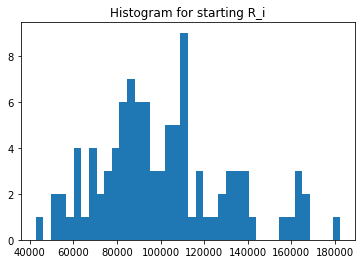

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([234991.00271916, 280900.87719685, 180911.87719685, 180900.87719685,
       264574.0171187 , 164578.0171187 , 281933.48598873, 181932.48598873,
       324580.3506424 , 224592.3506424 , 206416.4790778 , 224580.3506424 ,
       373892.65288638, 225939.27207922, 325940.27207922, 273891.65288638,
       222708.90446659, 237650.84224845, 137657.84224845, 273894.65288638,
       322703.90446659, 222703.90446659, 164573.0171187 , 225955.27207922,
       370589.85676934, 270589.85676934, 236269.02547885, 199125.69608793,
       299126.69608793, 464874.55661147, 270602.85676934, 364894.55661147,
       336257.02547885, 236257.02547885, 199139.69608793, 206402.4790778 ,
       152316.30617868, 164515.97942392, 306403.4790778 , 264515.97942392,
       181940.48598873, 252310.30617868, 152309.30617868, 364874.55661147,
       164520.97942392, 285868.11717852, 185870.11717852, 188311.26802549,
       304433.23240707, 204432.23240707, 179820.76015633, 104919.70147078,
       185867.11717852, 2

In [24]:
experiments.UNI_Si.unique()

array([10000., 15527., 16076., 15496., 14452., 13651., 14425., 17264.,
       14490., 13695., 15021., 12740., 14232., 14844., 16078., 16565.,
       15380., 14891., 15561., 15310., 17939., 13107., 19531., 17160.,
       14823., 15369., 15966., 13642., 15841., 16279., 13714., 18861.,
       14472., 15191., 14500., 13934., 14690., 14729., 15884., 16316.,
       13547., 15806., 15513., 16500., 18079., 14099., 17431., 13828.,
       15938., 14672., 13577., 17048., 13094., 15916., 17694., 14493.,
       15665., 16228., 19445., 14593., 15823., 16164., 14192., 13034.,
       13897., 12994., 14446., 14541., 15815., 14622., 13609., 15509.,
       15811., 14051., 15395., 21702., 13049., 13829., 14255., 15229.,
       15394., 14860., 14991., 13008., 15058., 13219., 16001., 16946.,
       14515., 14853., 18040., 18752., 17372., 16713., 17907., 13840.,
       15678., 15118., 19304.])

In [25]:
experiments.UNI_Qj.unique()

array([126330.07812691, 233252.16996651, 206574.98846482, 169846.10648696,
       151424.95502607, 173015.60755103, 264092.20102653, 166417.74691397,
       135860.52037312, 145009.08008456, 158609.30970373, 122316.11432838,
       141670.10928841, 204500.90842904, 366476.50947373, 120902.33976273,
       148879.41820321, 258216.76280729, 315340.92787112, 133481.04343618,
       483603.23970664, 126885.68213811, 214392.97531279, 258547.82266997,
       291310.35266732, 407207.78853768, 245035.8463788 , 247504.79879941,
       241968.36169322, 145757.26495268, 133862.34756376, 219960.19424527,
       233233.96268078, 233207.10325291, 220239.69298769, 236923.15895959,
       118692.93838739, 216941.02745761, 215325.15490295, 233907.20126638,
       134127.06743443, 305700.71055729, 252163.28119865, 186006.74659839,
       257776.12548476, 130282.6858949 , 212352.62028627, 217603.25257227,
       215660.46618058, 141275.7031774 , 151935.21055775, 330767.26002767,
       148395.17811222, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 63165.03906345, 116626.08498325, 103287.49423241,  84923.05324348,
        75712.47751304,  86507.80377551, 132046.10051326,  83208.87345698,
        67930.26018656,  72504.54004228,  79304.65485187,  61158.05716419,
        70835.0546442 , 102250.45421452, 183238.25473686,  60451.16988137,
        74439.70910161, 129108.38140364, 157670.46393556,  66740.52171809,
       241801.61985332,  63442.84106905, 107196.4876564 , 129273.91133498,
       145655.17633366, 203603.89426884, 122517.9231894 , 123752.39939971,
       120984.18084661,  72878.63247634,  66931.17378188, 109980.09712264,
       116616.98134039, 116603.55162645, 110119.84649385, 118461.57947979,
        59346.46919369, 108470.5137288 , 107662.57745148, 116953.60063319,
        67063.53371722, 152850.35527864, 126081.64059932,  93003.37329919,
       128888.06274238,  65141.34294745, 106176.31014314, 108801.62628614,
       107830.23309029,  70637.8515887 ,  75967.60527887, 165383.63001383,
        74197.58905611,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 63165.03906345,  84923.05324348, 116626.08498325,  75712.47751304,
       132046.10051326,  83208.87345698,  67930.26018656, 103287.49423241,
        79304.65485187,  70835.0546442 ,  86507.80377551,  60451.16988137,
       183238.25473686, 102250.45421452, 157670.46393556,  66740.52171809,
        74439.70910161, 129108.38140364,  63442.84106905, 129273.91133498,
       145655.17633366, 203603.89426884, 123752.39939971,  72504.54004228,
       122517.9231894 , 120984.18084661,  72878.63247634,  61158.05716419,
       107196.4876564 , 110119.84649385, 116603.55162645,  59346.46919369,
       108470.5137288 , 107662.57745148, 152850.35527864, 128888.06274238,
       126081.64059932,  65141.34294745,  66931.17378188,  93003.37329919,
       106176.31014314, 118461.57947979, 108801.62628614, 107830.23309029,
       165383.63001383,  75967.60527887,  77550.68873137,  74197.58905611,
       109980.09712264,  70637.8515887 , 116953.60063319, 111902.14637153,
       130220.87599479,  

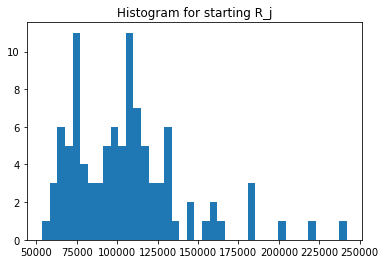

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([117495.50135958,  94553.43859842,  95403.43859842, ...,
       109067.75954931,  74140.30268655,  91320.15450814])

In [31]:
experiments.UNI_ji.unique()

array([ 63165.03906345, 111827.08498325, 110827.08498325, ...,
       110505.5137288 ,  84159.84649385,  70322.39540919])

In [32]:
experiments.UNI_Sij.unique()

array([7.42160793e+09, 1.05488805e+10, 8.49916728e+09, 7.72513110e+09,
       8.50176737e+09, 8.92771258e+09, 1.80831624e+10, 9.40007615e+09,
       7.56416709e+09, 4.99011925e+09, 1.07295176e+10, 7.22451033e+09,
       7.05253978e+09, 1.86542946e+10, 1.39544457e+10, 4.97259171e+09,
       6.91794707e+09, 1.21557651e+10, 1.61164625e+10, 6.00066567e+09,
       1.26845142e+10, 3.99519024e+09, 8.53518455e+09, 2.08027983e+10,
       1.01710811e+10, 2.11068155e+10, 1.14086098e+10, 1.69853748e+10,
       1.01388235e+10, 6.23808888e+09, 5.76358509e+09, 1.53692597e+10,
       8.27289416e+09, 1.56947713e+10, 6.21343555e+09, 1.32439339e+10,
       5.71599811e+09, 1.20502887e+10, 1.36825039e+10, 9.88447537e+09,
       7.14887563e+09, 1.61593560e+10, 1.07132126e+10, 7.15362651e+09,
       1.02032156e+10, 9.18074756e+09, 9.62900423e+09, 6.73301830e+09,
       1.31512752e+10, 1.14123361e+10, 6.39659321e+09, 1.11273451e+10,
       9.69042959e+09, 8.29906042e+09, 9.87537959e+09, 8.46150685e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


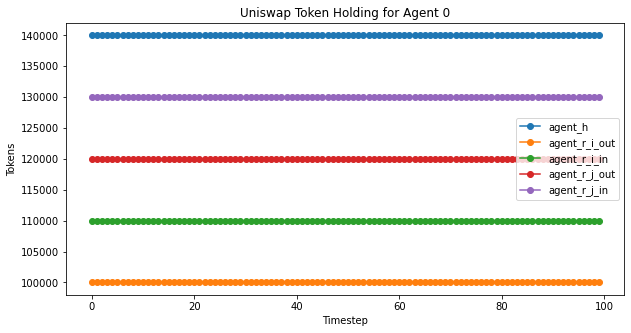

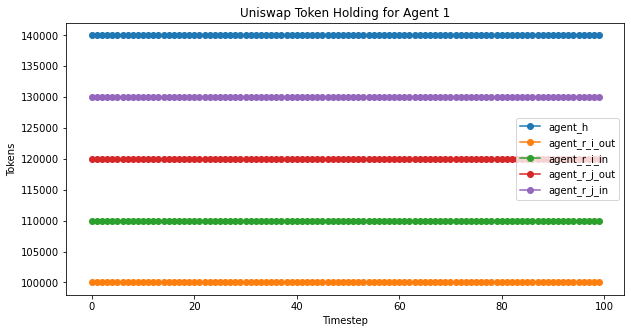

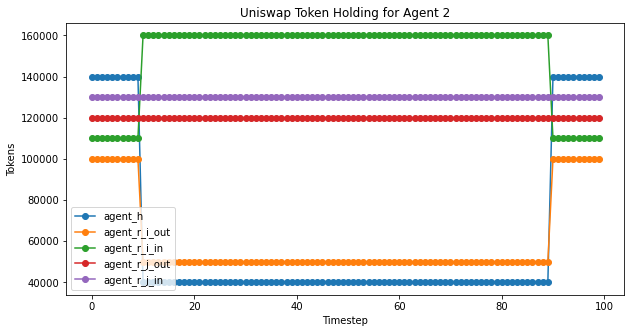

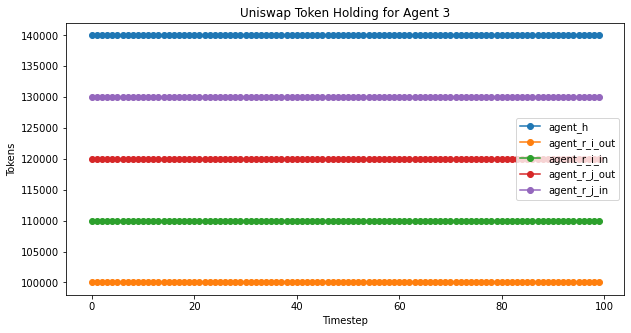

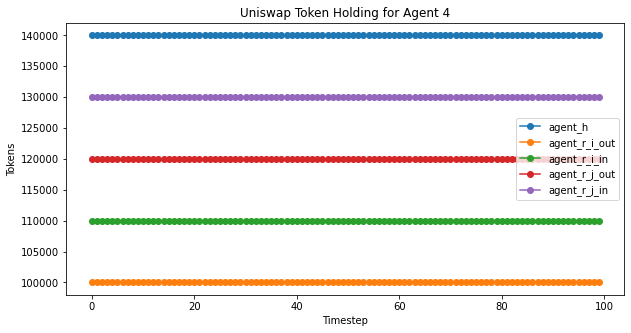

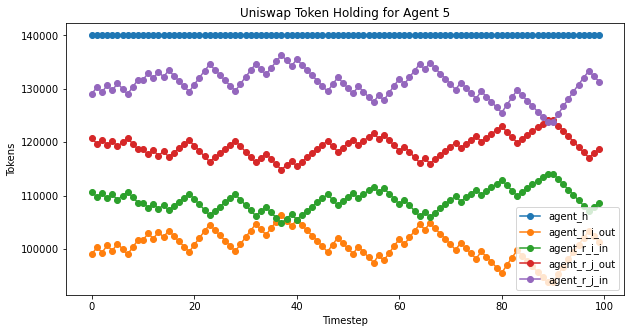

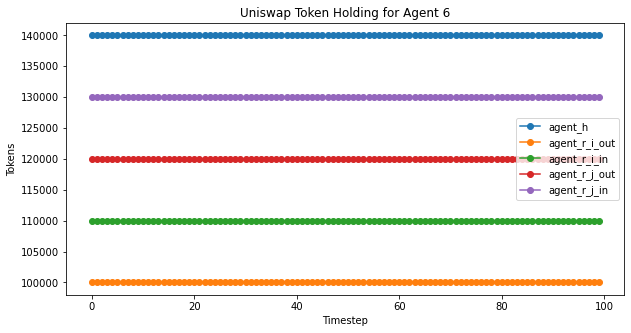

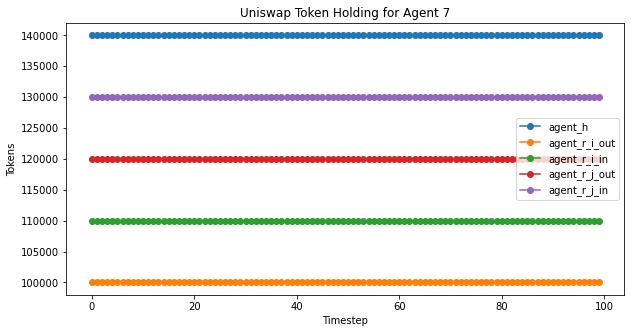

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


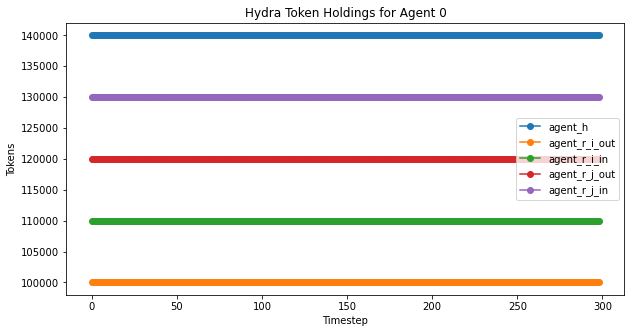

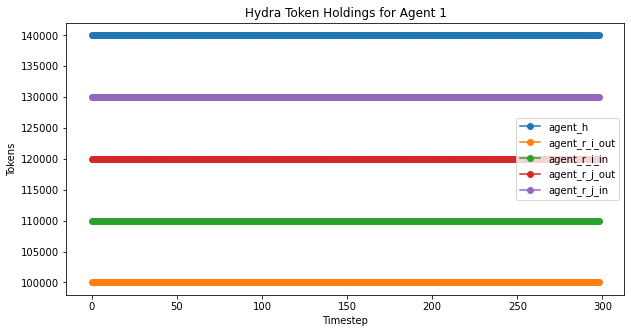

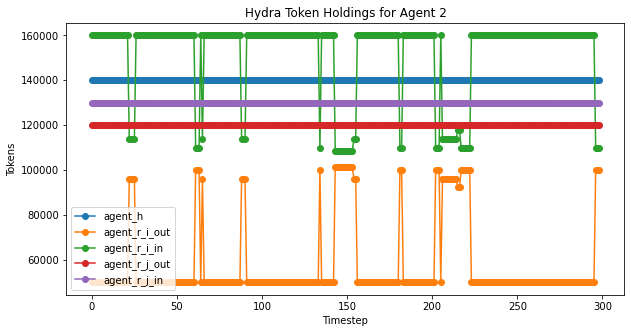

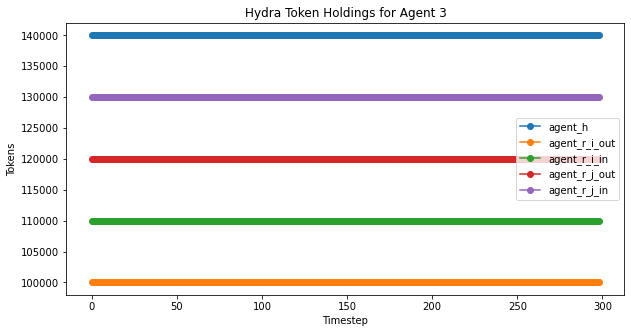

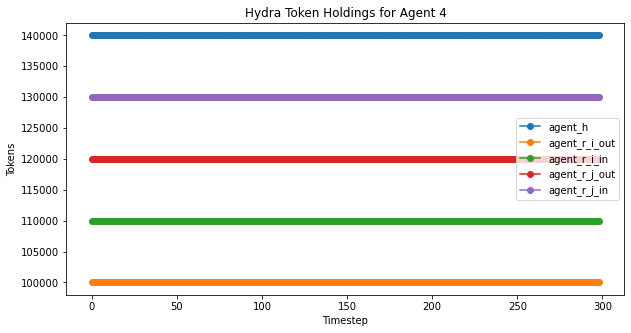

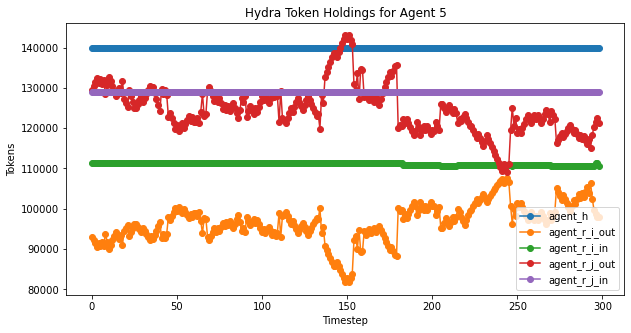

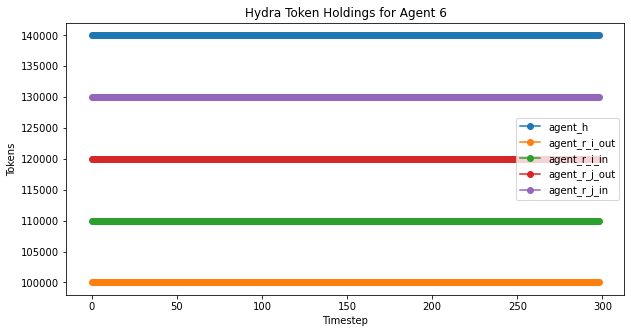

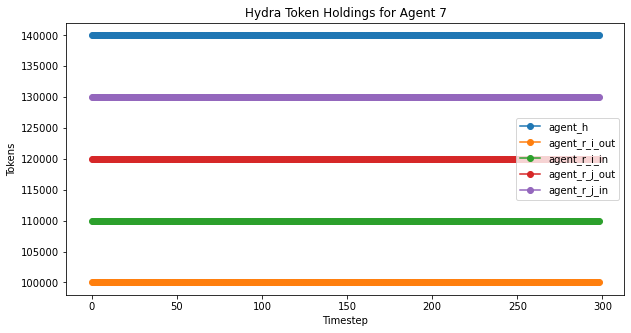

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

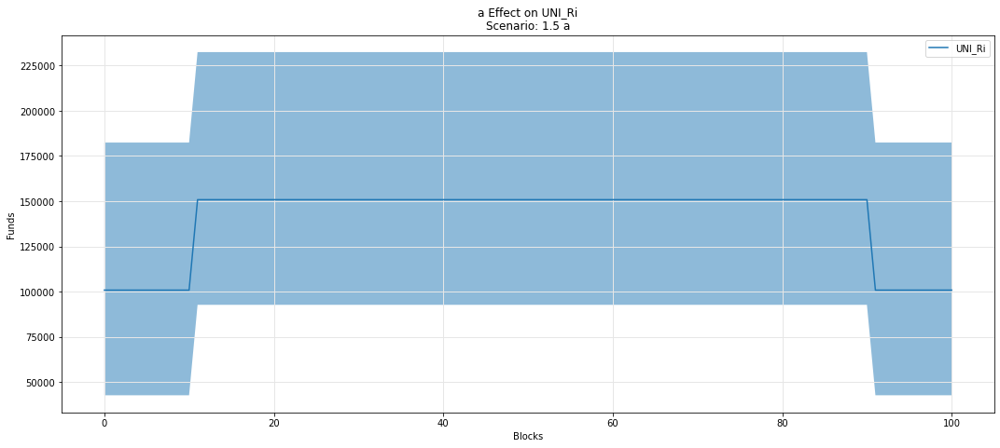

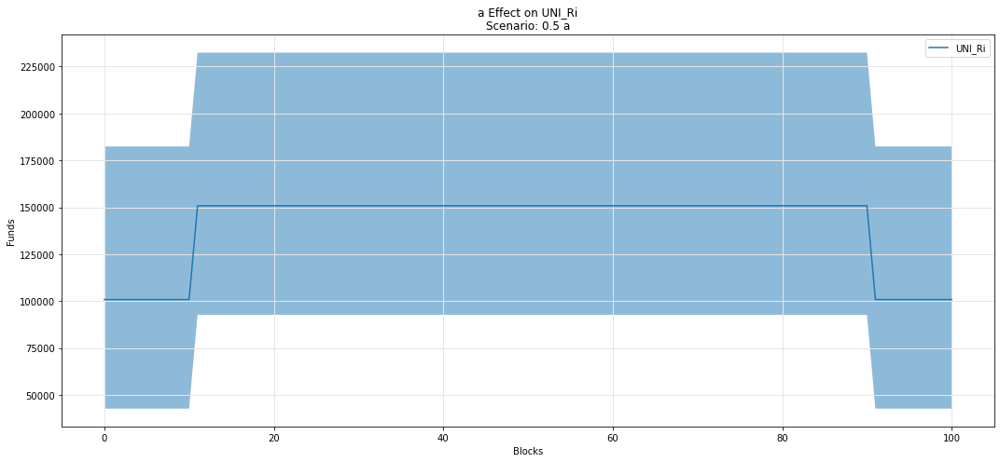

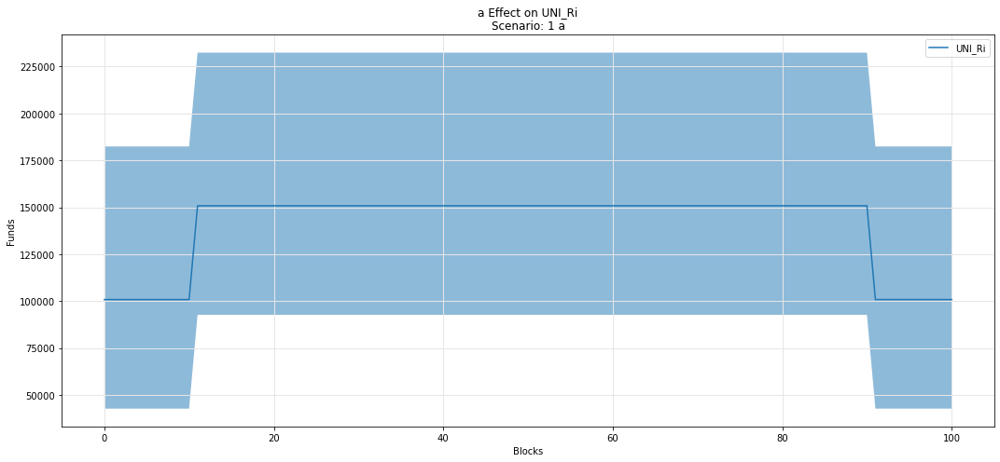

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

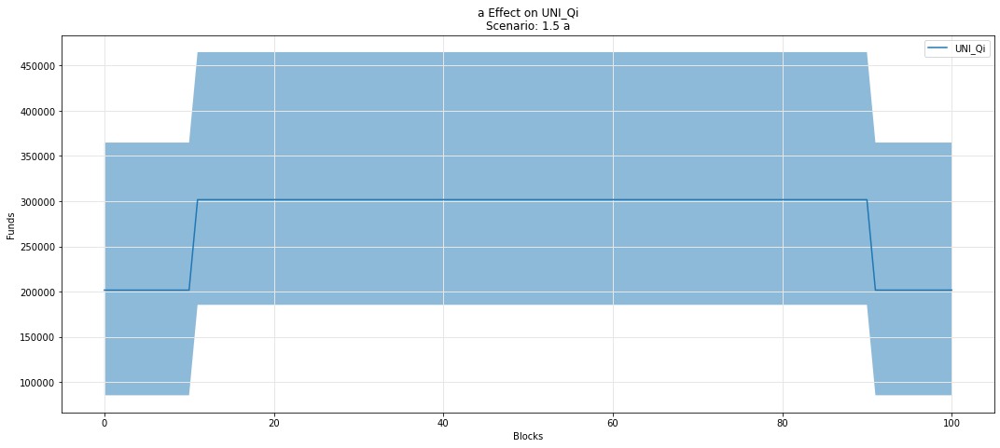

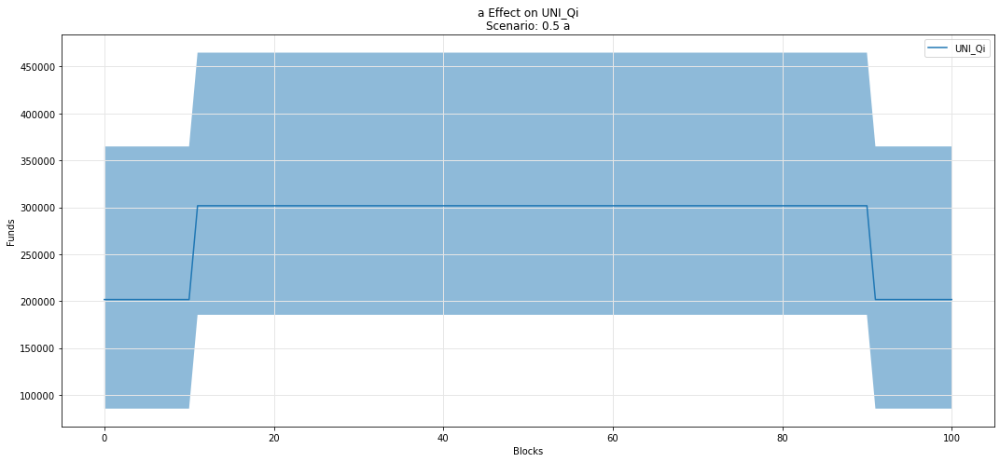

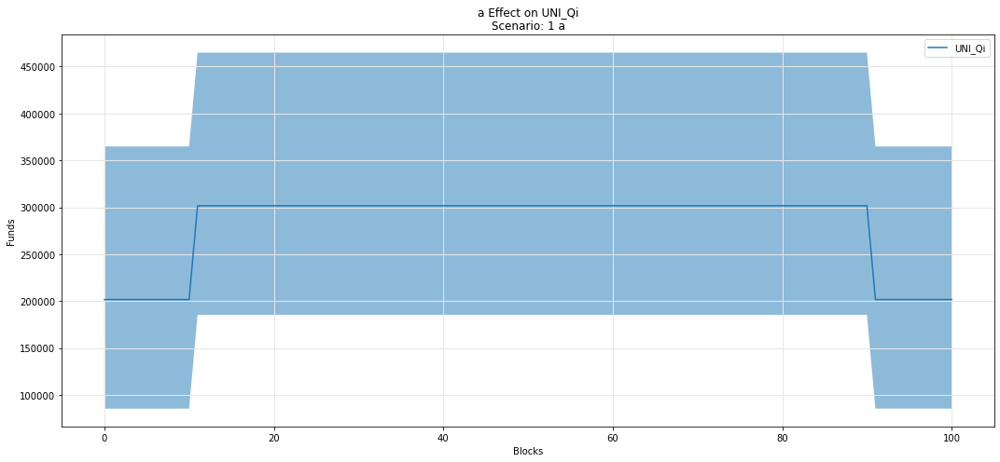

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

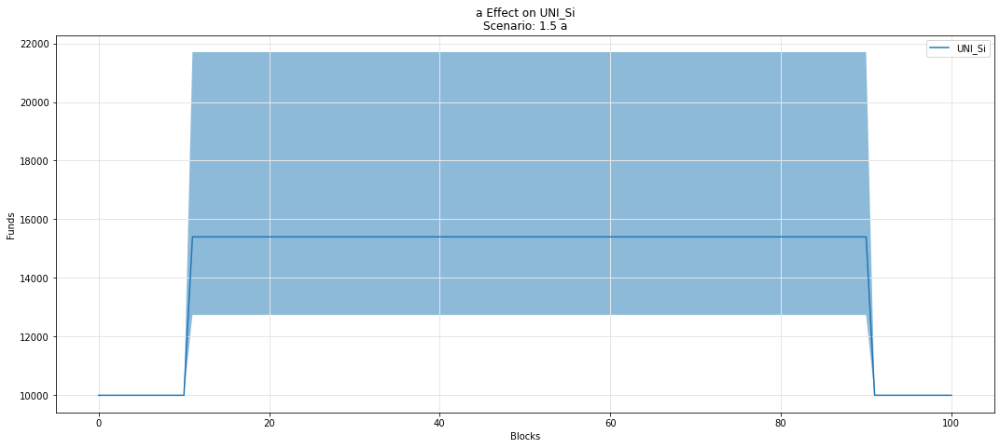

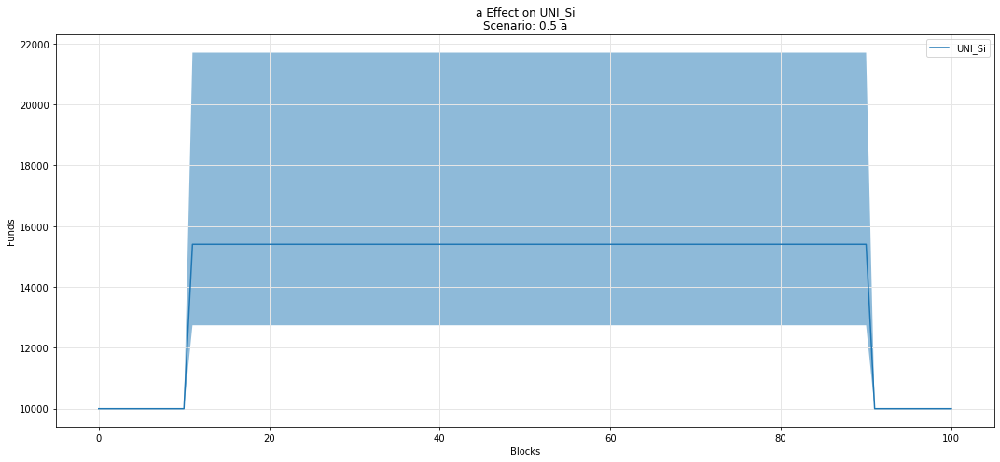

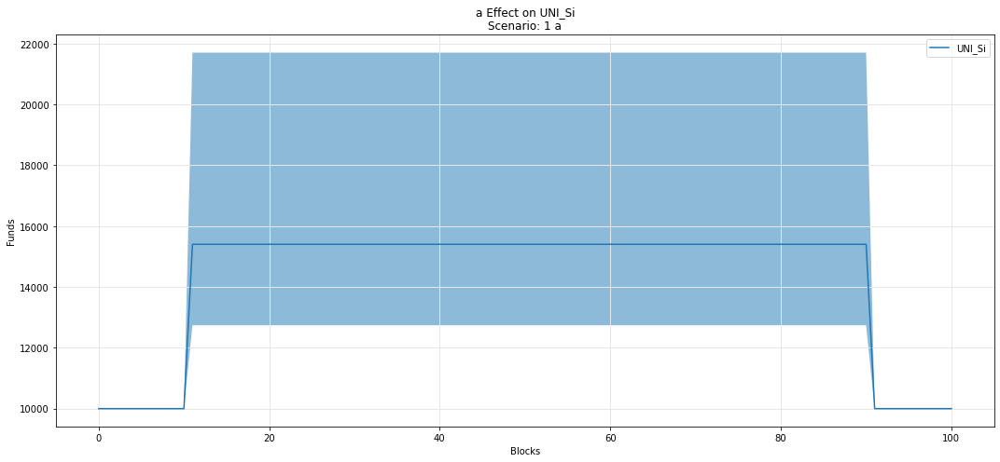

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

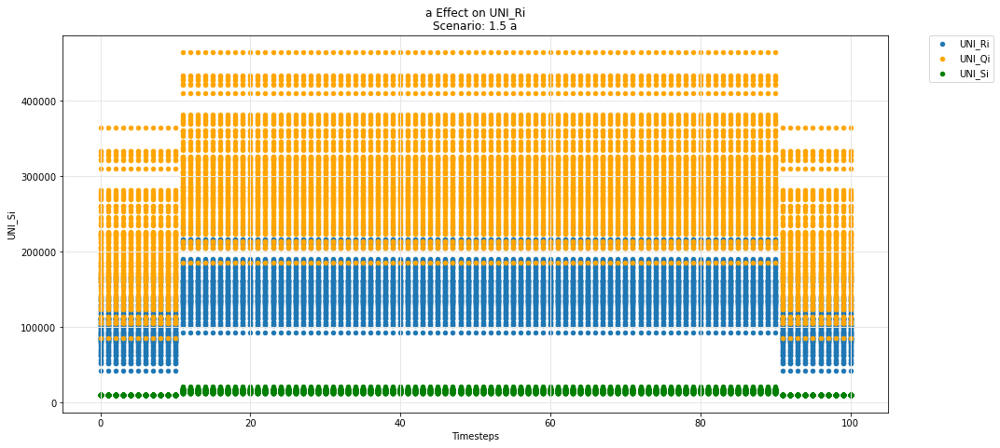

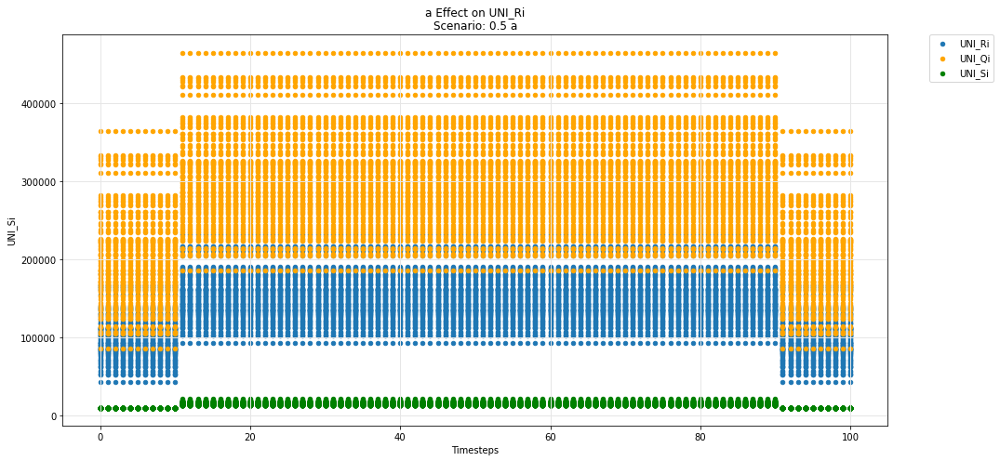

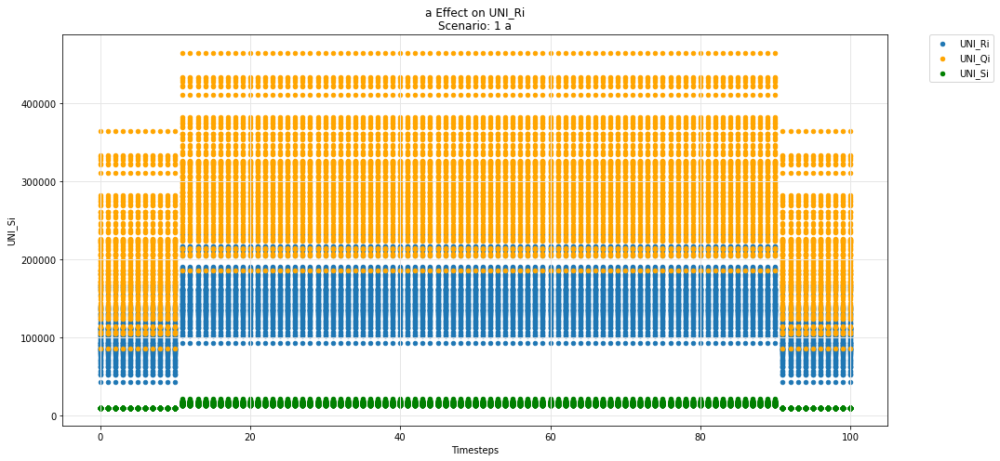

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

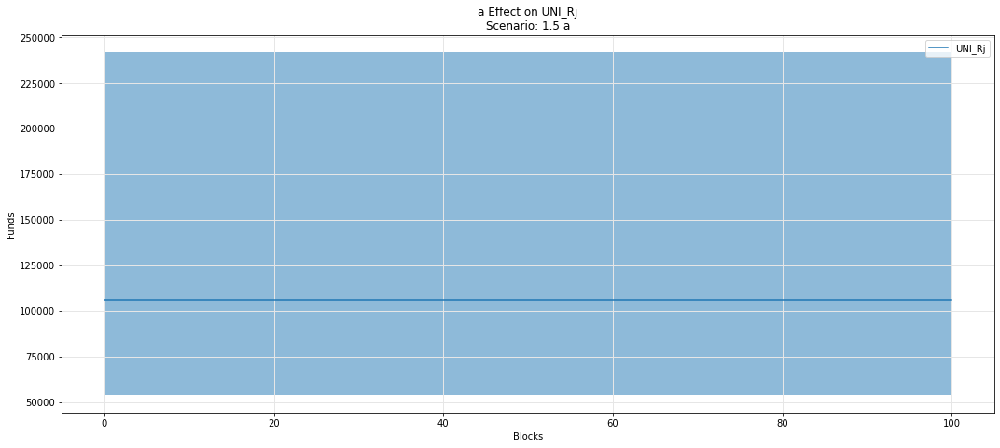

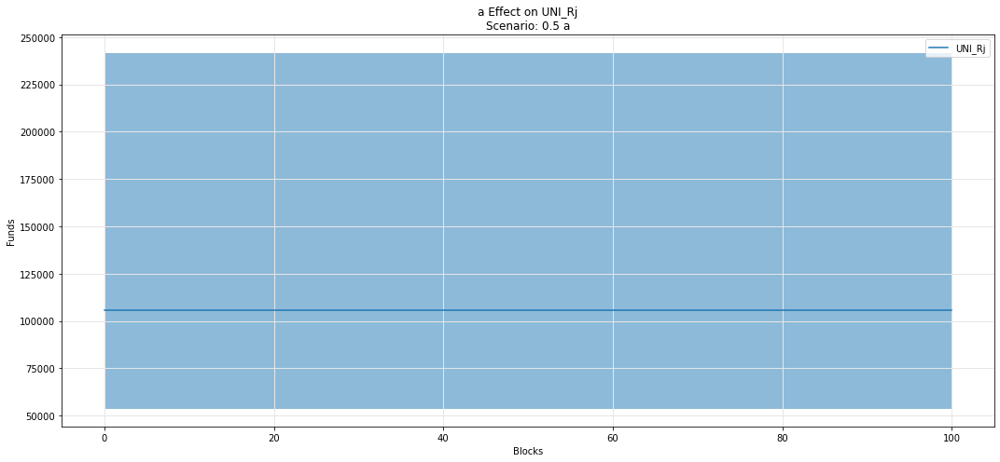

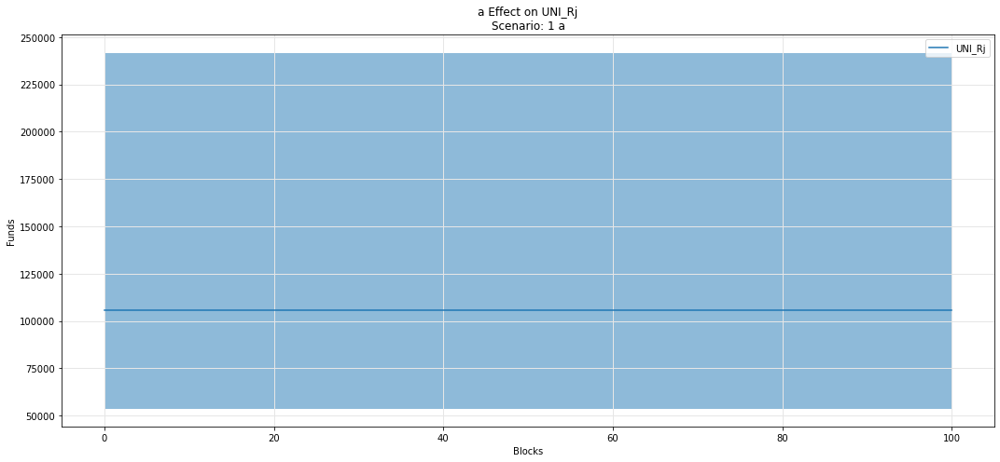

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

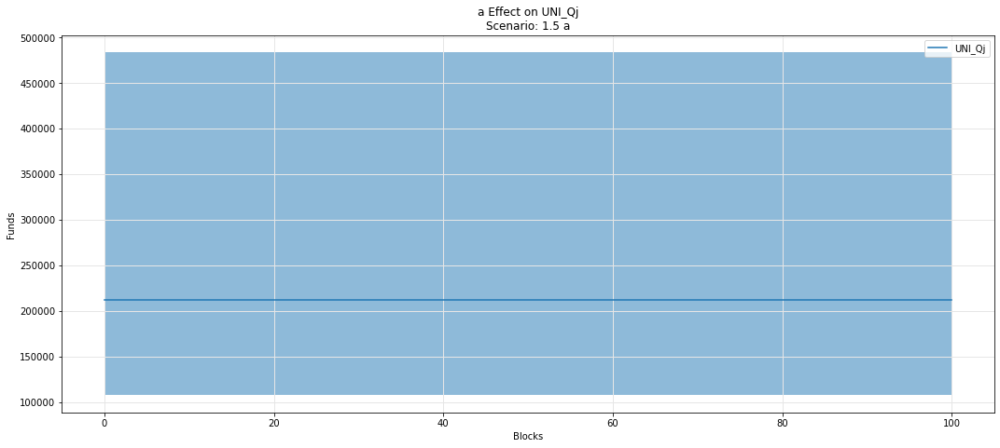

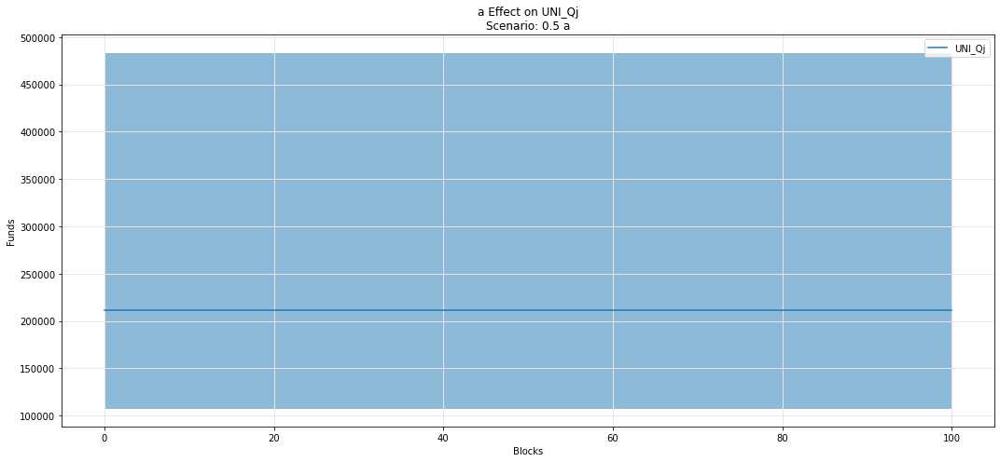

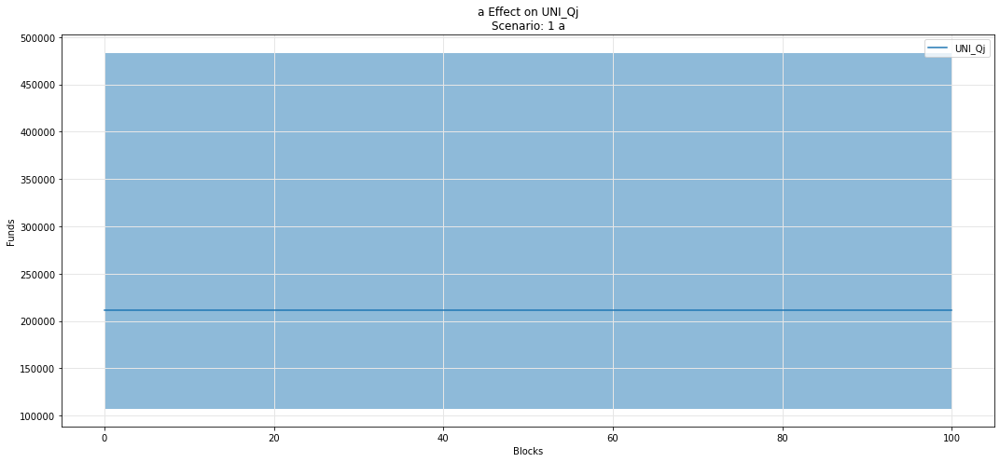

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

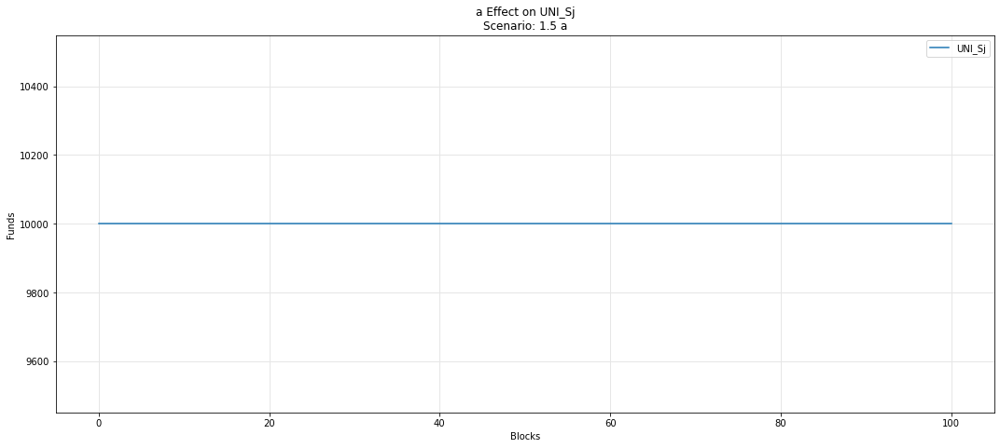

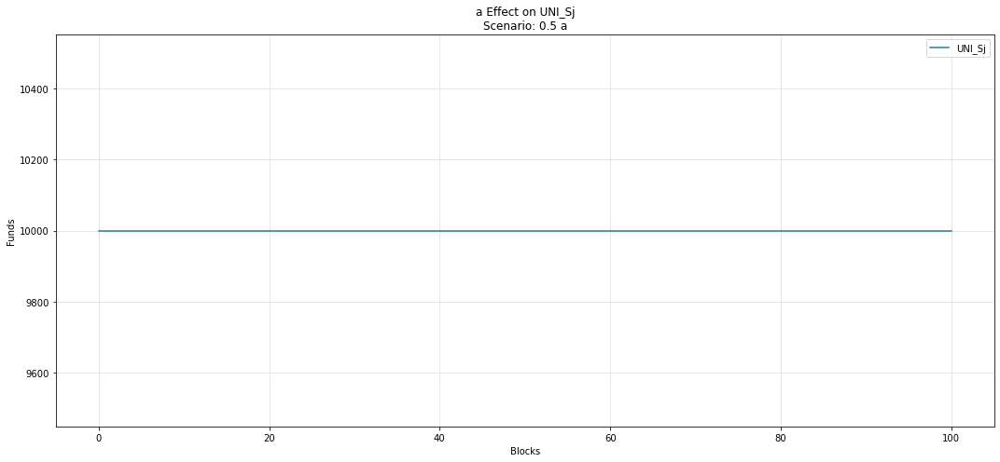

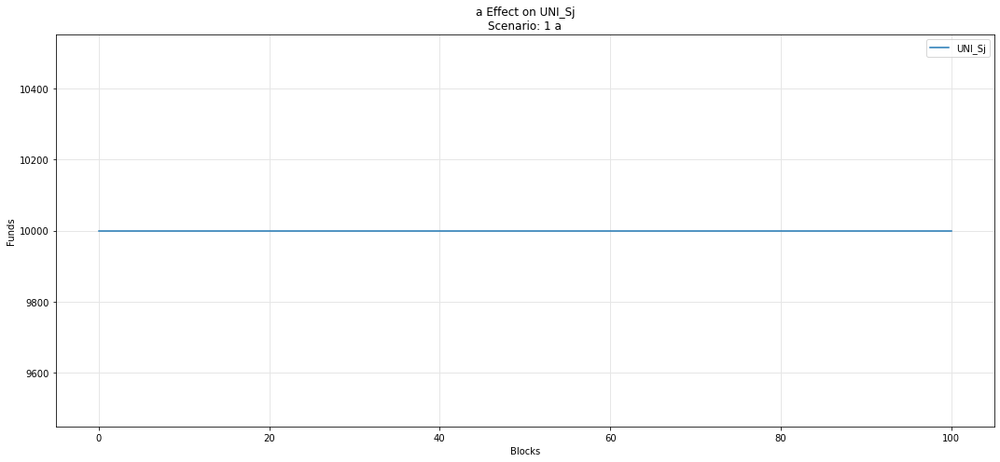

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

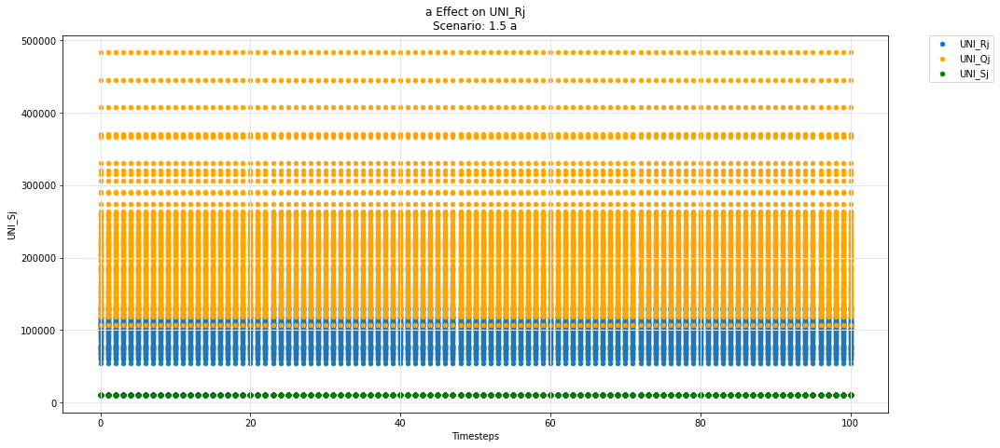

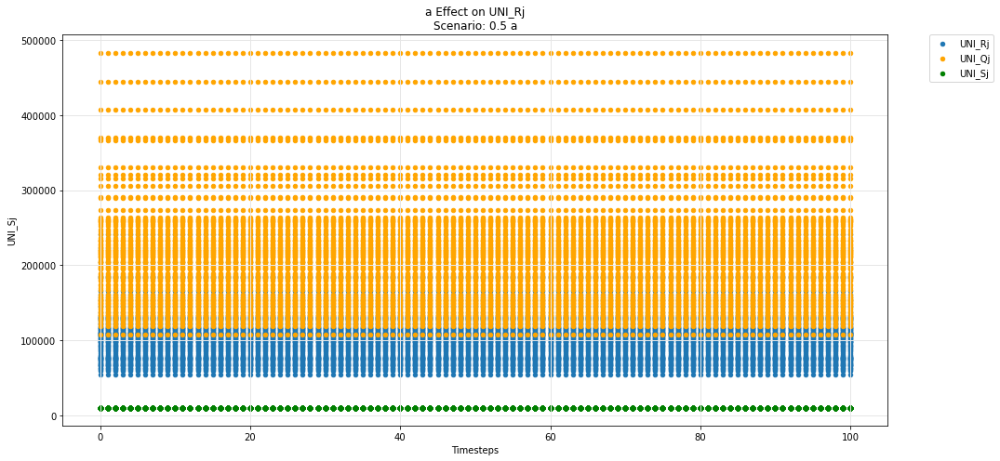

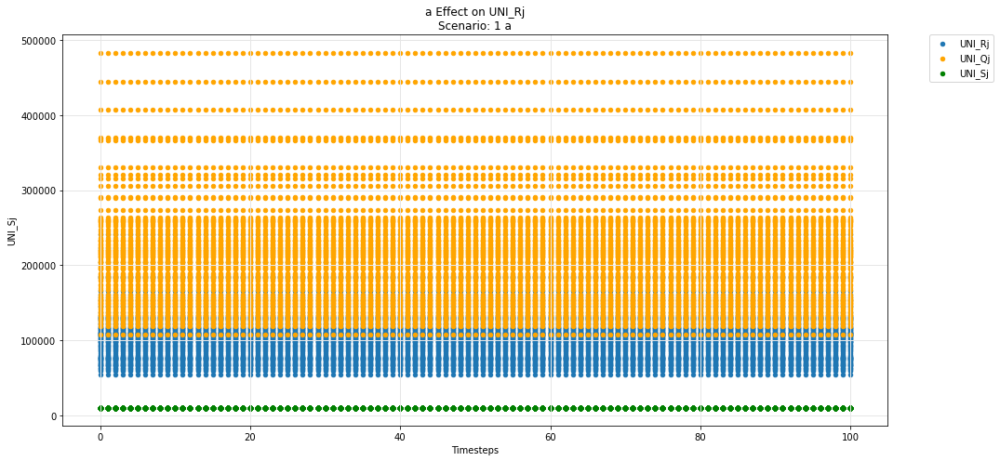

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

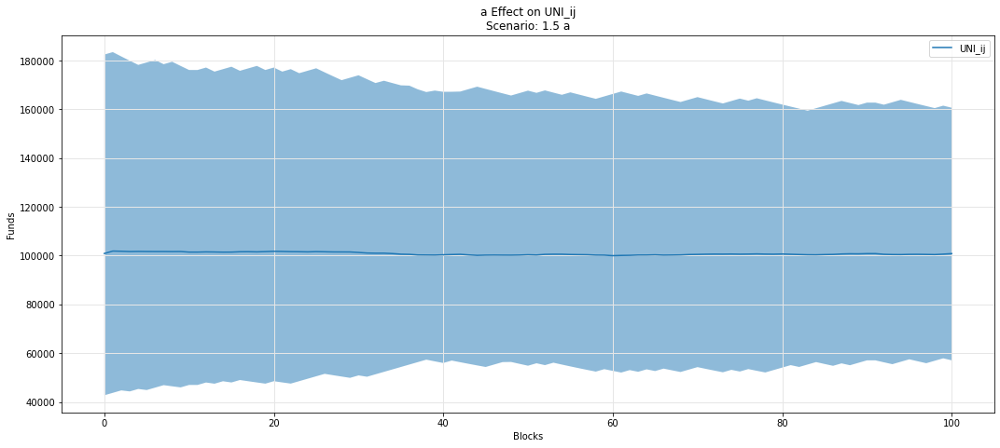

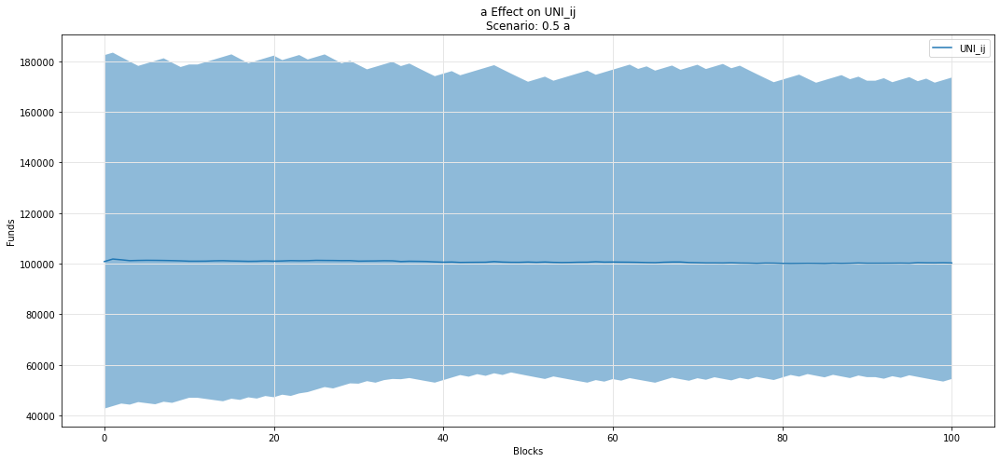

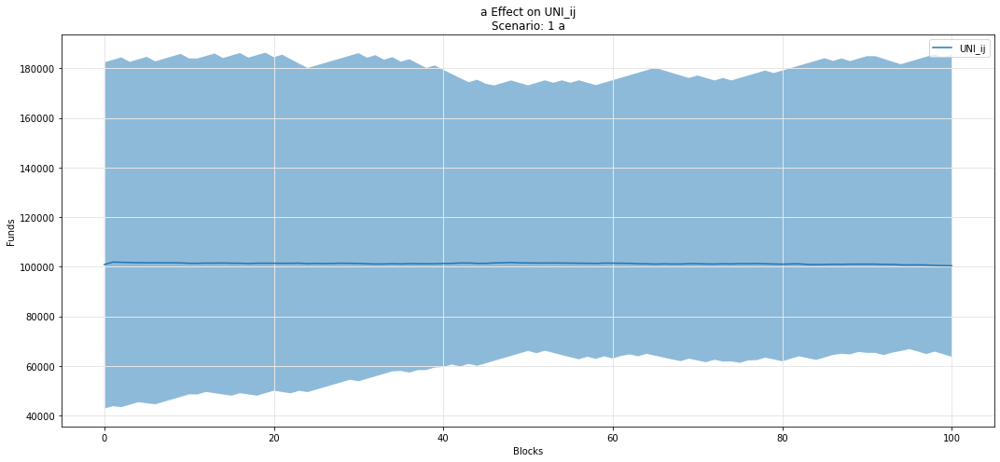

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

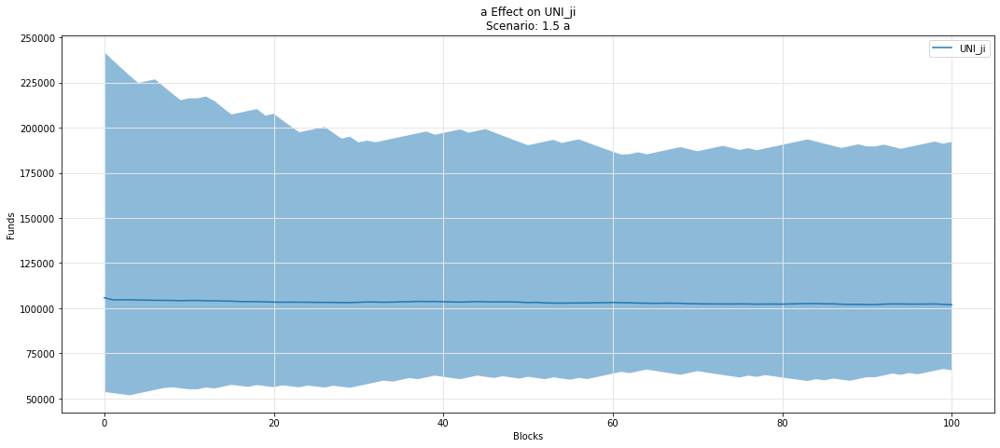

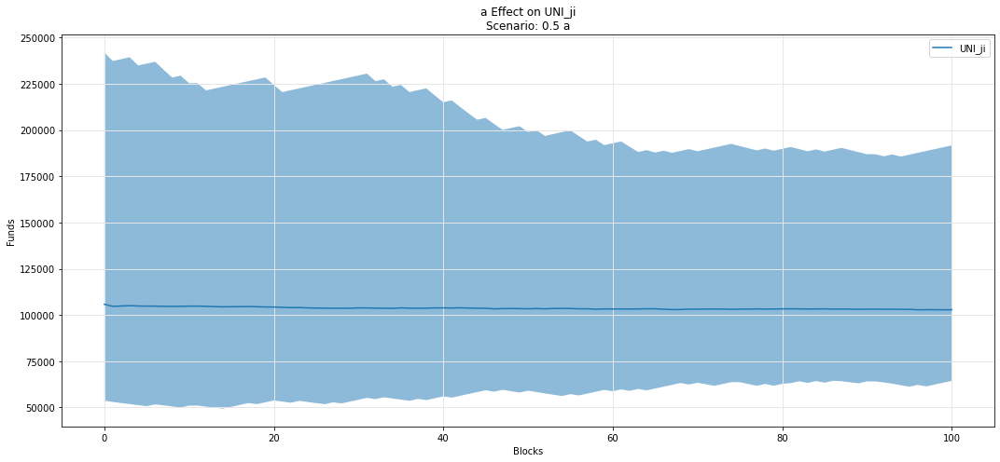

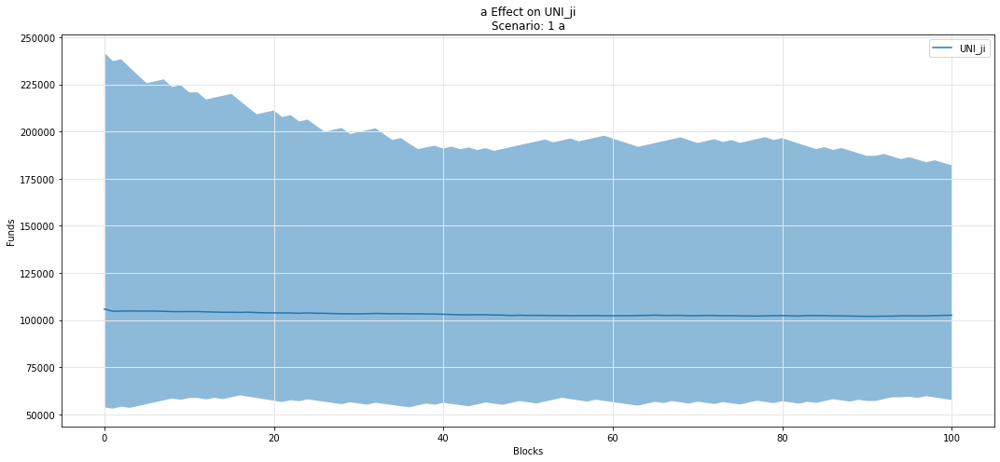

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

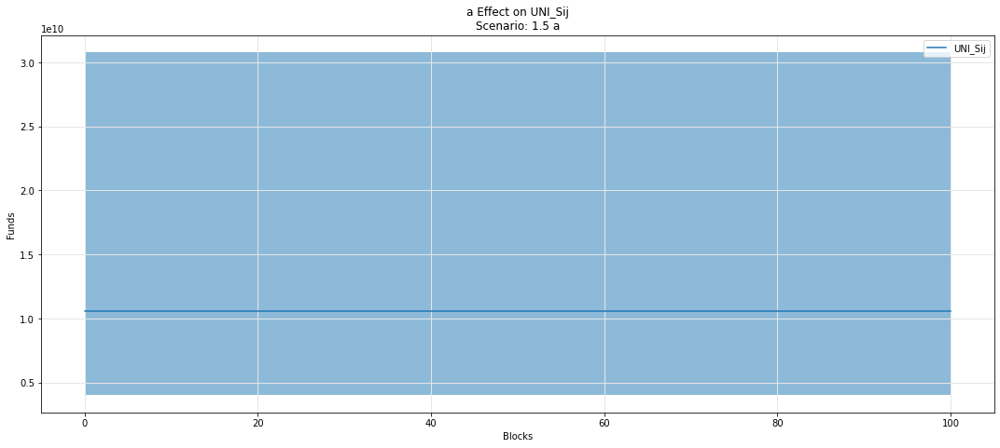

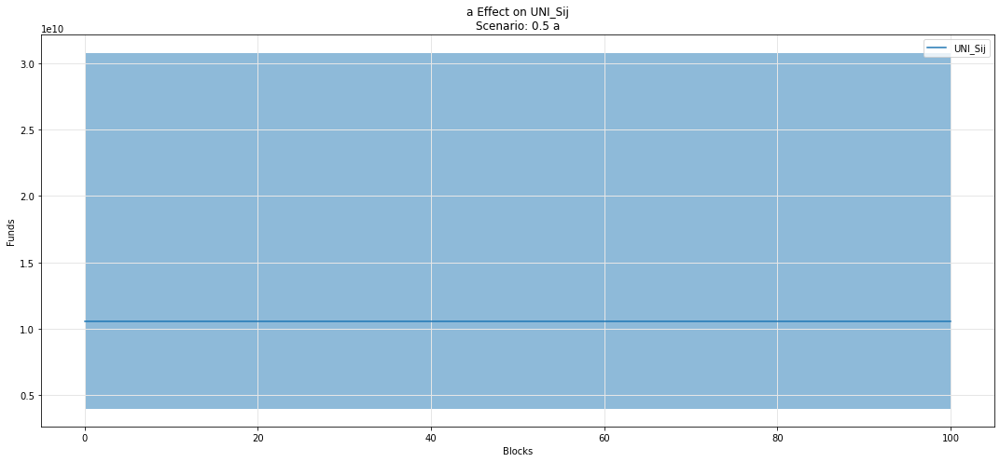

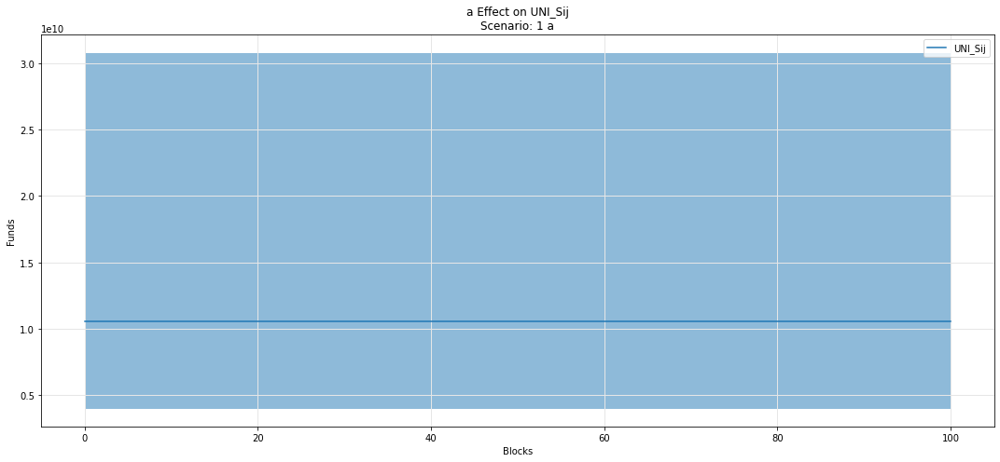

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

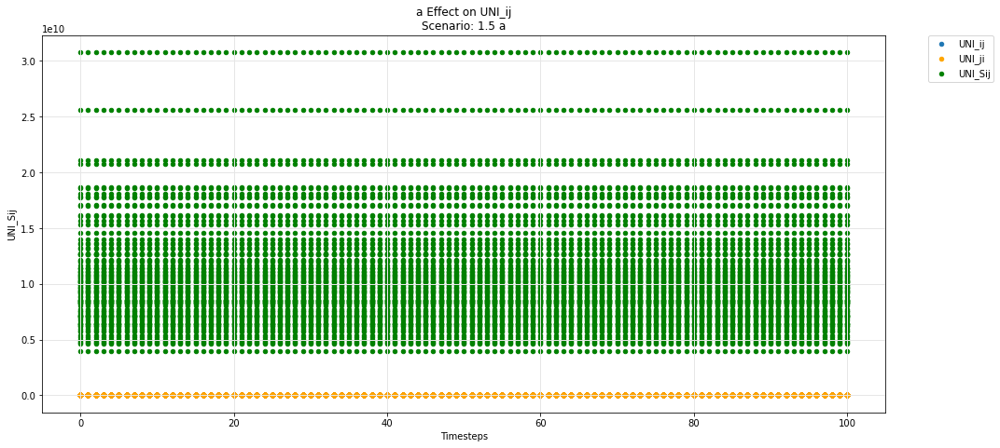

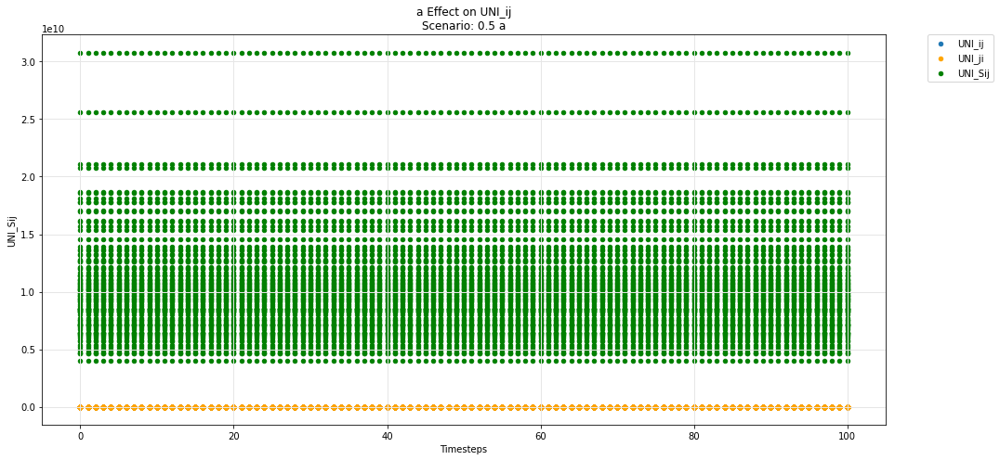

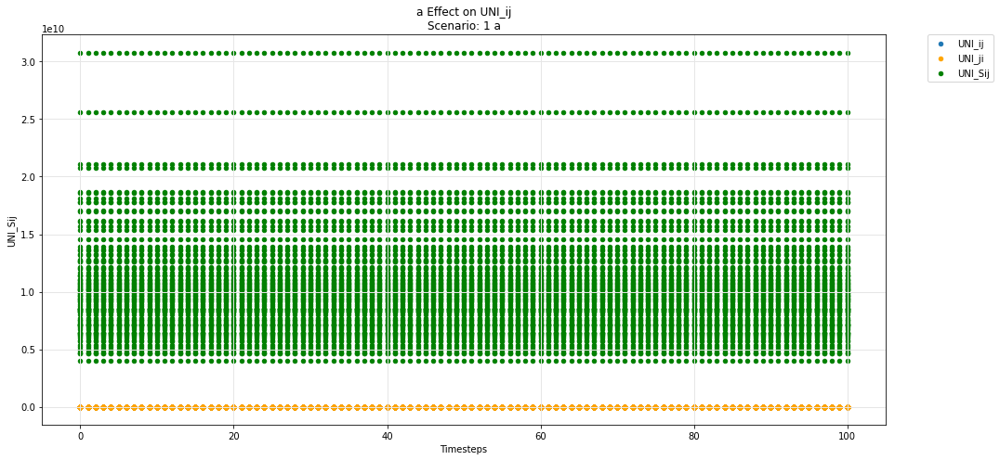

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

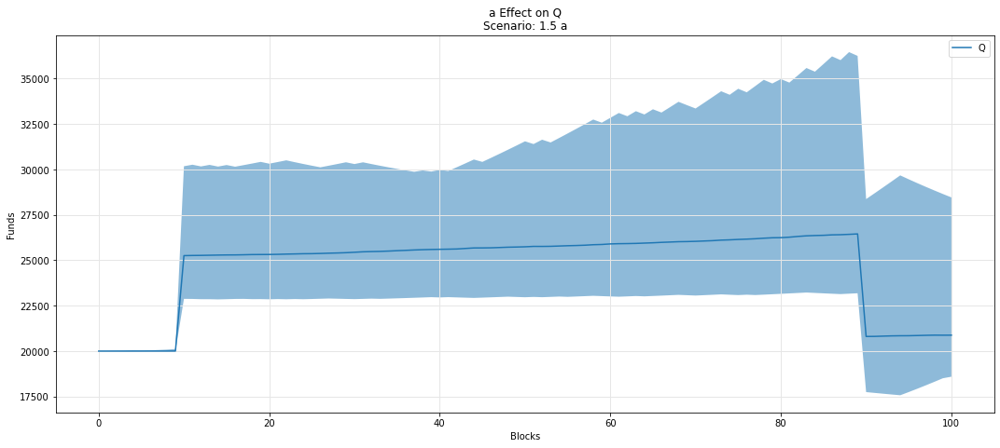

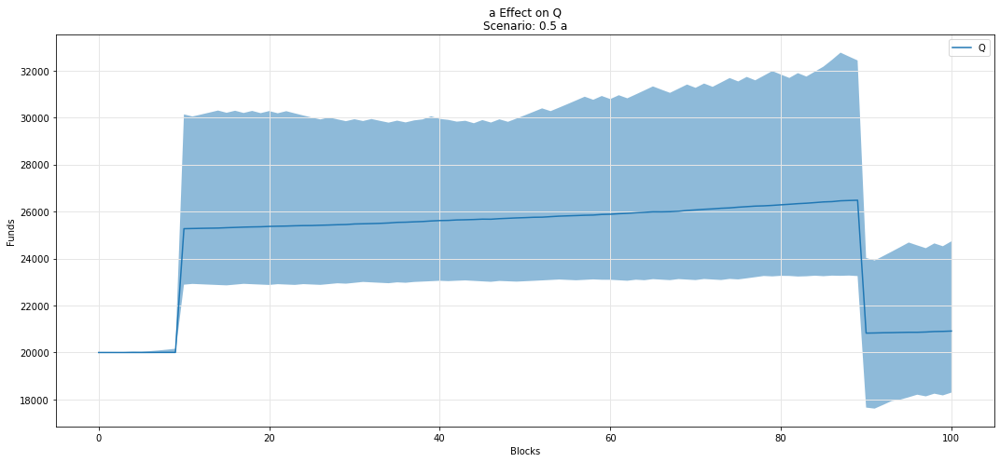

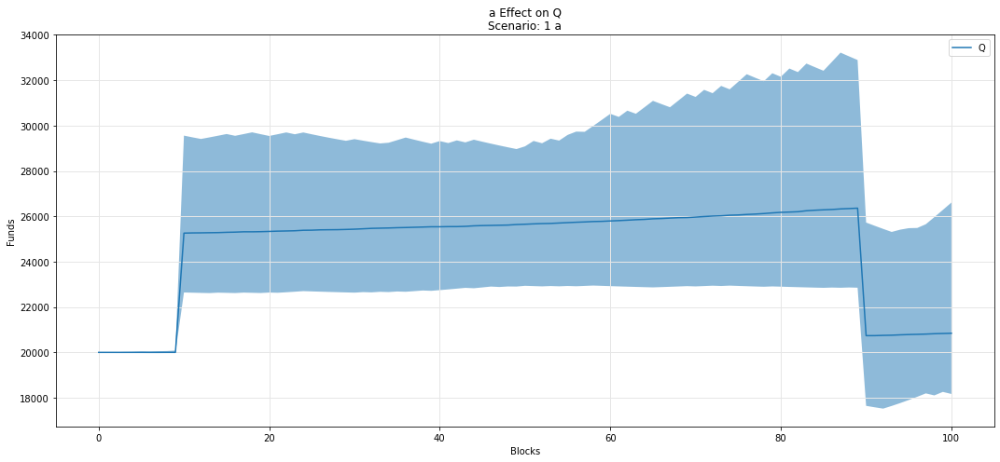

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

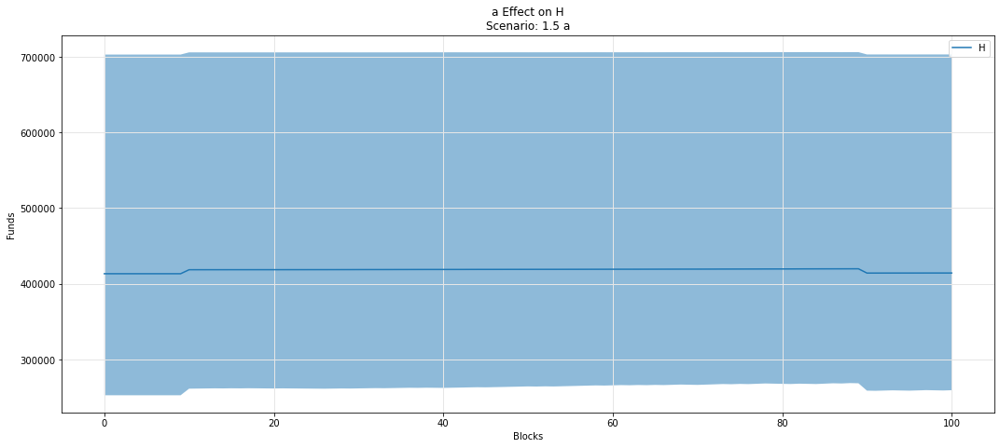

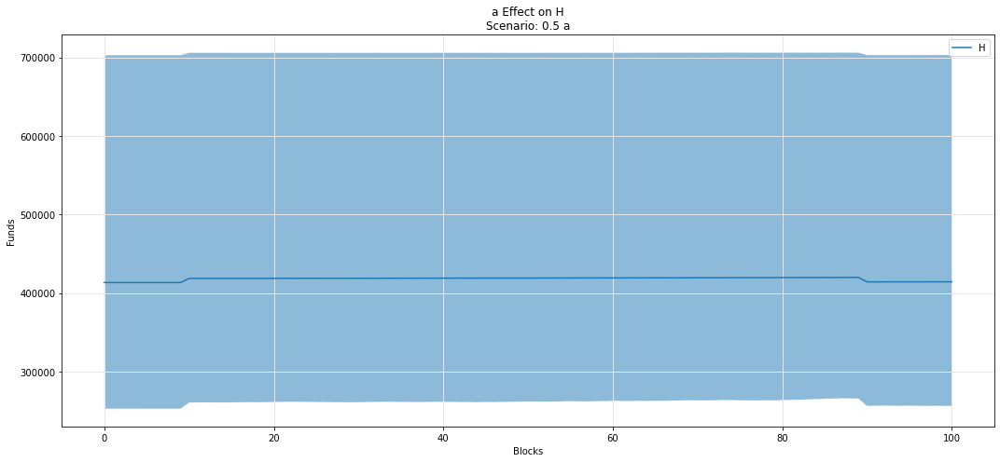

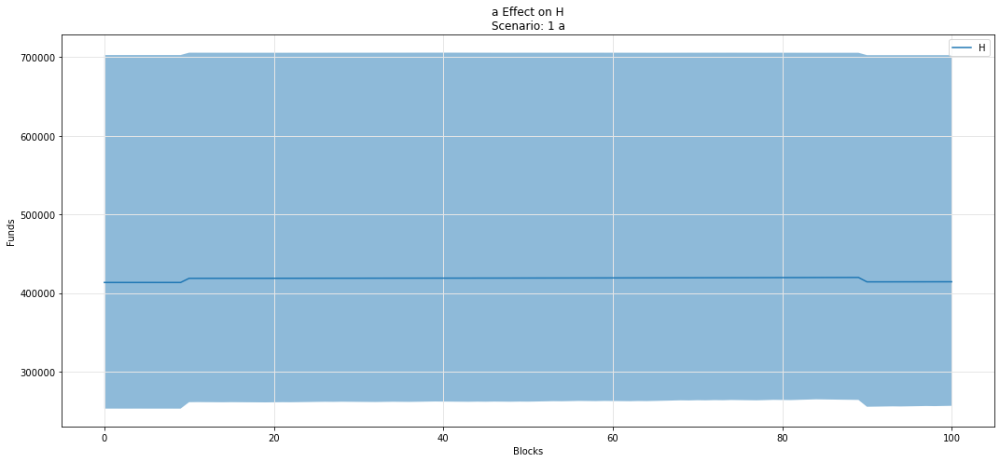

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

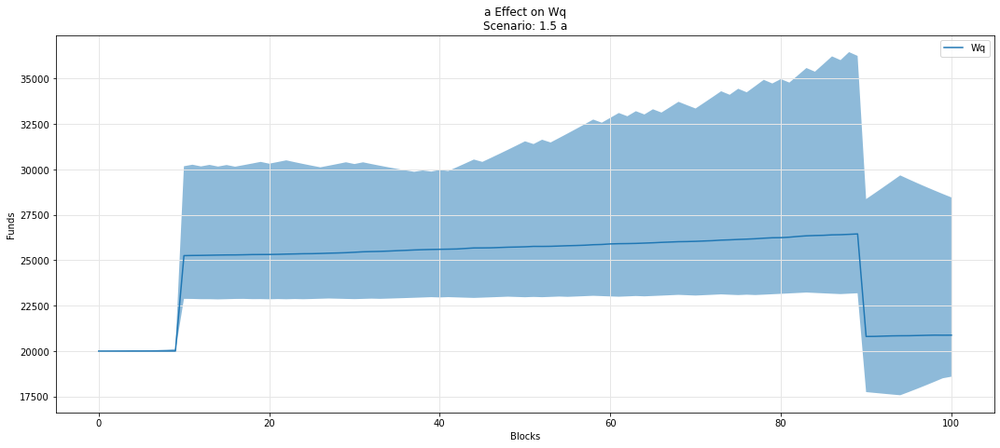

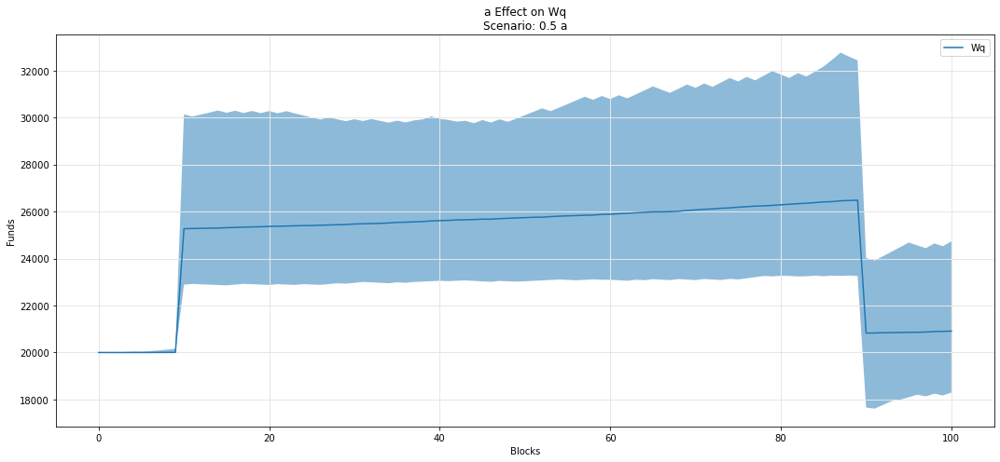

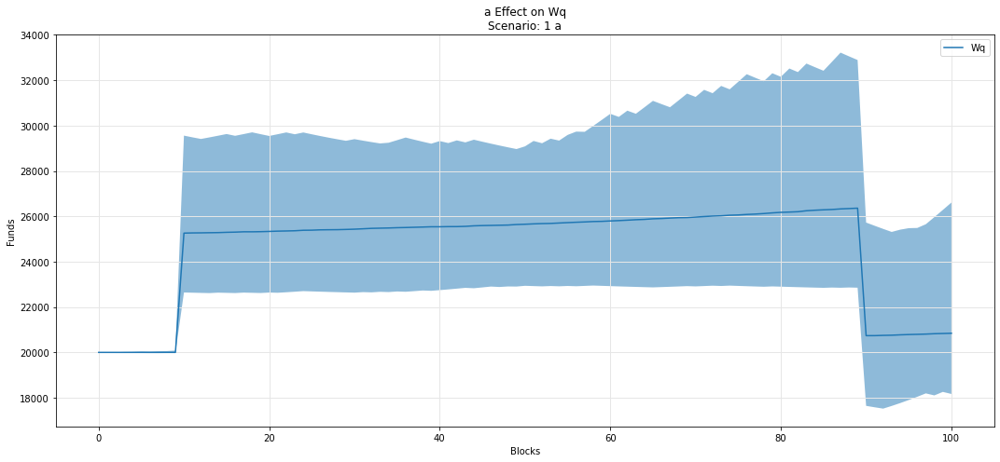

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

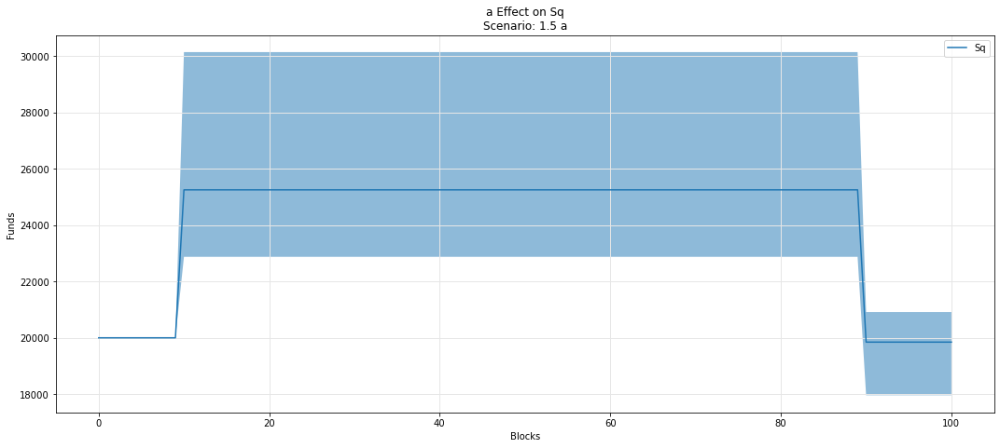

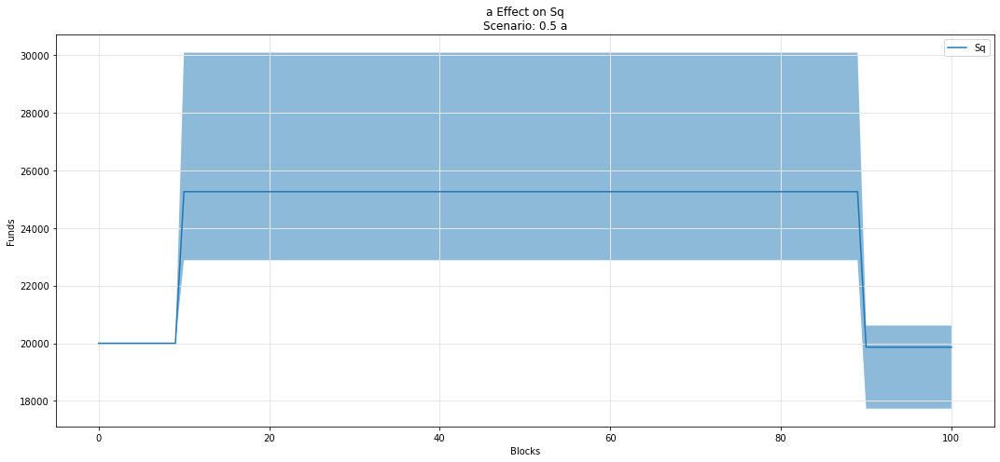

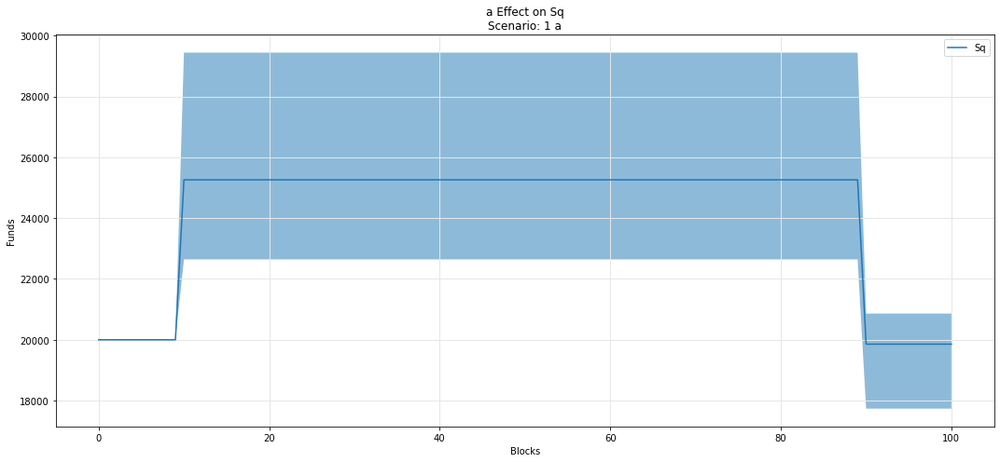

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

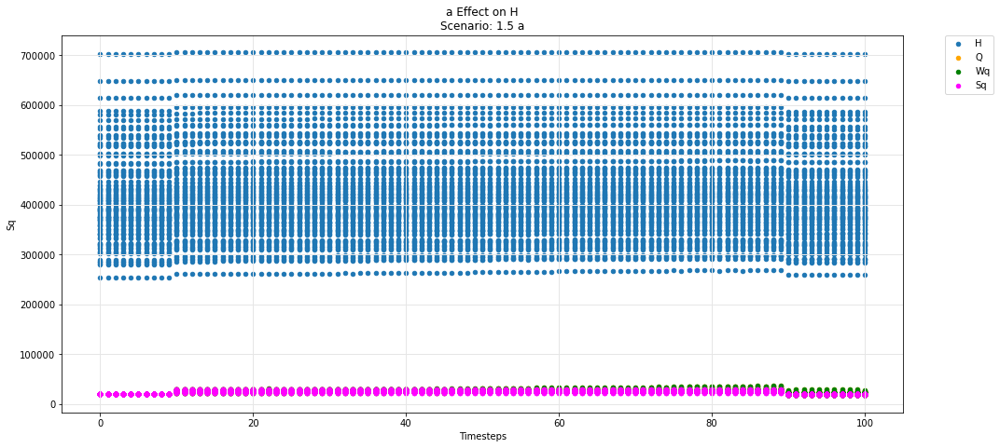

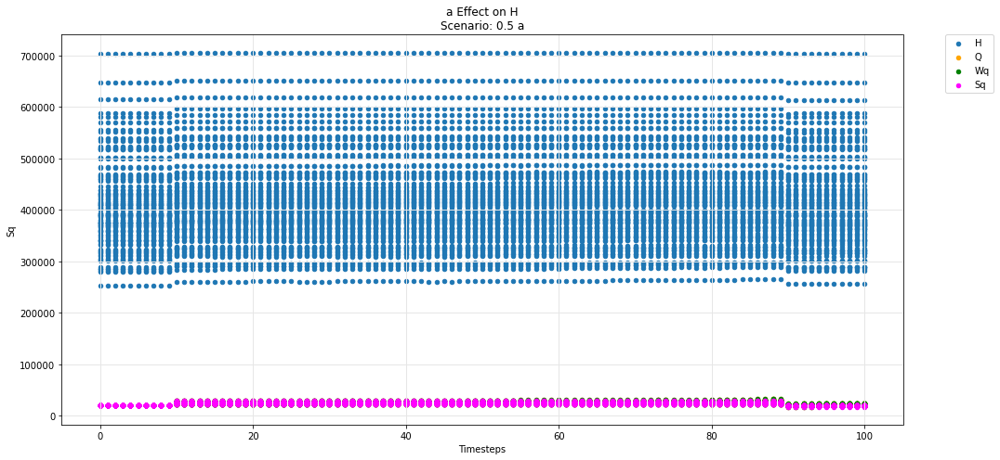

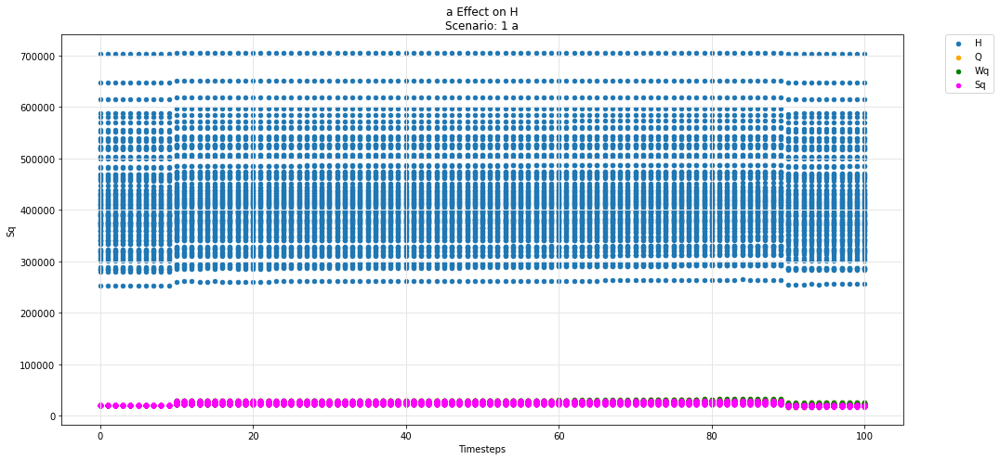

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

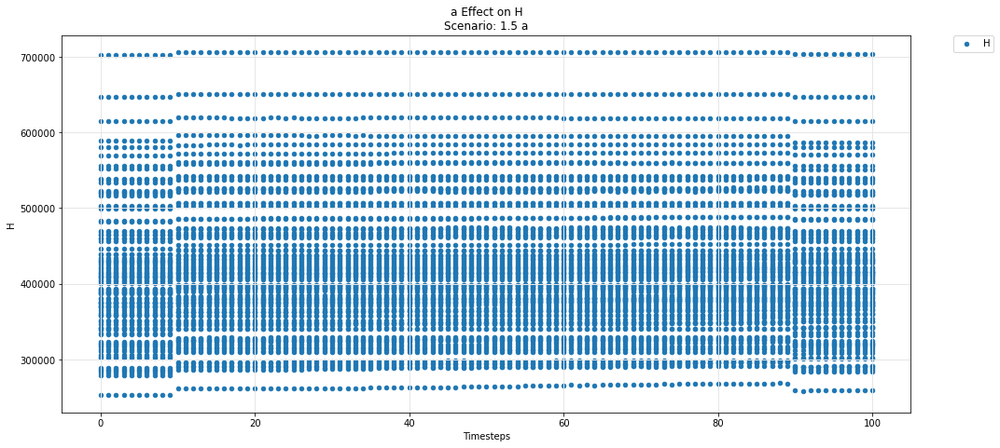

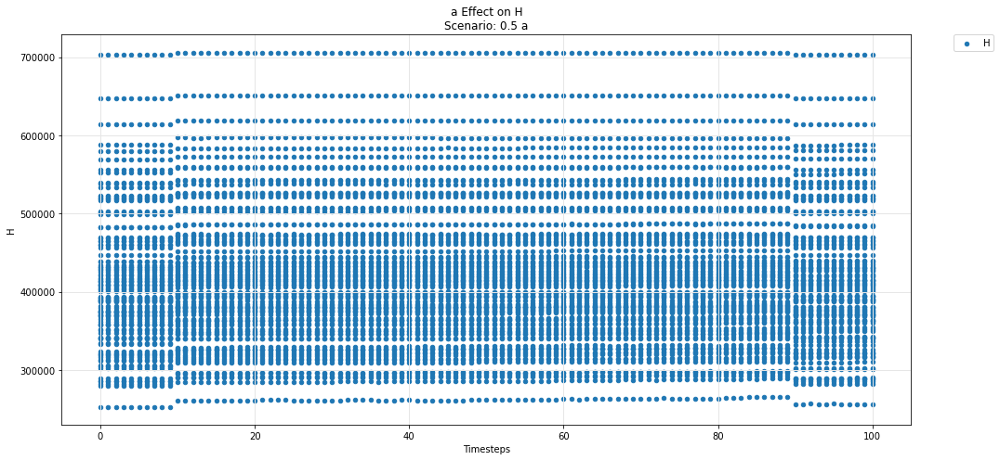

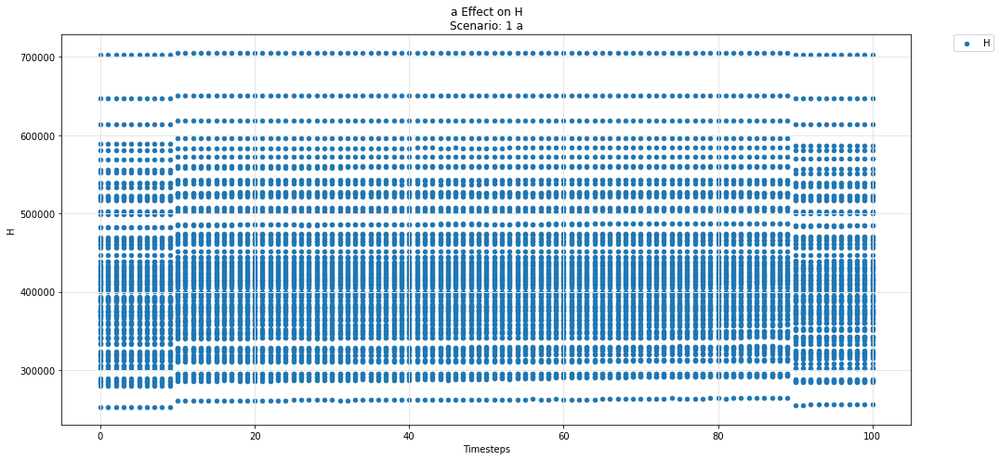

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

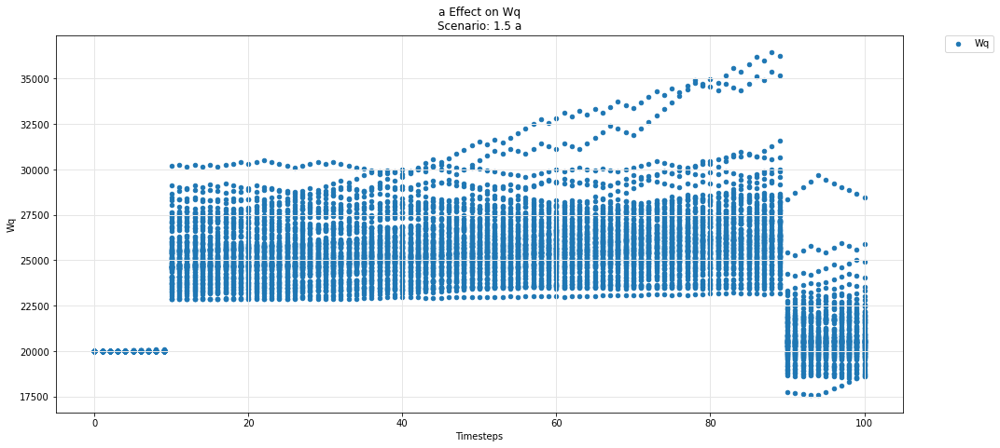

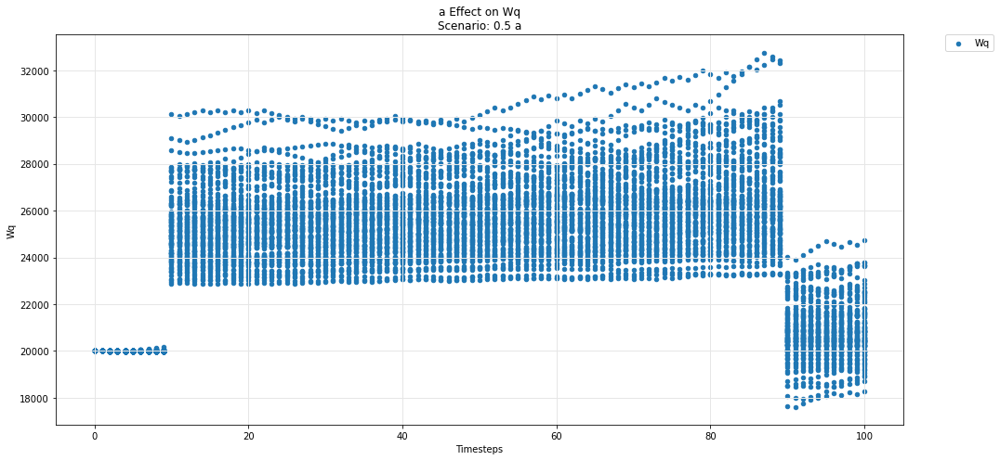

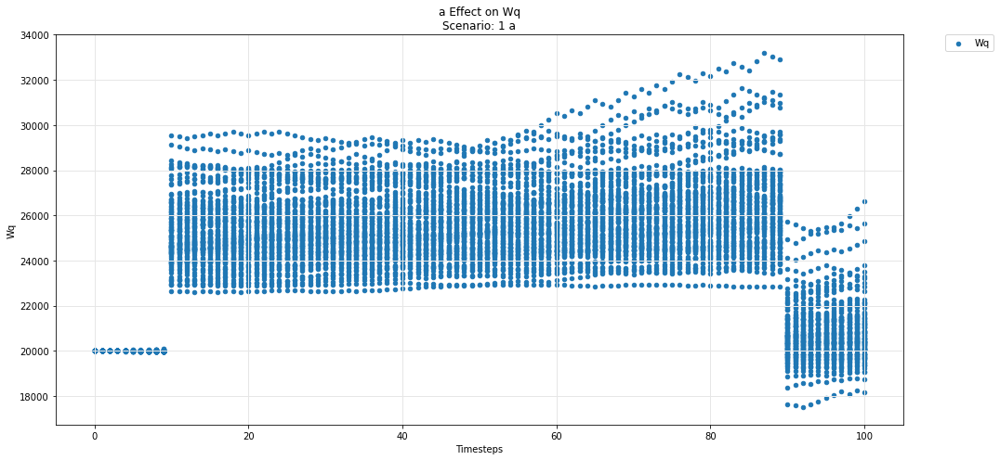

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

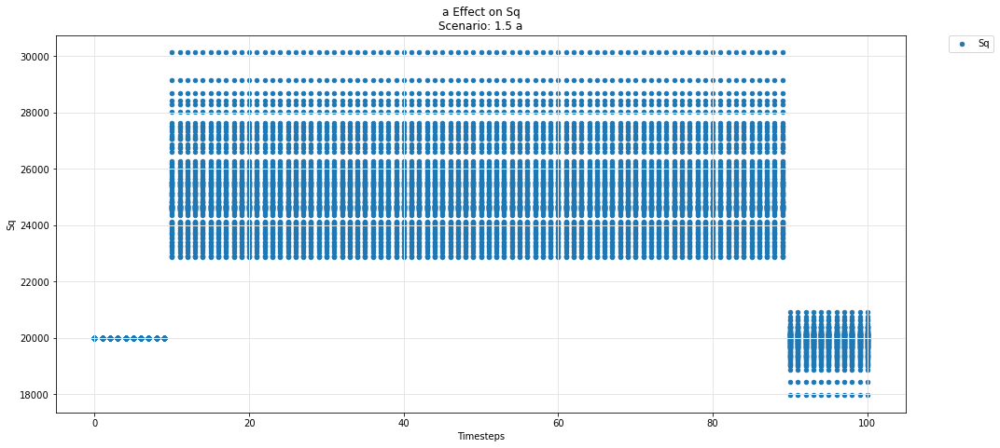

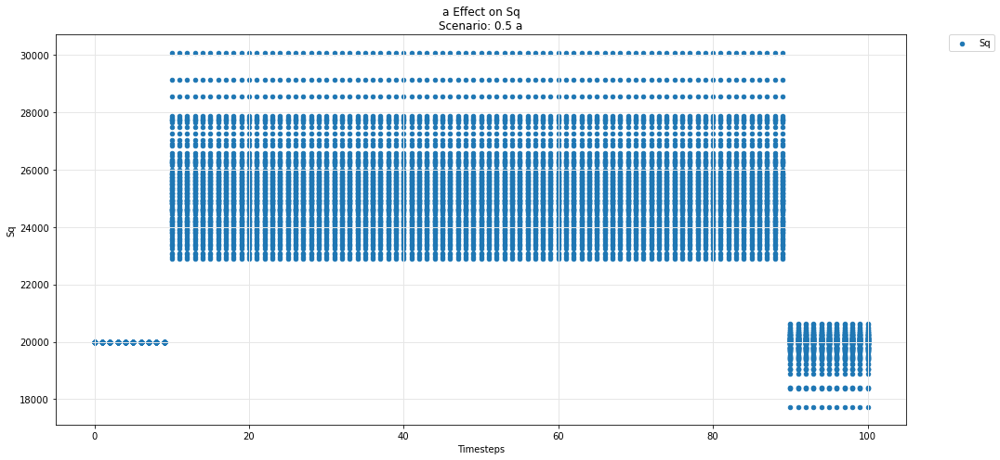

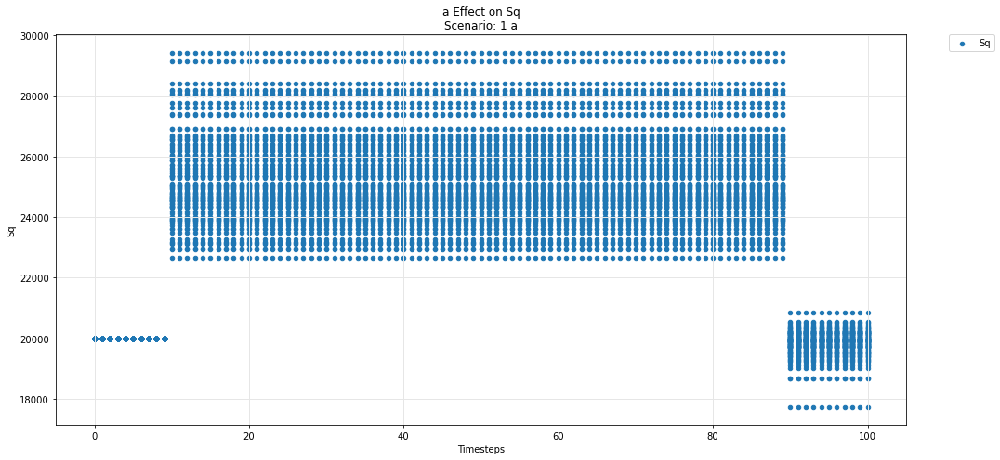

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

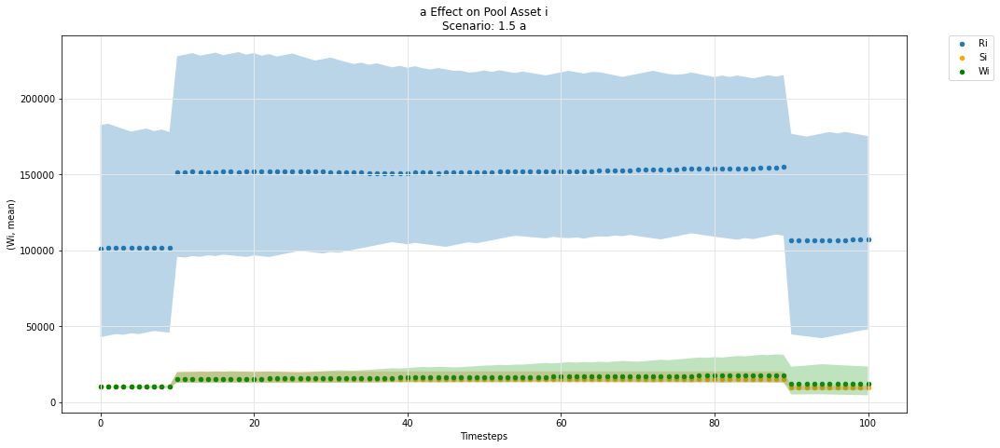

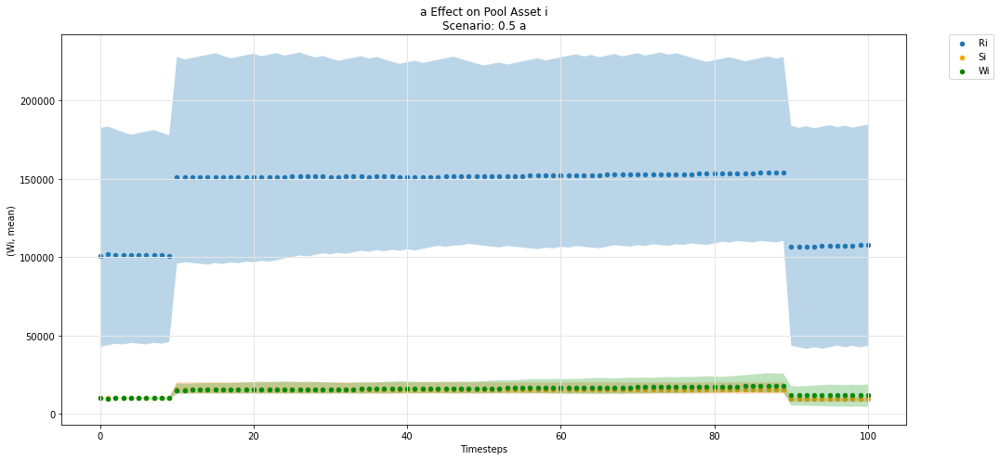

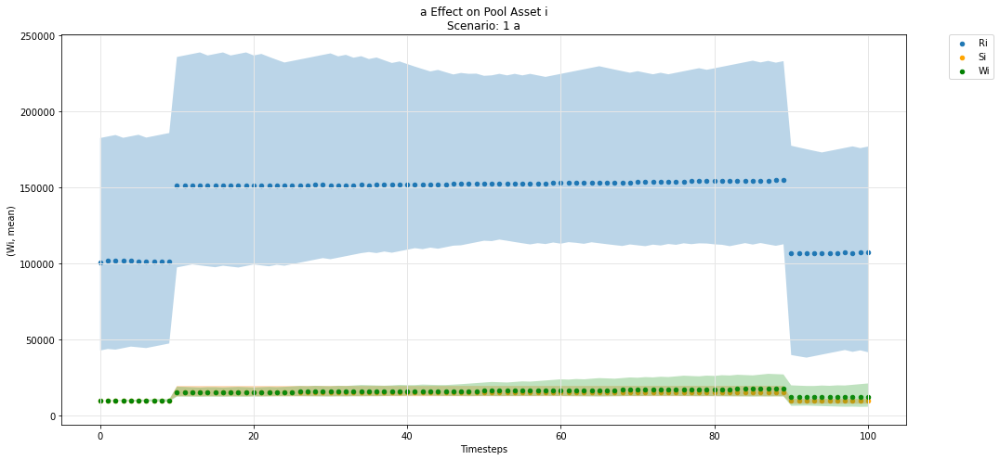

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

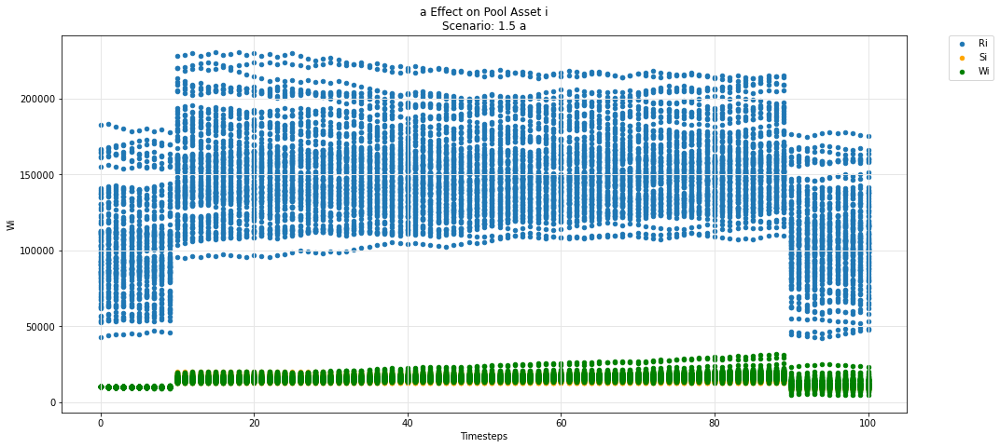

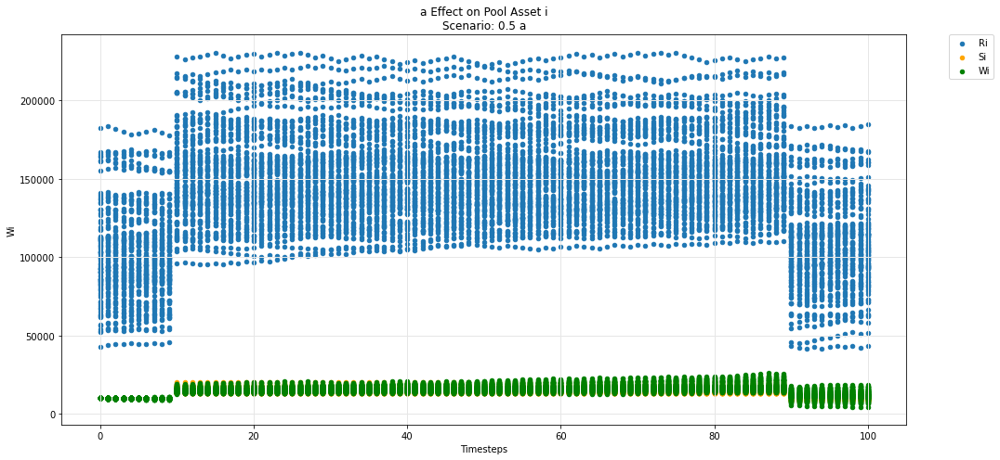

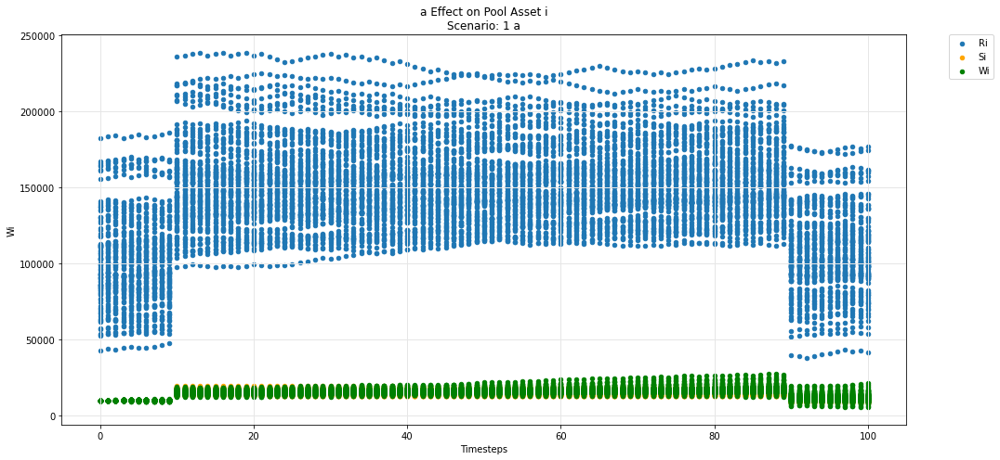

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

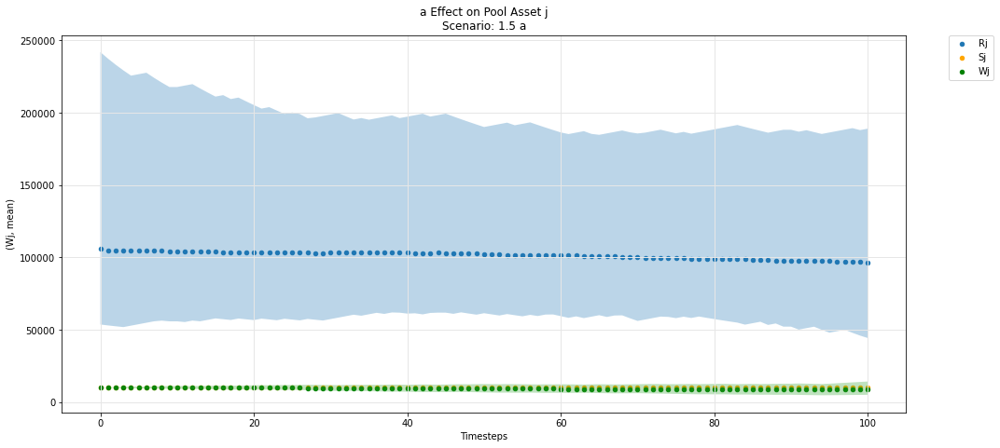

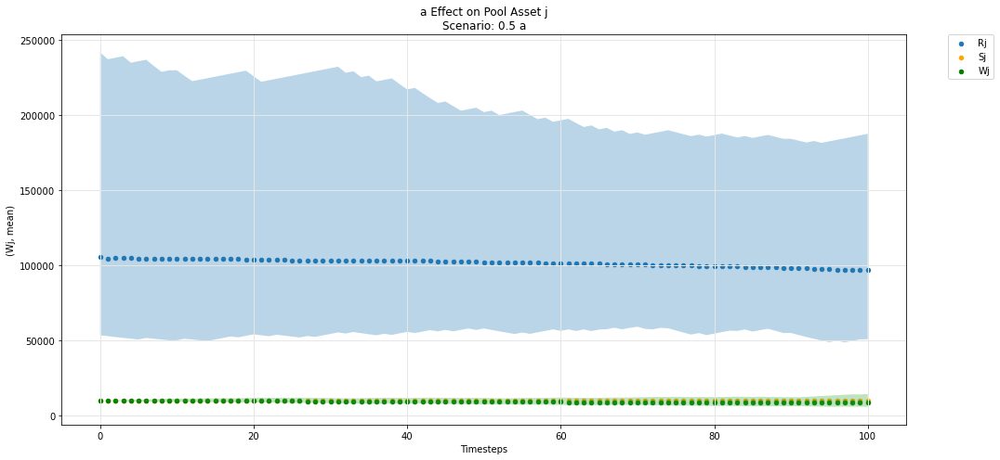

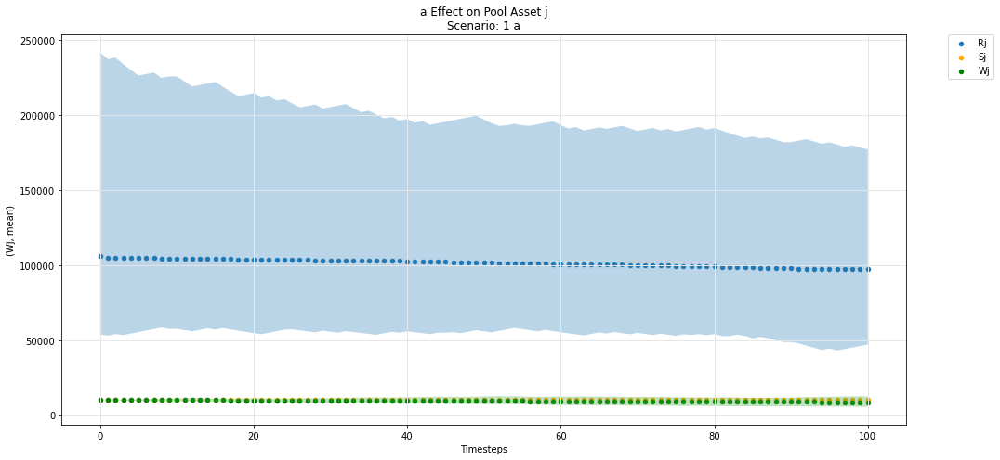

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

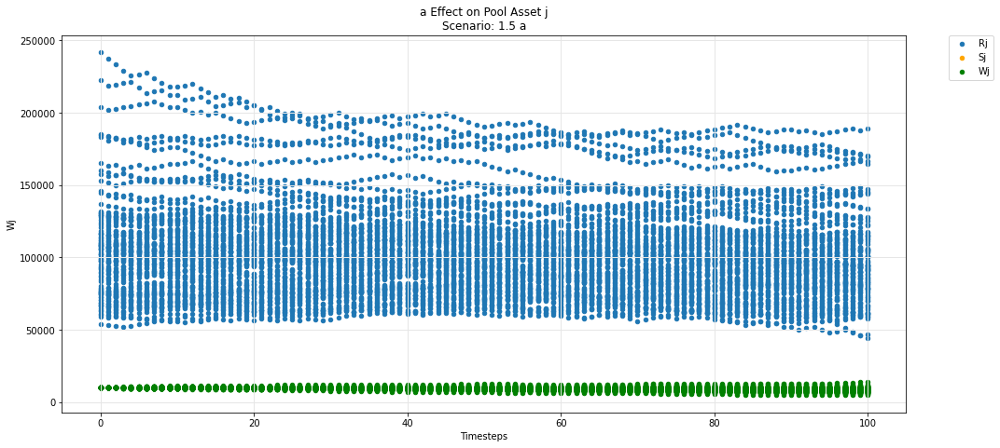

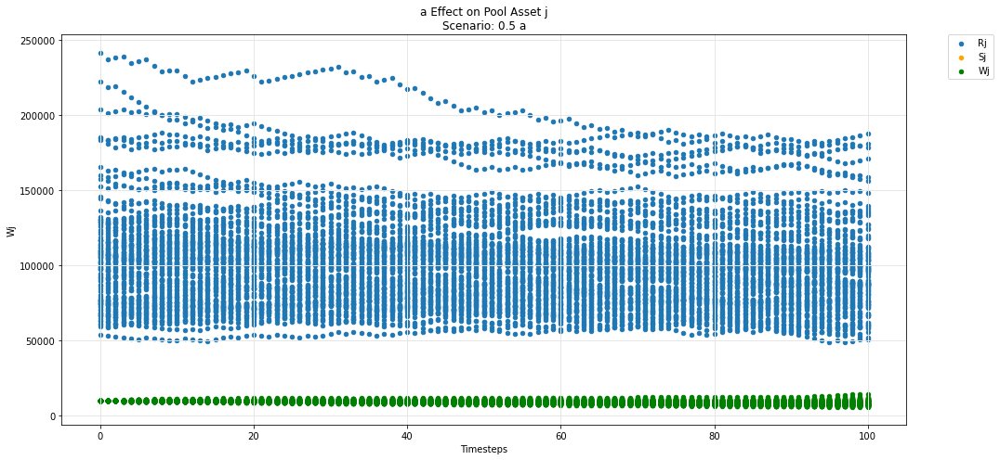

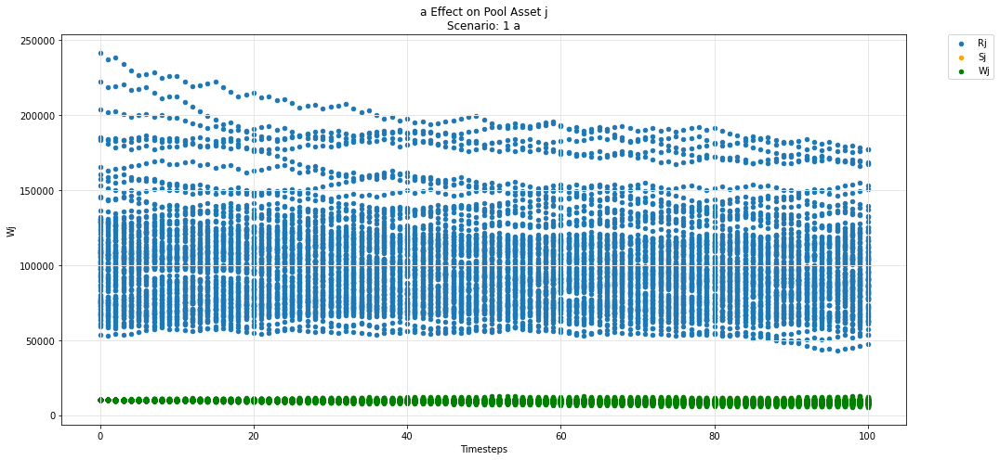

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

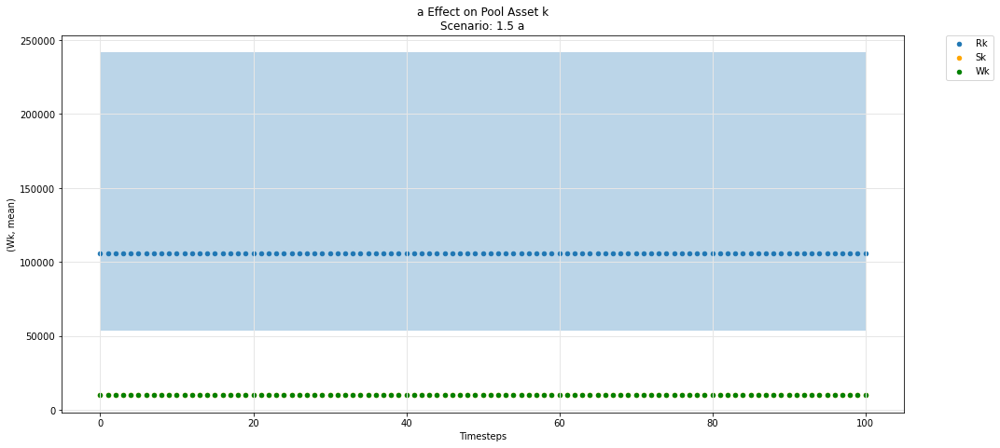

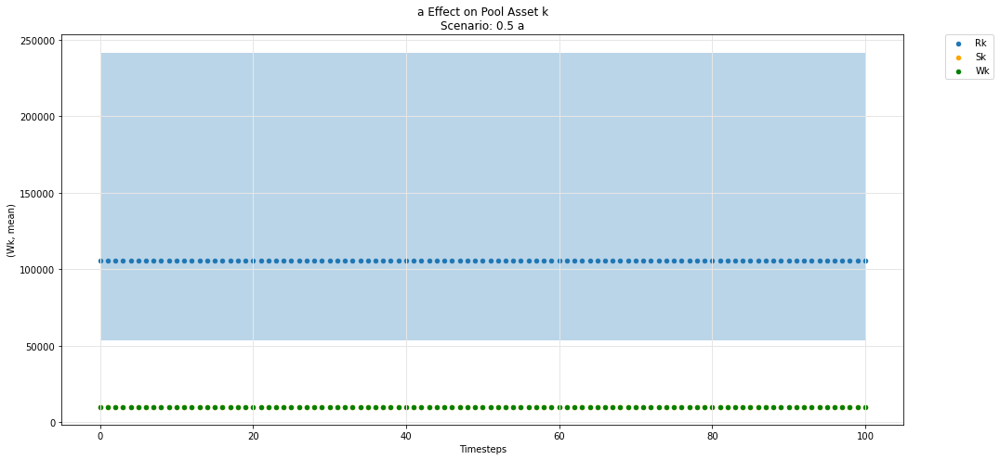

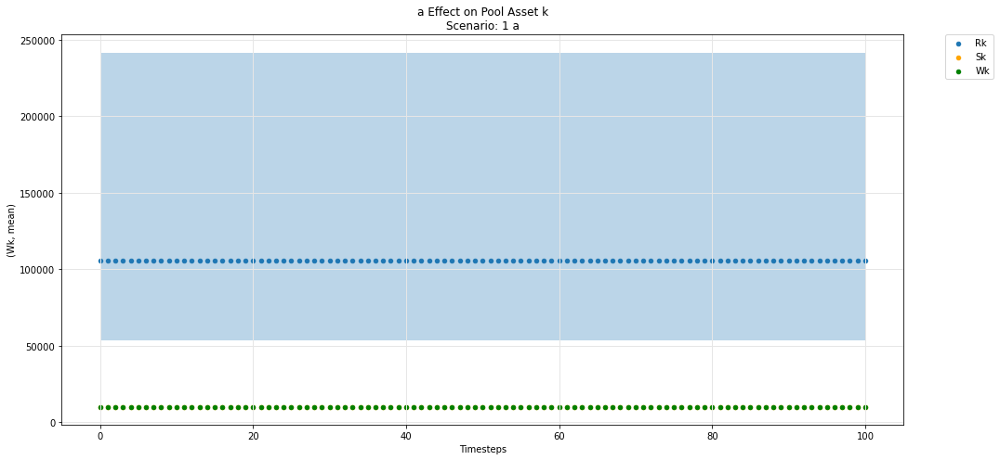

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

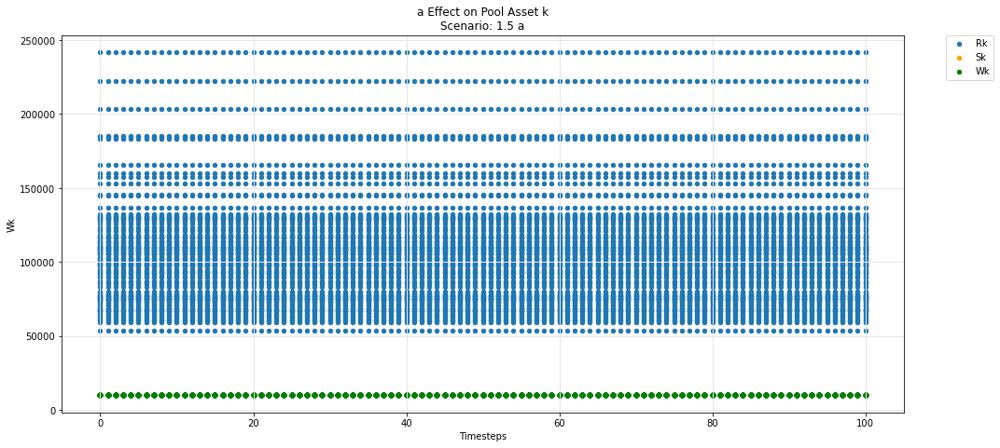

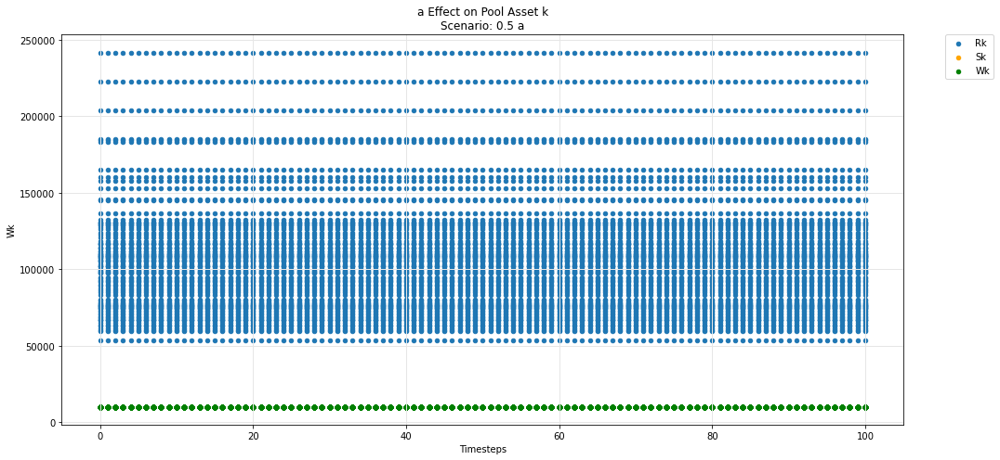

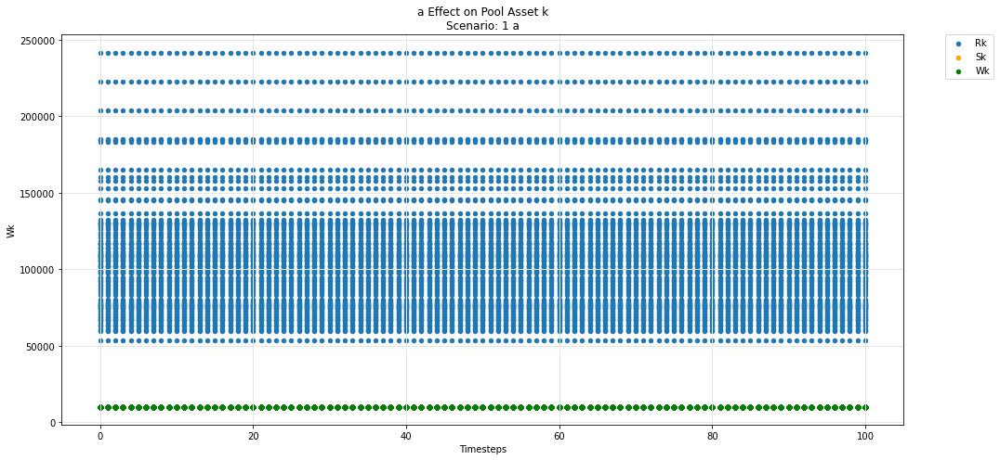

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

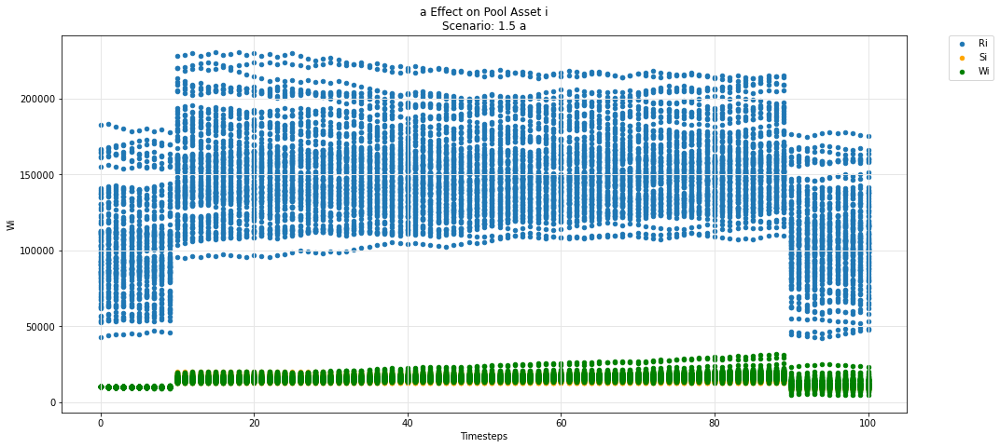

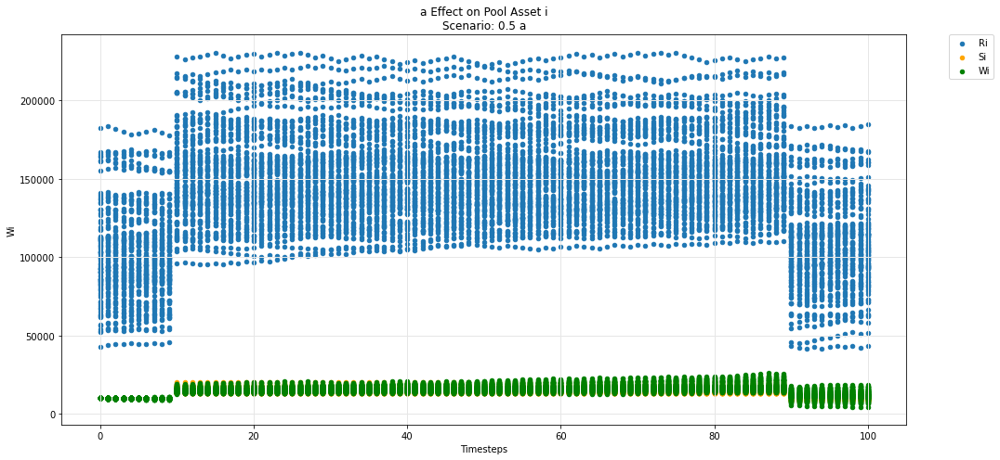

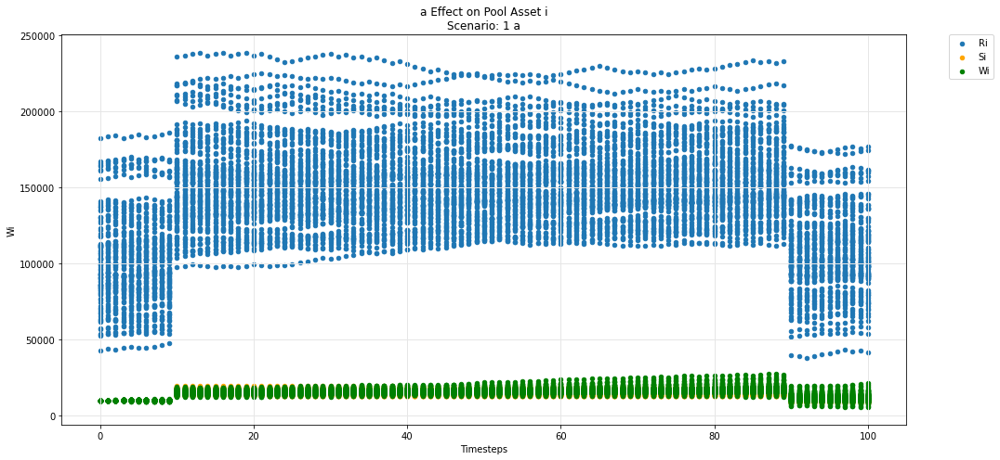

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

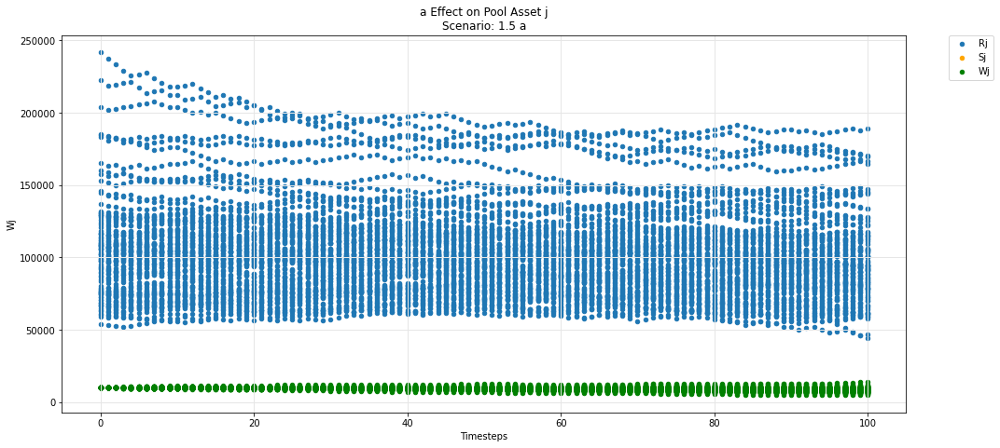

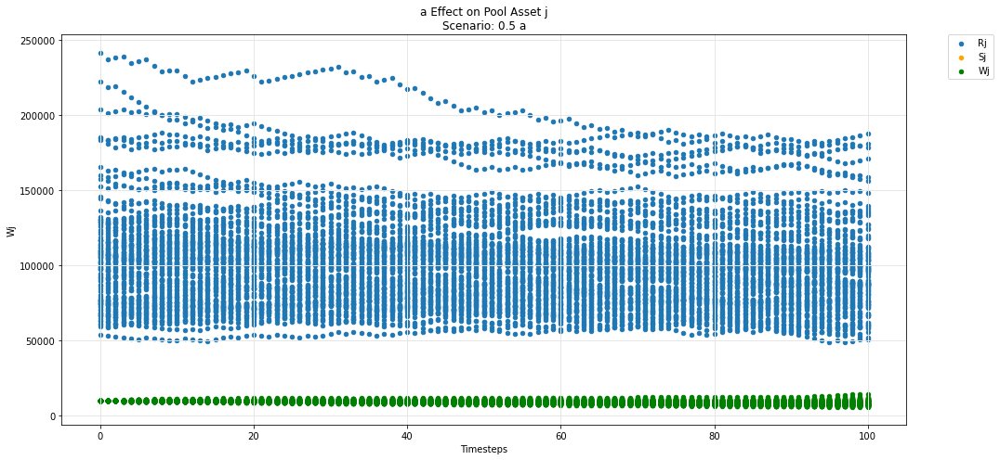

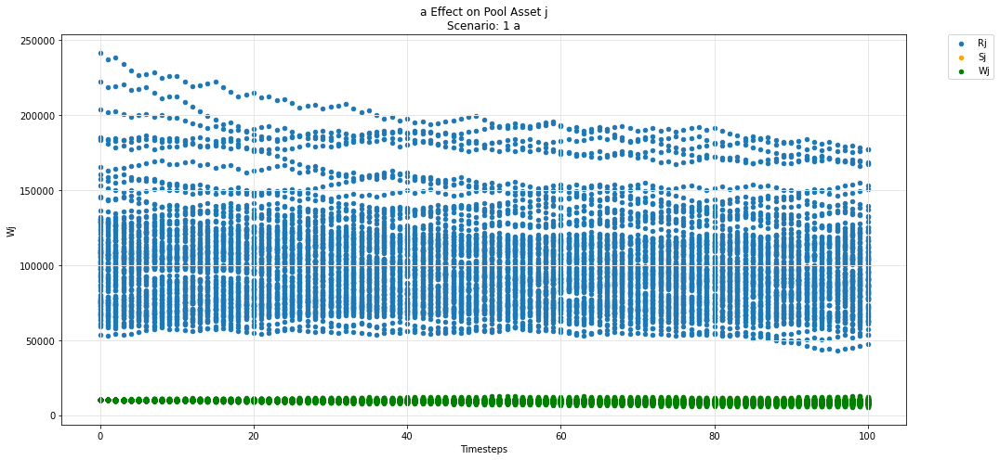

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

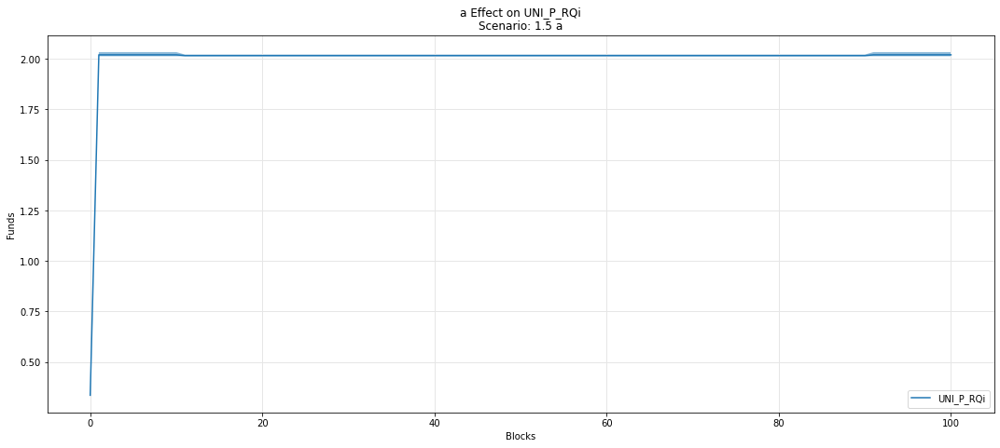

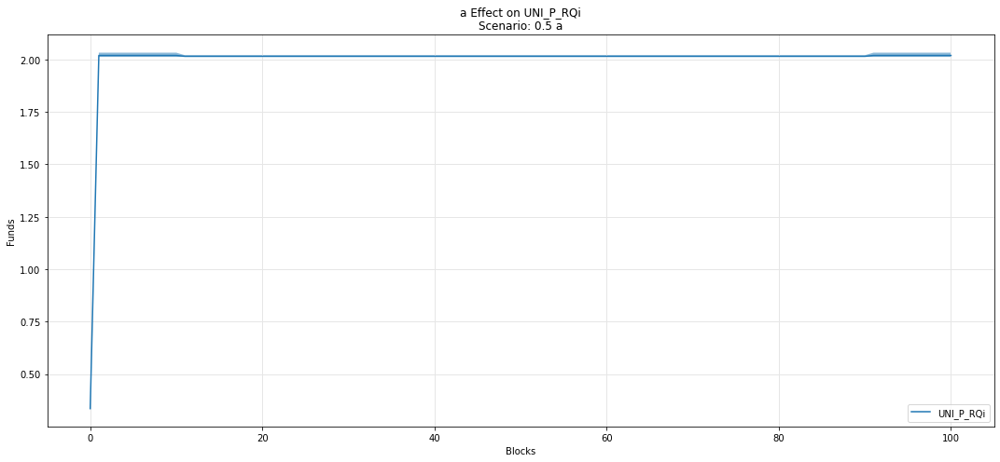

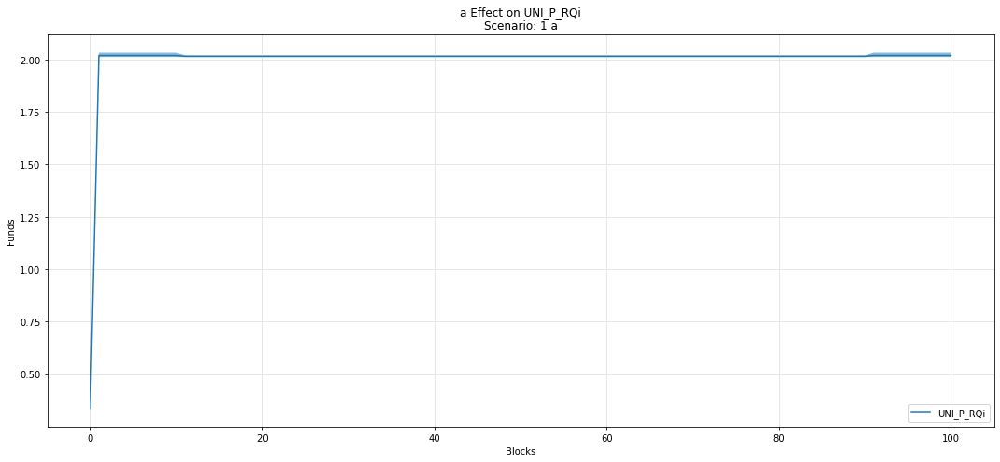

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

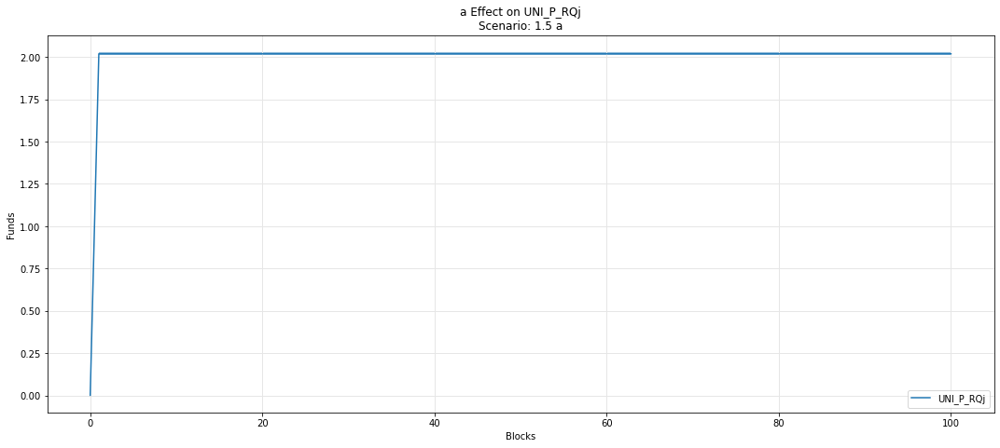

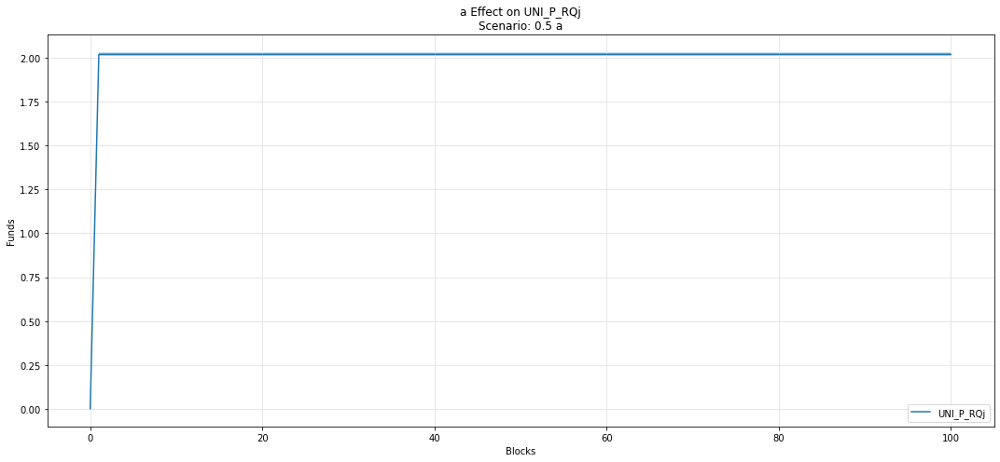

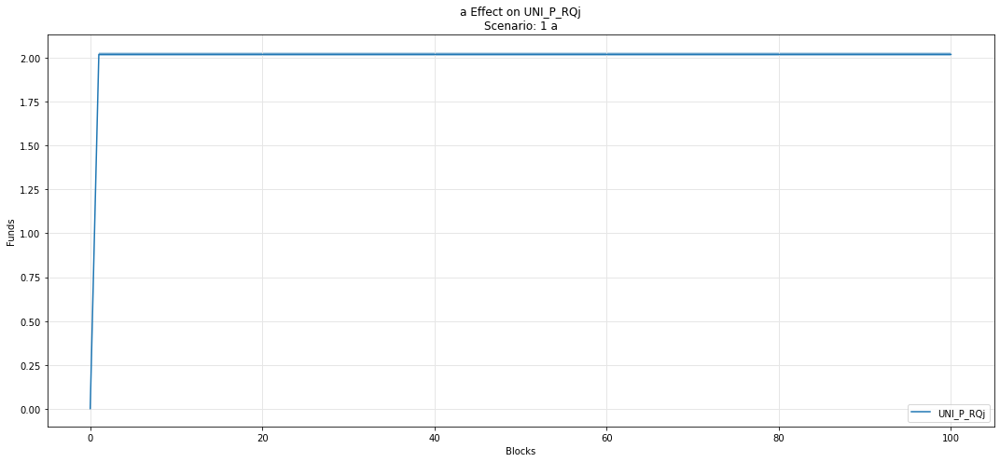

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

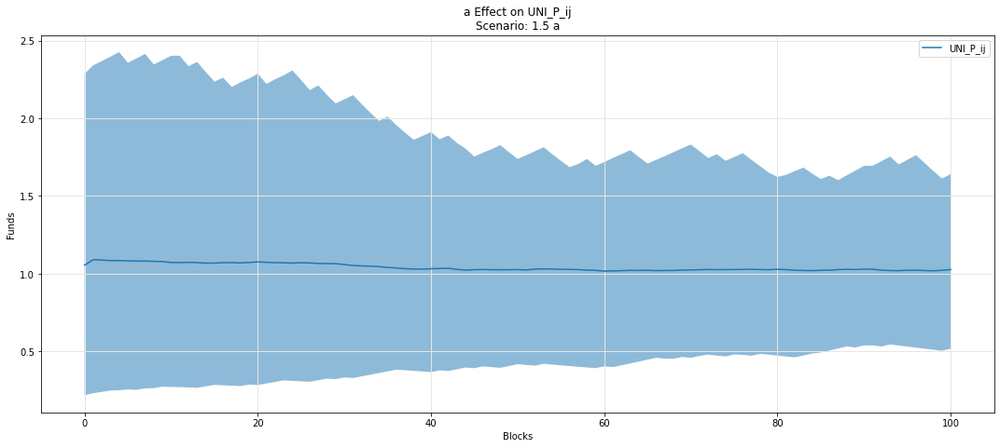

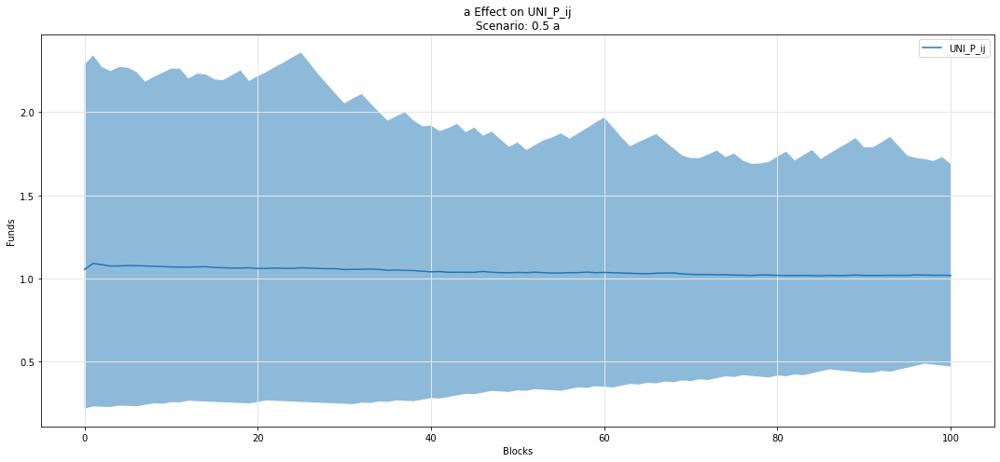

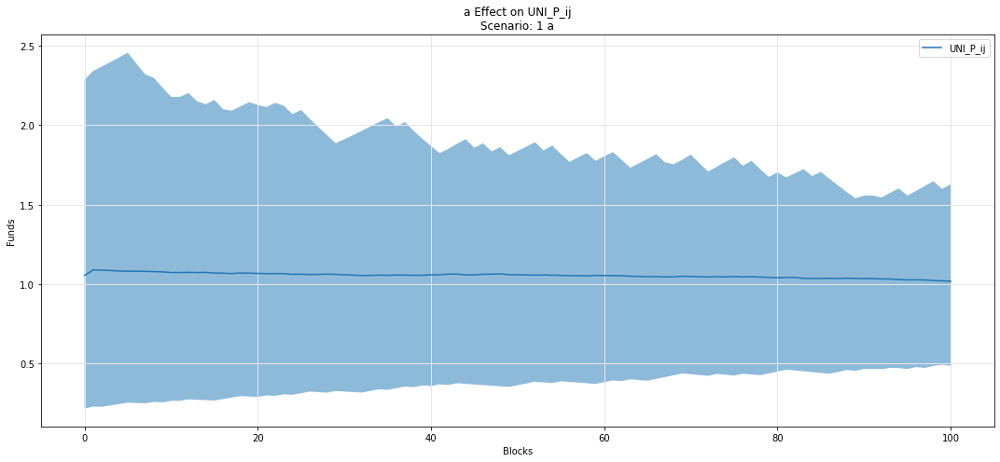

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

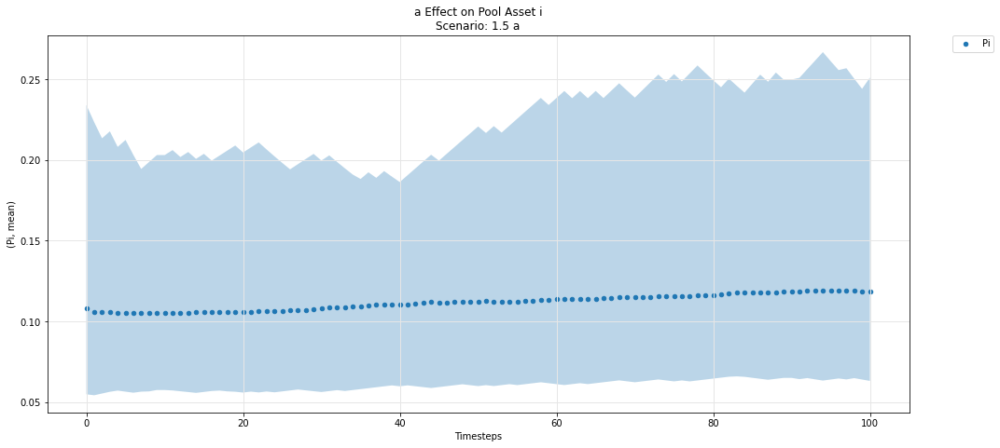

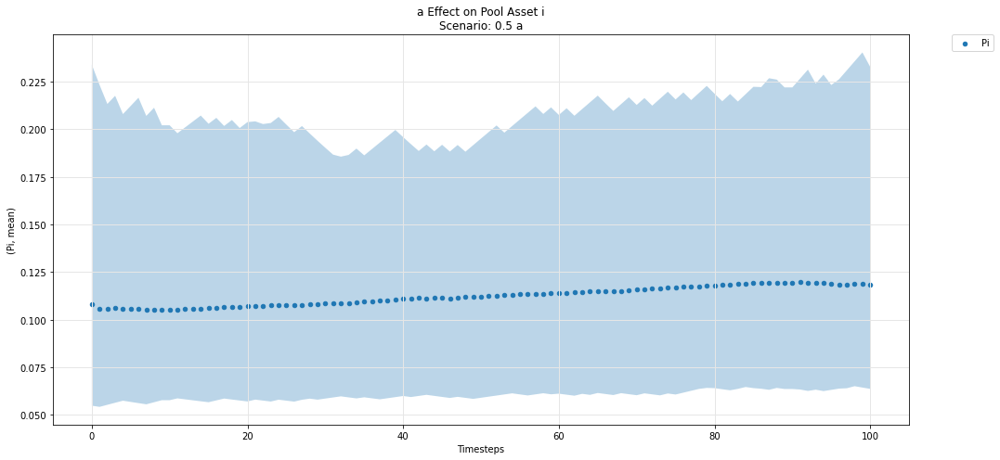

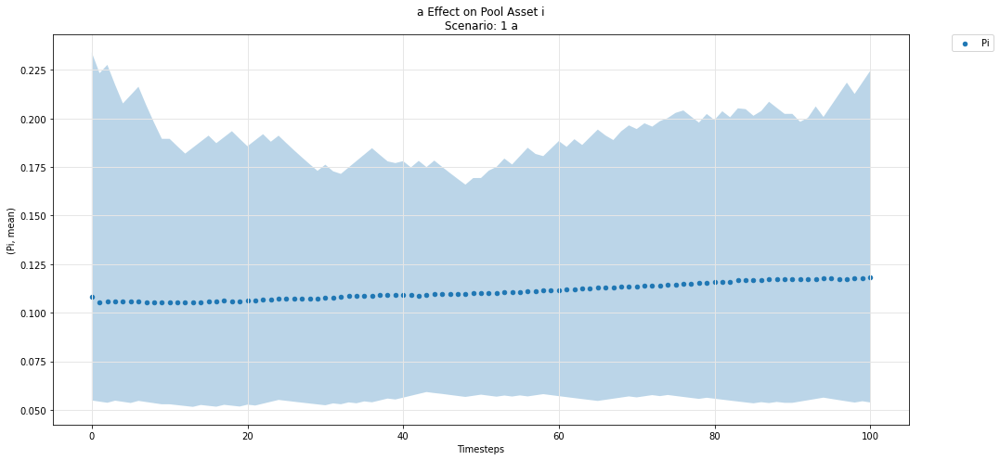

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

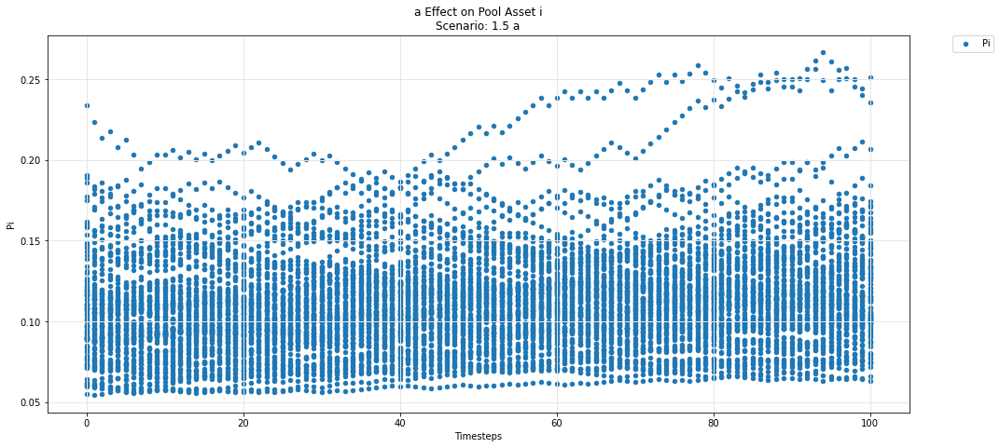

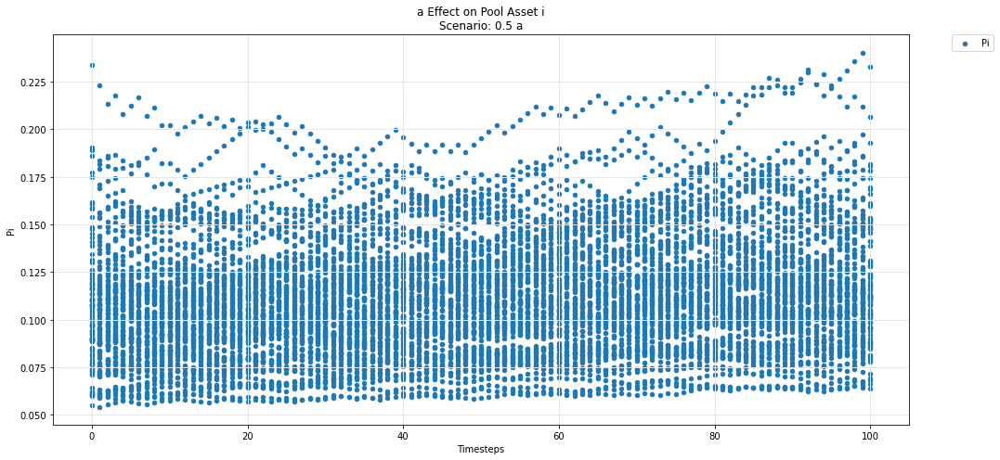

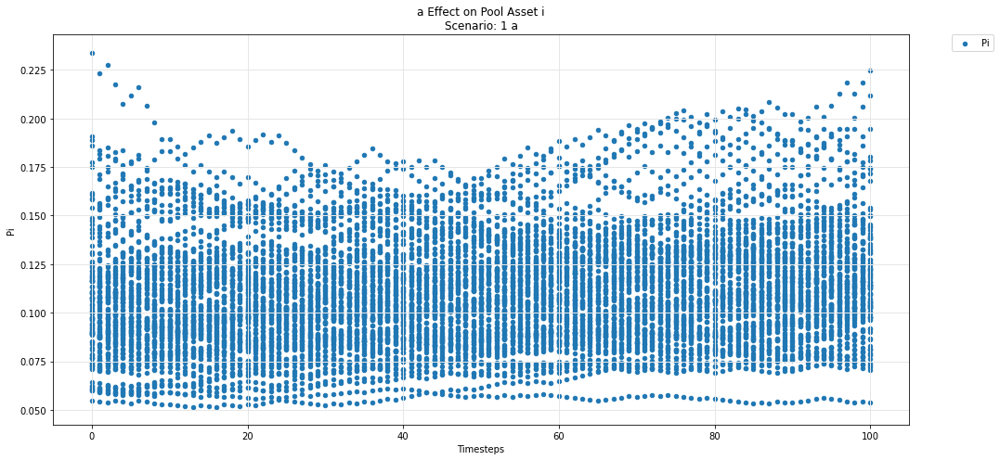

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

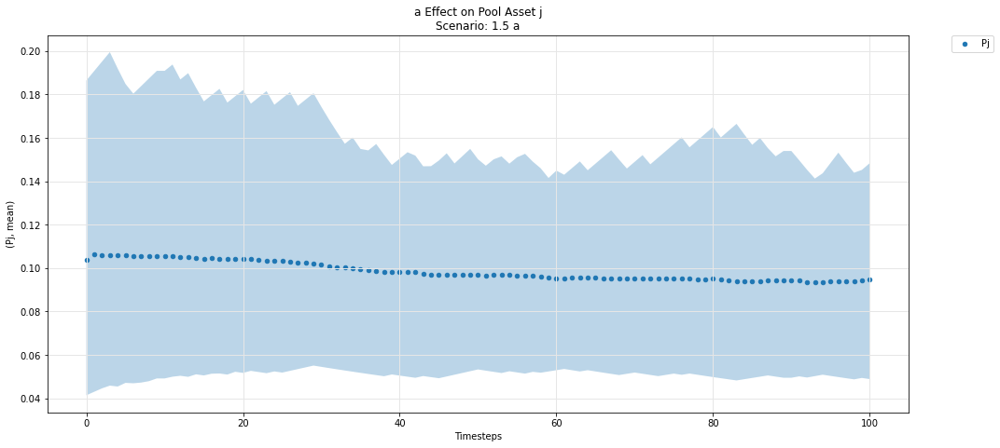

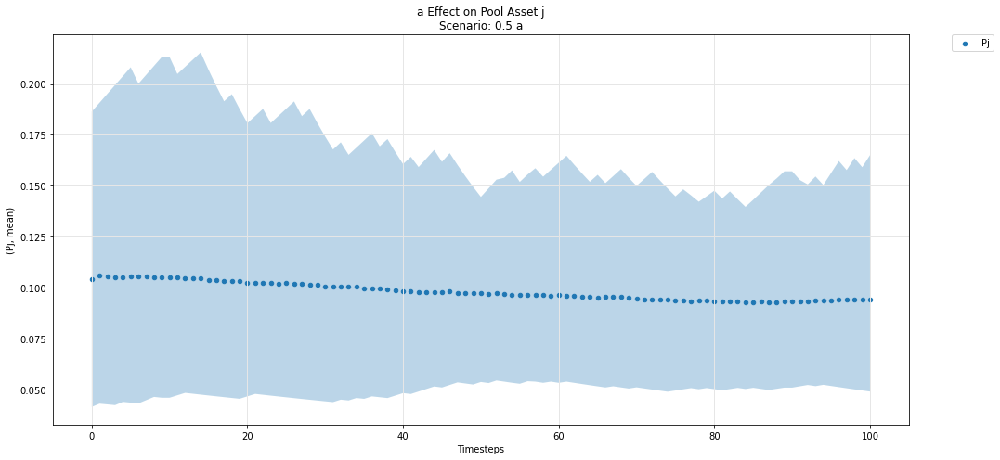

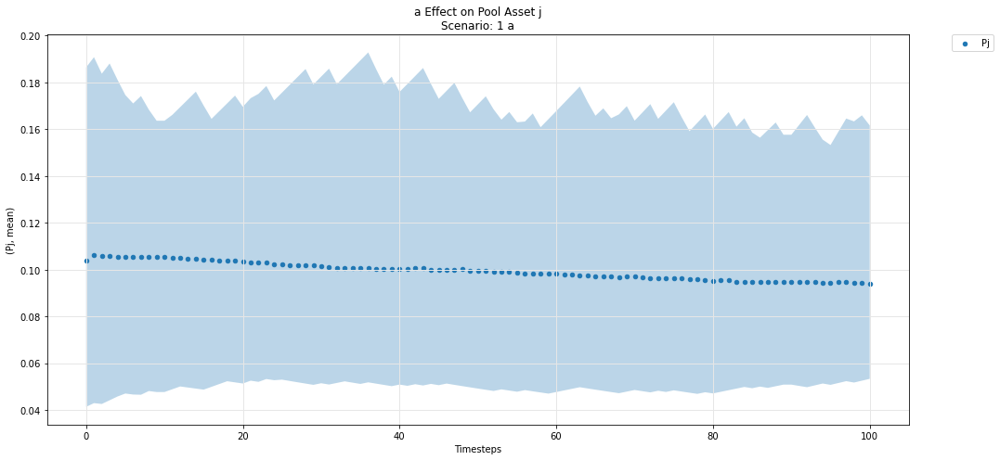

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

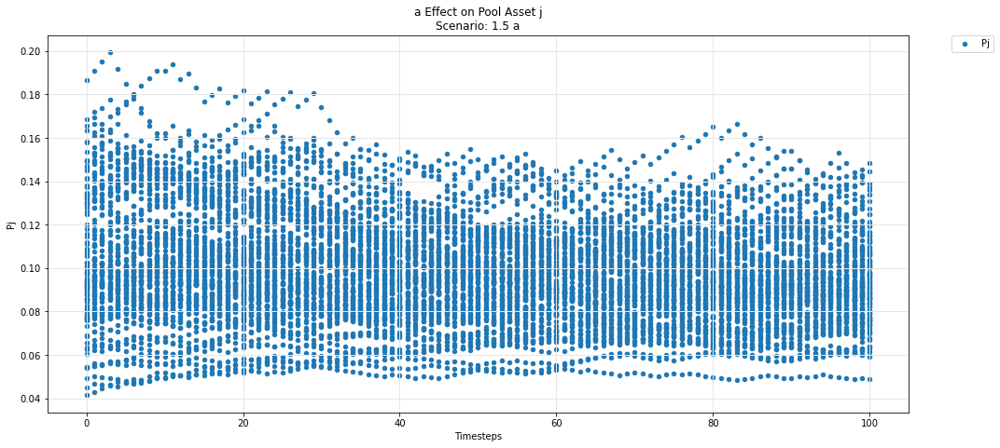

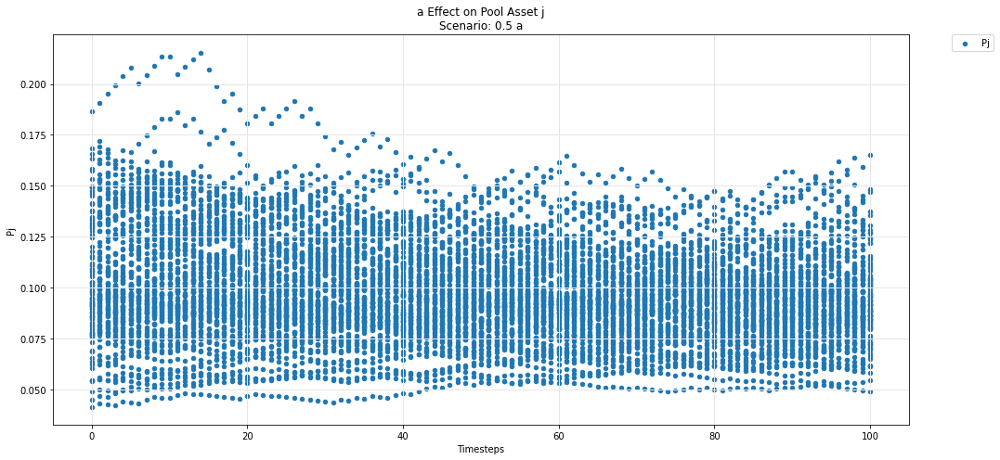

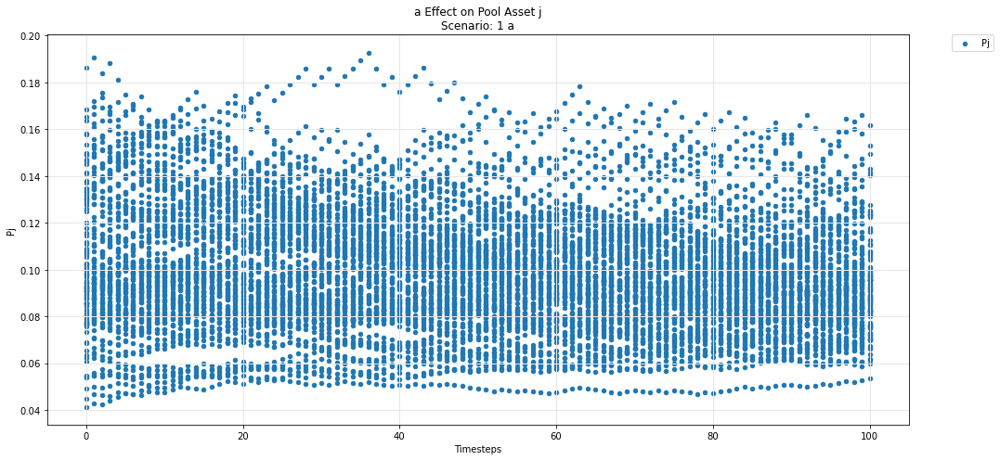

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

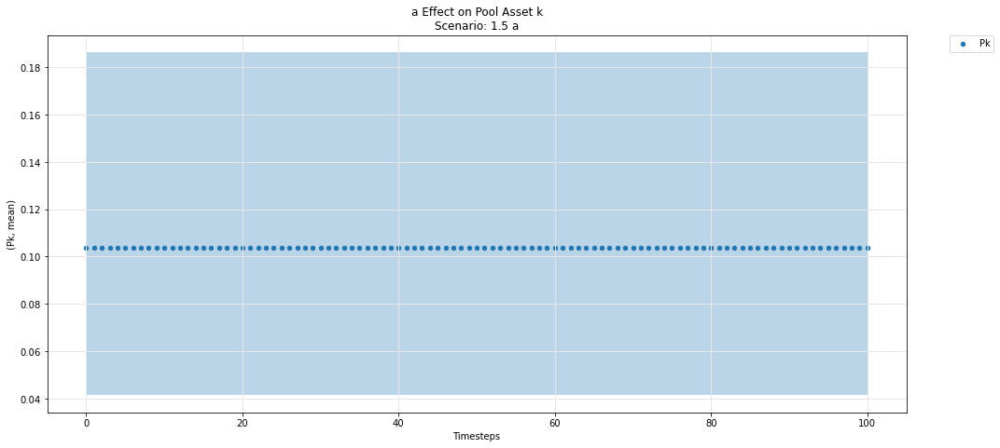

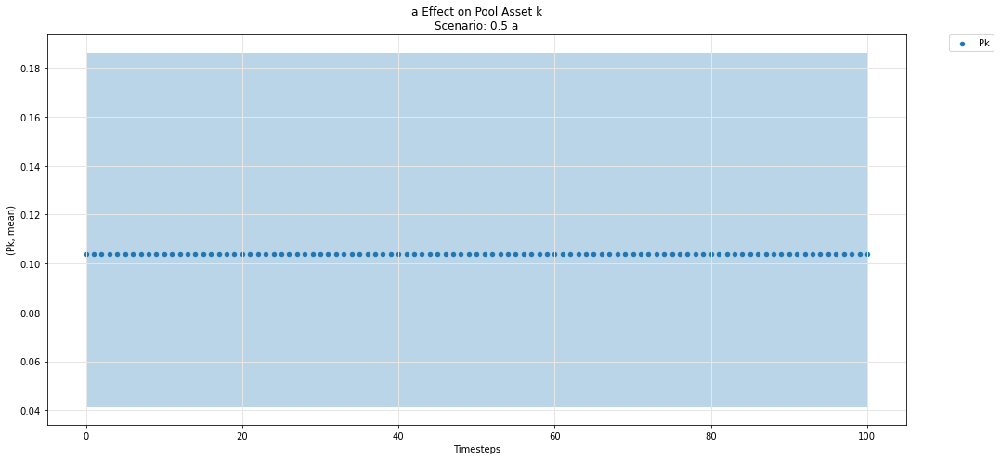

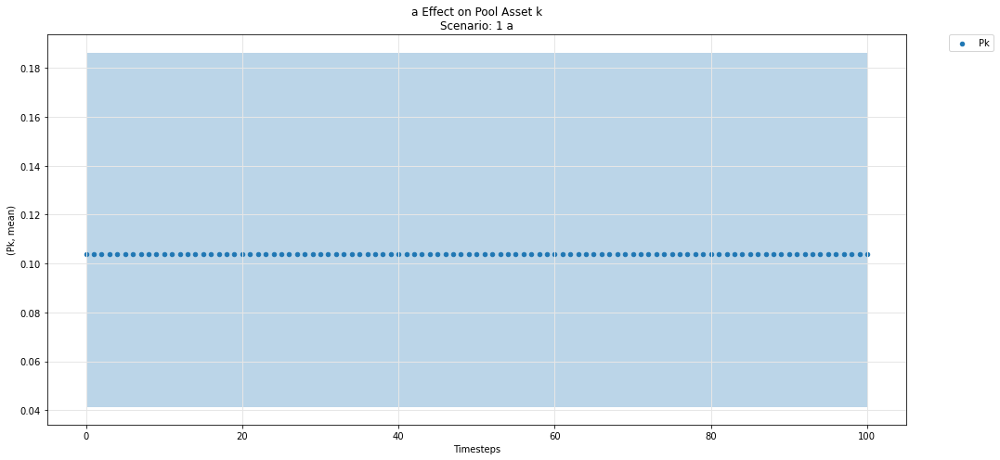

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

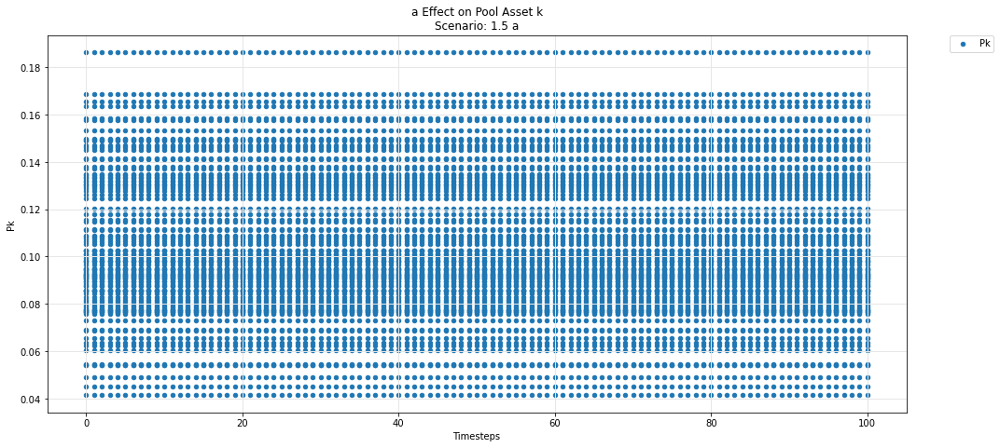

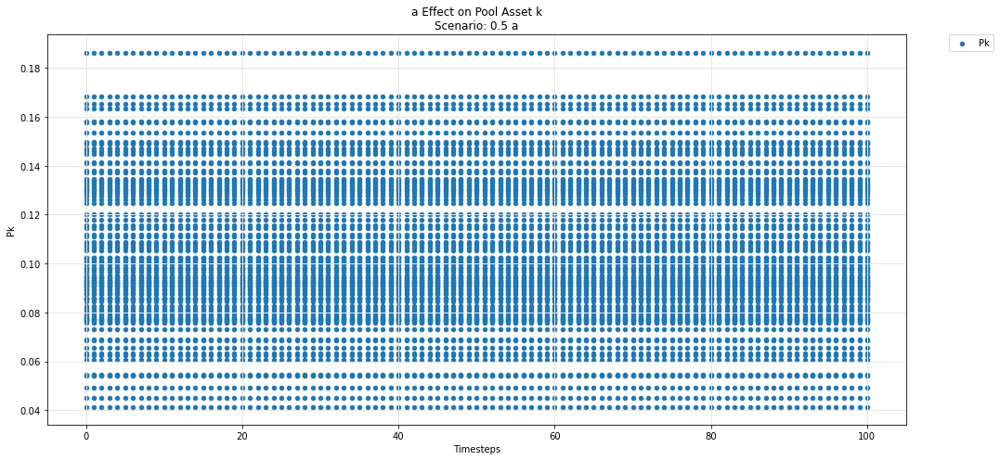

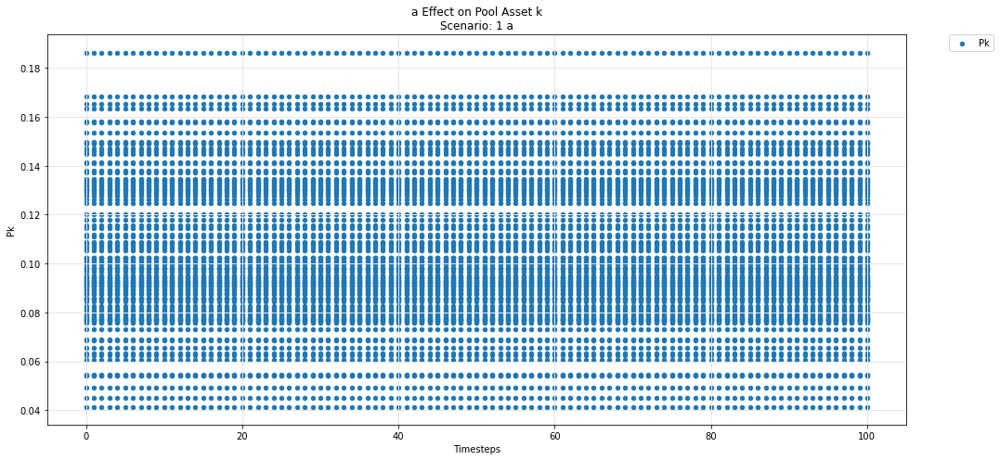

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')